## Importing the relevant libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings, joblib, gc, re, time
warnings.filterwarnings('ignore')
from scipy.stats import probplot
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor, BaggingRegressor, VotingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, BayesianRidge, HuberRegressor, PassiveAggressiveRegressor, SGDRegressor, PoissonRegressor, RANSACRegressor, TheilSenRegressor, GammaRegressor, ARDRegression, TweedieRegressor
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from ngboost import NGBRegressor
from sklearn.neural_network import MLPRegressor
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.preprocessing import StandardScaler, FunctionTransformer, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression, SelectPercentile, SelectFromModel, RFE, SequentialFeatureSelector
from mlxtend.plotting import plot_decision_regions
from feature_engine.outliers import Winsorizer
from sklearn.pipeline import Pipeline
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, DropCorrelatedFeatures 
from sklearn.impute import SimpleImputer
from yellowbrick.regressor import PredictionError, ResidualsPlot

## Loading the dataset

In [2]:
df = pd.read_excel('Superstore.xlsx')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2013-138688,2013-06-13,2013-06-17,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


## Data Exploration

In [3]:
df.shape

(9994, 21)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   datetime64[ns]
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

In [5]:
df.drop('Row ID', axis=1, inplace=True)

In [6]:
df.nunique() / len(df)

Order ID         0.501201
Order Date       0.123874
Ship Date        0.133480
Ship Mode        0.000400
Customer ID      0.079348
Customer Name    0.079348
Segment          0.000300
Country          0.000100
City             0.053132
State            0.004903
Postal Code      0.063138
Region           0.000400
Product ID       0.186312
Category         0.000300
Sub-Category     0.001701
Product Name     0.184211
Sales            0.614769
Quantity         0.001401
Discount         0.001201
Profit           0.754953
dtype: float64

In [7]:
df.isna().sum()

Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64

In [8]:
df.duplicated().sum()

1

In [9]:
df = df.drop_duplicates()
df.shape

(9993, 20)

In [10]:
df.drop(['Order ID','Customer ID','Customer Name','Product ID'],axis=1,inplace=True)

## Exploratory Data Analysis

### Univariate Analysis

Skewness of Postal Code: -0.12862858810335934
Kurtosis of Postal Code: -1.4931118549547797


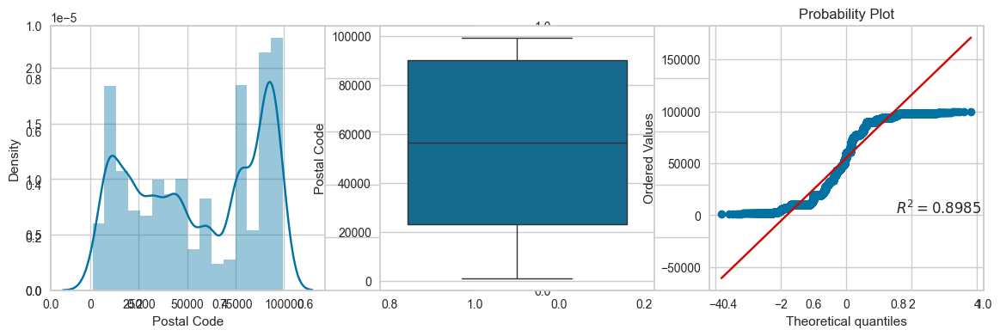

Skewness of Sales: 12.972141558363262
Kurtosis of Sales: 305.28176970634985


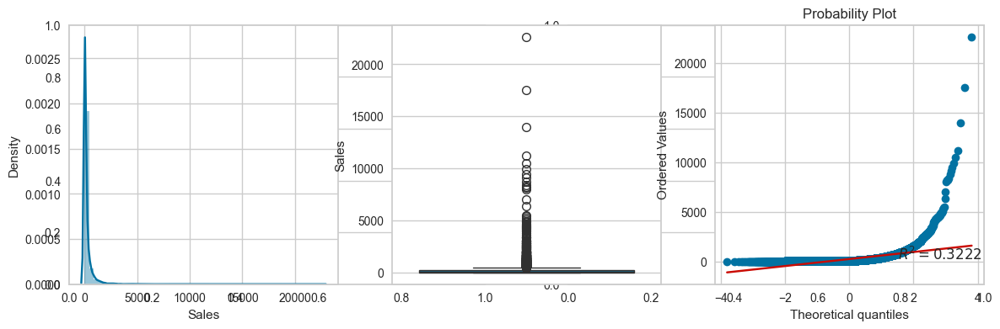

Skewness of Quantity: 1.2784155399852233
Kurtosis of Quantity: 1.9915827160047757


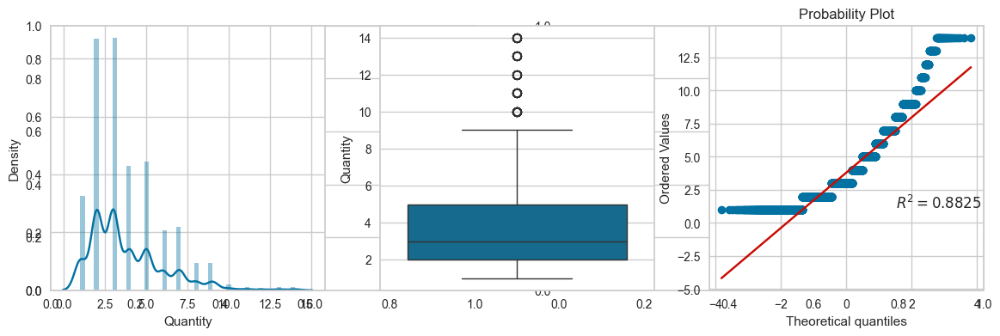

Skewness of Discount: 1.6845084876700462
Kurtosis of Discount: 2.409976524801519


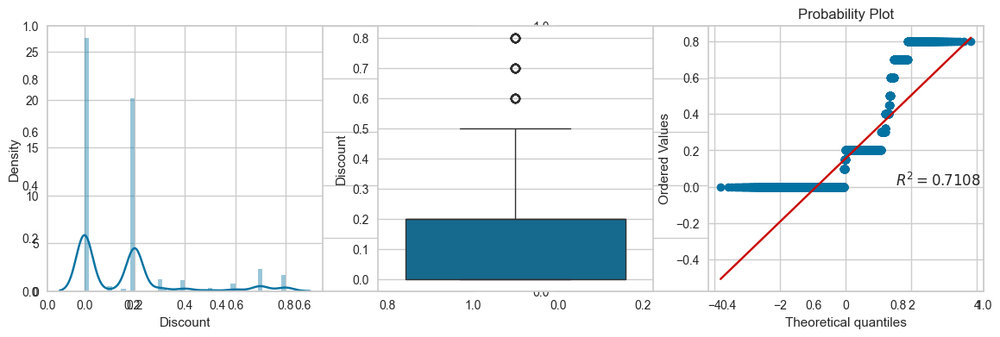

Skewness of Profit: 7.561035996041436
Kurtosis of Profit: 397.15038474389223


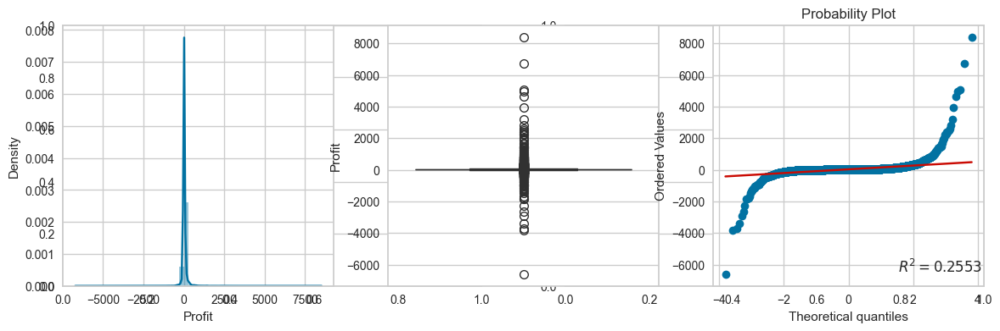

In [11]:
for col in df.select_dtypes(np.number).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [12]:
skewed_cols = ['Quantity','Discount','Profit']

In [13]:
df['Country'].value_counts()

Country
United States    9993
Name: count, dtype: int64

In [14]:
df.drop('Country', axis=1, inplace=True)

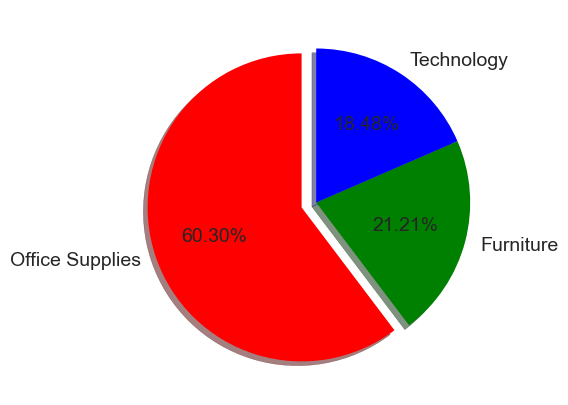

In [15]:
plt.figure(figsize=(10,5))
labels = df['Category'].value_counts().keys()
values = df['Category'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0,0],startangle=90,textprops={'fontsize': 14},colors=['red','green','blue'])
plt.show()

Majority of the products are in Office Supplies category whereas the least number of products are in Technology category.

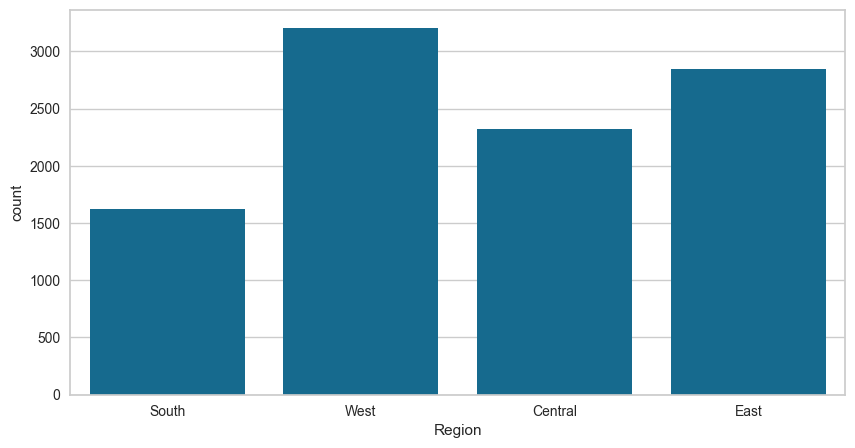

In [16]:
plt.figure(figsize=(10,5))
sns.countplot(x='Region',data=df)
plt.show()

A significant number of customers belong to the Western region while the Southern region has the least number of customers.

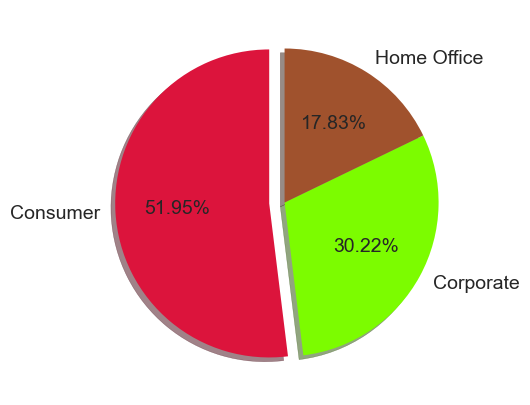

In [17]:
plt.figure(figsize=(10,5))
labels = df['Segment'].value_counts().keys()
values = df['Segment'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna'])
plt.show()

More than half of the entire population belongs to the Consumer segment.

In [18]:
df['Ship Mode'].value_counts()

Ship Mode
Standard Class    5967
Second Class      1945
First Class       1538
Same Day           543
Name: count, dtype: int64

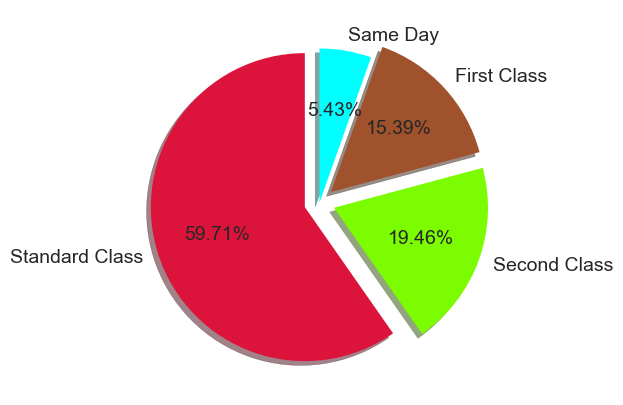

In [19]:
plt.figure(figsize=(10,5))
labels = df['Ship Mode'].value_counts().keys()
values = df['Ship Mode'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0.1,0.1,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna','cyan'])
plt.show()

A significant number of orders were delivered via the Standard shipping mode whereas First Class and Second Class shipping modes were less frequently used.

### Bivariate Analysis

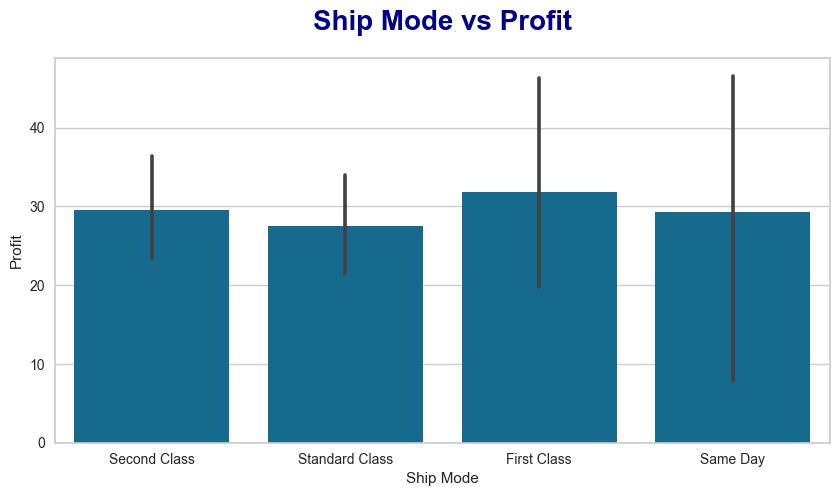

In [20]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Profit',data=df)
plt.title('Ship Mode vs Profit',pad=20,fontsize=20,color='darkblue',fontweight='bold')
plt.show()

The First Class was the most profitable shipping mode while the Standard shipping mode was the least profitable.

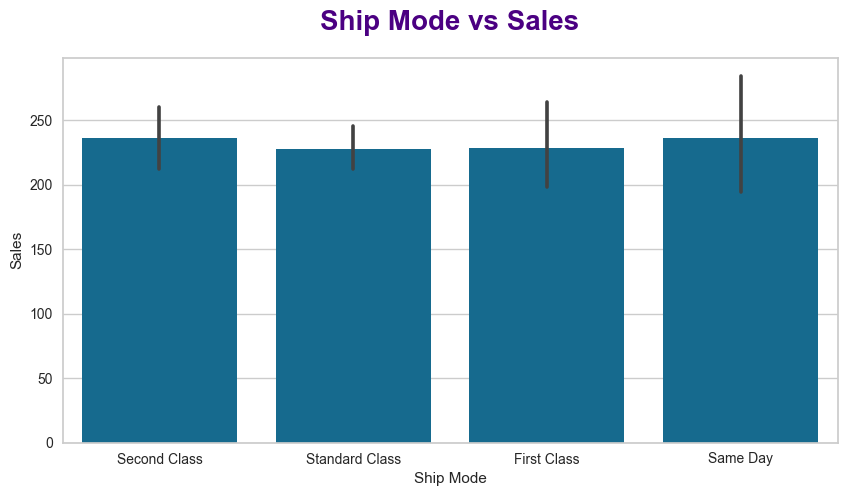

In [21]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Sales',data=df)
plt.title('Ship Mode vs Sales',pad=20,fontsize=20,fontweight='bold',color='indigo')
plt.show()

The shipping modes that generated the highest sales are Second Class and Same Day whereas Standard Class and First Class generated the least sales.

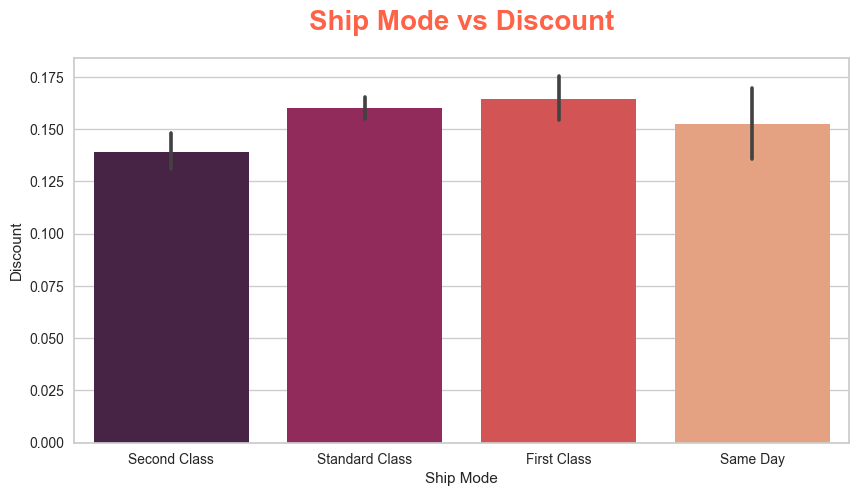

In [22]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Discount',data=df,palette='rocket')
plt.title('Ship Mode vs Discount',pad=20,fontsize=20,fontweight='bold',color='tomato')
plt.show()

The maximum discount was offered on products that were delivered via the First Class shipping mode whereas the minimum discount was given on products that were shipped via the Second Class.

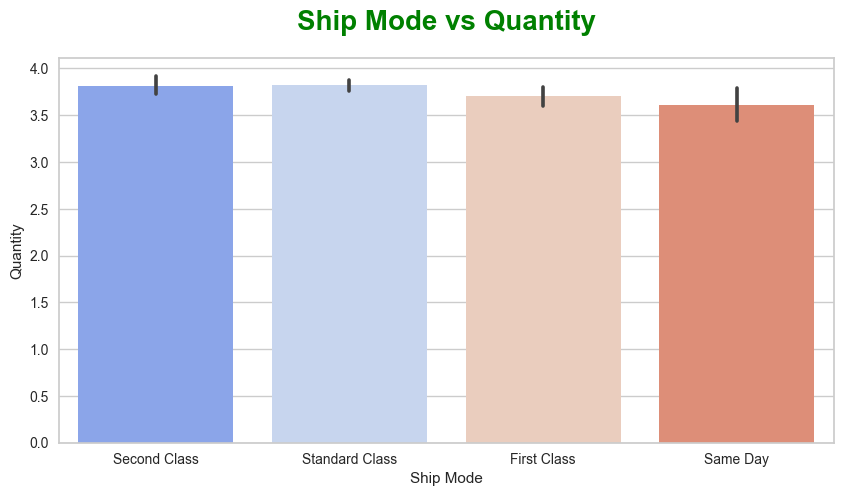

In [23]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Quantity',data=df,palette='coolwarm')
plt.title('Ship Mode vs Quantity',pad=20,fontsize=20,fontweight='bold',color='green')
plt.show()

The highest quantities of products were shipped via the Second Class and Standard Class shipping modes whereas the least quantities were shipped through the Same Day shipping mode.

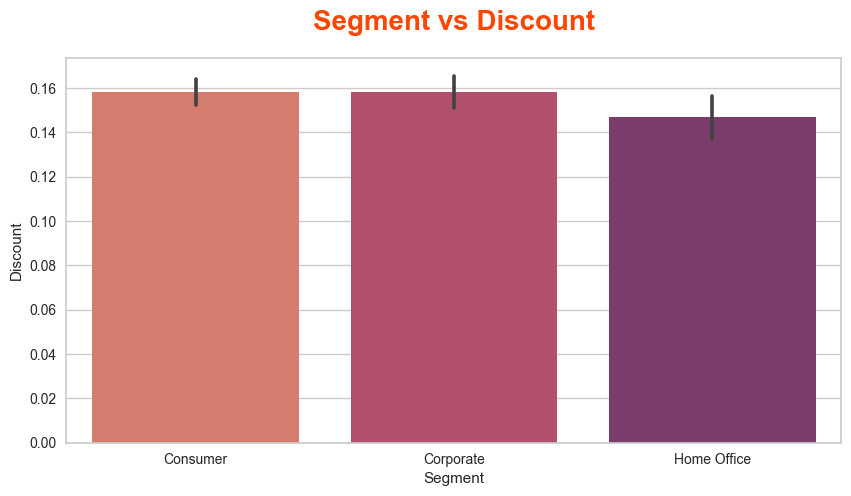

In [24]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Discount',data=df,palette='flare')
plt.title('Segment vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

The highest discount was given on the orders made by Consumer and Corporate segments whereas those made by Home Office provided the least discount.

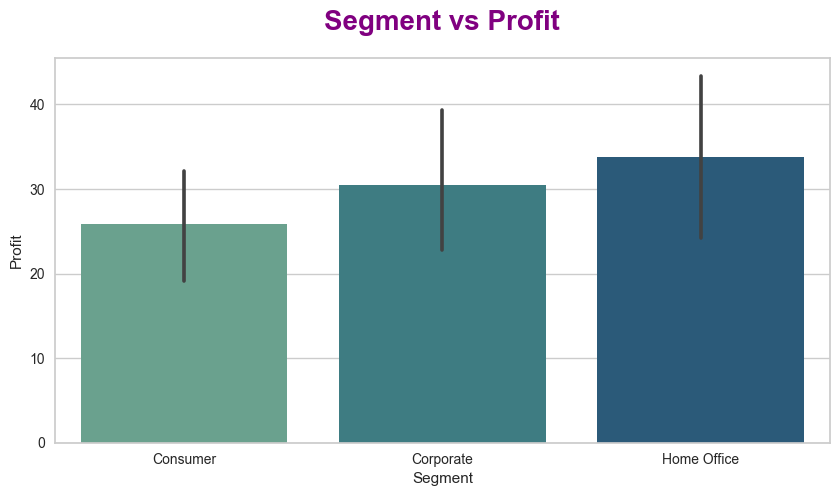

In [25]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Profit',data=df,palette='crest')
plt.title('Segment vs Profit',pad=20,fontsize=20,fontweight='bold',color='purple')
plt.show()

The orders made by Home Office segment generated the highest profit whereas those made by Consumer and Corporate segments generated the least profit.

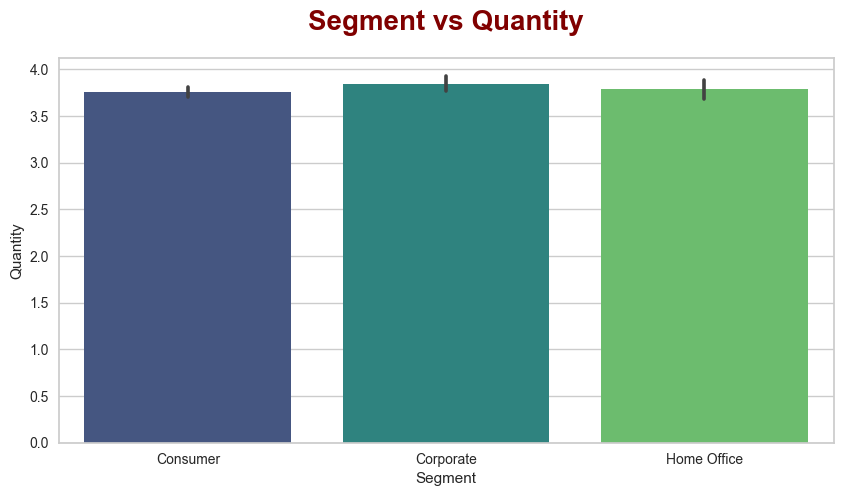

In [26]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Quantity',data=df,palette='viridis')
plt.title('Segment vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased by the Corporate segment whereas the lowest quantities were purchased by the Consumer segment.

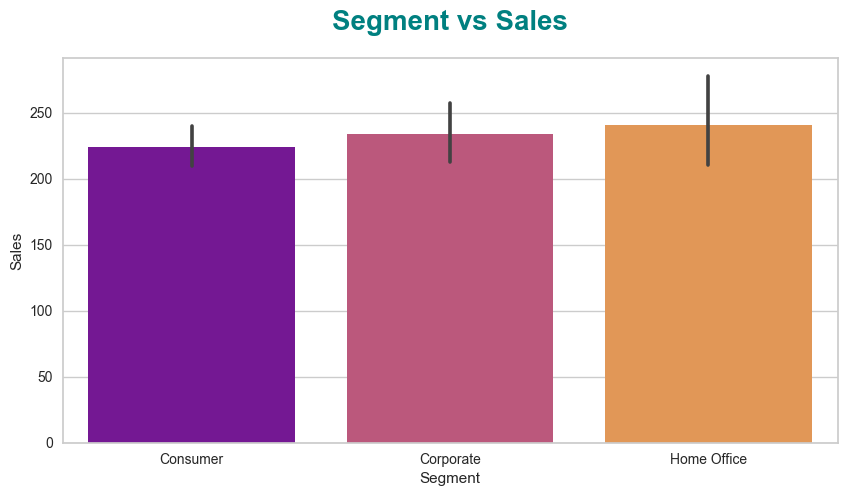

In [27]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Sales',data=df,palette='plasma')
plt.title('Segment vs Sales',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The orders made by the Home Office segment generated the maximum sales whereas those made by the Consumer segment generated the minimum sales.

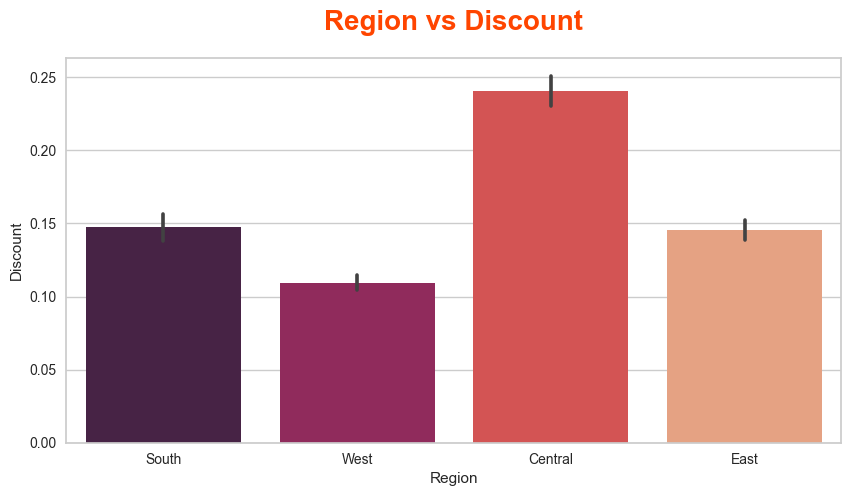

In [28]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Discount',data=df,palette='rocket')
plt.title('Region vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A substantial discount was offered on the orders made in the Central region whereas the least discount was given on those made in the Western region.

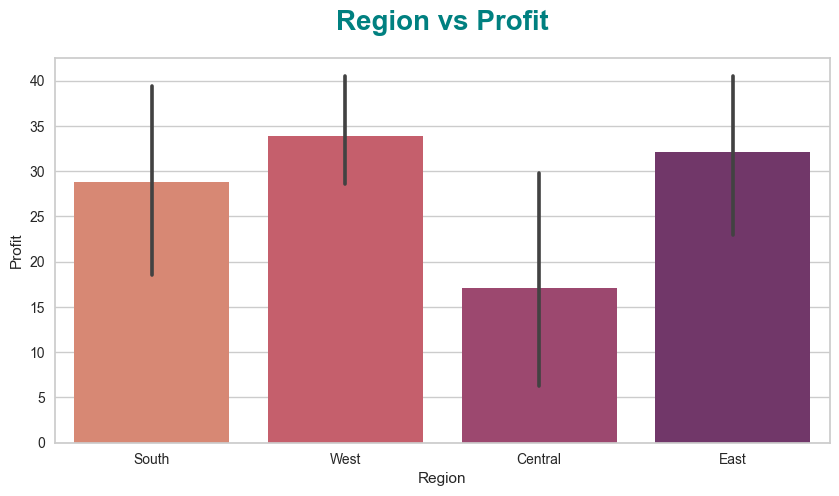

In [29]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Profit',data=df,palette='flare')
plt.title('Region vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The largest profit was recorded in the Western region while the lowest profit was obtained in the Central region.

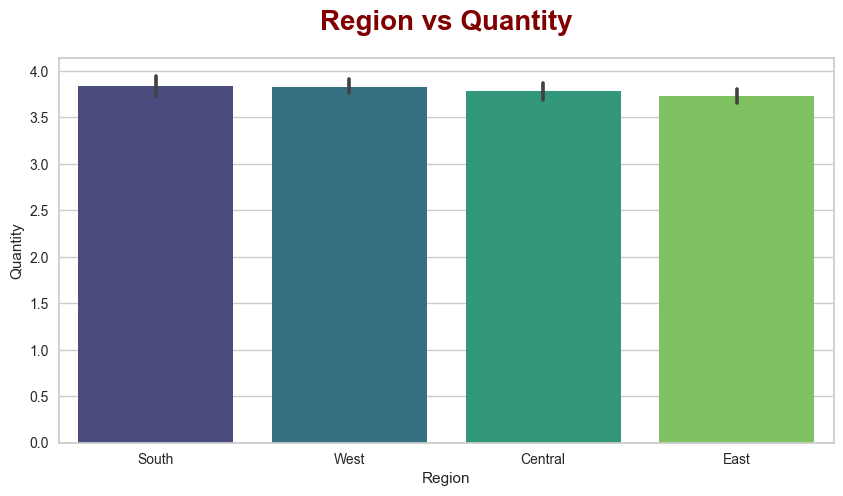

In [30]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Quantity',data=df,palette='viridis')
plt.title('Region vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased in the Southern and Western regions whereas the lowest quantities were ordered in the Eastern region. However, there is overall a minimal difference in the quantities of products ordered across all regions.

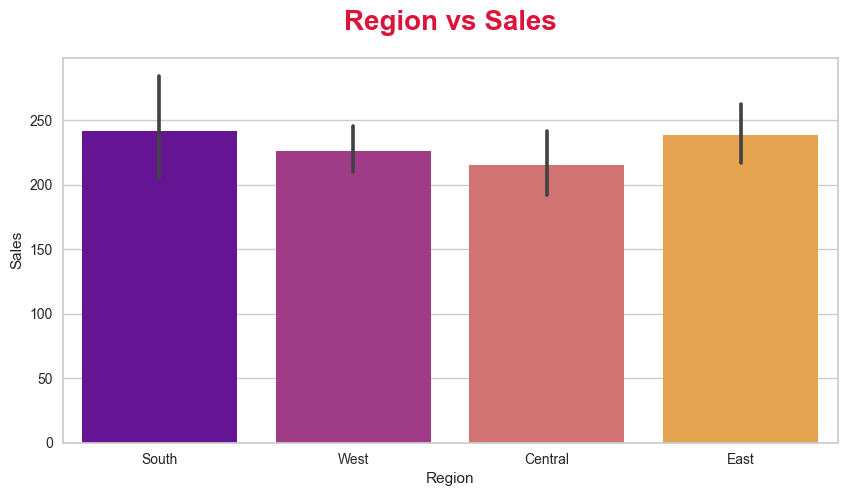

In [31]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Sales',data=df,palette='plasma')
plt.title('Region vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The highest sales were recorded in the South and East regions while the lowest sales were observed in the Central region.

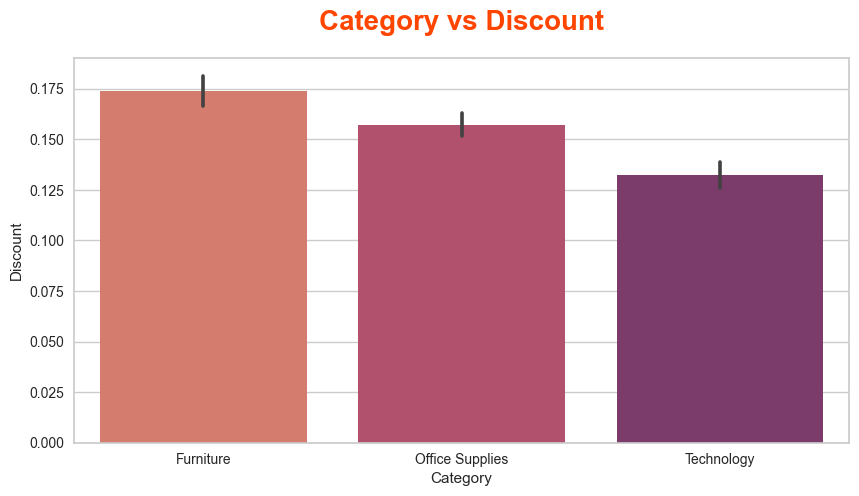

In [32]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Discount',data=df,palette='flare')
plt.title('Category vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A significant discount was provided on furniture products whereas the least discount was given on technology products.

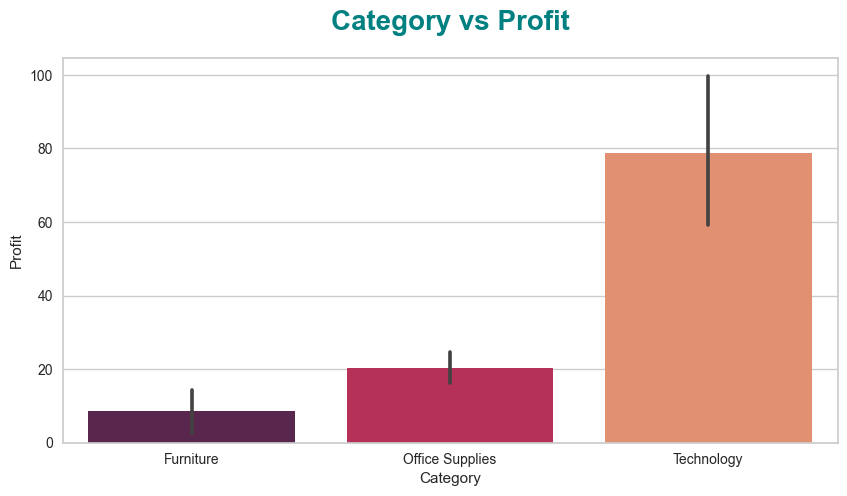

In [33]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Profit',data=df,palette='rocket')
plt.title('Category vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The products belonging to the Technology category are the most profitable while the products belonging to the Furniture category are the least profitable.

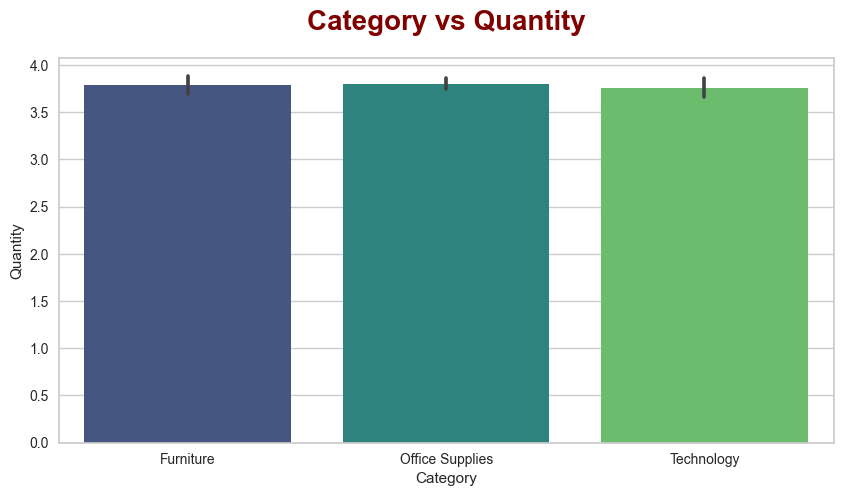

In [34]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Quantity',data=df,palette='viridis')
plt.title('Category vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

All categories have almost similar quantities of products ordered.

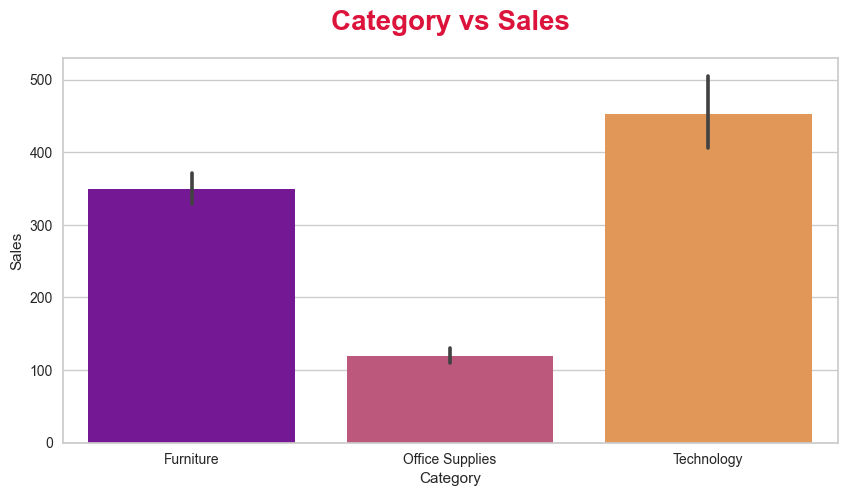

In [35]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Sales',data=df,palette='plasma')
plt.title('Category vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The maximum sales were recorded in the Technology category while the lowest sales were obtained in the Office Supplies category.

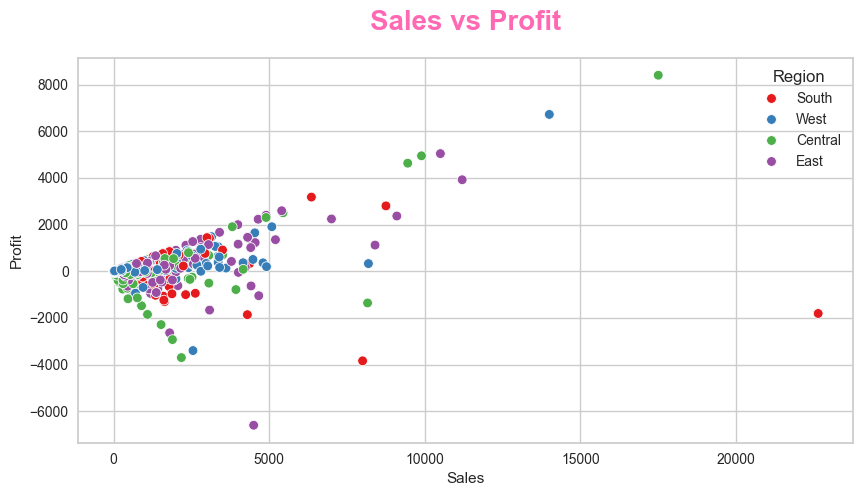

54859

In [36]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Region',palette='Set1')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The Western region recorded the lowest sales and profit among all regions whereas the Eastern region generated a considerable profit in general across all regions.

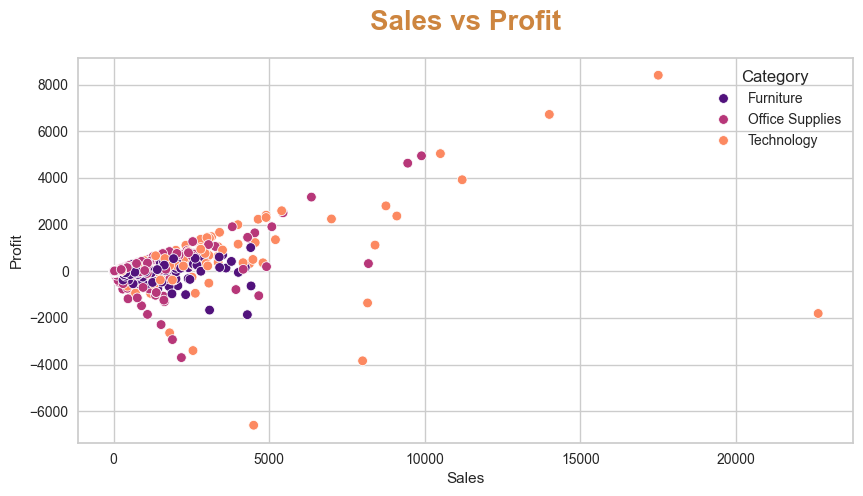

30890

In [37]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Category',palette='magma')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='peru')
plt.show()
plt.close('all')
del fig
gc.collect()

It is clearly evident from the above plot that the highest profit was obtained in the Technology category whereas the lowest profit was obtained in the Office Supplies category.

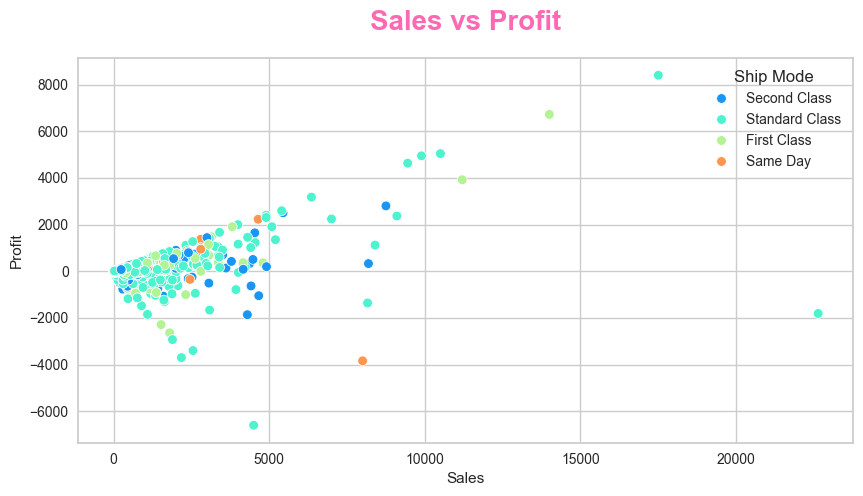

3759

In [38]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Ship Mode',palette='rainbow')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The highest sales and profit were recorded in the orders delivered via the Standard Class shipping mode while the Second Class shipping mode was the least profitable.

### Multivariate Analysis

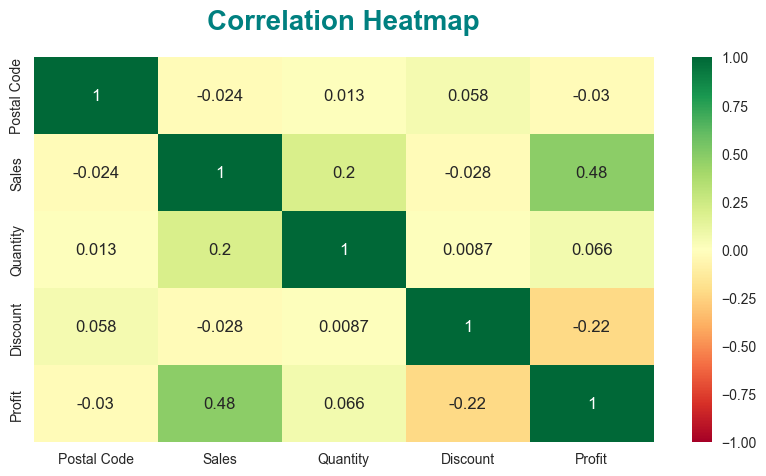

3751

In [39]:

numeric_df = df.select_dtypes(include=['number'])

# Plot the heatmap with numeric data only
plt.figure(figsize=(10, 5))
fig = sns.heatmap(numeric_df.corr(), annot=True, cmap='RdYlGn', vmin=-1.0, vmax=1.0)
plt.title('Correlation Heatmap', pad=20, fontsize=20, fontweight='bold', color='teal')
plt.show()
plt.close('all')
gc.collect()


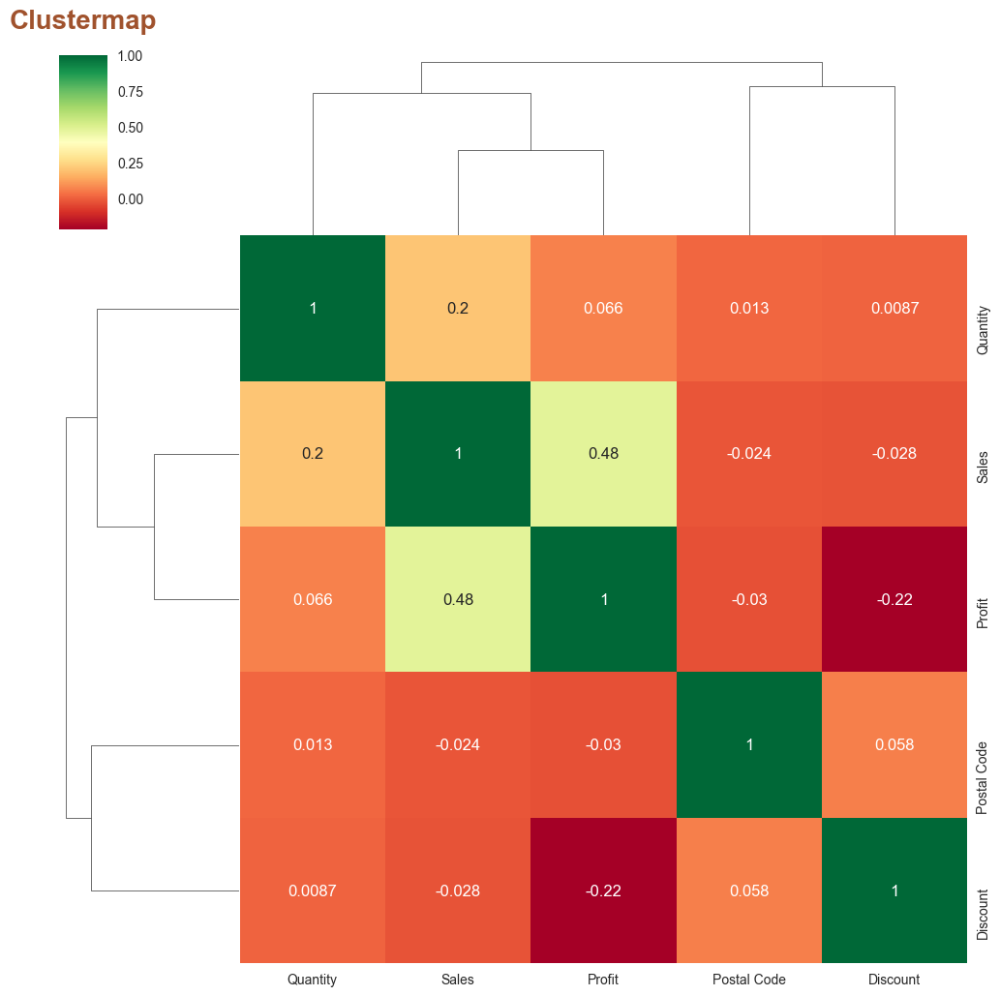

6185

In [40]:
numeric_df = df.select_dtypes(include=['number'])

# Create the cluster map with numeric data only
fig = sns.clustermap(numeric_df.corr(), cmap='RdYlGn', annot=True)
plt.title('Clustermap', pad=20, fontsize=20, fontweight='bold', color='sienna')
plt.show()
plt.close('all')
gc.collect()

<Figure size 1000x500 with 0 Axes>

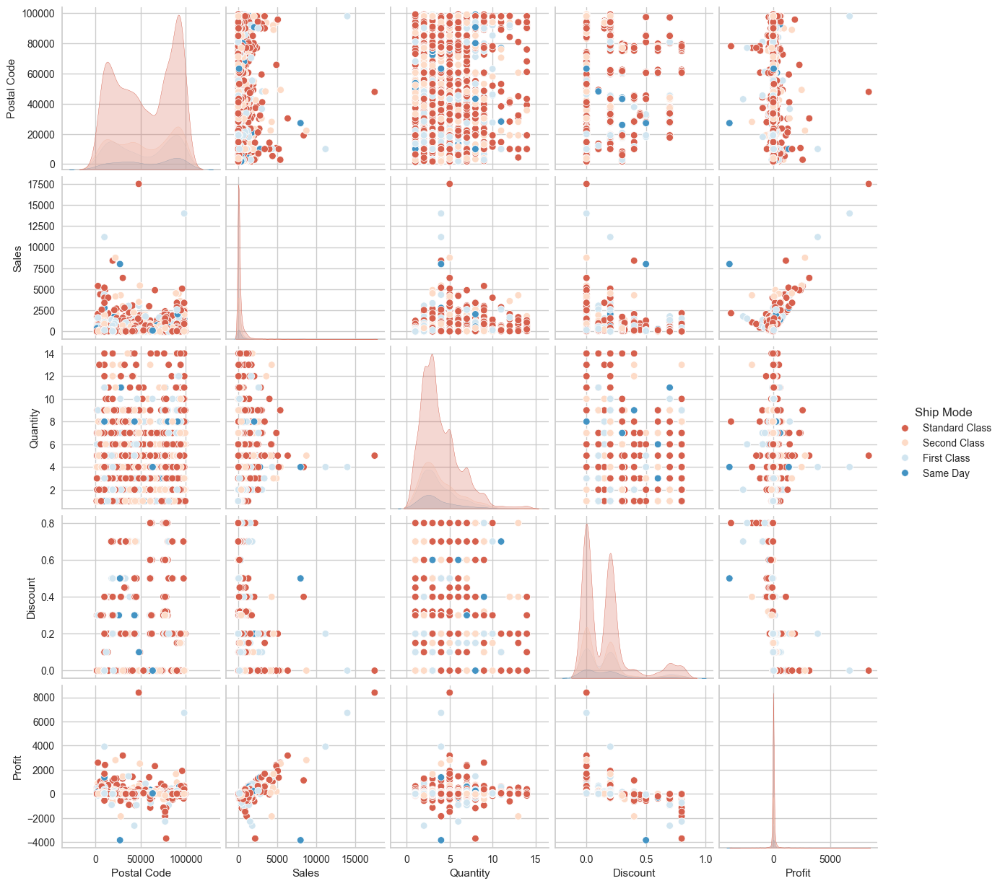

10348

In [41]:
plt.figure(figsize=(10,5))
fig = sns.pairplot(df.sample(n=5000),hue='Ship Mode',palette='RdBu')
plt.show()
plt.close('all')
del fig
gc.collect()

## Feature Engineering

### Feature Extraction

In [42]:
df['Profit Margin'] = df['Profit']/df['Sales']
df['Discounted Profit'] = df['Profit']-df['Profit']*df['Discount']
df['Discount Percentage'] = df['Discount']/df['Sales']*100
df['Operating Expenses'] = df['Sales'] - df['Profit']
df['Net Profit'] = df['Profit'] - df['Discount']

In [43]:
df['Order Date'] = pd.to_datetime(df['Order Date'],errors='coerce')
df['Ship Date'] = pd.to_datetime(df['Ship Date'],errors='coerce')

In [44]:
df['Order Year'] = df['Order Date'].dt.year
df['Order Month'] = df['Order Date'].dt.month
df['Order Day'] = df['Order Date'].dt.day
df['Order Weekday'] = df['Order Date'].dt.dayofweek
df['Ship Year'] = df['Ship Date'].dt.year
df['Ship Month'] = df['Ship Date'].dt.month
df['Ship Day'] = df['Ship Date'].dt.day
df['Ship Weekday'] = df['Ship Date'].dt.dayofweek
df.drop(['Order Date','Ship Date'],axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9993 entries, 0 to 9993
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Ship Mode            9993 non-null   object 
 1   Segment              9993 non-null   object 
 2   City                 9993 non-null   object 
 3   State                9993 non-null   object 
 4   Postal Code          9993 non-null   int64  
 5   Region               9993 non-null   object 
 6   Category             9993 non-null   object 
 7   Sub-Category         9993 non-null   object 
 8   Product Name         9993 non-null   object 
 9   Sales                9993 non-null   float64
 10  Quantity             9993 non-null   int64  
 11  Discount             9993 non-null   float64
 12  Profit               9993 non-null   float64
 13  Profit Margin        9993 non-null   float64
 14  Discounted Profit    9993 non-null   float64
 15  Discount Percentage  9993 non-null   float6

### Categorical Encoding

In [45]:
df['Ship Mode'].unique()

array(['Second Class', 'Standard Class', 'First Class', 'Same Day'],
      dtype=object)

In [46]:
df['Segment'].unique()

array(['Consumer', 'Corporate', 'Home Office'], dtype=object)

In [47]:
df['Category'].unique()

array(['Furniture', 'Office Supplies', 'Technology'], dtype=object)

In [48]:
df['Sub-Category'].unique()

array(['Bookcases', 'Chairs', 'Labels', 'Tables', 'Storage',
       'Furnishings', 'Art', 'Phones', 'Binders', 'Appliances', 'Paper',
       'Accessories', 'Envelopes', 'Fasteners', 'Supplies', 'Machines',
       'Copiers'], dtype=object)

In [49]:
df['Product Name'].nunique()

1841

In [50]:
df['City'].nunique()

531

In [51]:
df['State'].nunique()

49

In [52]:
df['Region'].unique()

array(['South', 'West', 'Central', 'East'], dtype=object)

In [53]:
def onehotencode(data: pd.DataFrame,col: str) -> pd.DataFrame:
    encoder = OneHotEncoder(drop='first',sparse_output=False,max_categories=10)
    encoded_data = encoder.fit_transform(data[[col]])
    encoded_data = pd.DataFrame(encoded_data,columns=encoder.get_feature_names_out())
    return encoded_data

In [54]:
for col in ['Ship Mode','Segment','State','City','Region','Category','Sub-Category','Product Name']:
    encoded_data = onehotencode(df,col)
    df = pd.concat([df,encoded_data],axis=1)
    df.drop(col,axis=1,inplace=True)

In [55]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Profit','Discounted Profit','Net Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Profit Margin','Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Profit', 'Discounted Profit',
                                  'Net Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Profit Margin', 'Discount Percentage',
                                  'Operating Expenses'])])

### Feature Transformation

In [56]:
skewed_cols = ['Quantity',
 'Discount',
 'Profit',
 'Profit Margin',
 'Discounted Profit',
 'Discount Percentage',
 'Operating Expenses',
 'Net Profit',
 'Order Day',
 'Order Weekday',
 'Order Month',
 'Ship Day']

Skewness of Quantity: 1.2784155399852233
Kurtosis of Quantity: 1.9915827160047757


posx and posy should be finite values
posx and posy should be finite values


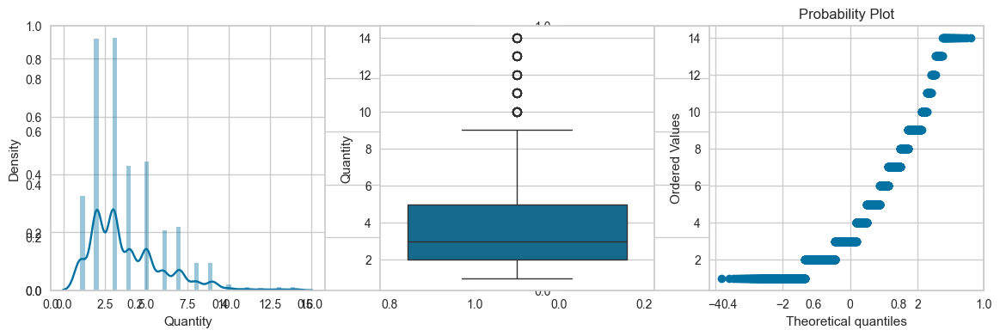

Skewness of Discount: 1.6845084876700462
Kurtosis of Discount: 2.409976524801519


posx and posy should be finite values
posx and posy should be finite values


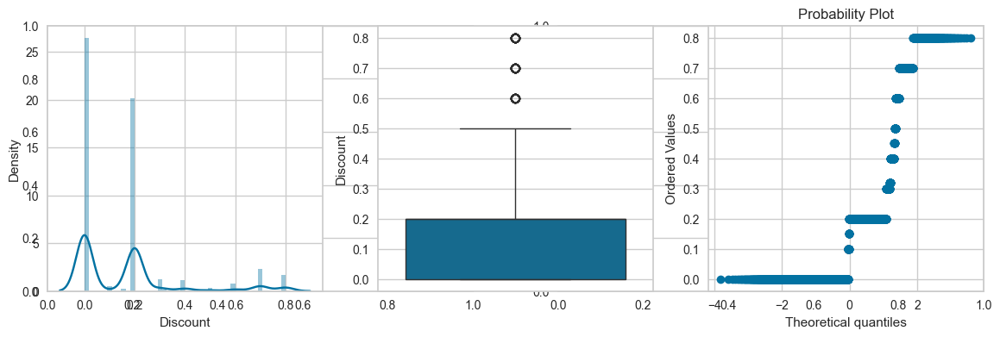

Skewness of Profit: 7.561035996041436
Kurtosis of Profit: 397.15038474389223


posx and posy should be finite values
posx and posy should be finite values


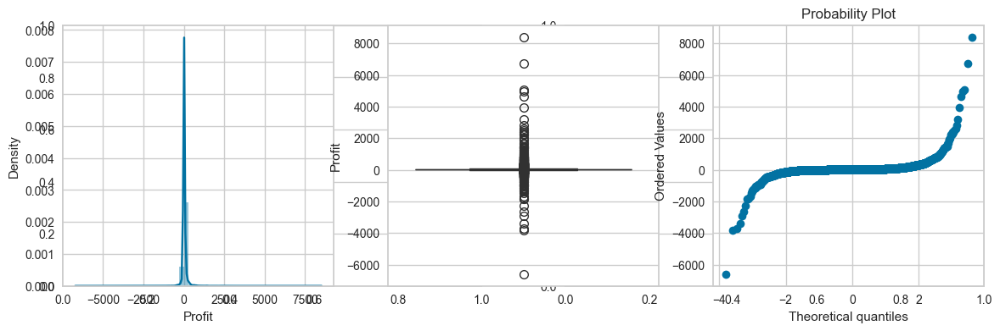

Skewness of Profit Margin: -2.894835315865789
Kurtosis of Profit Margin: 10.172752622828092


posx and posy should be finite values
posx and posy should be finite values


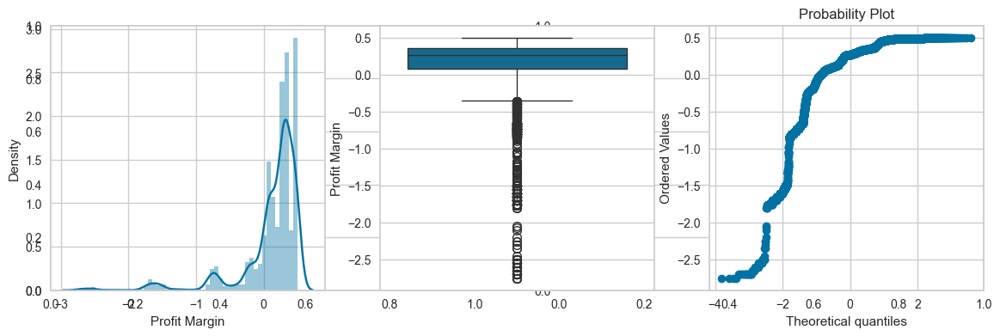

Skewness of Discounted Profit: 19.35659799419806
Kurtosis of Discounted Profit: 617.6369152241313


posx and posy should be finite values
posx and posy should be finite values


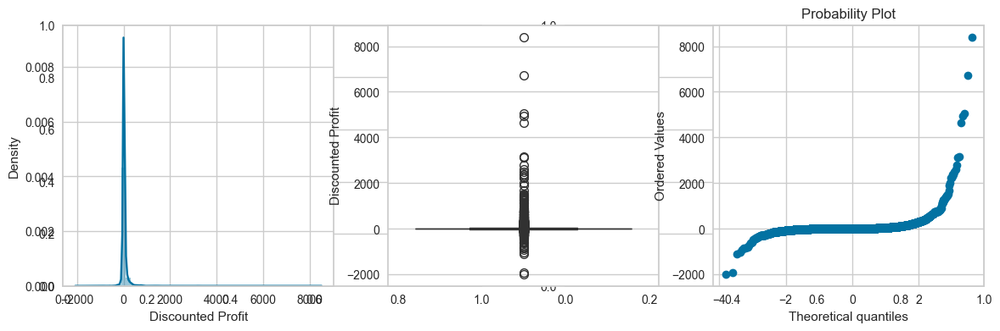

Skewness of Discount Percentage: 10.828151381652273
Kurtosis of Discount Percentage: 188.85920639655157


posx and posy should be finite values
posx and posy should be finite values


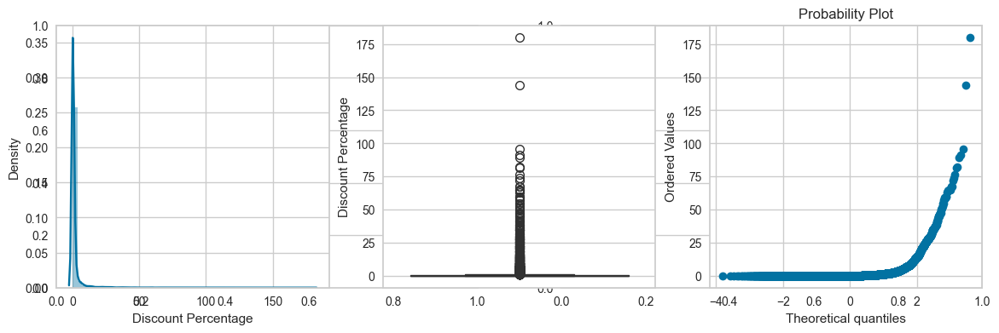

Skewness of Operating Expenses: 14.752446377055431
Kurtosis of Operating Expenses: 454.5499992208234


posx and posy should be finite values
posx and posy should be finite values


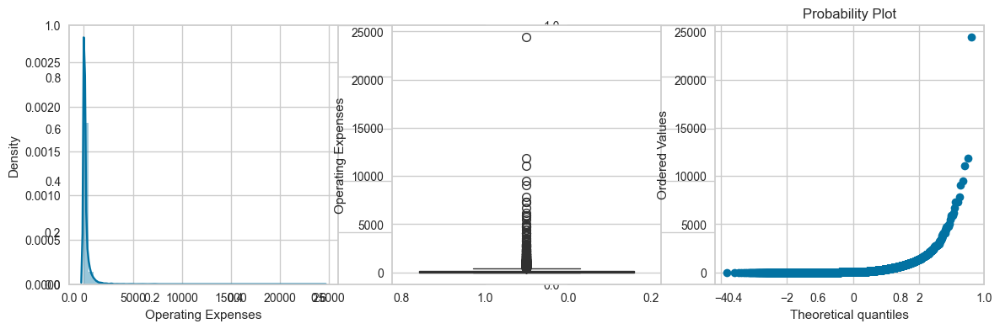

Skewness of Net Profit: 7.555768996026929
Kurtosis of Net Profit: 396.9091881919584


posx and posy should be finite values
posx and posy should be finite values


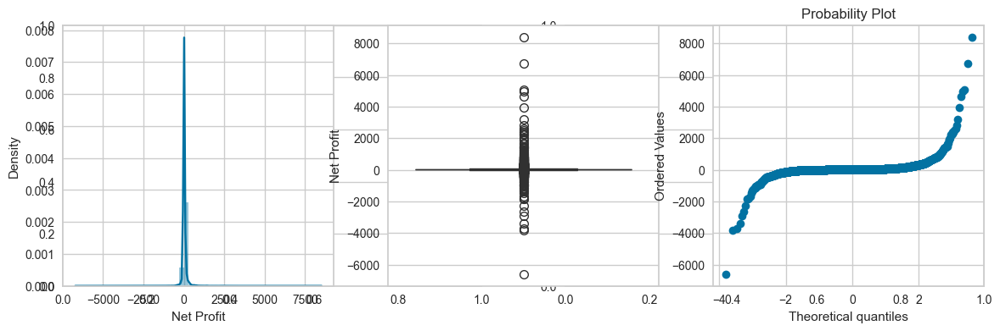

Skewness of Order Day: 0.013550065823461663
Kurtosis of Order Day: -1.1861898468255059


posx and posy should be finite values
posx and posy should be finite values


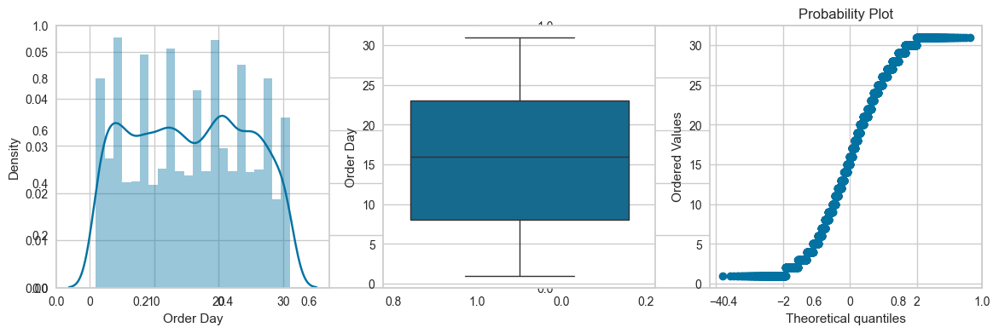

Skewness of Order Weekday: 0.12340952691336028
Kurtosis of Order Weekday: -1.0869179921056922


posx and posy should be finite values
posx and posy should be finite values


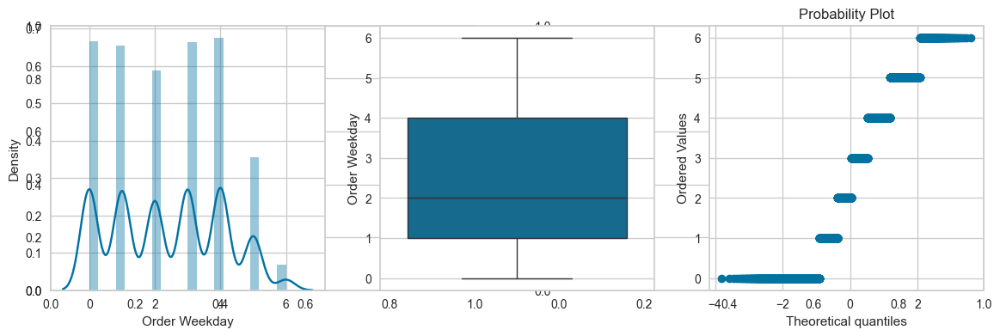

Skewness of Order Month: -0.4329511345177871
Kurtosis of Order Month: -0.9846637321437535


posx and posy should be finite values
posx and posy should be finite values


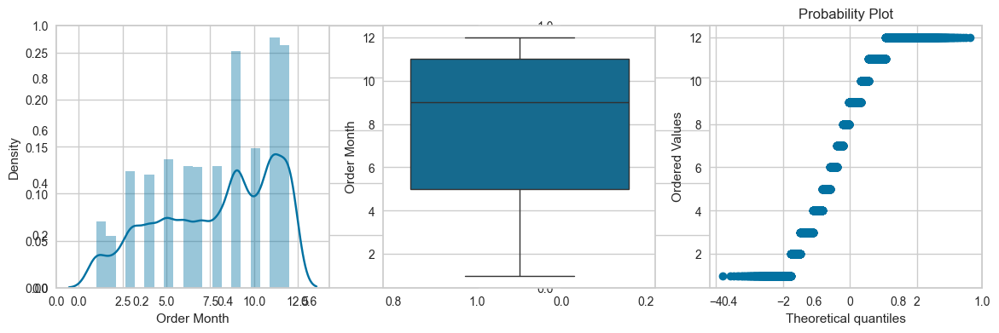

Skewness of Ship Day: -0.012355797229445813
Kurtosis of Ship Day: -1.2070053450291567


posx and posy should be finite values
posx and posy should be finite values


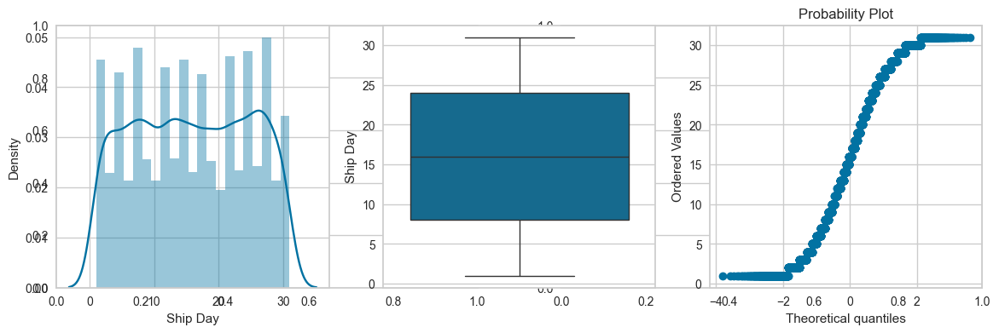

In [57]:
for col in skewed_cols:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [58]:
def apply_transform(data,col,transformer):
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(data[col])
    plt.subplot(132)
    sns.boxplot(data[col])
    plt.subplot(133)
    probplot(data[col],rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} Before Transform")
    plt.show()
    col_tf = transformer.fit_transform(data[[col]])
    col_tf = np.array(col_tf).reshape(col_tf.shape[0])
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(col_tf)
    plt.subplot(132)
    sns.boxplot(col_tf)
    plt.subplot(133)
    probplot(col_tf,rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} After Transform")
    plt.show()
    gc.collect();

posx and posy should be finite values
posx and posy should be finite values


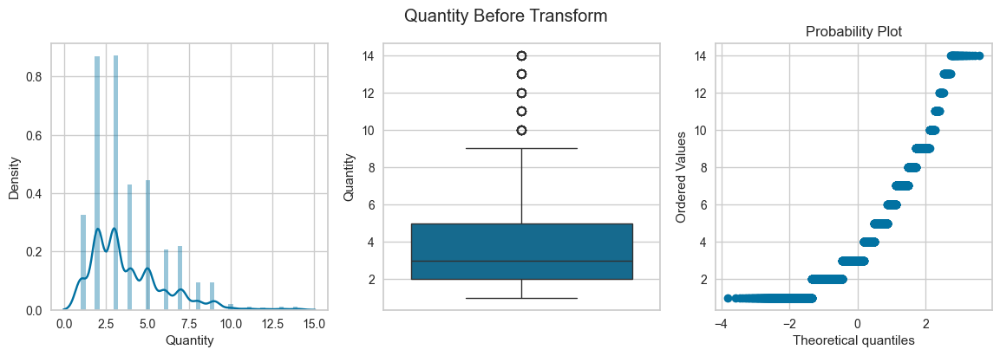

posx and posy should be finite values
posx and posy should be finite values


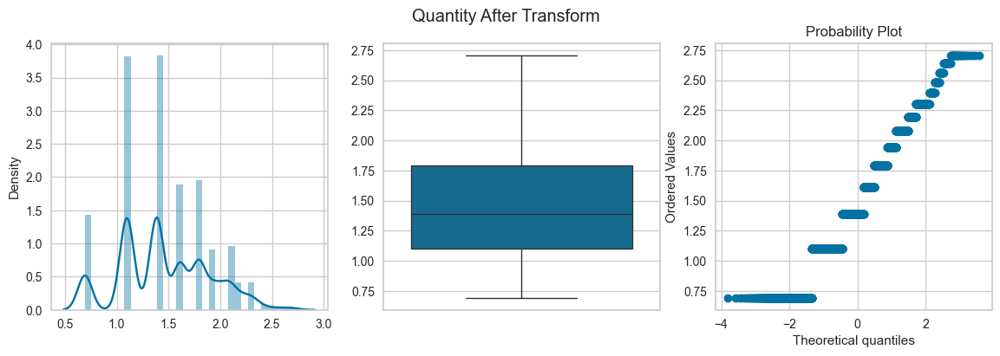

posx and posy should be finite values
posx and posy should be finite values


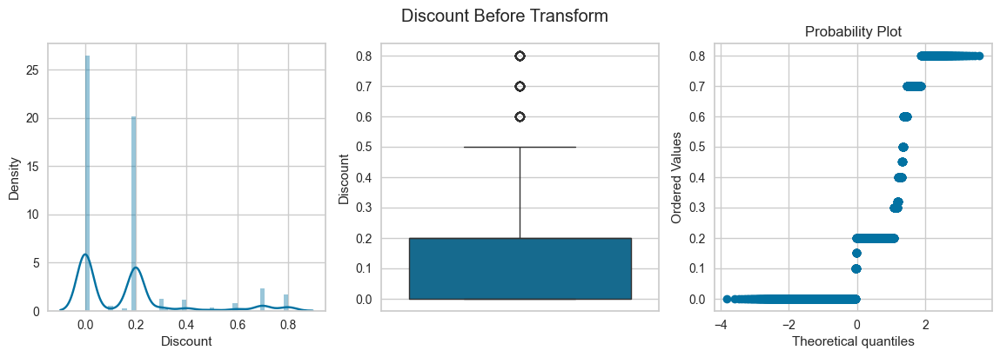

posx and posy should be finite values
posx and posy should be finite values


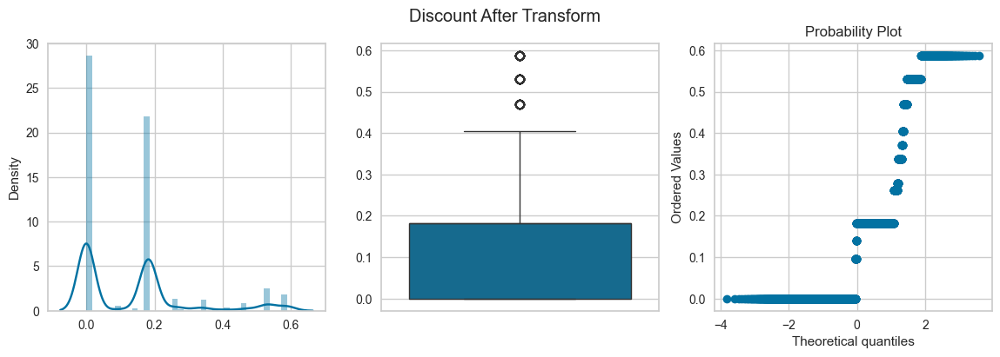

posx and posy should be finite values
posx and posy should be finite values


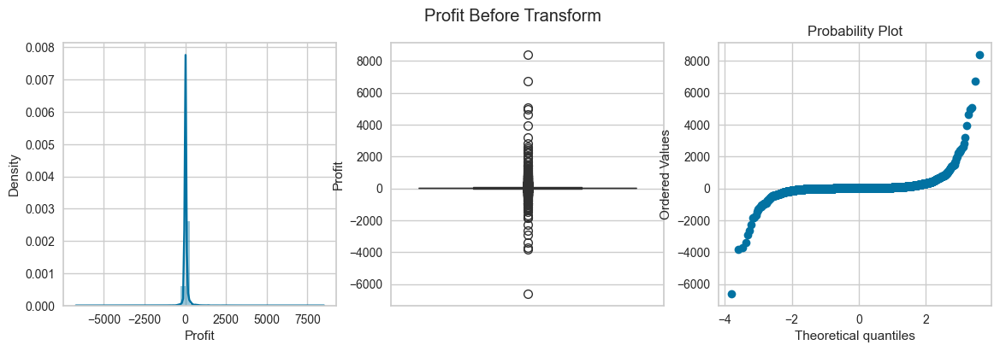

posx and posy should be finite values
posx and posy should be finite values


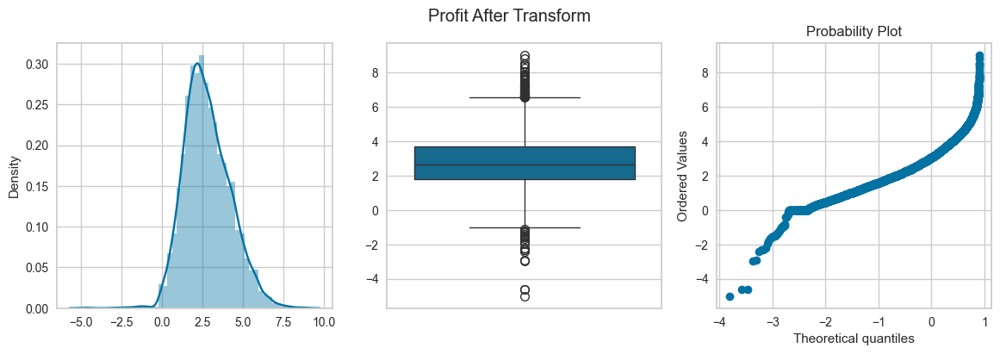

posx and posy should be finite values
posx and posy should be finite values


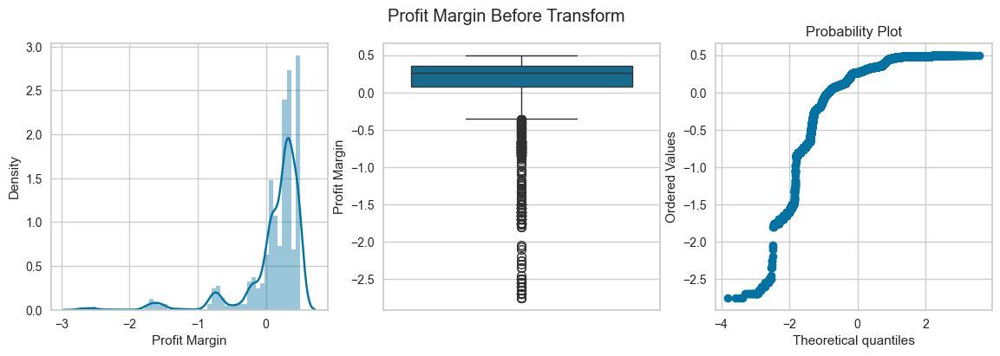

posx and posy should be finite values
posx and posy should be finite values


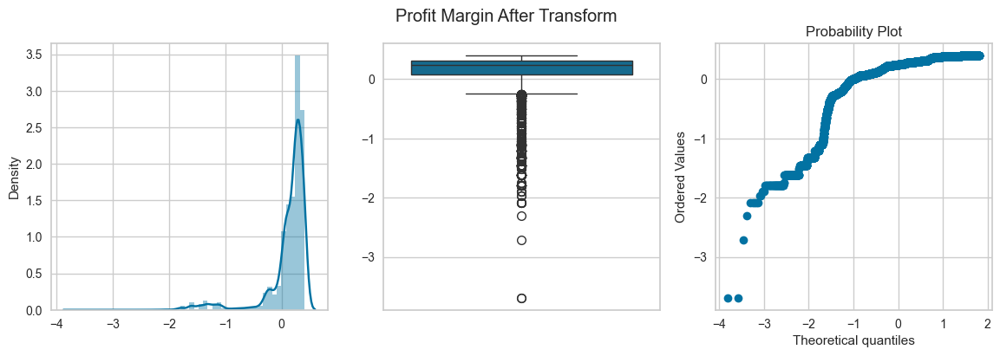

posx and posy should be finite values
posx and posy should be finite values


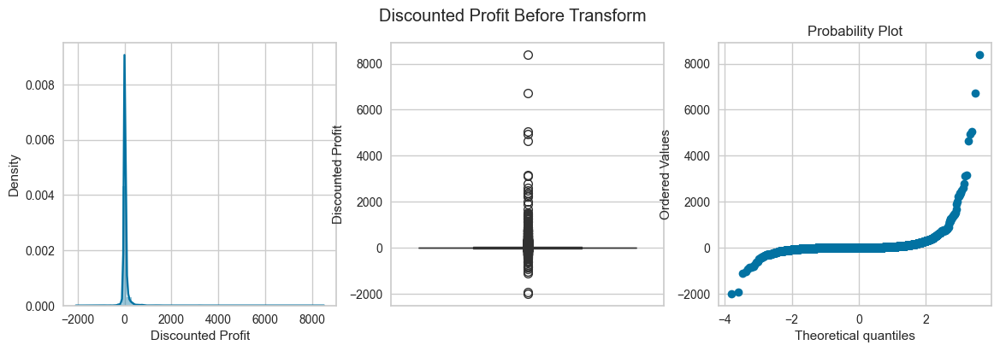

posx and posy should be finite values
posx and posy should be finite values


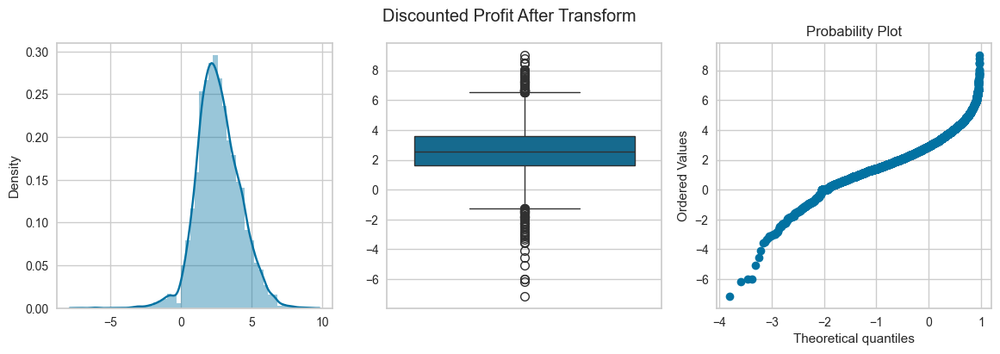

posx and posy should be finite values
posx and posy should be finite values


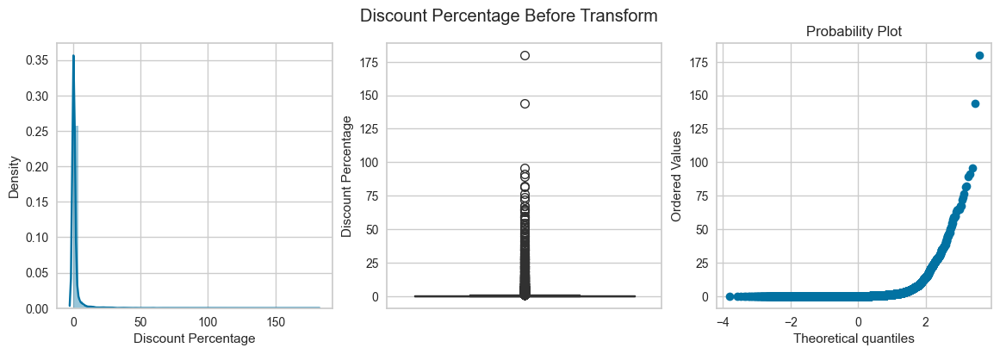

posx and posy should be finite values
posx and posy should be finite values


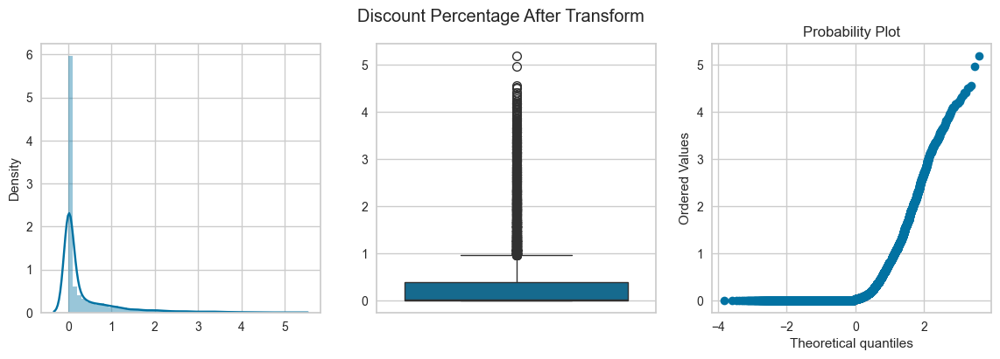

posx and posy should be finite values
posx and posy should be finite values


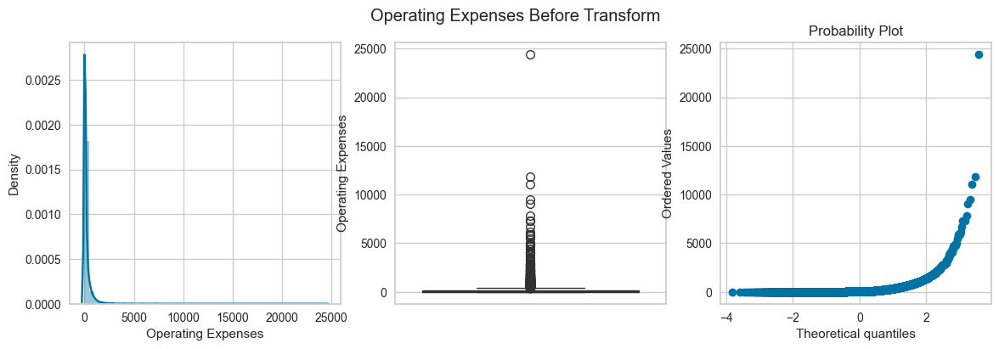

posx and posy should be finite values
posx and posy should be finite values


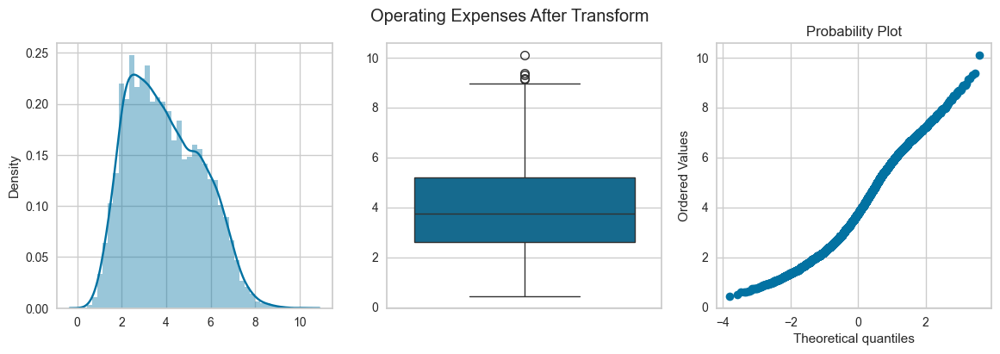

posx and posy should be finite values
posx and posy should be finite values


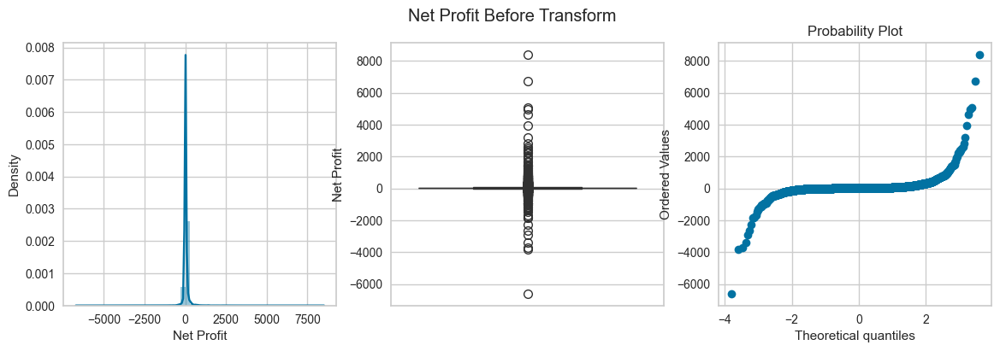

posx and posy should be finite values
posx and posy should be finite values


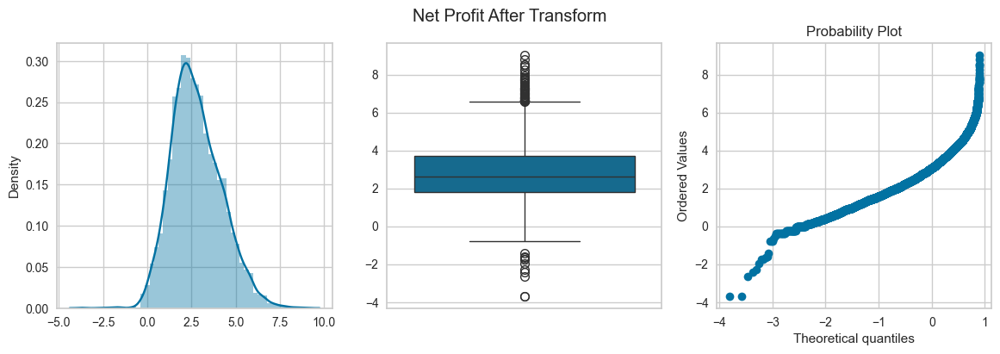

posx and posy should be finite values
posx and posy should be finite values


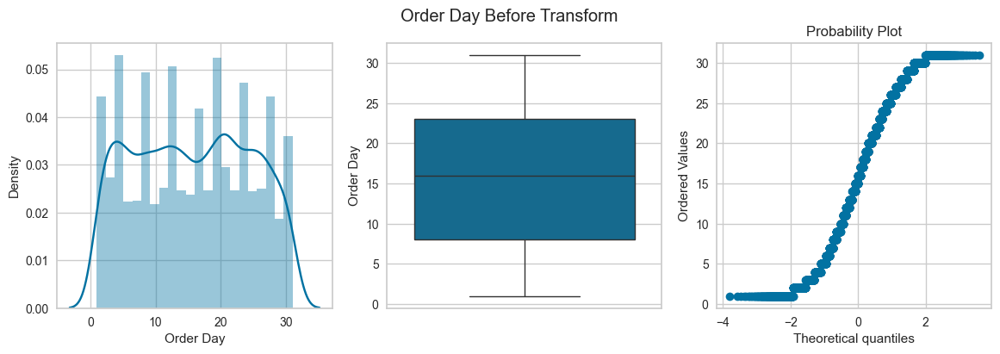

posx and posy should be finite values
posx and posy should be finite values


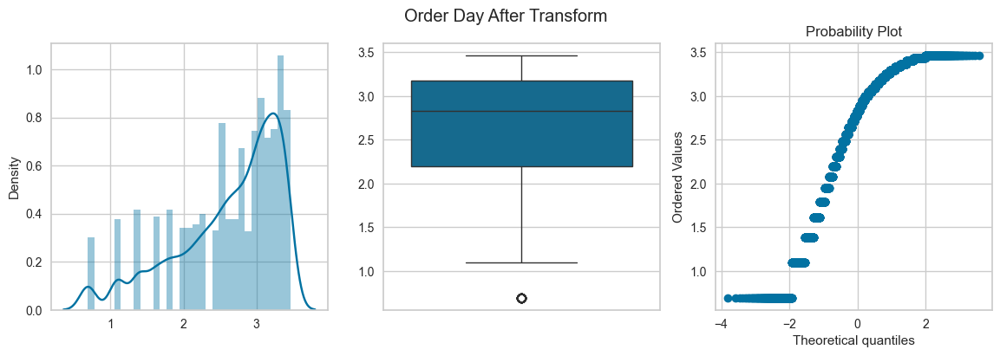

posx and posy should be finite values
posx and posy should be finite values


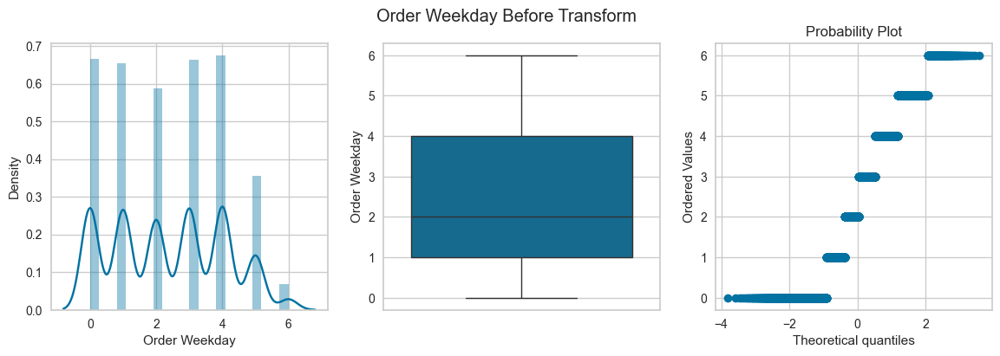

posx and posy should be finite values
posx and posy should be finite values


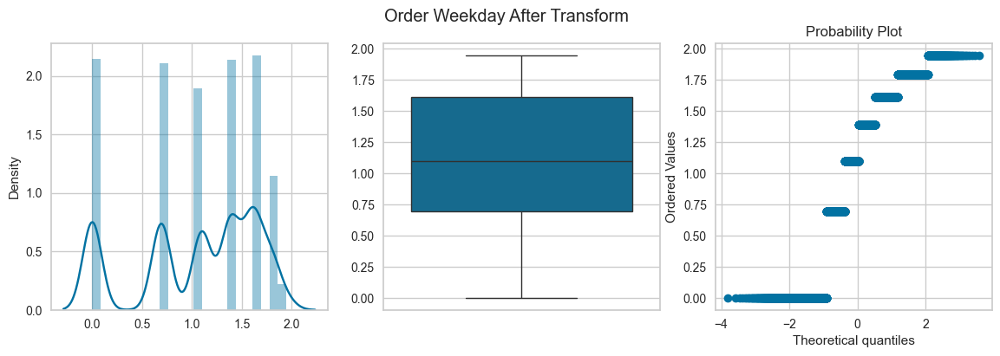

posx and posy should be finite values
posx and posy should be finite values


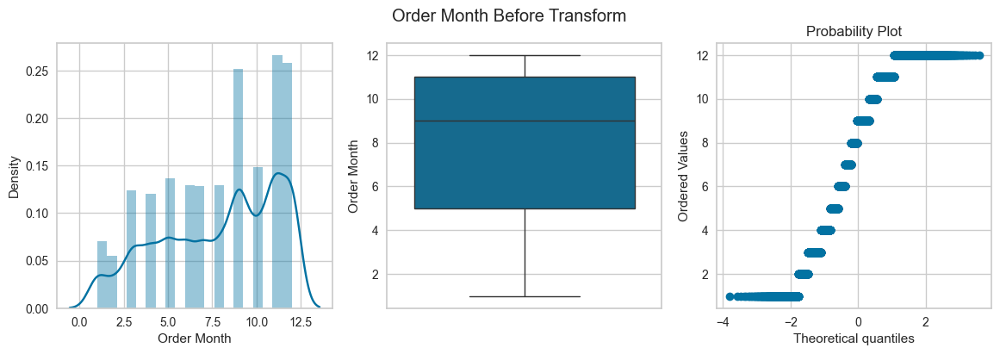

posx and posy should be finite values
posx and posy should be finite values


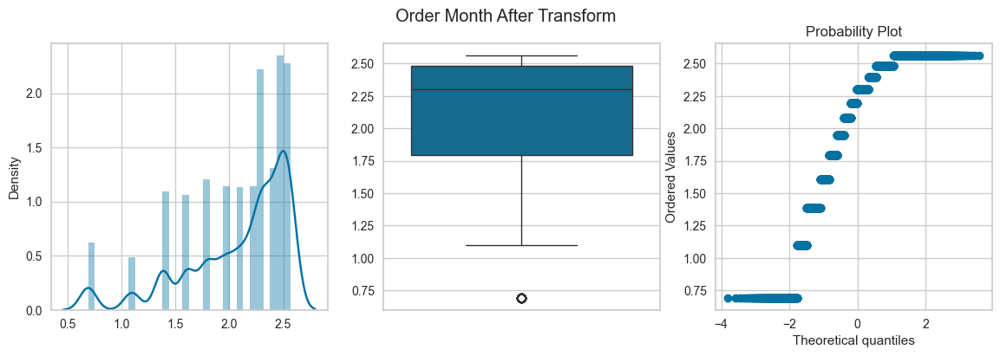

posx and posy should be finite values
posx and posy should be finite values


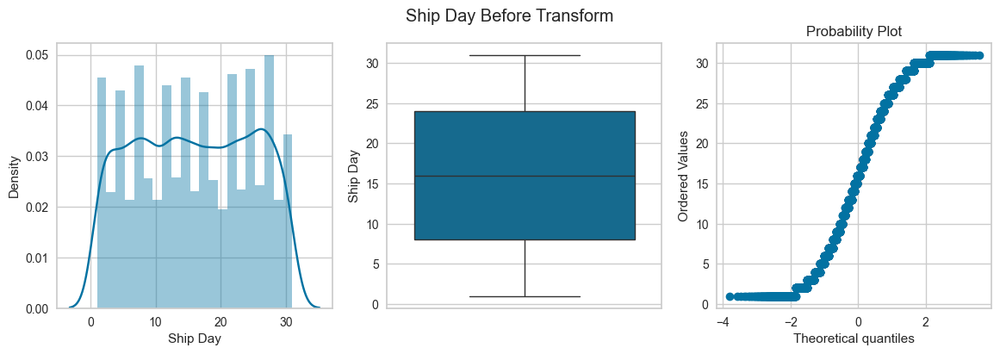

posx and posy should be finite values
posx and posy should be finite values


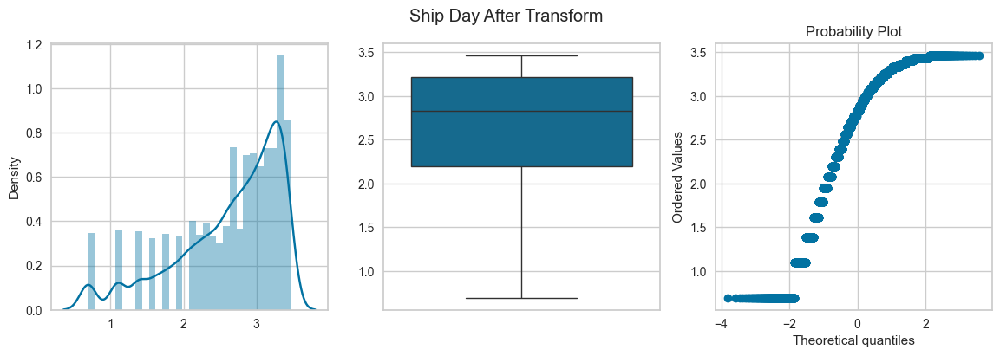

In [59]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.log1p))

posx and posy should be finite values
posx and posy should be finite values


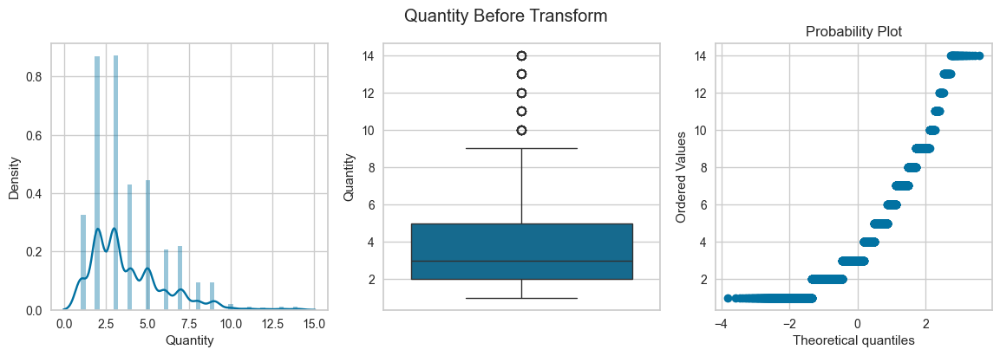

posx and posy should be finite values
posx and posy should be finite values


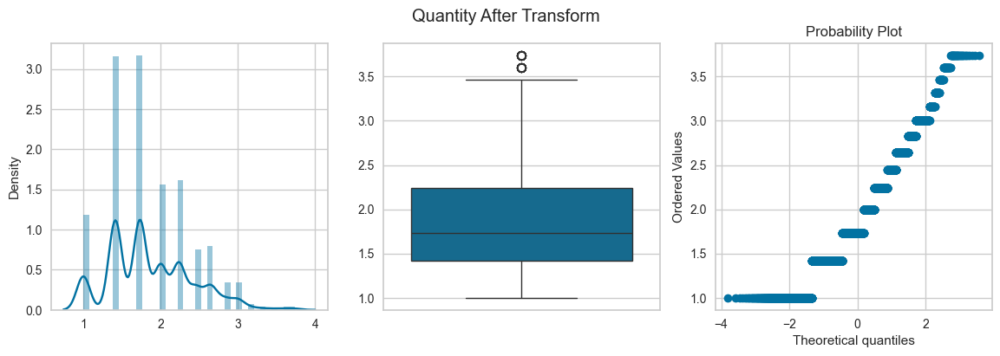

posx and posy should be finite values
posx and posy should be finite values


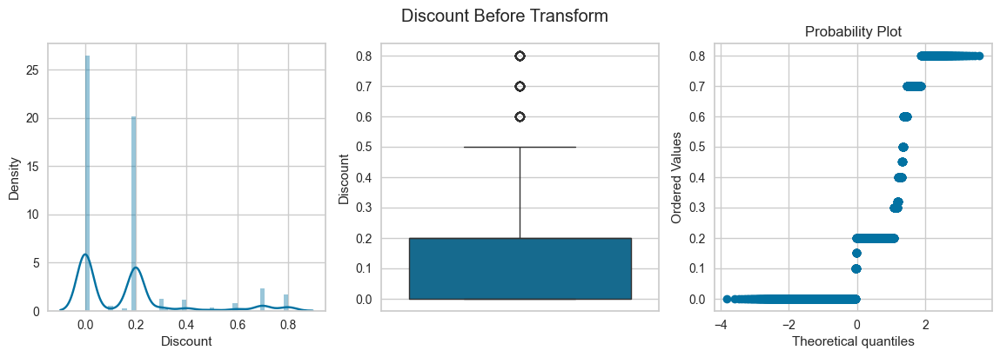

posx and posy should be finite values
posx and posy should be finite values


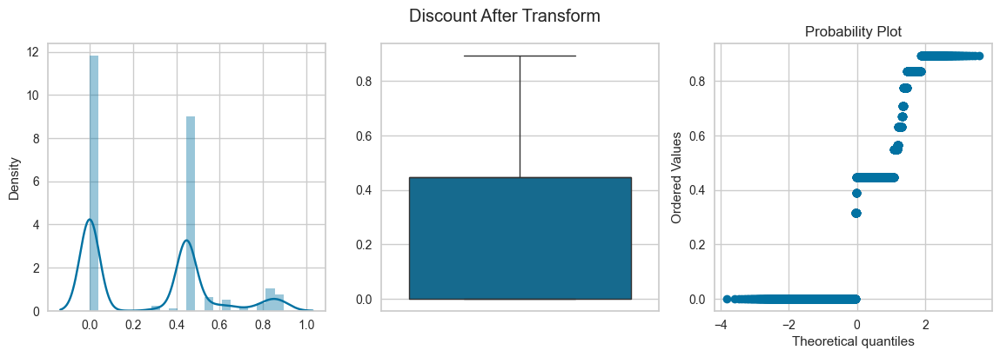

posx and posy should be finite values
posx and posy should be finite values


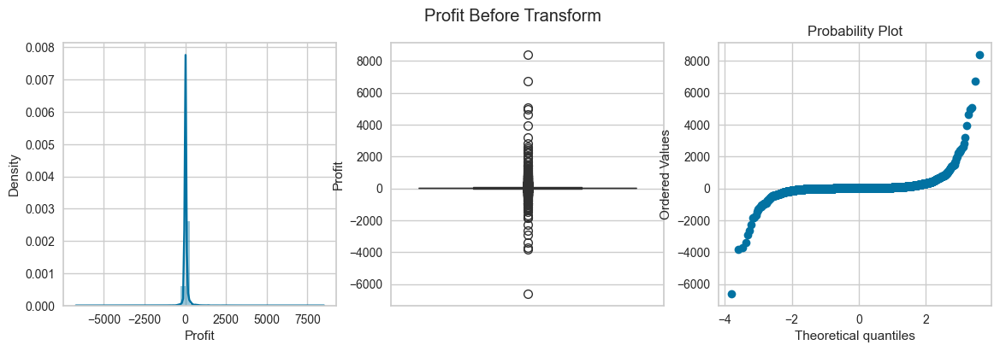

posx and posy should be finite values
posx and posy should be finite values


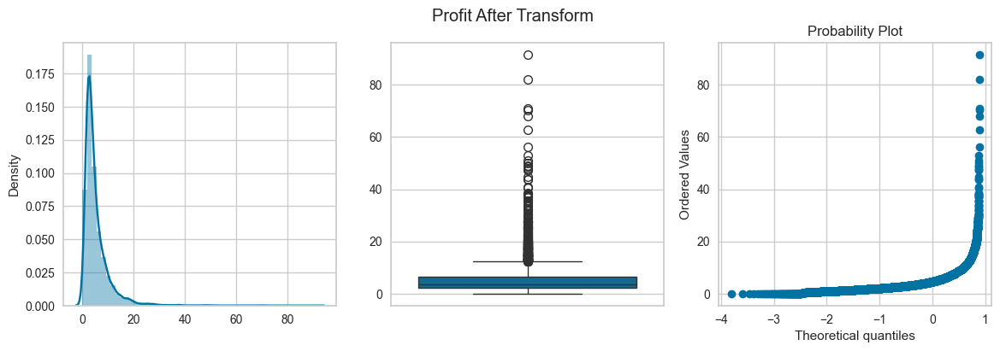

posx and posy should be finite values
posx and posy should be finite values


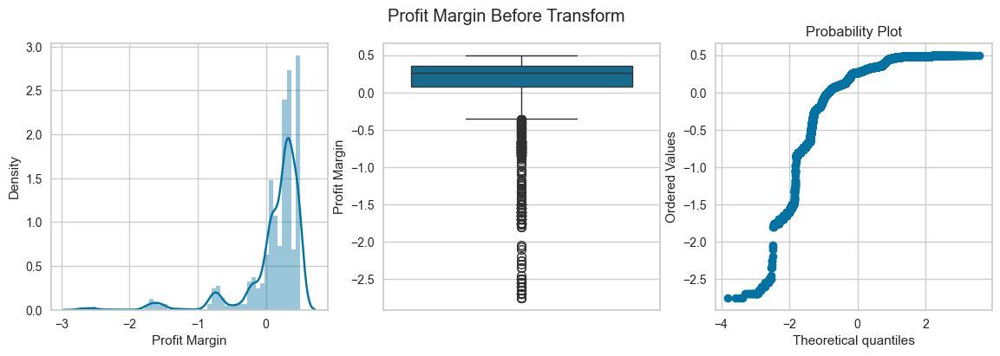

posx and posy should be finite values
posx and posy should be finite values


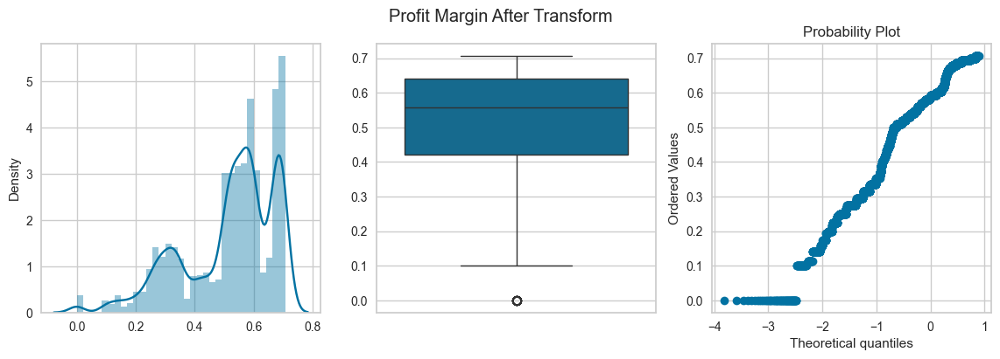

posx and posy should be finite values
posx and posy should be finite values


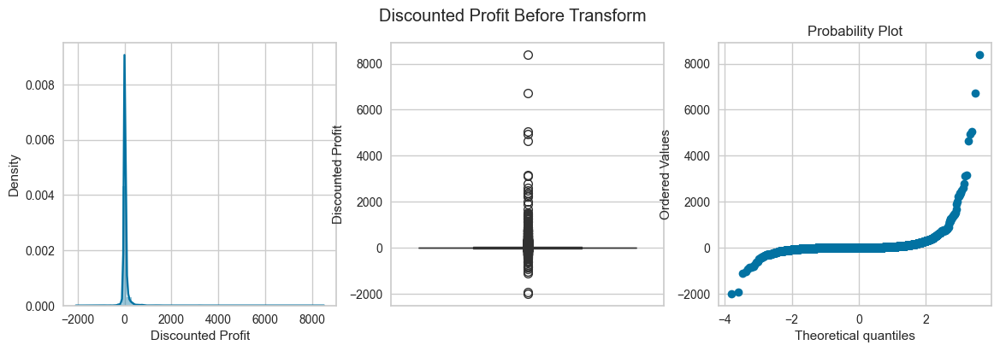

posx and posy should be finite values
posx and posy should be finite values


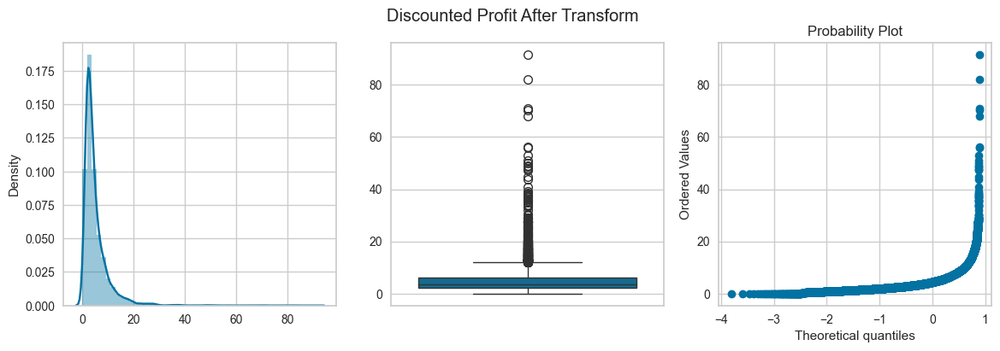

posx and posy should be finite values
posx and posy should be finite values


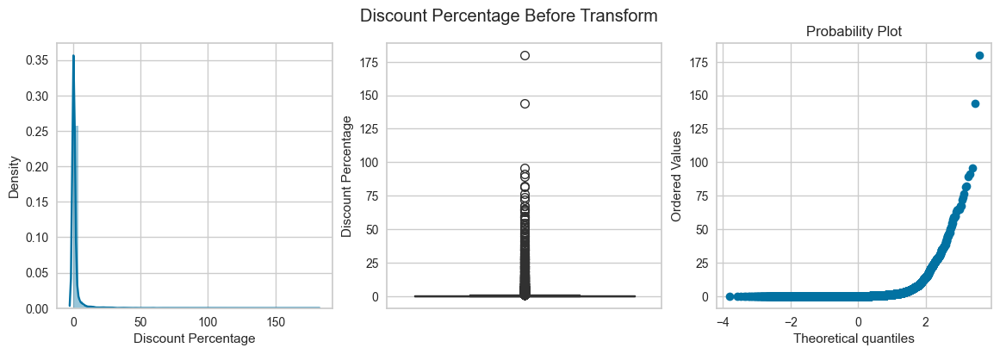

posx and posy should be finite values
posx and posy should be finite values


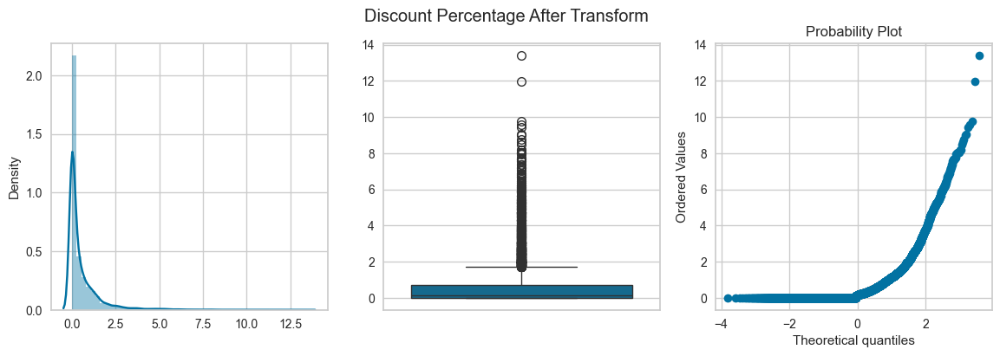

posx and posy should be finite values
posx and posy should be finite values


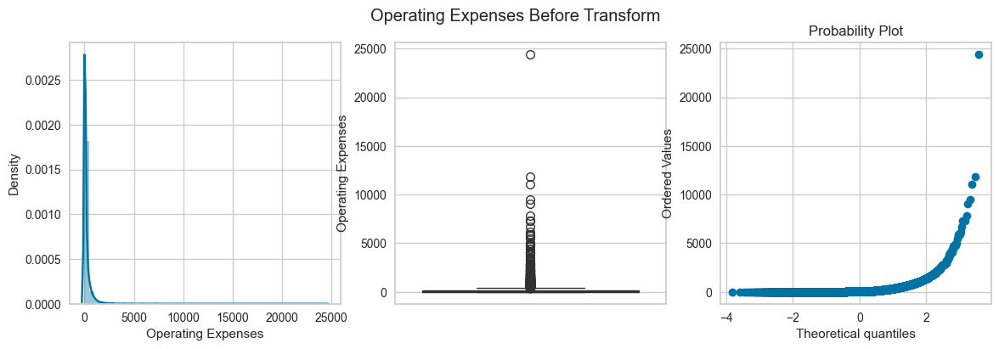

posx and posy should be finite values
posx and posy should be finite values


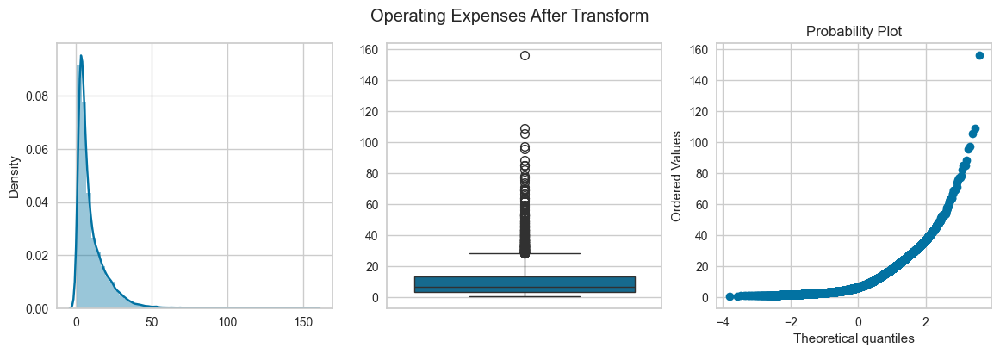

posx and posy should be finite values
posx and posy should be finite values


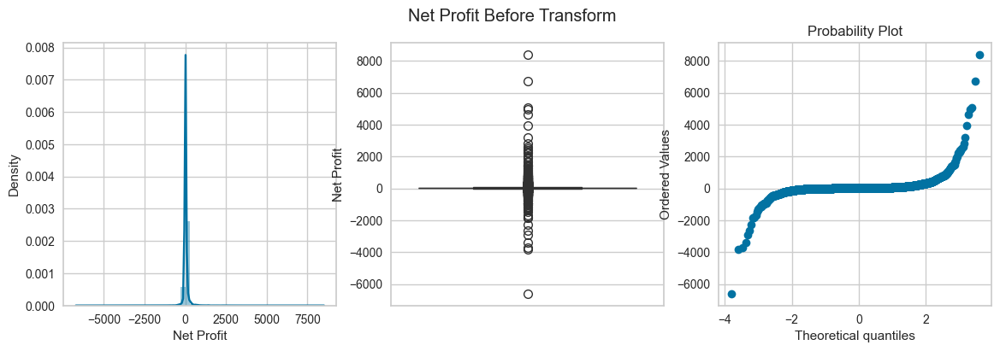

posx and posy should be finite values
posx and posy should be finite values


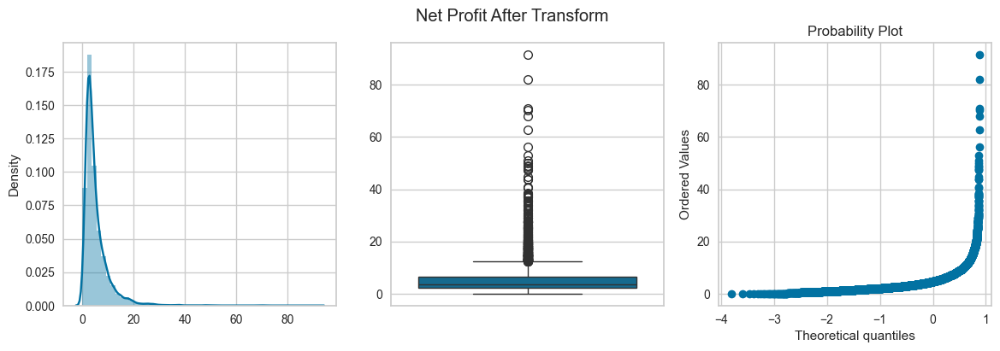

posx and posy should be finite values
posx and posy should be finite values


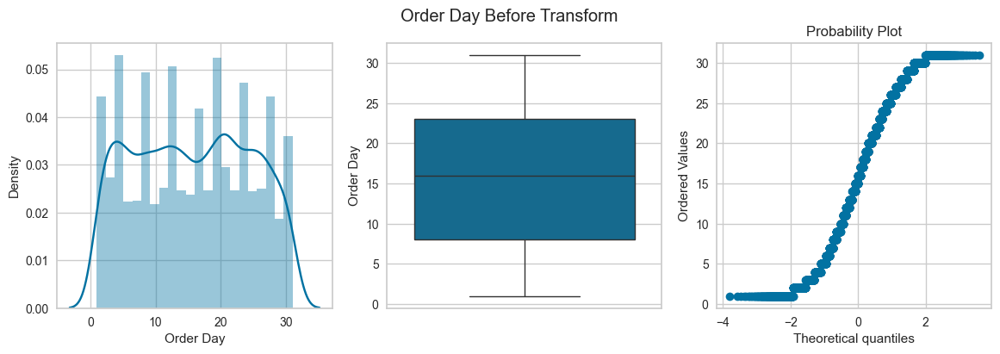

posx and posy should be finite values
posx and posy should be finite values


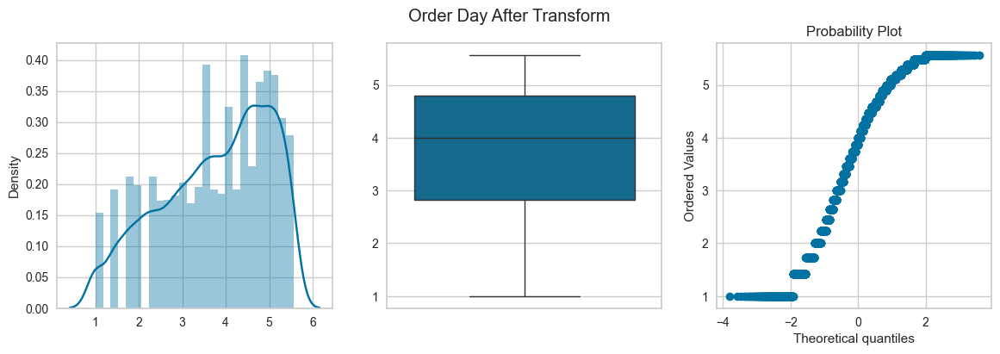

posx and posy should be finite values
posx and posy should be finite values


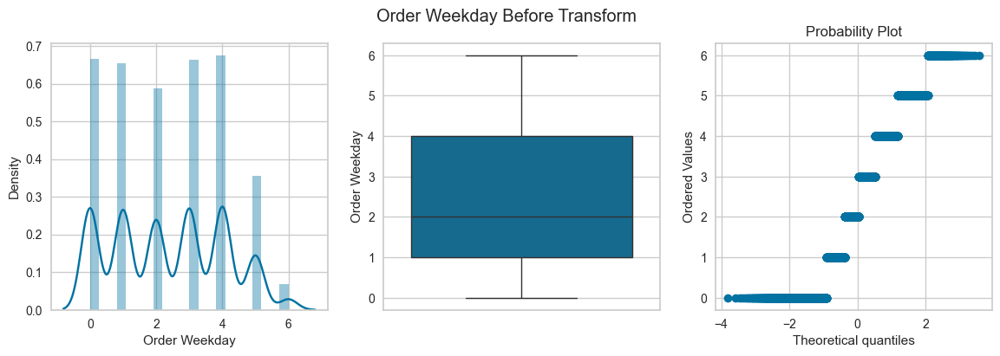

posx and posy should be finite values
posx and posy should be finite values


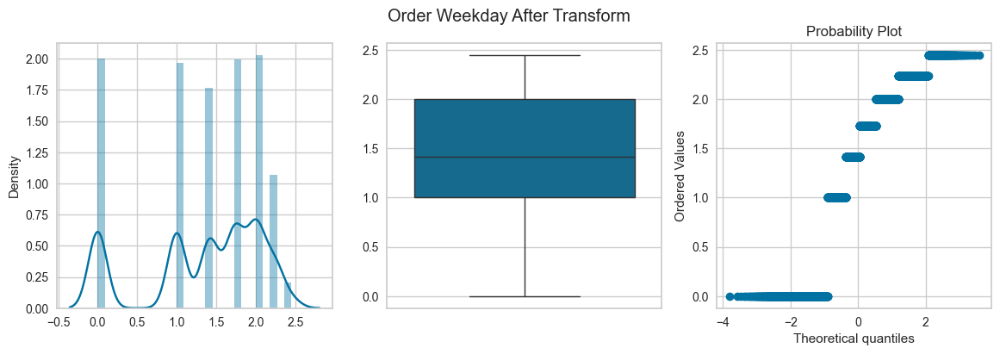

posx and posy should be finite values
posx and posy should be finite values


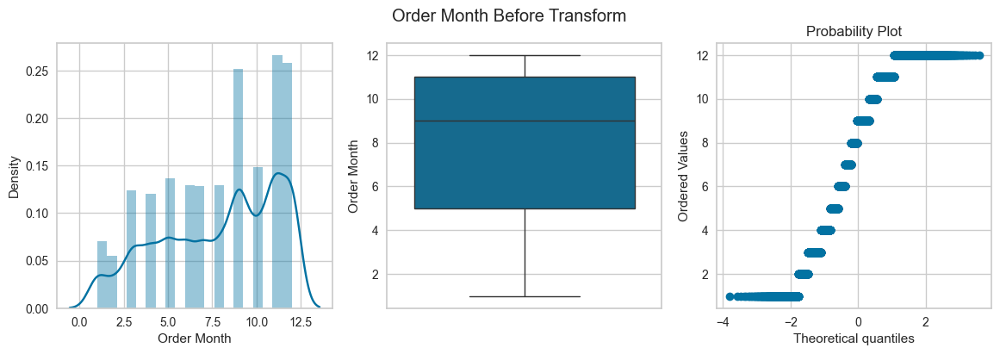

posx and posy should be finite values
posx and posy should be finite values


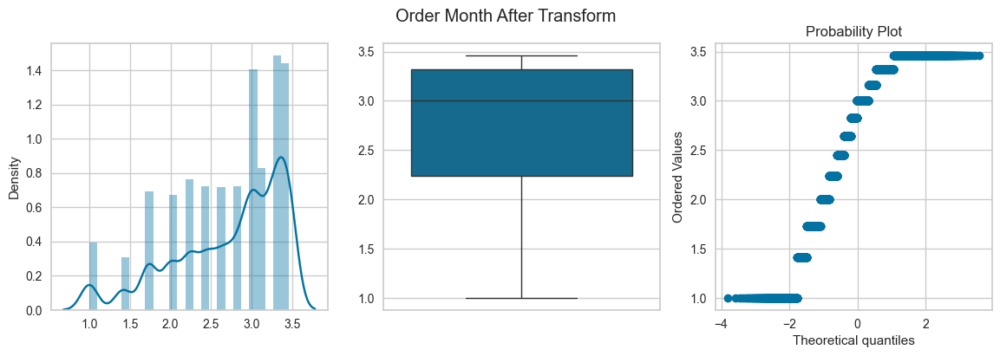

posx and posy should be finite values
posx and posy should be finite values


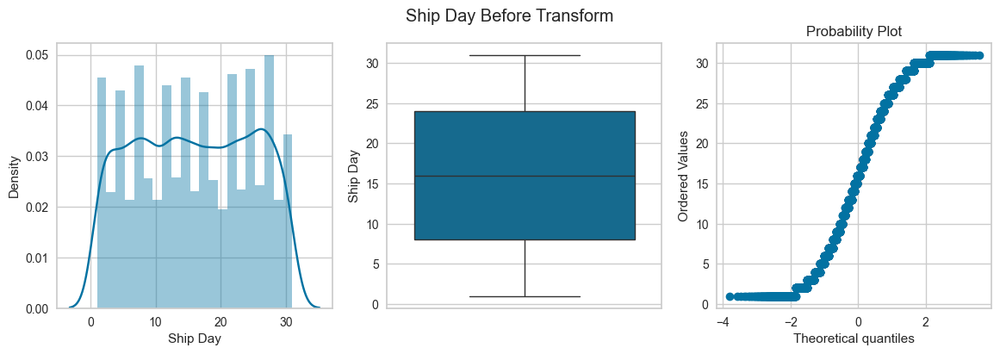

posx and posy should be finite values
posx and posy should be finite values


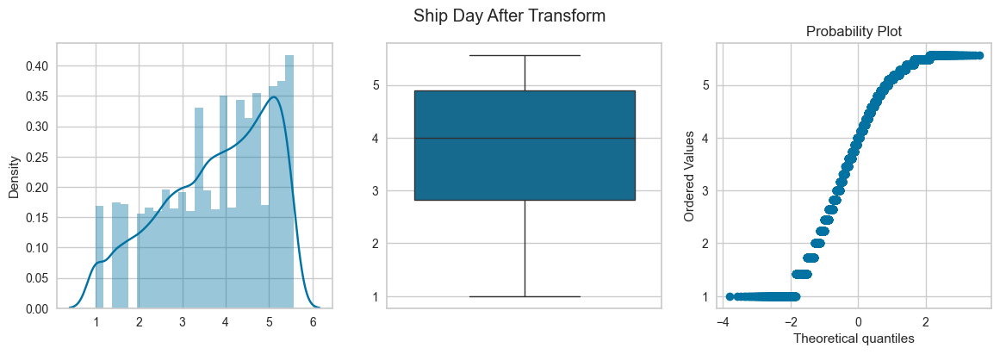

In [60]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.sqrt))

posx and posy should be finite values
posx and posy should be finite values


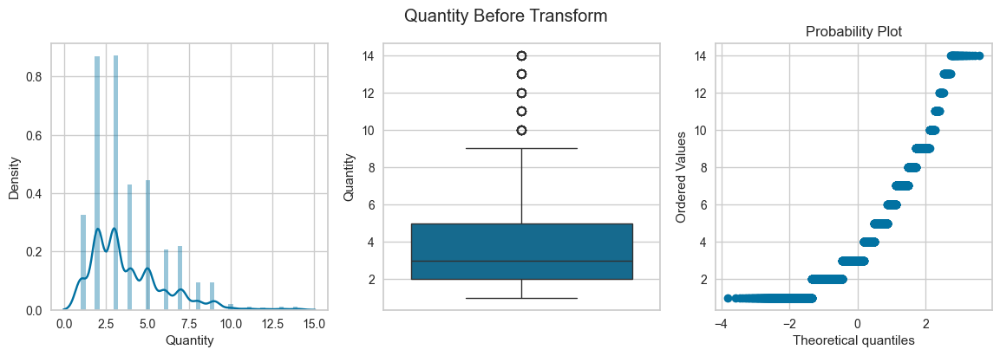

posx and posy should be finite values
posx and posy should be finite values


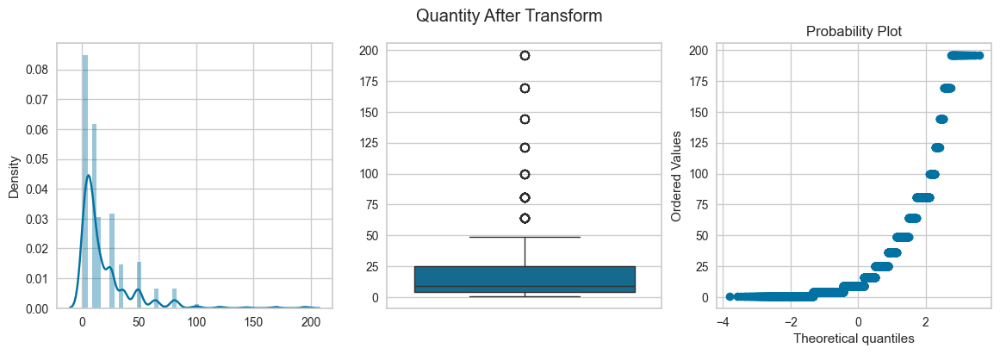

posx and posy should be finite values
posx and posy should be finite values


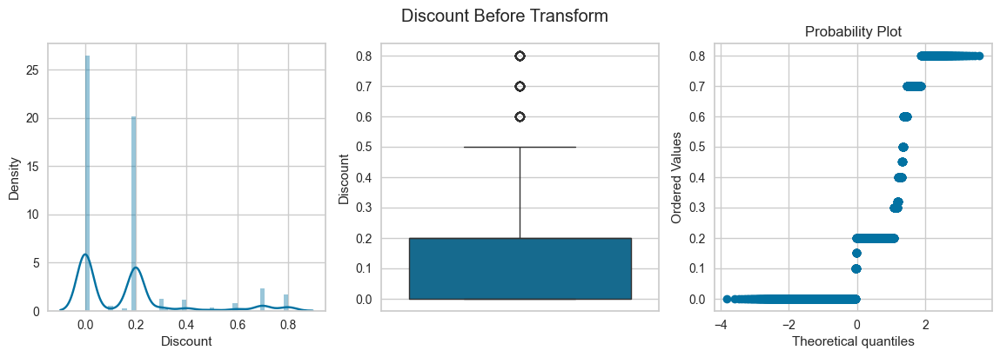

posx and posy should be finite values
posx and posy should be finite values


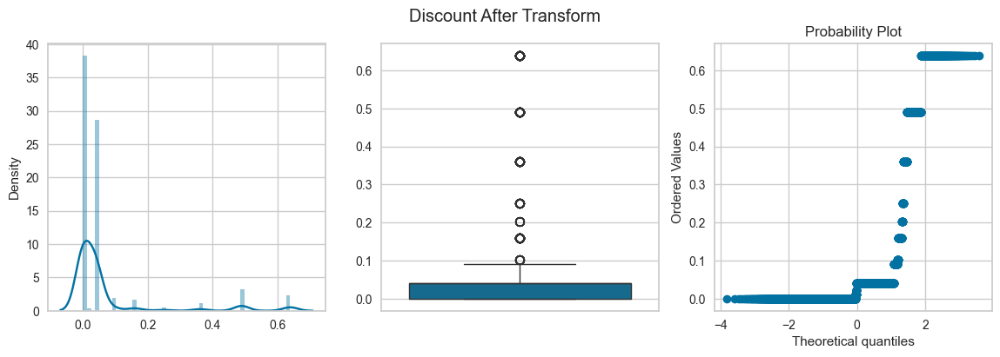

posx and posy should be finite values
posx and posy should be finite values


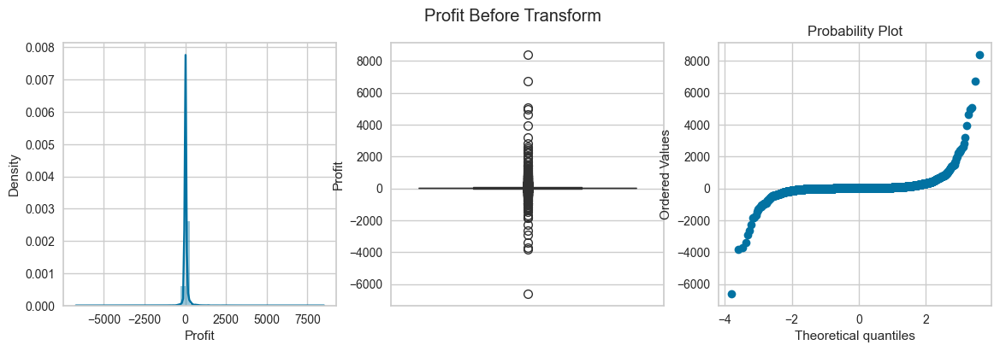

posx and posy should be finite values
posx and posy should be finite values


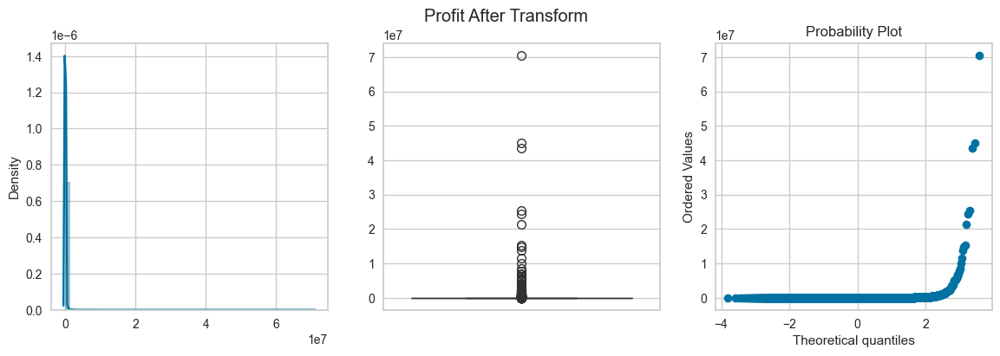

posx and posy should be finite values
posx and posy should be finite values


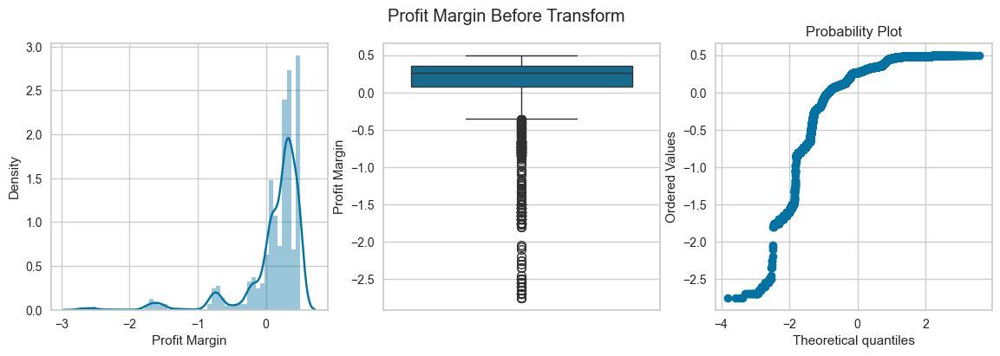

posx and posy should be finite values
posx and posy should be finite values


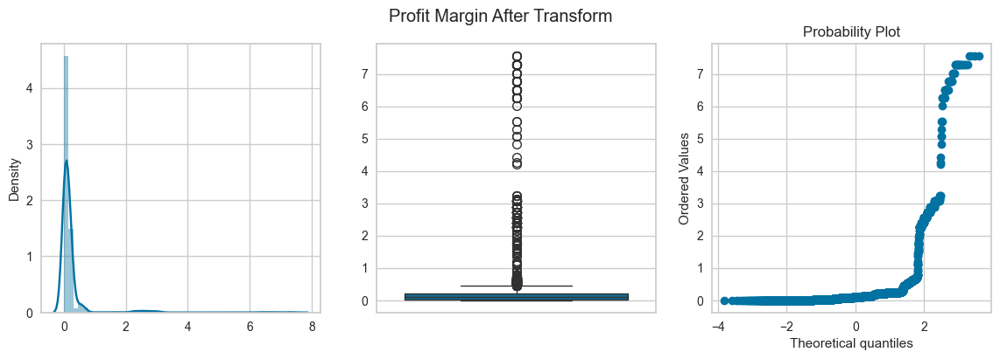

posx and posy should be finite values
posx and posy should be finite values


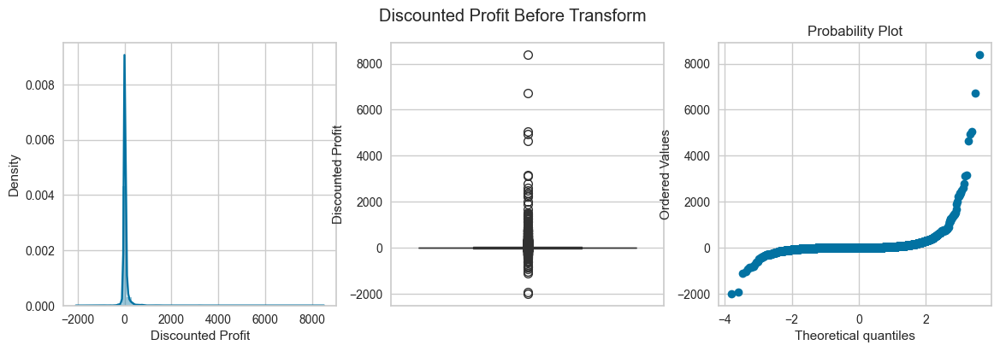

posx and posy should be finite values
posx and posy should be finite values


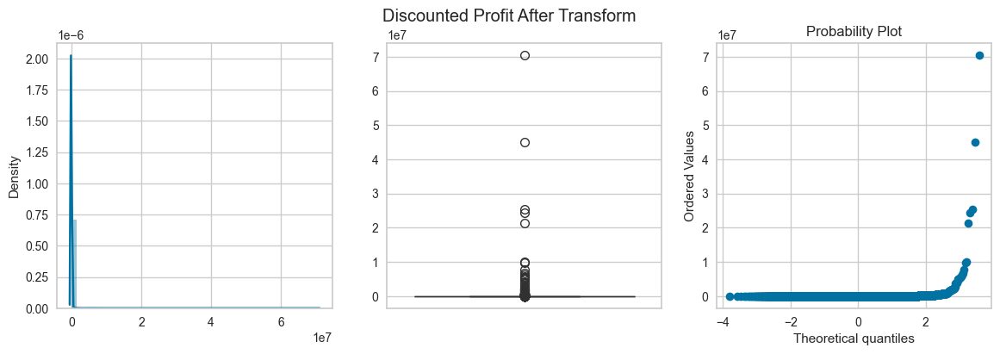

posx and posy should be finite values
posx and posy should be finite values


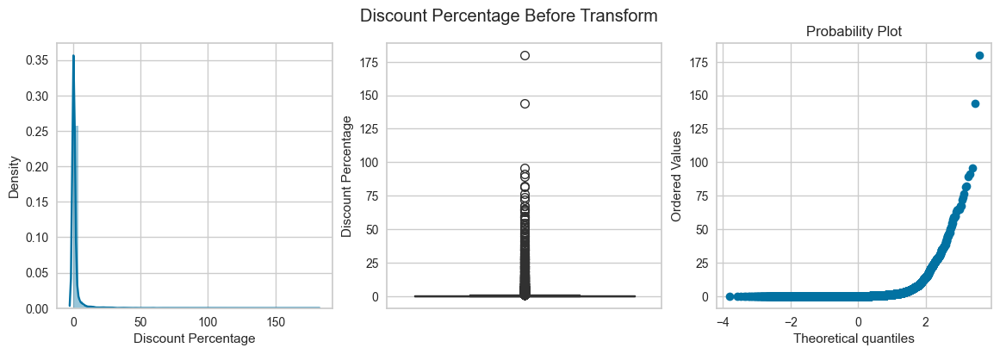

posx and posy should be finite values
posx and posy should be finite values


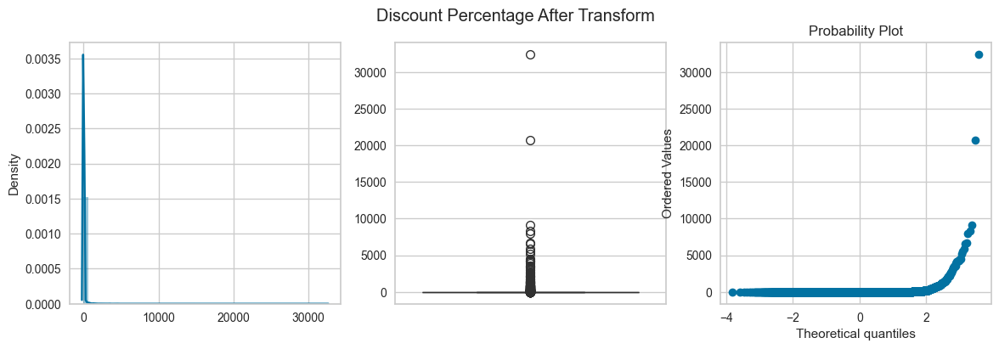

posx and posy should be finite values
posx and posy should be finite values


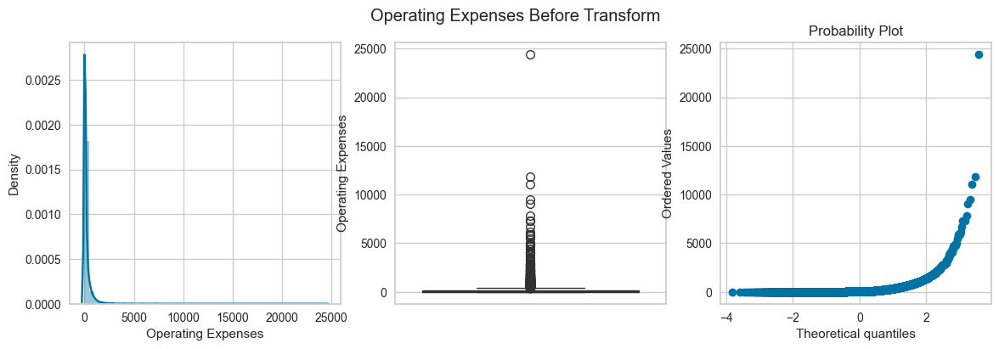

posx and posy should be finite values
posx and posy should be finite values


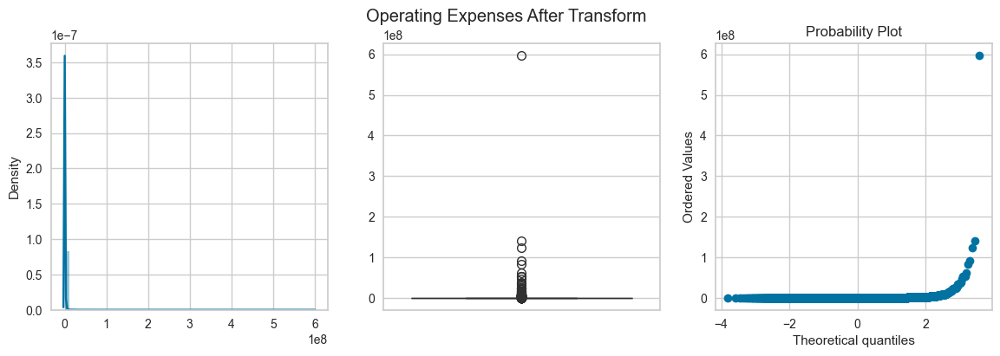

posx and posy should be finite values
posx and posy should be finite values


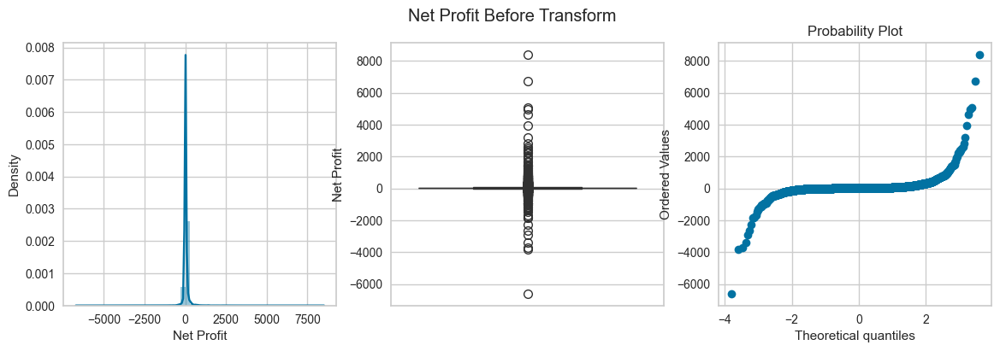

posx and posy should be finite values
posx and posy should be finite values


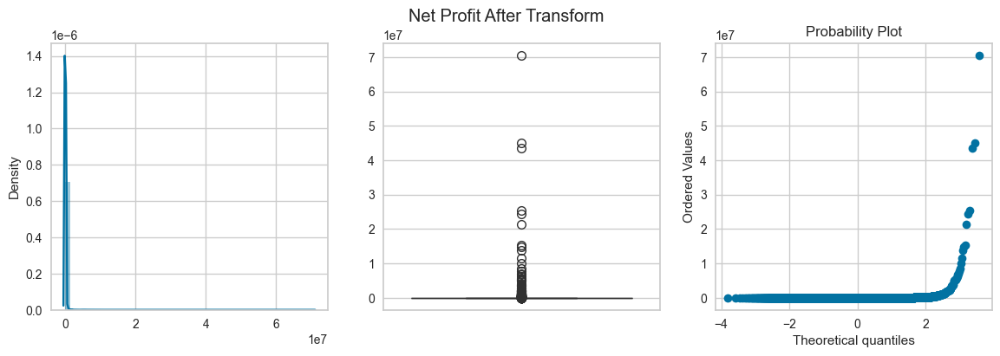

posx and posy should be finite values
posx and posy should be finite values


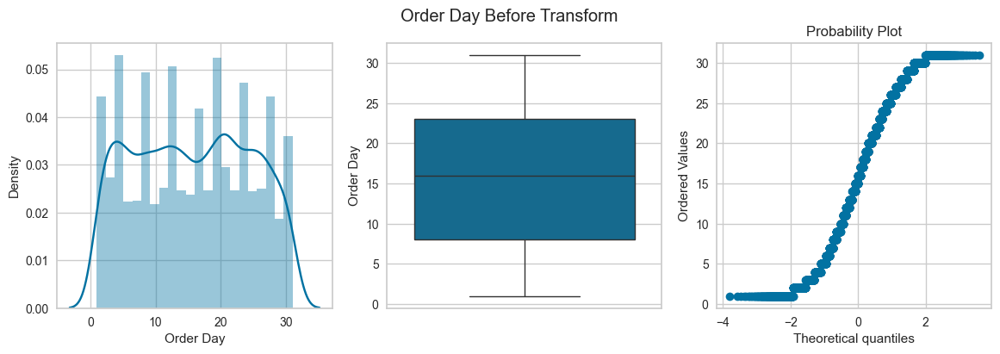

posx and posy should be finite values
posx and posy should be finite values


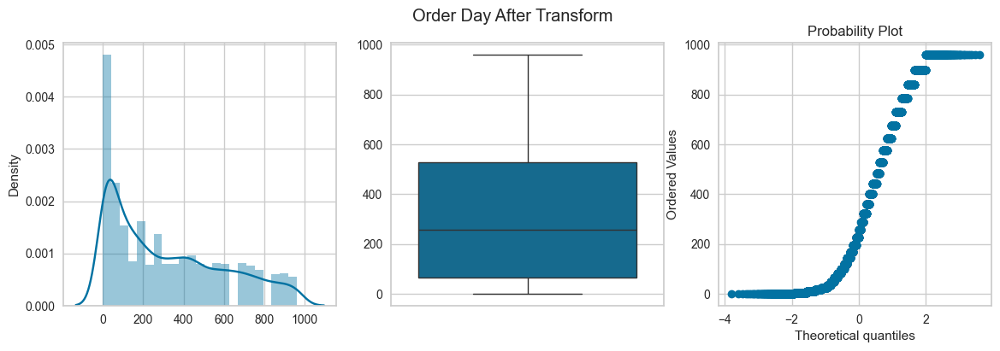

posx and posy should be finite values
posx and posy should be finite values


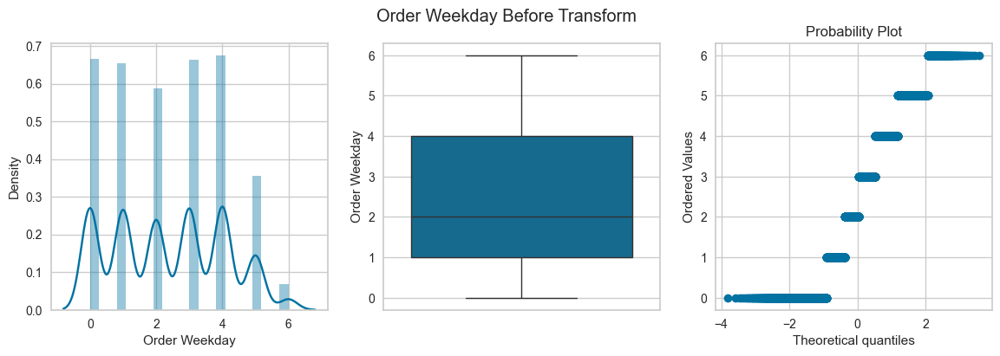

posx and posy should be finite values
posx and posy should be finite values


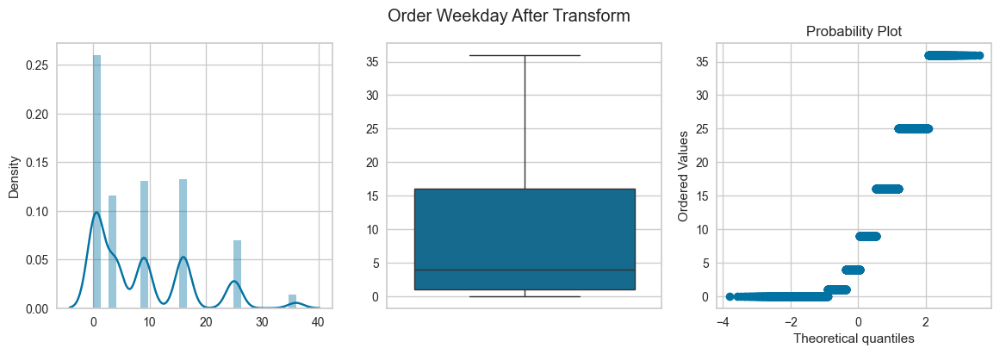

posx and posy should be finite values
posx and posy should be finite values


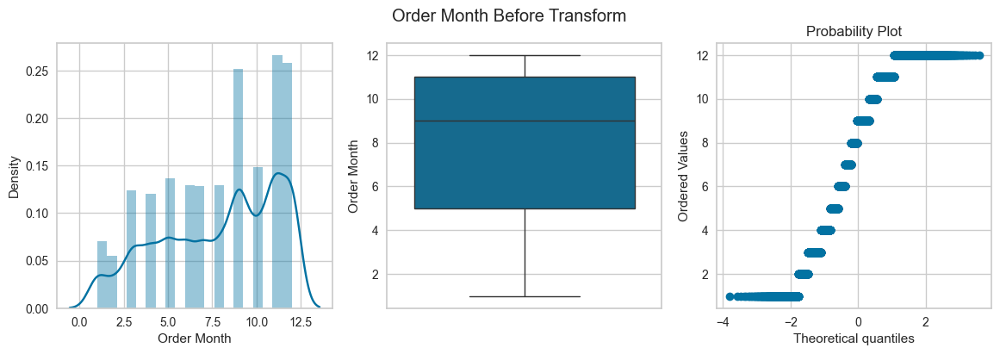

posx and posy should be finite values
posx and posy should be finite values


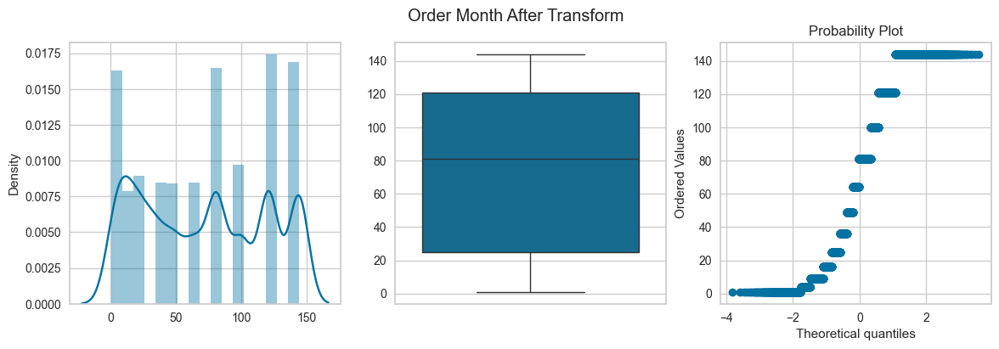

posx and posy should be finite values
posx and posy should be finite values


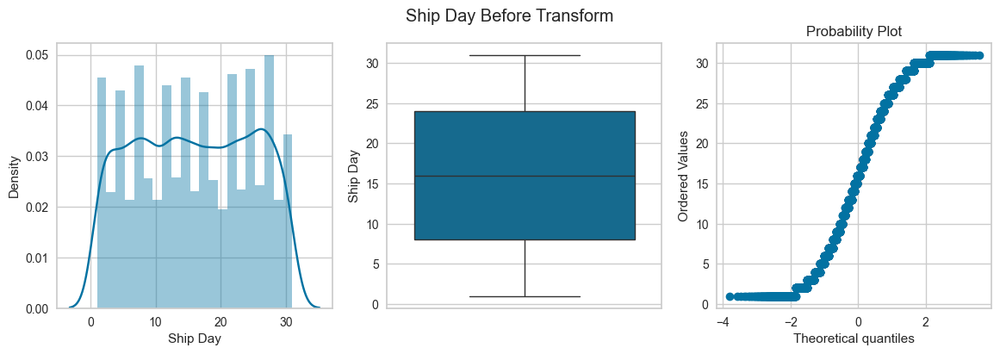

posx and posy should be finite values
posx and posy should be finite values


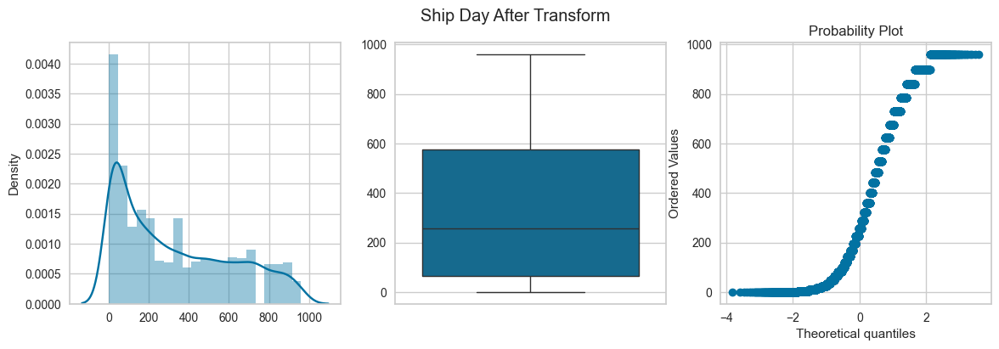

In [61]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.square))

posx and posy should be finite values
posx and posy should be finite values


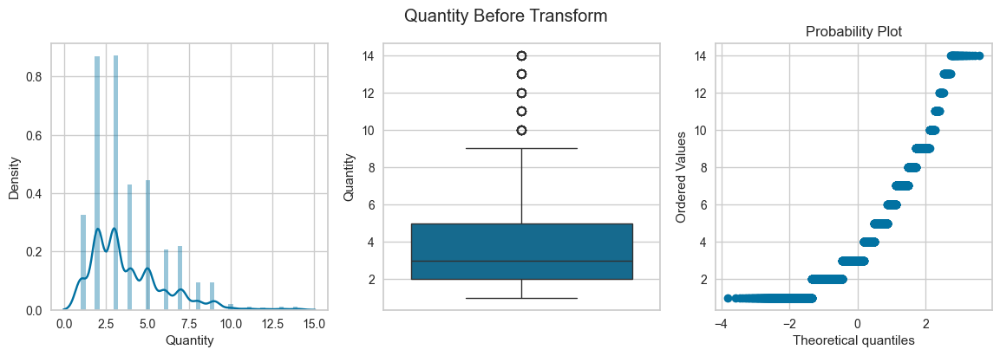

posx and posy should be finite values
posx and posy should be finite values


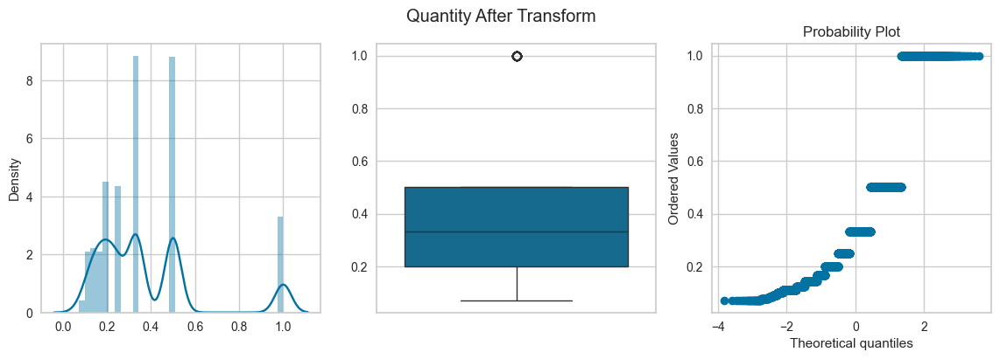

posx and posy should be finite values
posx and posy should be finite values


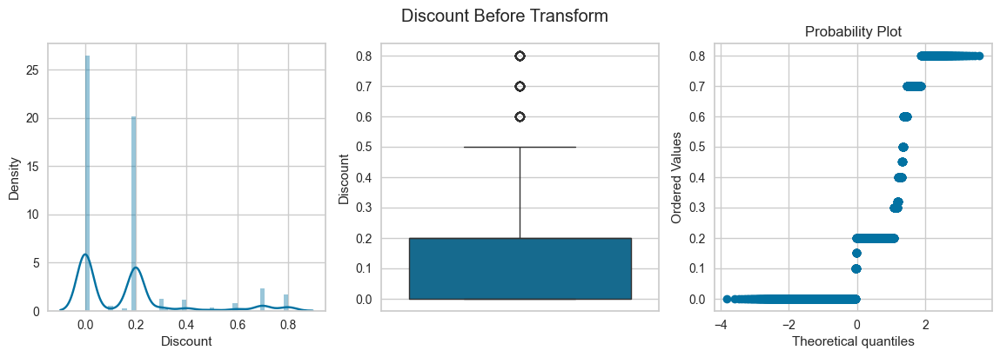

posx and posy should be finite values
posx and posy should be finite values


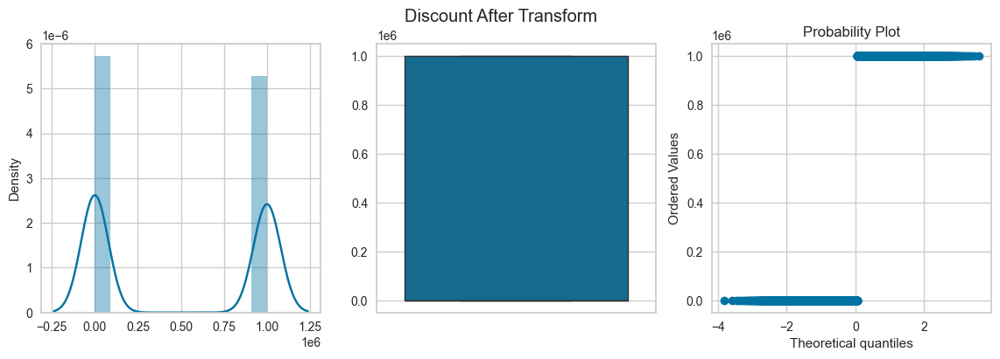

posx and posy should be finite values
posx and posy should be finite values


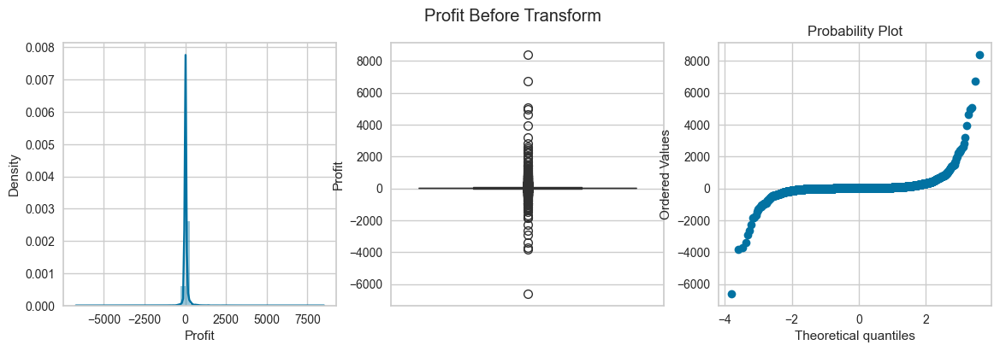

posx and posy should be finite values
posx and posy should be finite values


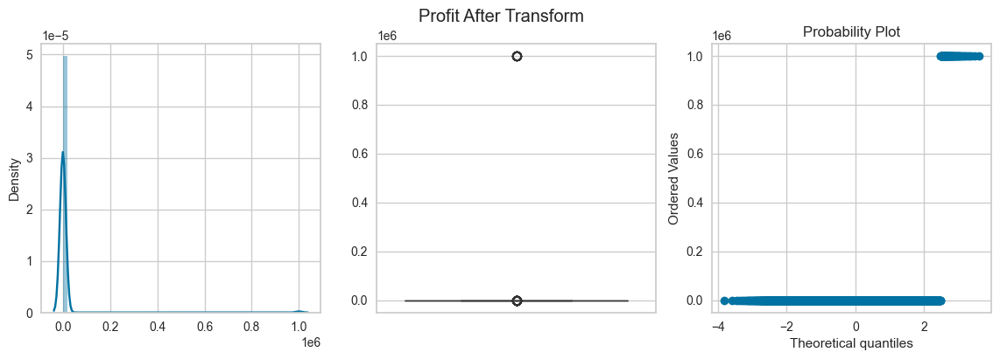

posx and posy should be finite values
posx and posy should be finite values


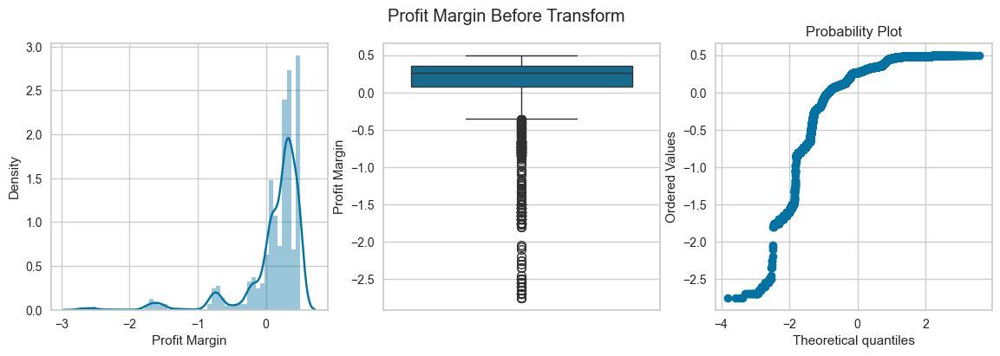

posx and posy should be finite values
posx and posy should be finite values


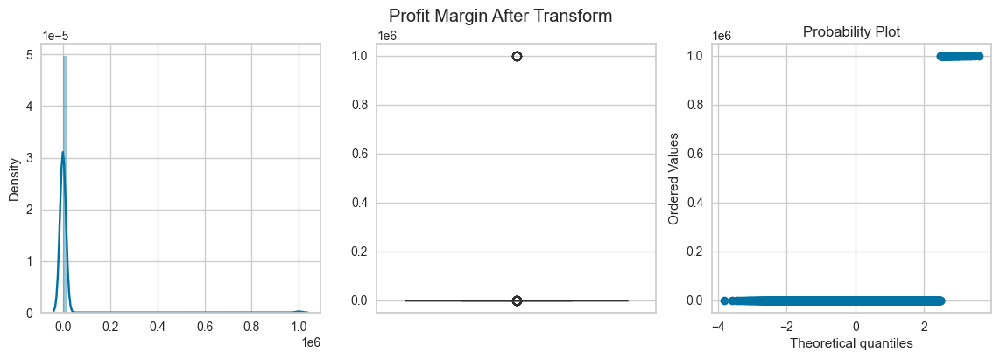

posx and posy should be finite values
posx and posy should be finite values


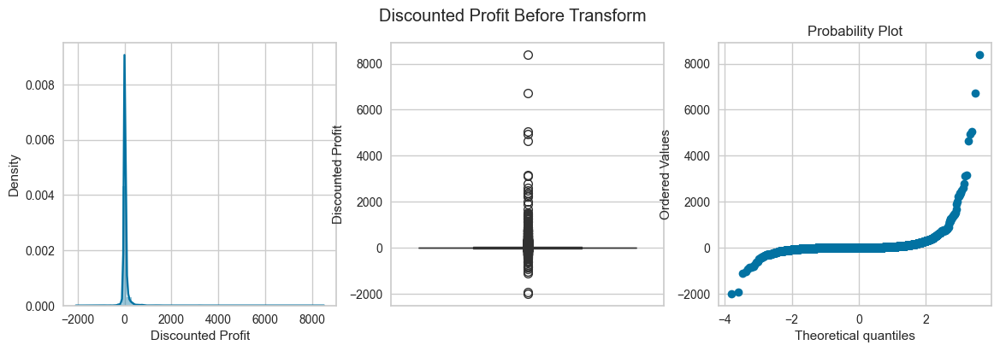

posx and posy should be finite values
posx and posy should be finite values


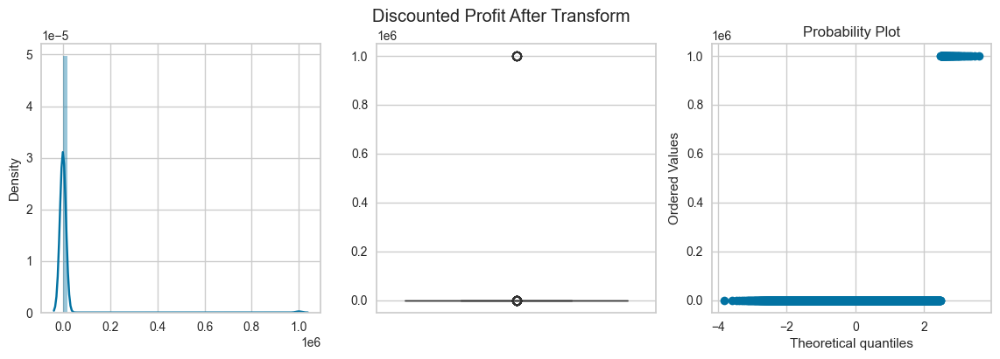

posx and posy should be finite values
posx and posy should be finite values


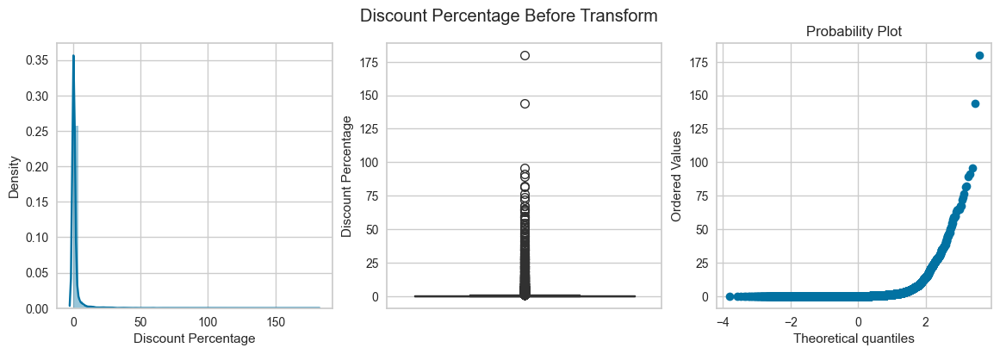

posx and posy should be finite values
posx and posy should be finite values


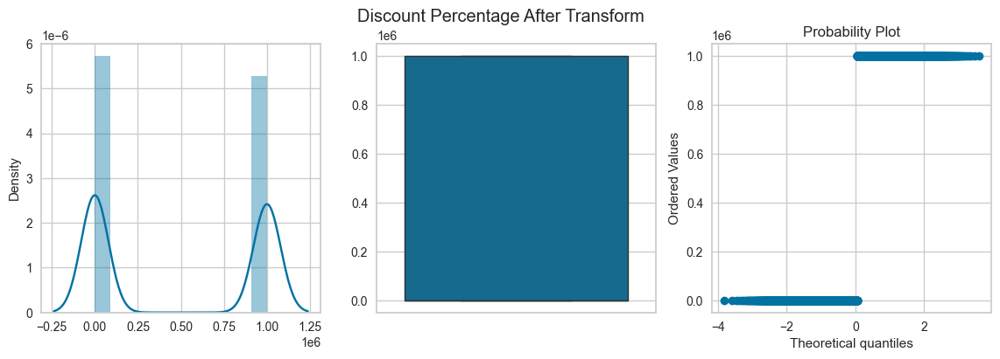

posx and posy should be finite values
posx and posy should be finite values


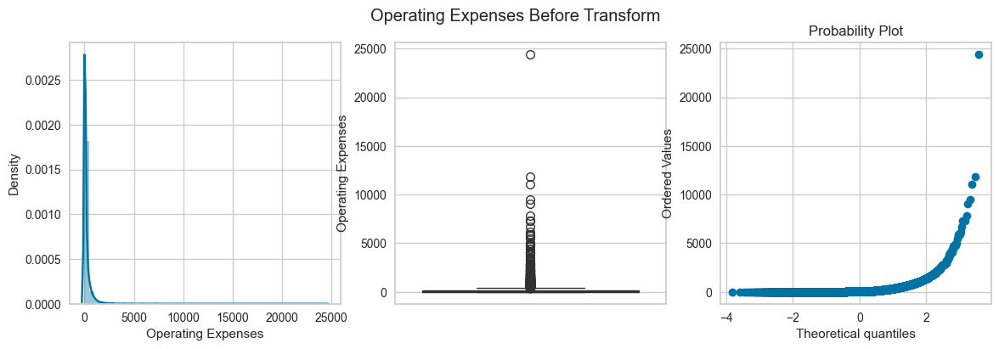

posx and posy should be finite values
posx and posy should be finite values


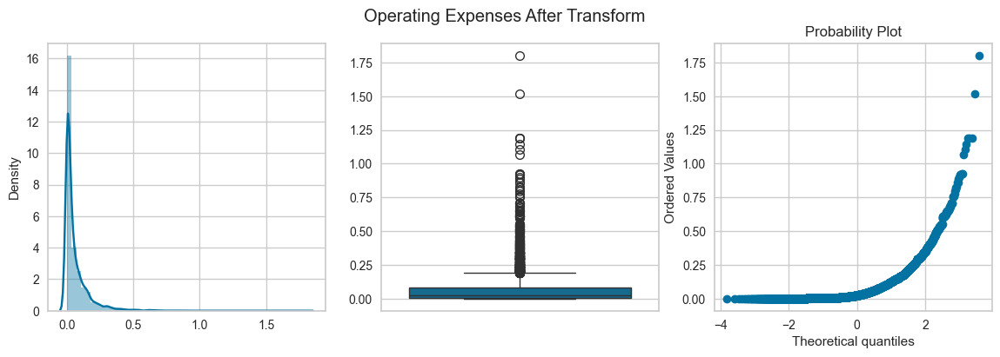

posx and posy should be finite values
posx and posy should be finite values


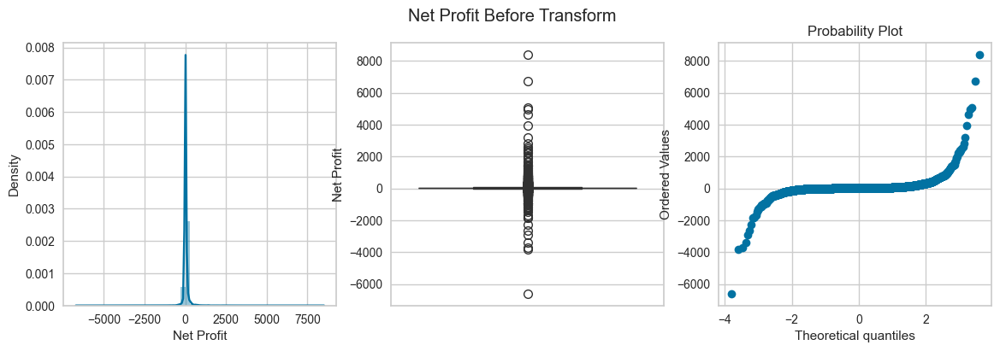

posx and posy should be finite values
posx and posy should be finite values


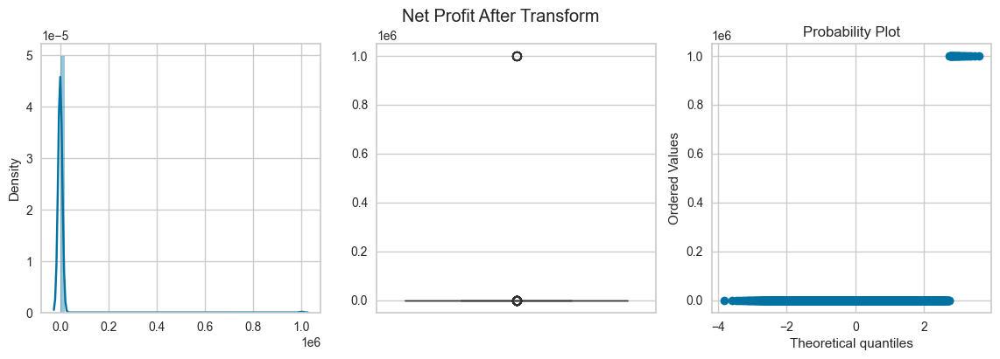

posx and posy should be finite values
posx and posy should be finite values


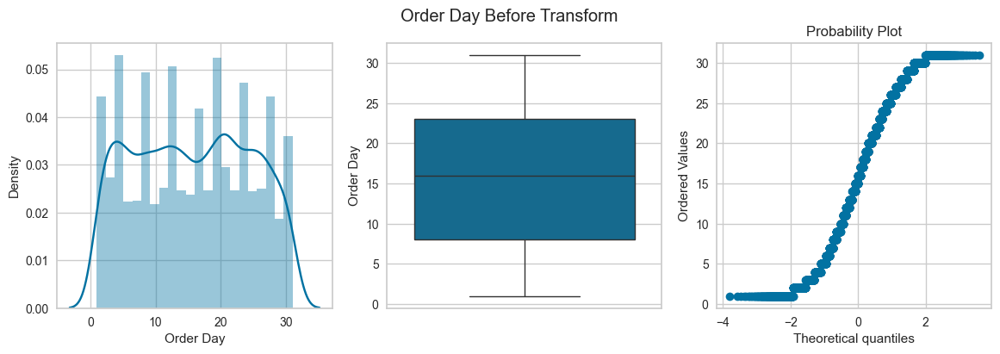

posx and posy should be finite values
posx and posy should be finite values


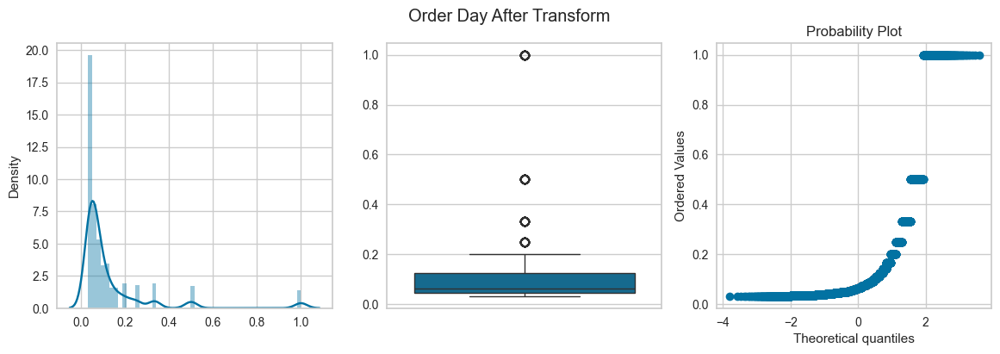

posx and posy should be finite values
posx and posy should be finite values


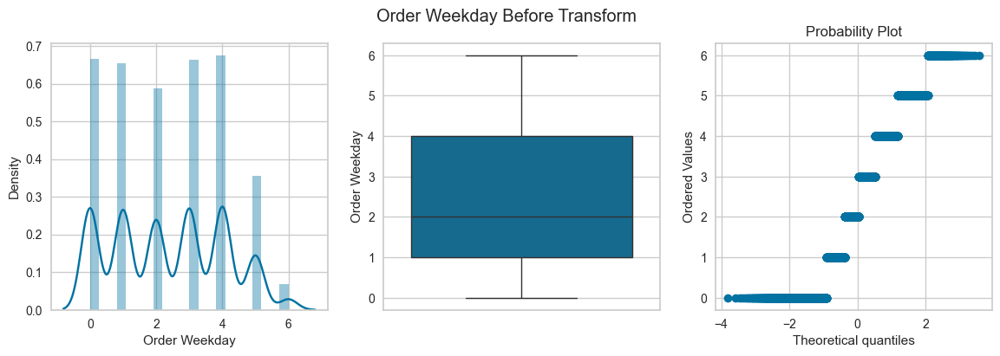

posx and posy should be finite values
posx and posy should be finite values


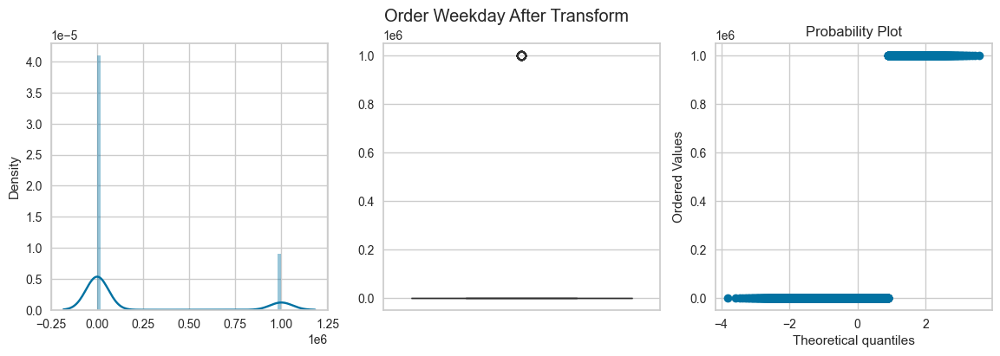

posx and posy should be finite values
posx and posy should be finite values


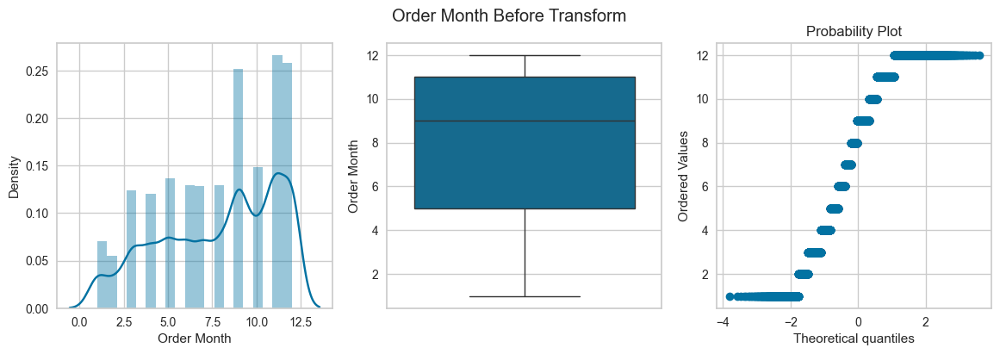

posx and posy should be finite values
posx and posy should be finite values


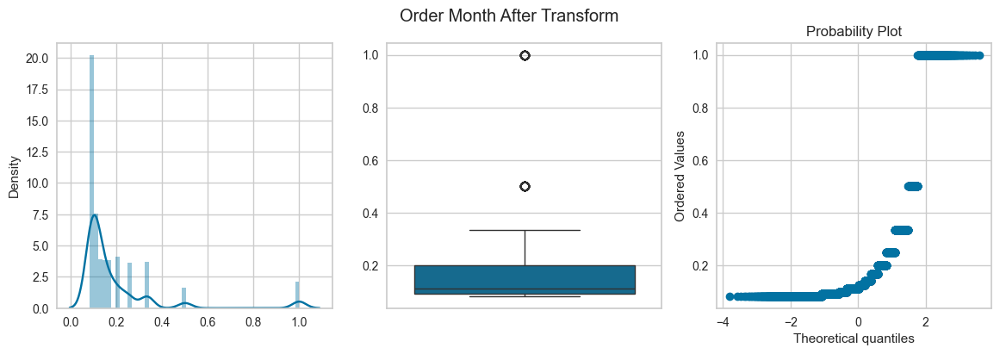

posx and posy should be finite values
posx and posy should be finite values


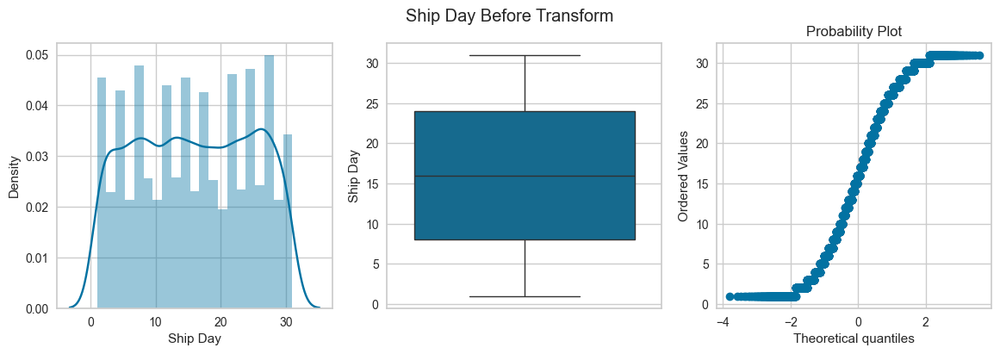

posx and posy should be finite values
posx and posy should be finite values


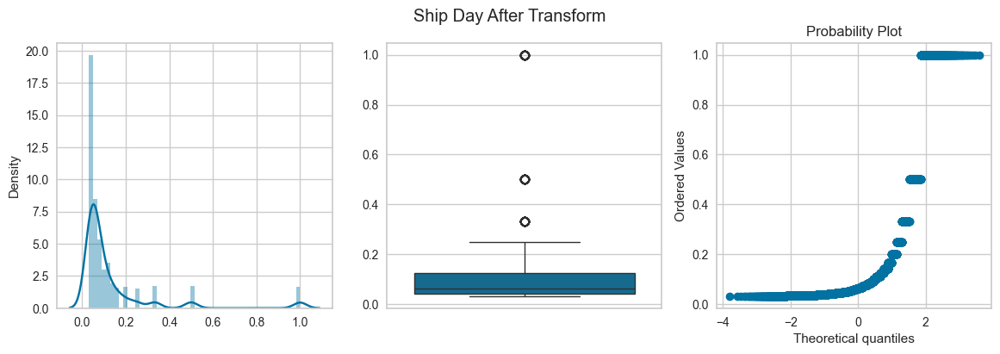

In [62]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(lambda x: 1/(x+0.000001)))

posx and posy should be finite values
posx and posy should be finite values


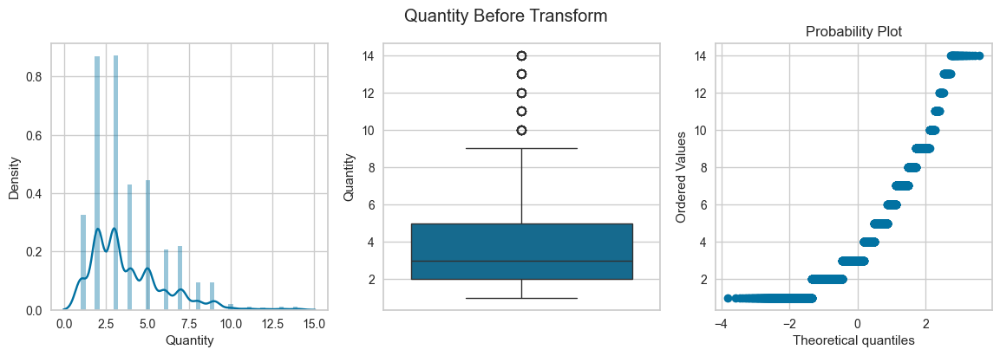

posx and posy should be finite values
posx and posy should be finite values


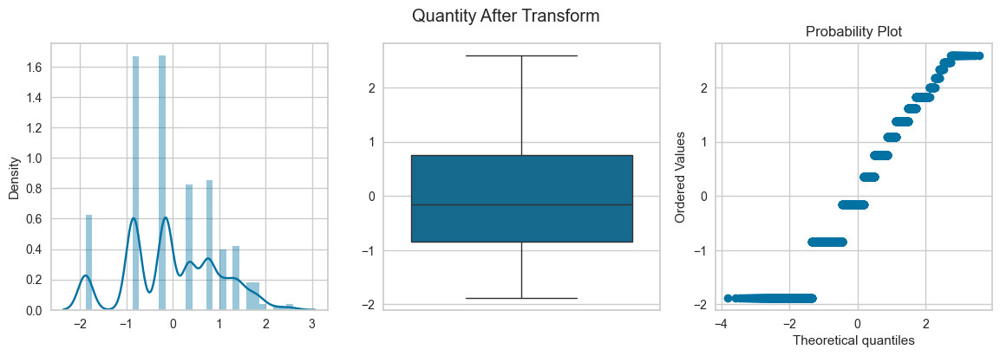

posx and posy should be finite values
posx and posy should be finite values


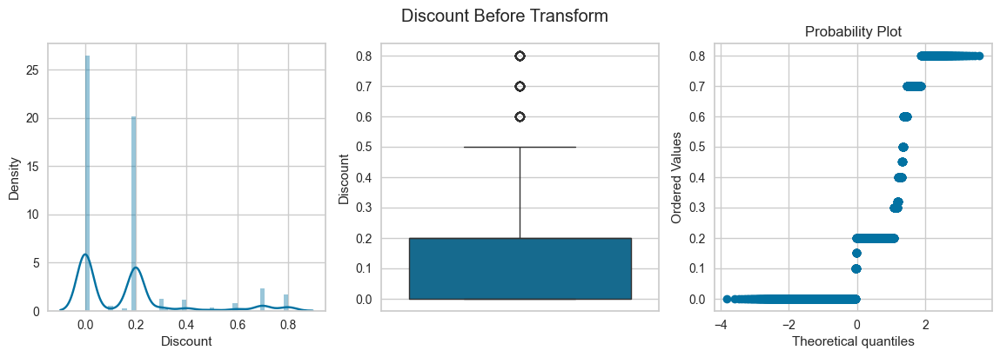

posx and posy should be finite values
posx and posy should be finite values


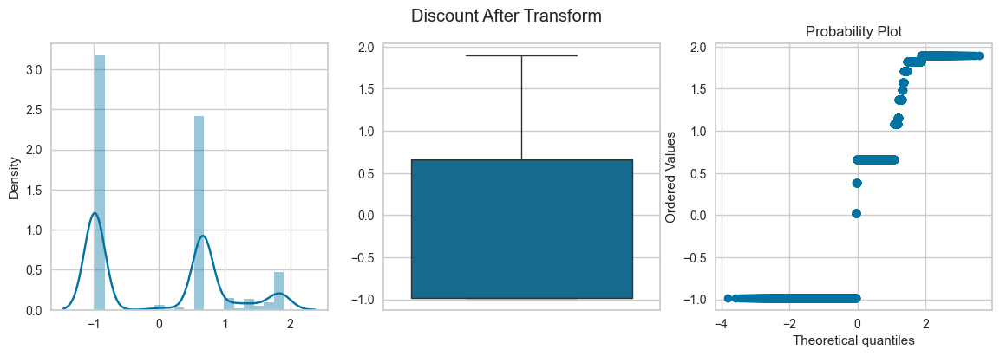

posx and posy should be finite values
posx and posy should be finite values


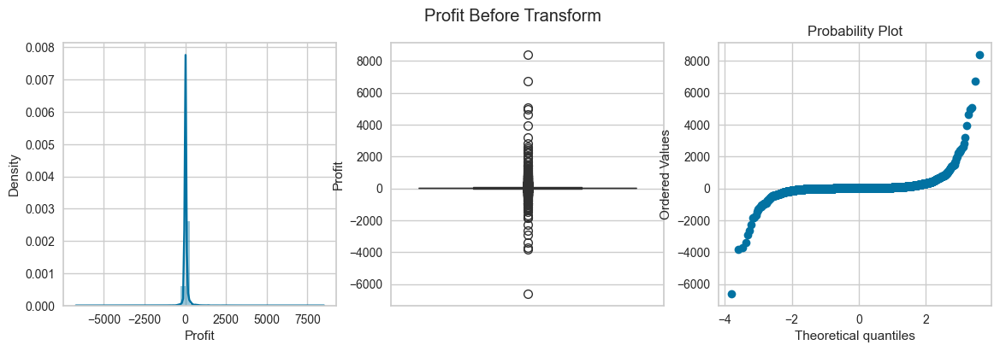

posx and posy should be finite values
posx and posy should be finite values


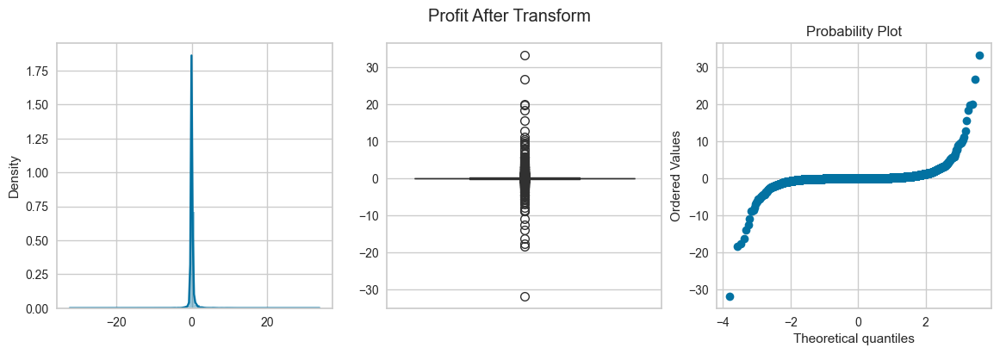

posx and posy should be finite values
posx and posy should be finite values


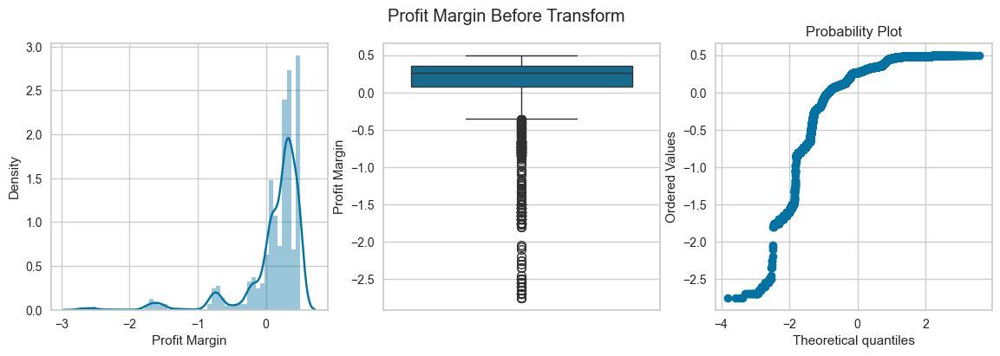

posx and posy should be finite values
posx and posy should be finite values


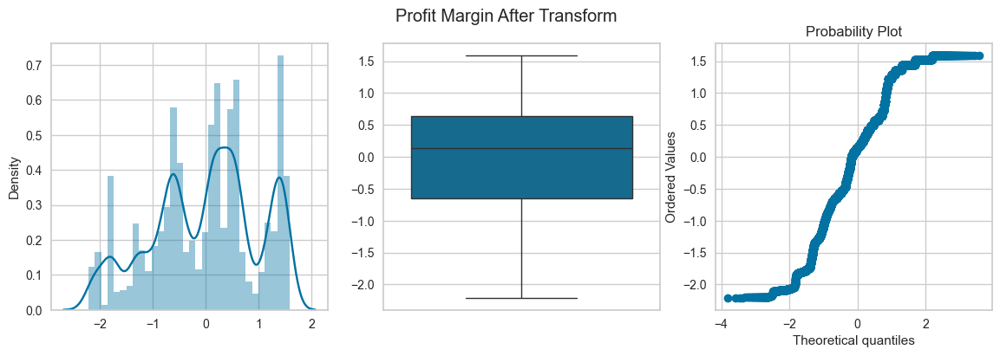

posx and posy should be finite values
posx and posy should be finite values


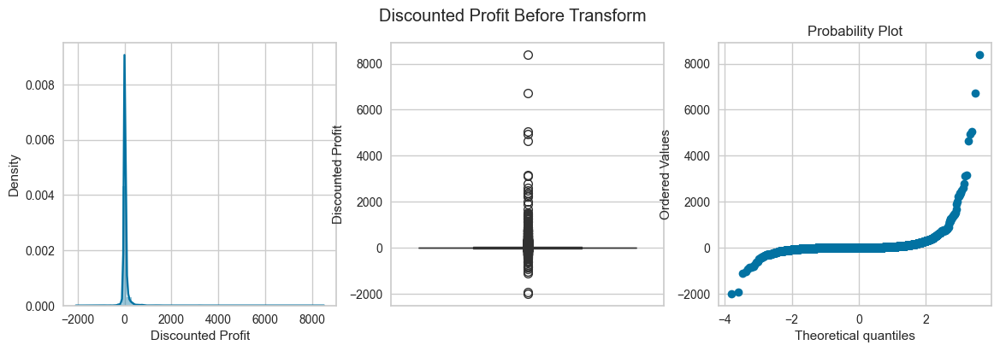

posx and posy should be finite values
posx and posy should be finite values


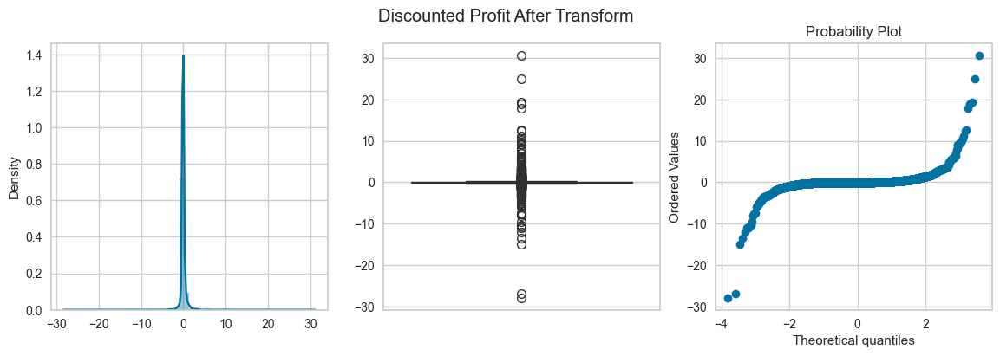

posx and posy should be finite values
posx and posy should be finite values


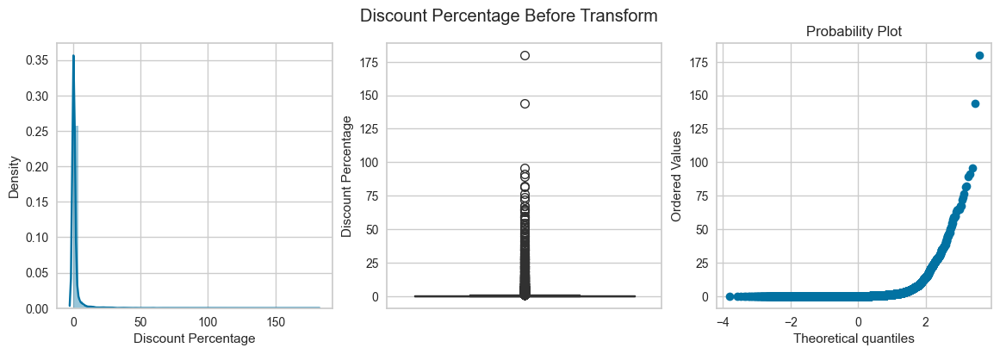

posx and posy should be finite values
posx and posy should be finite values


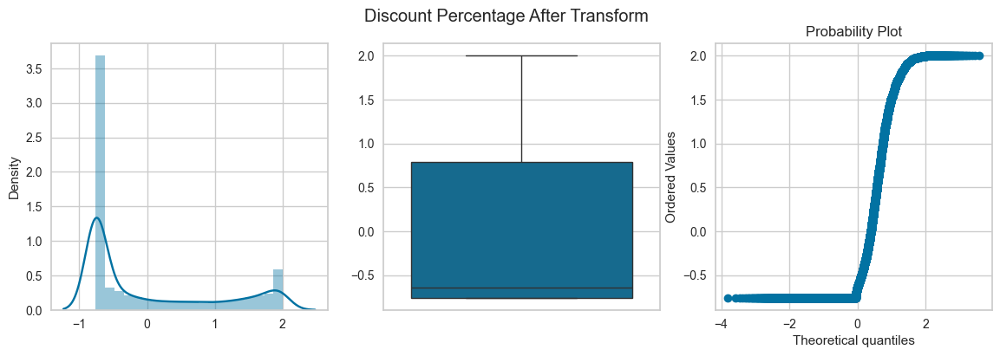

posx and posy should be finite values
posx and posy should be finite values


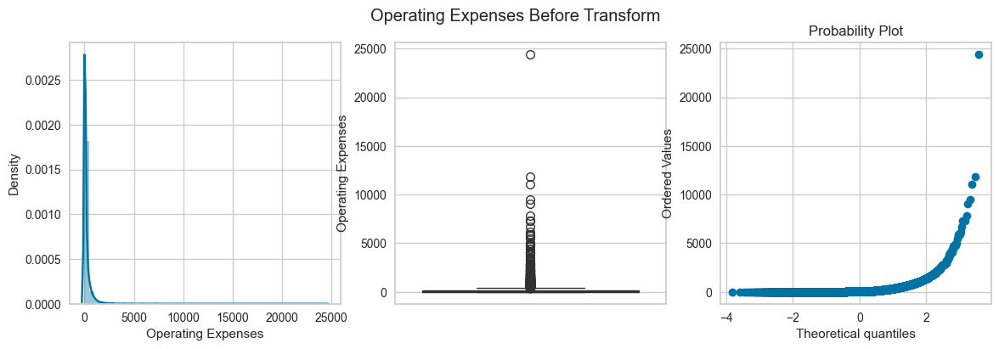

posx and posy should be finite values
posx and posy should be finite values


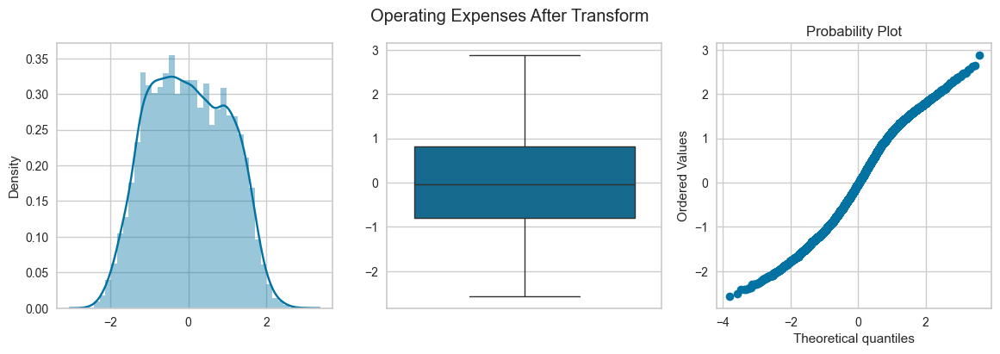

posx and posy should be finite values
posx and posy should be finite values


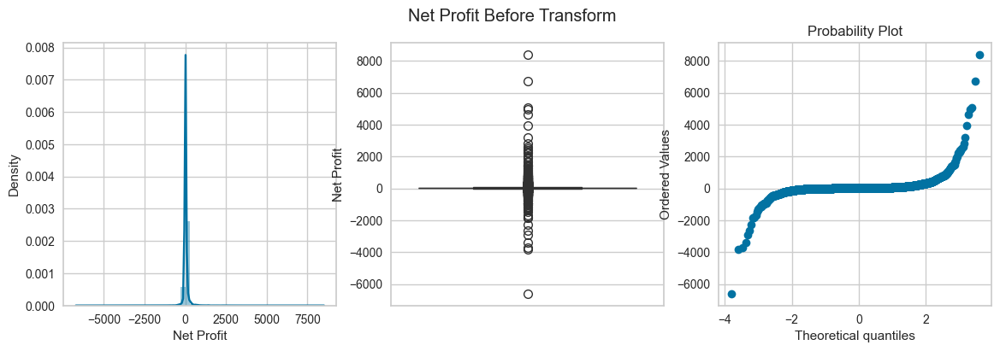

posx and posy should be finite values
posx and posy should be finite values


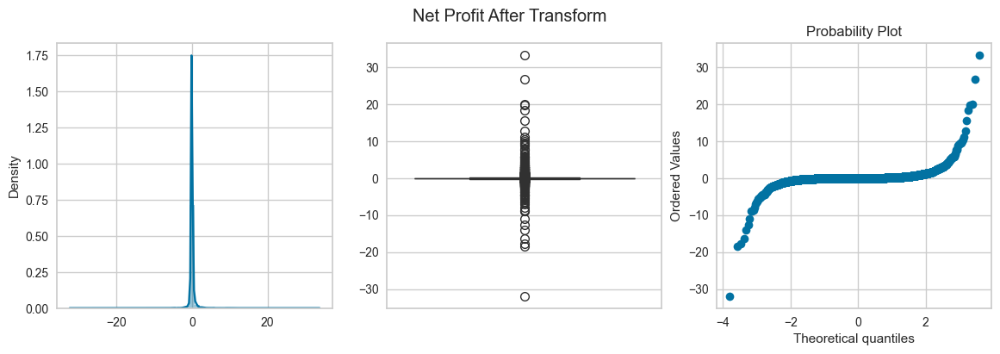

posx and posy should be finite values
posx and posy should be finite values


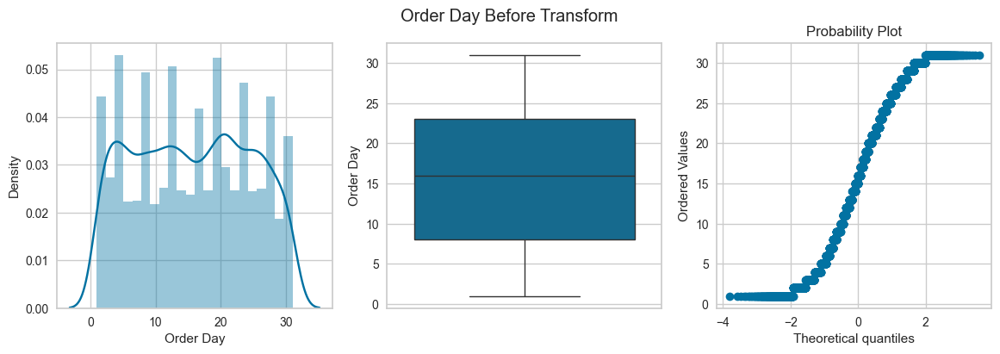

posx and posy should be finite values
posx and posy should be finite values


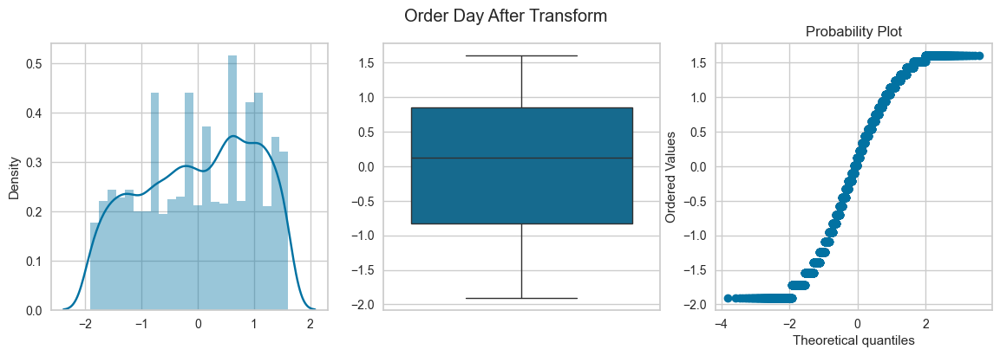

posx and posy should be finite values
posx and posy should be finite values


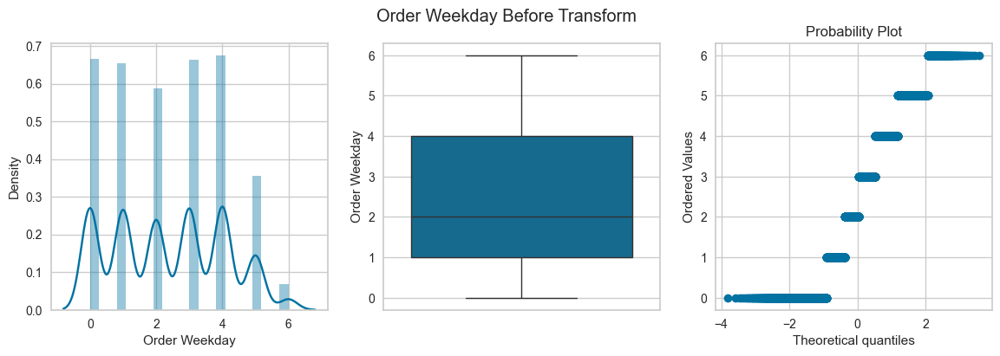

posx and posy should be finite values
posx and posy should be finite values


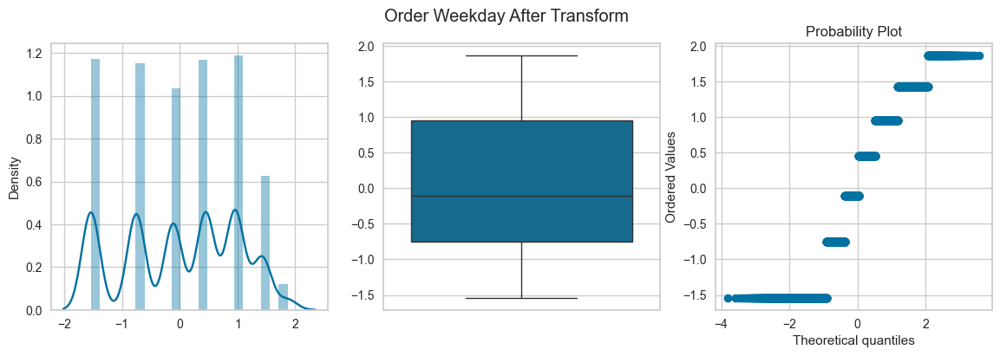

posx and posy should be finite values
posx and posy should be finite values


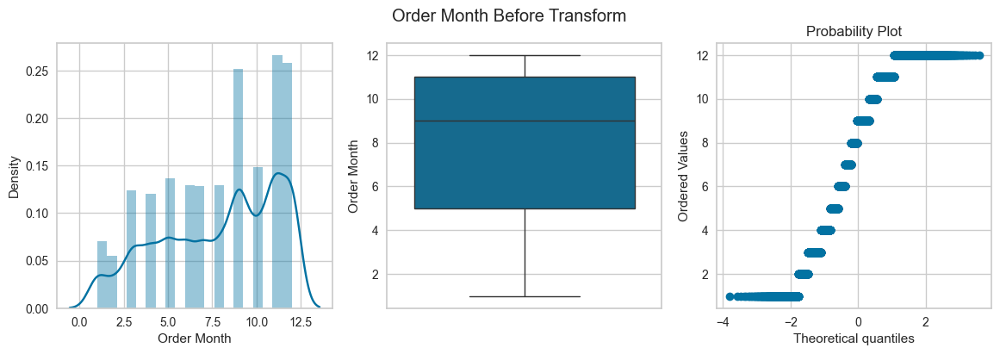

posx and posy should be finite values
posx and posy should be finite values


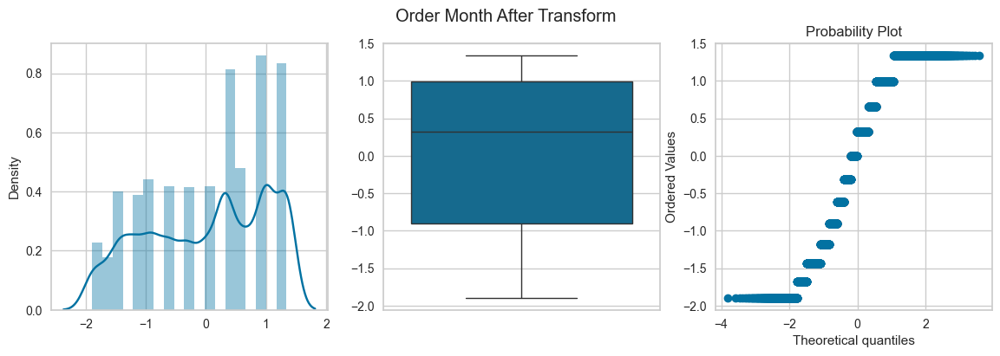

posx and posy should be finite values
posx and posy should be finite values


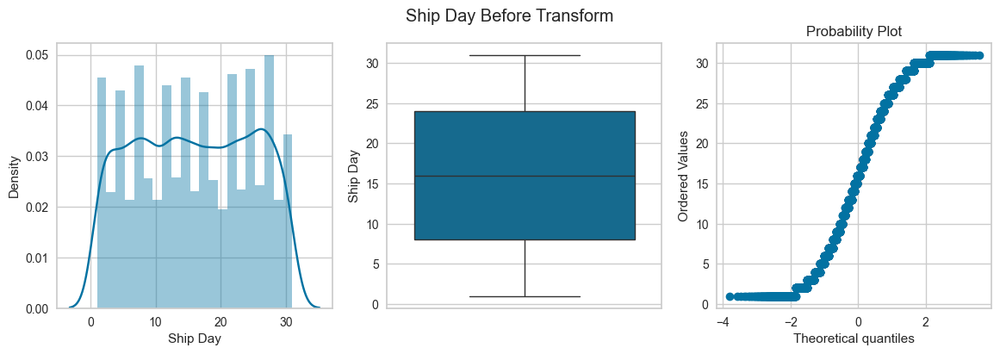

posx and posy should be finite values
posx and posy should be finite values


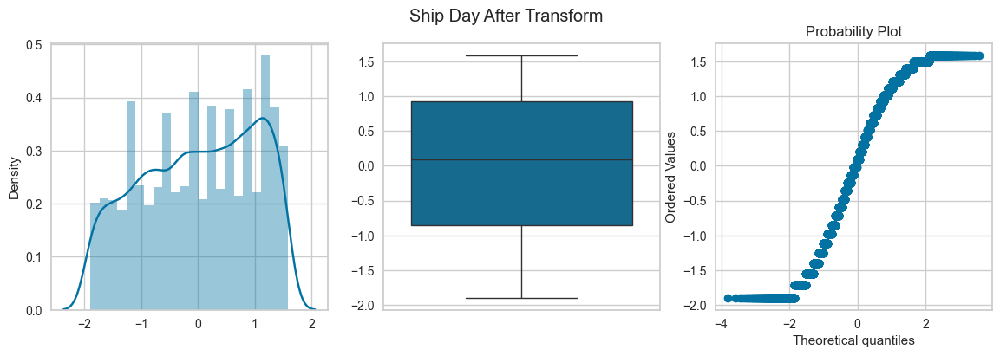

In [63]:
for col in skewed_cols:
    apply_transform(df,col,PowerTransformer())

Quantity: Log Transform <br>
Discount: Sqrt Transform <br>
Profit: Log Transform <br>
Profit Margin: Power Transform <br>
Discounted Profit: Log Transform <br>
Discount Percentage: Power Transform <br> 
Operating Expenses: Power Transform <br>
Net Profit: Log Transform 

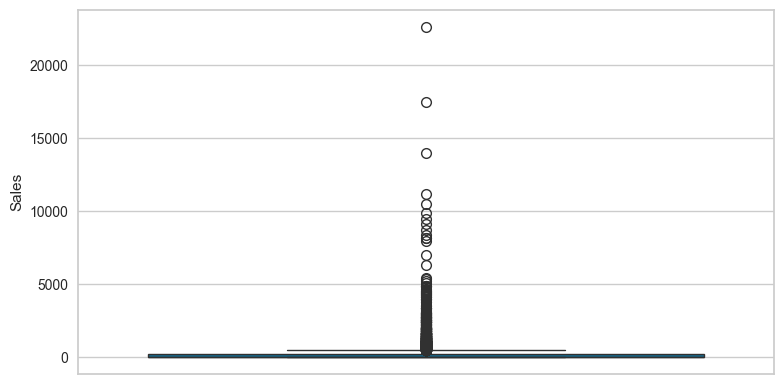

In [64]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

In [65]:
for idx in list(df[df['Sales'] > 10500].index):
    df.drop(idx,axis=0,inplace=True)

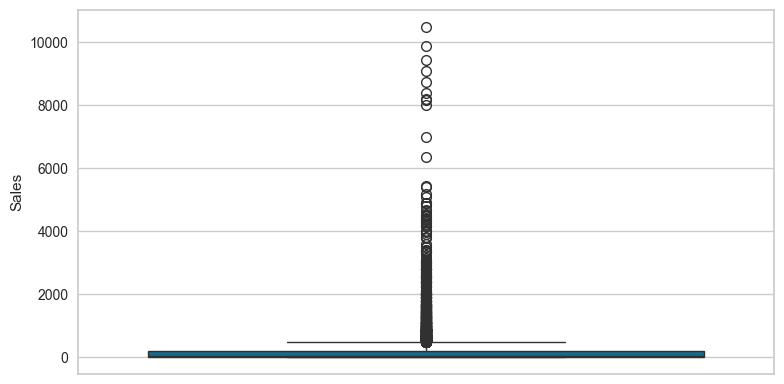

In [66]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Splitting

In [67]:
df.isnull().sum()

Postal Code                                                               1
Sales                                                                     1
Quantity                                                                  1
Discount                                                                  1
Profit                                                                    1
                                                                         ..
Product Name_Logitech 910-002974 M325 Wireless Mouse for Web Scrolling    0
Product Name_Situations Contoured Folding Chairs, 4/Set                   0
Product Name_Staples                                                      0
Product Name_Storex Dura Pro Binders                                      0
Product Name_infrequent_sklearn                                           0
Length: 67, dtype: int64

In [68]:
df = df.dropna()
df.shape

(9988, 67)

In [69]:
X = df.drop('Sales',axis=1)
y = df['Sales']

In [70]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Feature Selection

In [71]:
X_train.shape, X_test.shape

((6991, 66), (2997, 66))

In [72]:
X_train.shape, X_test.shape

((6991, 66), (2997, 66))

In [73]:
kbest = SelectKBest(k=10,score_func=f_regression)
kbest.fit(X_train,y_train)

SelectKBest(score_func=<function f_regression at 0x0000020548D3C0E0>)

In [74]:
selected_features = kbest.get_feature_names_out()
selected_features

array(['Quantity', 'Profit', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'Net Profit', 'Category_Office Supplies',
       'Category_Technology', 'Sub-Category_Chairs',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [75]:
perc = SelectPercentile(percentile=20,score_func=f_regression)
perc.fit(X_train,y_train)

SelectPercentile(percentile=20,
                 score_func=<function f_regression at 0x0000020548D3C0E0>)

In [76]:
selected_features = perc.get_feature_names_out()
selected_features

array(['Quantity', 'Discount', 'Profit', 'Discounted Profit',
       'Discount Percentage', 'Operating Expenses', 'Net Profit',
       'Category_Office Supplies', 'Category_Technology',
       'Sub-Category_Binders', 'Sub-Category_Chairs',
       'Sub-Category_Paper', 'Sub-Category_infrequent_sklearn'],
      dtype=object)

In [77]:
ridge = SelectFromModel(estimator=Ridge(),max_features=10)
ridge.fit(X_train,y_train)

SelectFromModel(estimator=Ridge(), max_features=10)

In [78]:
selected_features = ridge.get_feature_names_out()
selected_features

array(['Discount', 'Profit', 'Operating Expenses', 'Net Profit'],
      dtype=object)

In [79]:
rf = SelectFromModel(estimator=RandomForestRegressor(),max_features=10)
rf.fit(X_train,y_train)

SelectFromModel(estimator=RandomForestRegressor(), max_features=10)

In [80]:
selected_features = rf.get_feature_names_out()
selected_features

array(['Profit', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'Net Profit'], dtype=object)

In [81]:
rfe = RFE(estimator=RandomForestRegressor(),n_features_to_select=10,step=5,verbose=1)
rfe.fit(X_train,y_train)

Fitting estimator with 66 features.
Fitting estimator with 61 features.
Fitting estimator with 56 features.
Fitting estimator with 51 features.
Fitting estimator with 46 features.
Fitting estimator with 41 features.
Fitting estimator with 36 features.
Fitting estimator with 31 features.
Fitting estimator with 26 features.
Fitting estimator with 21 features.
Fitting estimator with 16 features.
Fitting estimator with 11 features.


RFE(estimator=RandomForestRegressor(), n_features_to_select=10, step=5,
    verbose=1)

In [82]:
selected_features = rfe.get_feature_names_out()
selected_features

array(['Postal Code', 'Discount', 'Profit', 'Profit Margin',
       'Discounted Profit', 'Discount Percentage', 'Operating Expenses',
       'Net Profit', 'Order Day', 'Ship Weekday'], dtype=object)

In [83]:
sfs = SequentialFeatureSelector(estimator=Ridge(),n_features_to_select=10,direction='backward')
sfs.fit(X_train,y_train)

SequentialFeatureSelector(direction='backward', estimator=Ridge(),
                          n_features_to_select=10)

In [84]:
selected_features = sfs.get_feature_names_out()
selected_features

array(['Profit', 'Operating Expenses',
       'Product Name_Global High-Back Leather Tilter, Burgundy',
       "Product Name_Global Wood Trimmed Manager's Task Chair, Khaki",
       'Product Name_KI Adjustable-Height Table',
       'Product Name_Logitech 910-002974 M325 Wireless Mouse for Web Scrolling',
       'Product Name_Situations Contoured Folding Chairs, 4/Set',
       'Product Name_Staples', 'Product Name_Storex Dura Pro Binders',
       'Product Name_infrequent_sklearn'], dtype=object)

In [85]:
xgb = XGBRegressor()
xgb.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [86]:
def plot_feature_importances(feat_imp_type: str):
    feat_imps = xgb.get_booster().get_score(importance_type=feat_imp_type)
    keys = list(feat_imps.keys())[:10]
    values = list(feat_imps.values())[:10]
    feat_imps_df = pd.DataFrame(data=values, index=keys, columns=["Importance"]).sort_values(by="Importance", ascending=False).reset_index()
    feat_imps_df.rename({'index': 'Feature'},axis=1,inplace=True)
    plt.figure(figsize=(12,8))
    fig = sns.barplot(x='Importance',y='Feature',data=feat_imps_df,orient='horizontal',palette='viridis')
    plt.title(f"{feat_imp_type.title()} Feature Importance")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect();

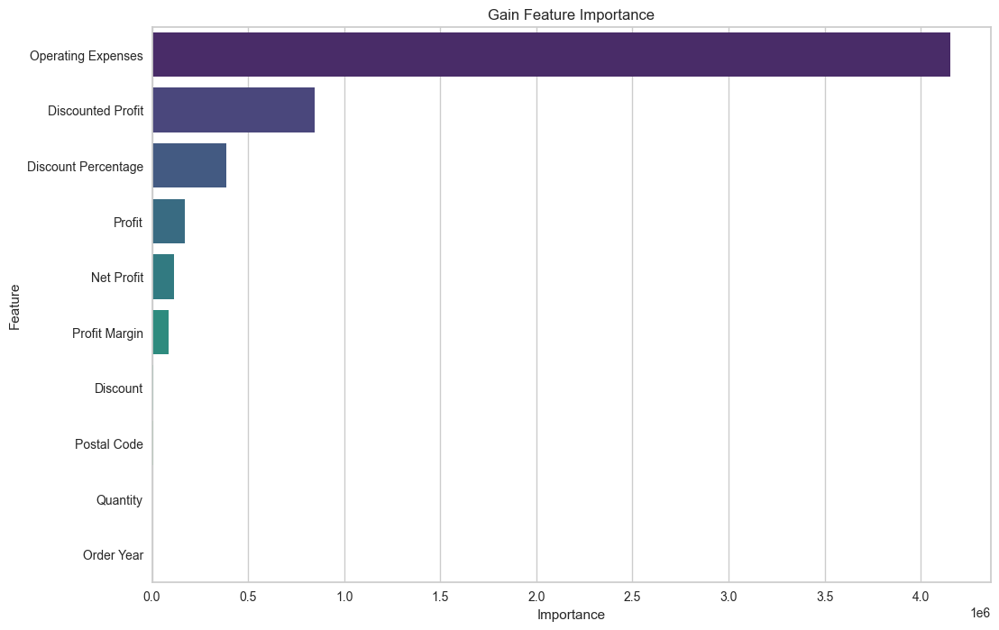

In [87]:
plot_feature_importances('gain')

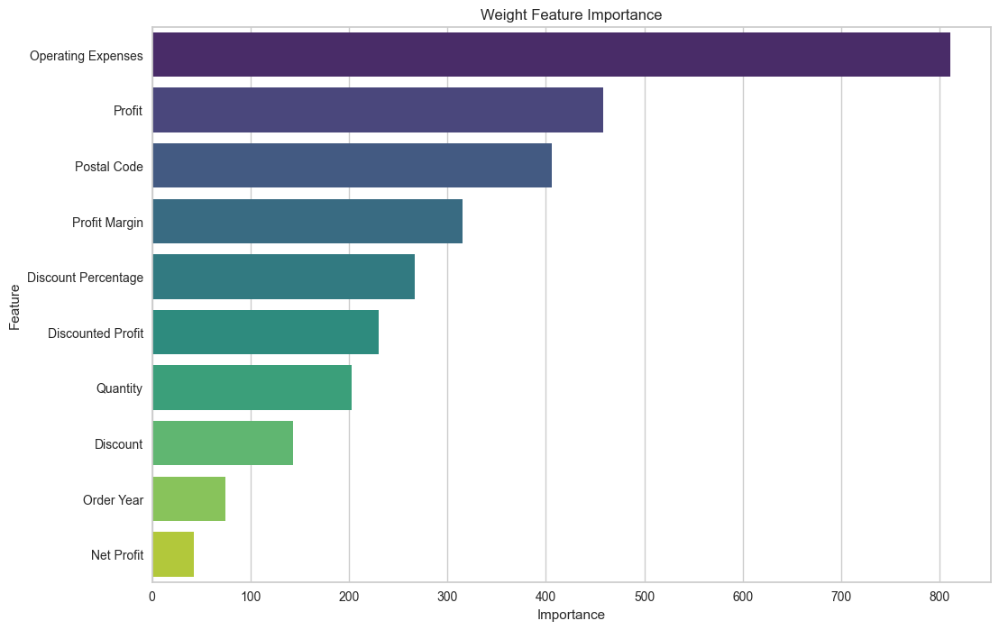

In [88]:
plot_feature_importances('weight')

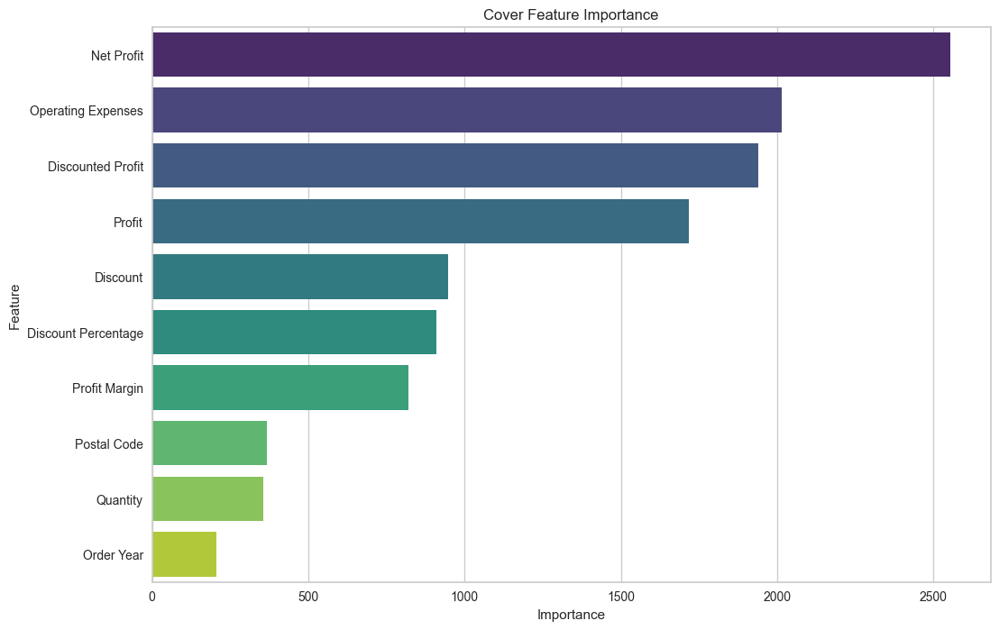

In [89]:
plot_feature_importances('cover')

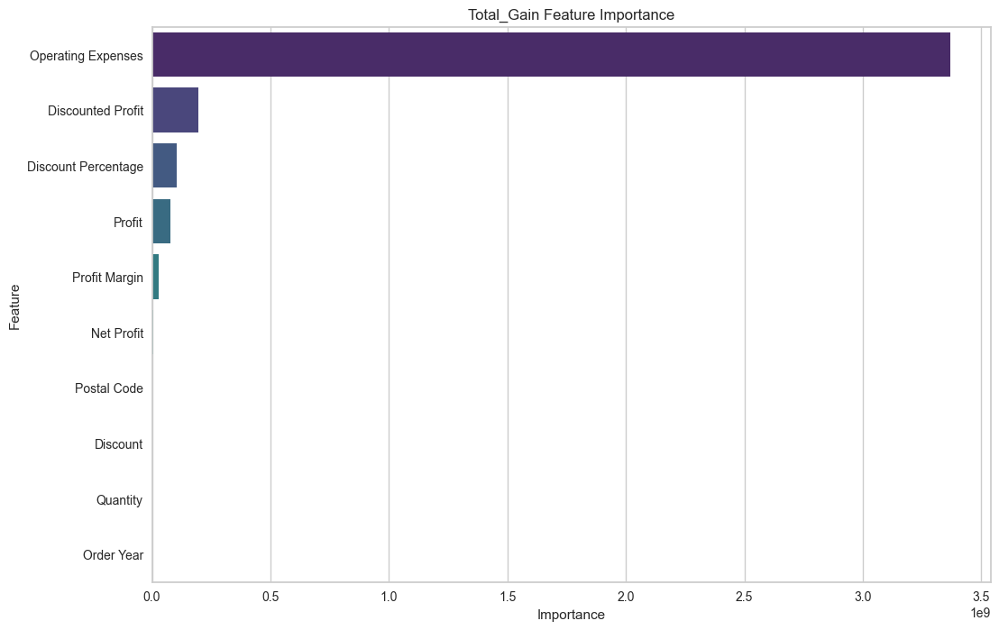

In [90]:
plot_feature_importances('total_gain')

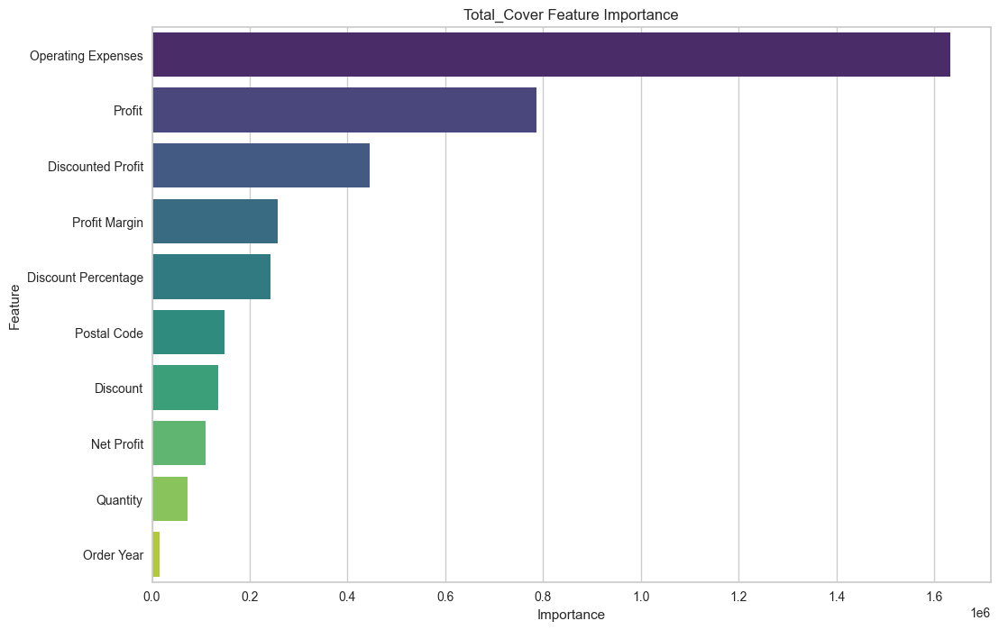

In [91]:
plot_feature_importances('total_cover')

In [200]:
final_selected_features = ['Profit',
                           'Discount Percentage',
                           'Postal Code',
                           'Discount',
                           'Order Day',
                           'Order Month',
                           'Quantity',
                           'Operating Expenses',
                           'Ship Day',
                           'Order Weekday']

df = df[final_selected_features]

final_X_train = X_train[final_selected_features]
final_X_test = X_test[final_selected_features]

In [93]:
gc.collect()

4380

In [94]:
final_X_train.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
5579,-15.2450,0.081994,90004.0,0.2,10.0,9.0,5.0,259.1650,15.0,2.0
2728,94.4937,0.063496,43615.0,0.4,23.0,12.0,7.0,535.4643,25.0,1.0
477,7.1820,0.208855,90008.0,0.2,13.0,7.0,6.0,88.5780,20.0,5.0
1329,16.3020,0.000000,94109.0,0.0,24.0,5.0,3.0,20.7480,28.0,4.0
4544,16.7040,0.134698,60610.0,0.2,12.0,7.0,2.0,131.7760,17.0,3.0


In [95]:
final_X_test.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
1558,44.7096,0.000000,98103.0,0.0,16.0,3.0,2.0,127.2504,18.0,4.0
3059,-3.3506,0.820749,94110.0,0.2,20.0,10.0,2.0,27.7186,25.0,0.0
8234,0.4160,6.009615,32216.0,0.2,2.0,5.0,2.0,2.9120,7.0,4.0
5357,1.6360,0.000000,94122.0,0.0,5.0,8.0,1.0,14.7240,11.0,4.0
35,123.4737,0.018223,75080.0,0.2,9.0,12.0,7.0,974.0703,11.0,0.0


In [96]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Discount Percentage',
                                  'Operating Expenses'])])

In [97]:
final_X_train = transformer.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=final_selected_features)
final_X_test = transformer.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=final_selected_features)
final_X_train.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.791759,NaN,0.447214,-0.324229,1.009995,90004.0,10.0,9.0,15.0,2.0
1,2.079442,4.559060,0.632456,-0.412458,1.378259,43615.0,23.0,12.0,25.0,1.0
2,1.945910,2.101937,0.447214,0.171010,0.414783,90008.0,13.0,7.0,20.0,5.0
3,1.386294,2.850822,0.000000,-0.755604,-0.483757,94109.0,24.0,5.0,28.0,4.0
4,1.098612,2.873791,0.447214,-0.097214,0.642144,60610.0,12.0,7.0,17.0,3.0


In [98]:
final_X_test.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.098612,3.822308,0.000000,-0.755604,0.622479,98103.0,16.0,3.0,18.0,4.0
1,1.098612,NaN,0.447214,1.246647,-0.296776,94110.0,20.0,10.0,25.0,0.0
2,1.098612,0.347836,0.447214,1.963591,-1.764067,32216.0,2.0,5.0,7.0,4.0
3,0.693147,0.969263,0.000000,-0.755604,-0.708771,94122.0,5.0,8.0,11.0,4.0
4,2.079442,4.824094,0.447214,-0.650184,1.662262,75080.0,9.0,12.0,11.0,0.0


### Missing Value Imputation

In [99]:
final_X_train.isna().sum()

Profit                    0
Discount Percentage    1283
Postal Code               0
Discount                  0
Order Day                 0
Order Month               0
Quantity                  0
Operating Expenses        0
Ship Day                  0
Order Weekday             0
dtype: int64

In [100]:
final_X_test.isnull().sum()

Profit                   0
Discount Percentage    551
Postal Code              0
Discount                 0
Order Day                0
Order Month              0
Quantity                 0
Operating Expenses       0
Ship Day                 0
Order Weekday            0
dtype: int64

In [101]:
imputer = SimpleImputer(strategy='median')
final_X_train['Discount Percentage'] = imputer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = imputer.fit_transform(final_X_test[['Discount Percentage']])

In [102]:
for col in final_X_train.columns:
    imputer = SimpleImputer(strategy='median')
    final_X_train[col] = imputer.fit_transform(final_X_train[[col]])

In [103]:
final_X_train.isna().sum()

Profit                 0
Discount Percentage    0
Postal Code            0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

In [104]:
final_X_test.isnull().sum()

Profit                 0
Discount Percentage    0
Postal Code            0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

### Outlier Treatment

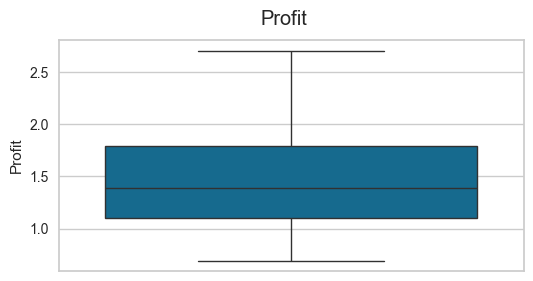

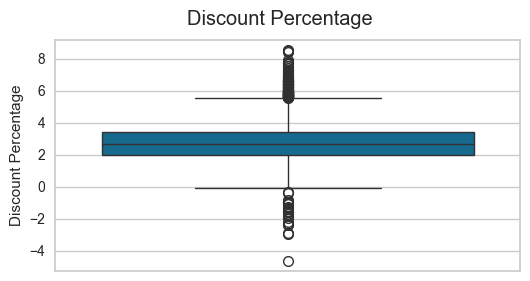

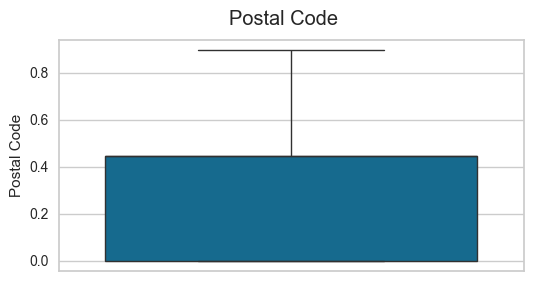

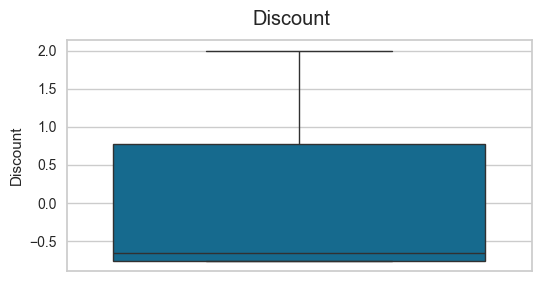

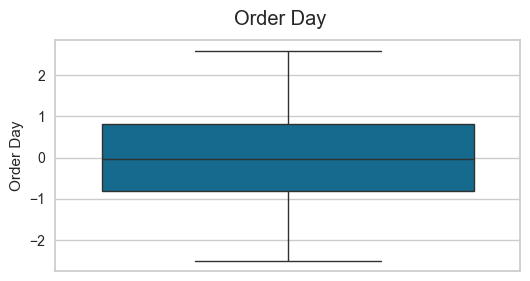

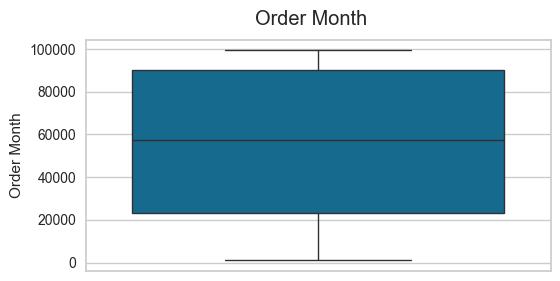

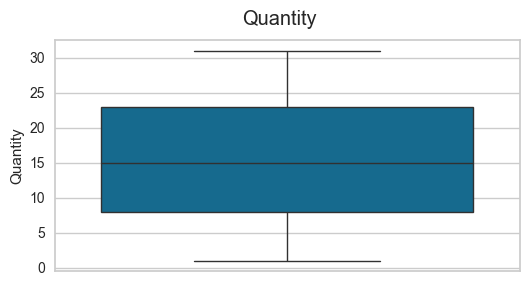

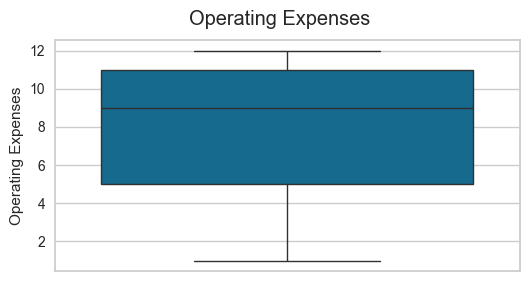

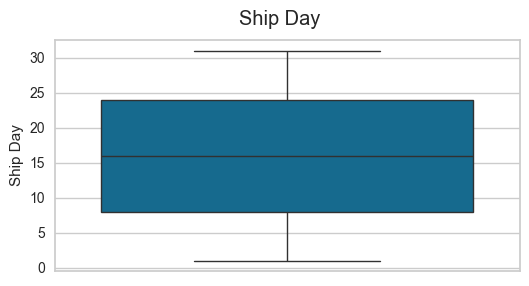

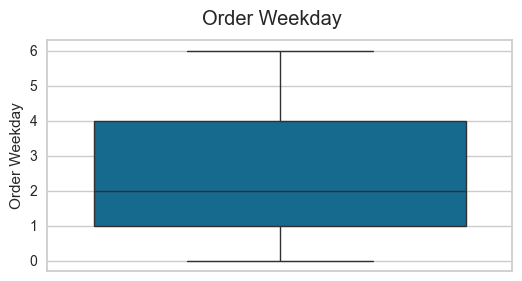

In [105]:
for col in final_X_train.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_train[col])
    plt.suptitle(col)
    plt.show()

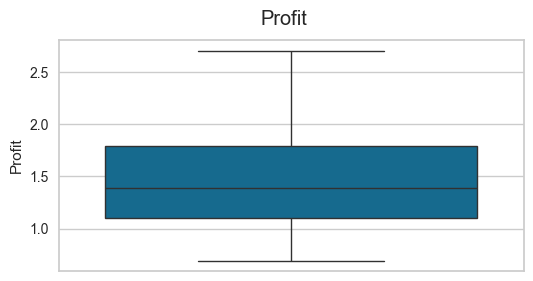

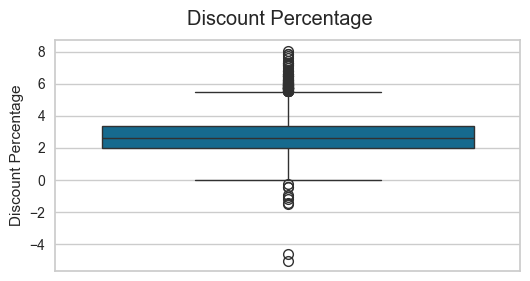

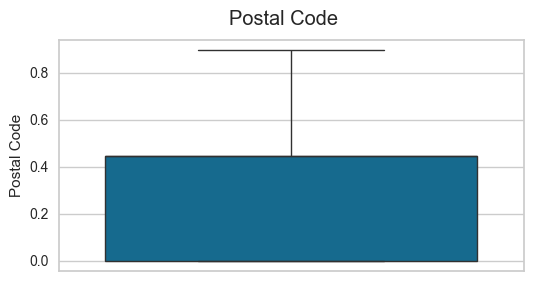

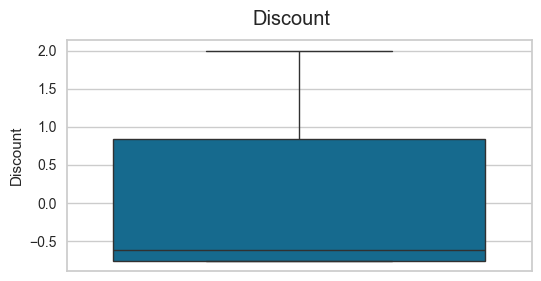

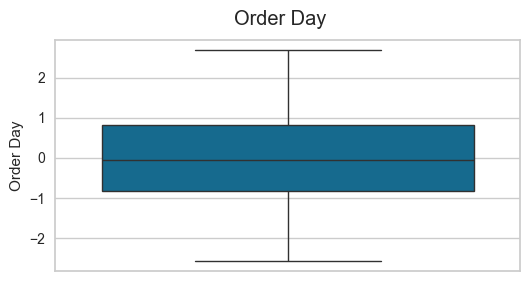

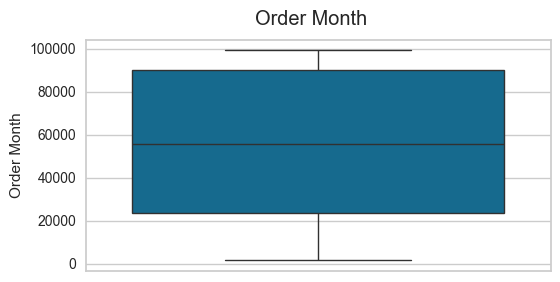

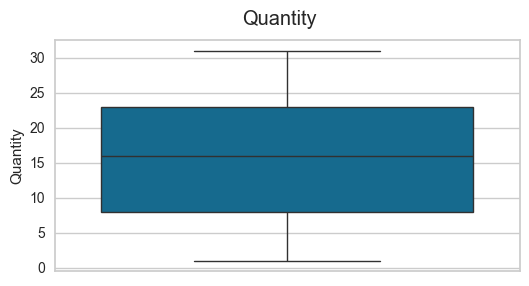

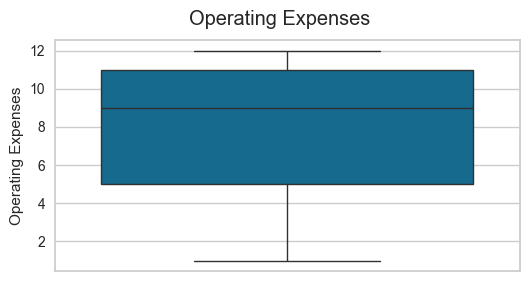

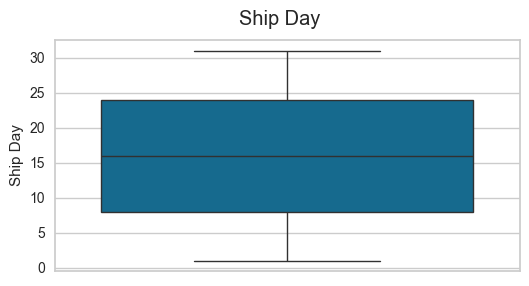

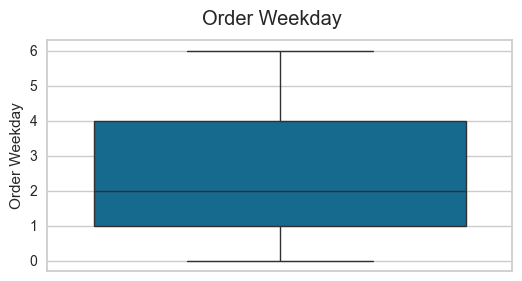

In [106]:
for col in final_X_test.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_test[col])
    plt.suptitle(col)
    plt.show()

In [107]:
def impute_outliers(data,col):
    winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
    fig = sns.boxplot(winsorizer.fit_transform(data[[col]]).values)
    plt.title(f"Box Plot of {col} after Outlier Removal")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect()

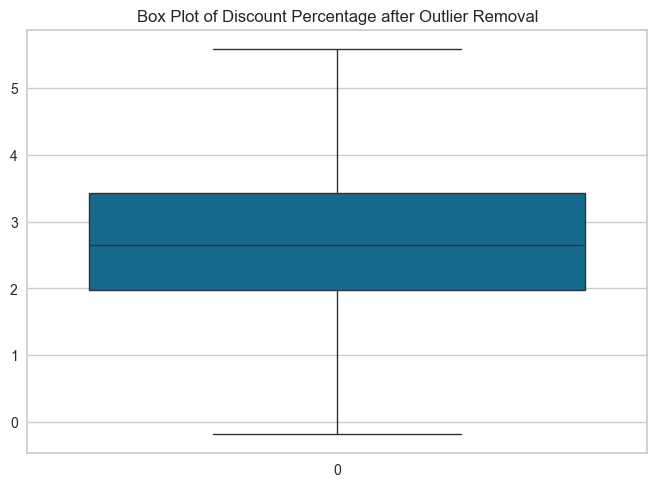

In [108]:
impute_outliers(final_X_train,'Discount Percentage')

In [109]:
winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
final_X_train['Discount Percentage'] = winsorizer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = winsorizer.transform(final_X_test[['Discount Percentage']])

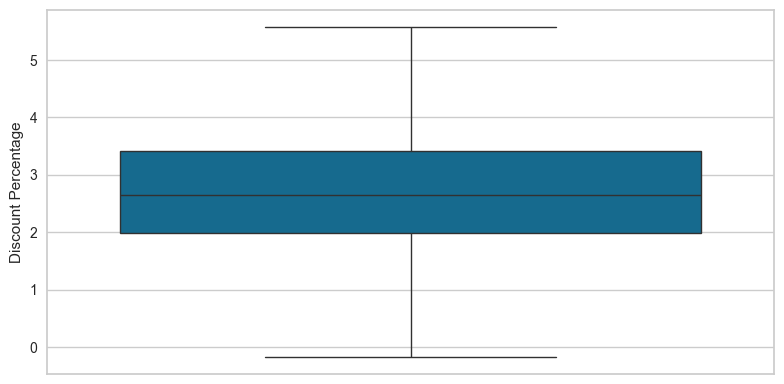

In [110]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_train['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

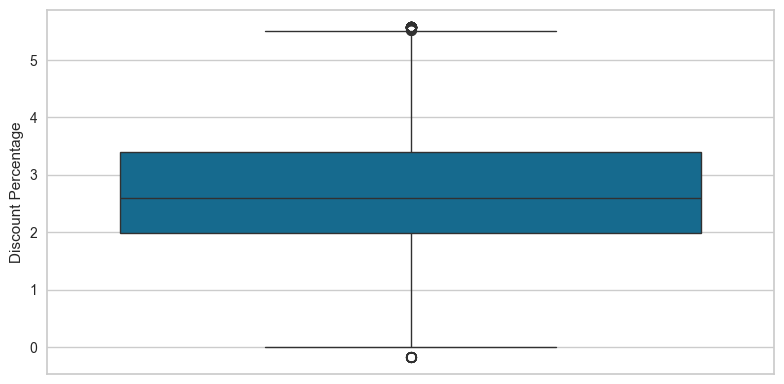

In [111]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_test['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Scaling

In [112]:
scaler = StandardScaler()
features = final_X_train.columns
final_X_train = scaler.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=features)
final_X_test = scaler.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=features)
final_X_train.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,0.738777,-0.085201,0.620435,-0.324229,1.009995,1.083957,-0.650256,0.361982,-0.093987,-0.231513
1,1.398690,1.488356,1.271876,-0.412458,1.378259,-0.361693,0.840780,1.277878,1.043587,-0.823287
2,1.092383,-0.540392,0.620435,0.171010,0.414783,1.084082,-0.306171,-0.248614,0.474800,1.543812
3,-0.191318,0.077933,-0.952285,-0.755604,-0.483757,1.211884,0.955475,-0.859211,1.384859,0.952037
4,-0.851232,0.096897,0.620435,-0.097214,0.642144,0.167933,-0.420866,-0.248614,0.133528,0.360262


In [113]:
final_X_test.head()

,Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,-0.851232,0.880050,-0.952285,-0.755604,0.622479,1.336351,0.037914,-1.469808,0.247285,0.952037
1,-0.851232,-0.130519,0.620435,1.246647,-0.296776,1.211915,0.496695,0.667281,1.043587,-1.415062
2,-0.851232,-1.988682,0.620435,1.963591,-1.764067,-0.716927,-1.567816,-0.859211,-1.004046,0.952037
3,-1.781327,-1.475595,-0.952285,-0.755604,-0.708771,1.212289,-1.223731,0.056684,-0.549016,0.952037
4,1.398690,1.707184,0.620435,-0.650184,1.662262,0.618871,-0.764951,1.277878,-0.549016,-1.415062


In [114]:
imputer = SimpleImputer(strategy='mean')
y_train = imputer.fit_transform(y_train.values.reshape(-1,1))
y_test = imputer.transform(y_test.values.reshape(-1,1))

## Model Training & Evaluation

In [115]:
import time
import gc
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

models = []
train_r2_scores, test_r2_scores = [], []
train_mae_scores, test_mae_scores = [], []
train_mse_scores, test_mse_scores = [], []
train_rmse_scores, test_rmse_scores = [], []
training_times = []

def train_and_evaluate_model(model):
    # Start the training time measurement
    start_time = time.time()
    model.fit(final_X_train, y_train)  # Fit the model on training data
    duration = time.time() - start_time  # Time taken to train the model

    # Predicting for train data
    y_train_pred = model.predict(final_X_train)
    train_r2 = r2_score(y_train, y_train_pred)
    train_mae = mean_absolute_error(y_train, y_train_pred)
    train_mse = mean_squared_error(y_train, y_train_pred)
    train_rmse = np.sqrt(train_mse)

    # Predicting for test data
    y_test_pred = model.predict(final_X_test)
    test_r2 = r2_score(y_test, y_test_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_rmse = np.sqrt(test_mse)

    # Printing model evaluation results
    print(f"Model: {model.__class__.__name__}")
    print(f"Train R2 Score: {train_r2}")
    print(f"Test R2 Score: {test_r2}")
    print(f"Train MAE: {train_mae}, Test MAE: {test_mae}")
    print(f"Train RMSE: {train_rmse}, Test RMSE: {test_rmse}")
    print(f"Training Time: {duration}")

    # Storing the results for later comparison
    models.append(model)
    train_r2_scores.append(train_r2)
    test_r2_scores.append(test_r2)
    train_mae_scores.append(train_mae)
    test_mae_scores.append(test_mae)
    train_mse_scores.append(train_mse)
    test_mse_scores.append(test_mse)
    train_rmse_scores.append(train_rmse)
    test_rmse_scores.append(test_rmse)
    training_times.append(duration)

    # Prediction Error Plot for Train Data
    plt.figure(figsize=(10, 6))
    plt.scatter(y_train, y_train_pred, color='blue', label='Train Predictions')
    plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='red', linestyle='--', label='Perfect Prediction')
    plt.title(f'Train Prediction Errors - {model.__class__.__name__}')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.legend()
    plt.show()

    # Prediction Error Plot for Test Data
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_test_pred, color='green', label='Test Predictions')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Prediction')
    plt.title(f'Test Prediction Errors - {model.__class__.__name__}')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.legend()
    plt.show()

    # Garbage collection to free memory
    gc.collect()

# Clear previous results only if you are running multiple iterations
models.clear()
train_r2_scores.clear()
test_r2_scores.clear()
train_mae_scores.clear()
test_mae_scores.clear()
train_mse_scores.clear()
test_mse_scores.clear()
train_rmse_scores.clear()
test_rmse_scores.clear()
training_times.clear()



Model: LinearRegression
Train R2 Score: 0.3413966955964357
Test R2 Score: 0.37788964949952375
Train MAE: 208.96456435437395, Test MAE: 213.42072661640157
Train RMSE: 430.2877597106019, Test RMSE: 408.8986956737966
Training Time: 0.03126692771911621


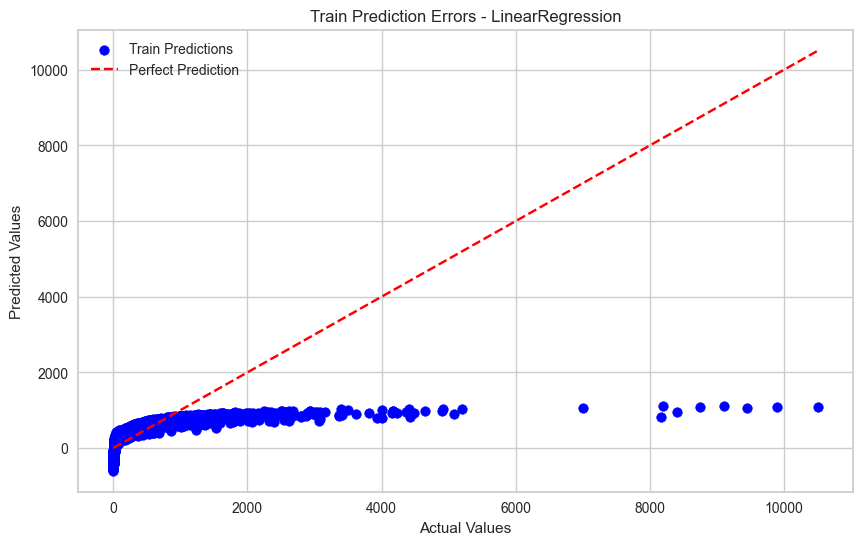

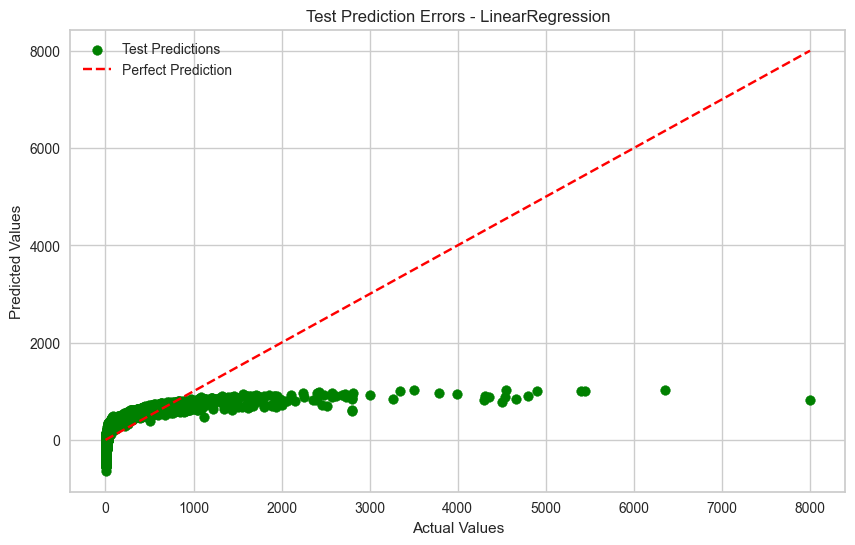

In [116]:
train_and_evaluate_model(LinearRegression())

Model: PassiveAggressiveRegressor
Train R2 Score: 0.16426535751768878
Test R2 Score: 0.17934584502692608
Train MAE: 149.27697117601198, Test MAE: 154.59031101977374
Train RMSE: 484.7091762929781, Test RMSE: 469.63677601051154
Training Time: 0.0156404972076416


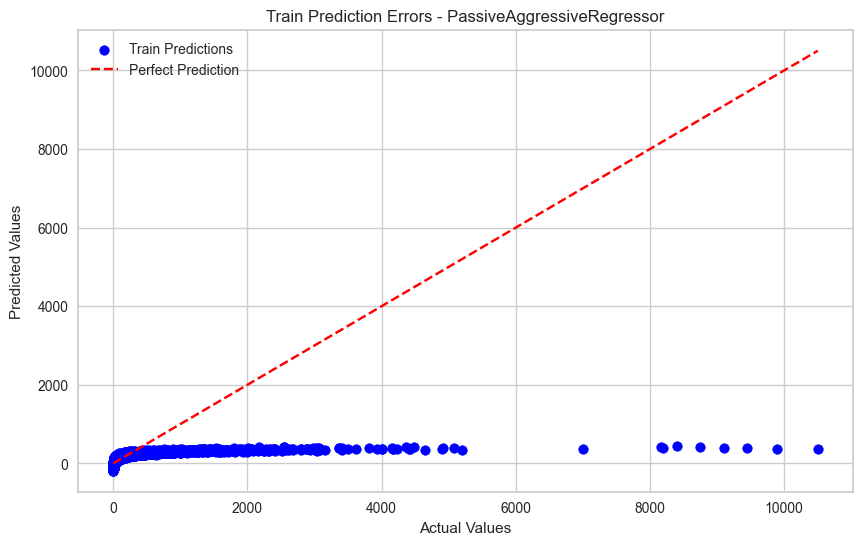

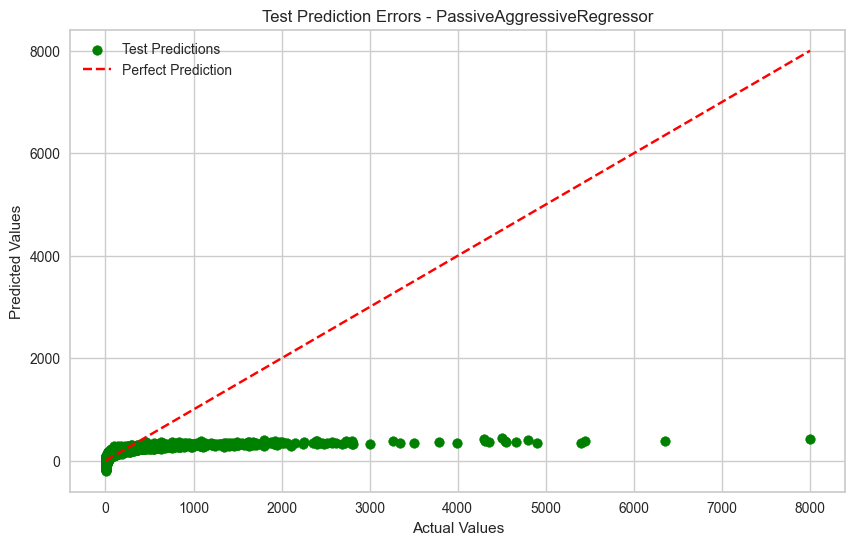

In [117]:
train_and_evaluate_model(PassiveAggressiveRegressor())

Model: SGDRegressor
Train R2 Score: 0.34093915753170545
Test R2 Score: 0.37651179741144114
Train MAE: 206.55980348225452, Test MAE: 211.17822753288232
Train RMSE: 430.4371962887461, Test RMSE: 409.35126032736883
Training Time: 0.04036140441894531


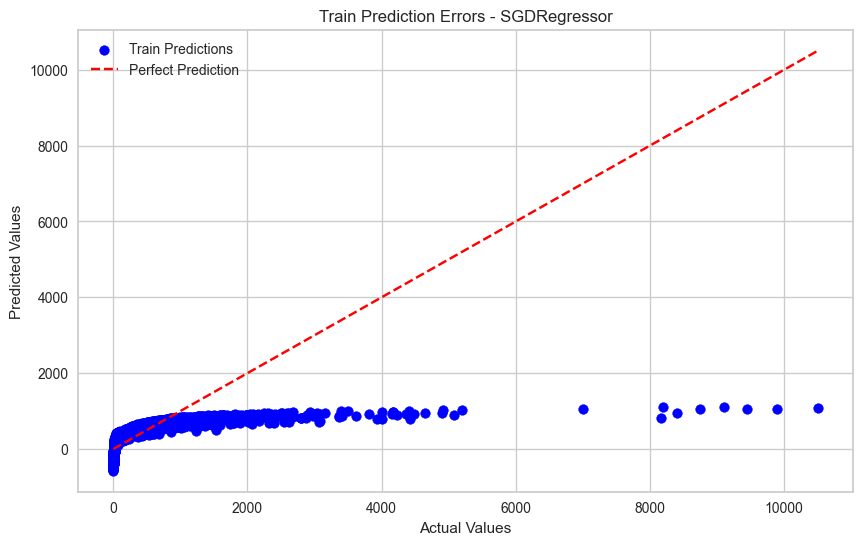

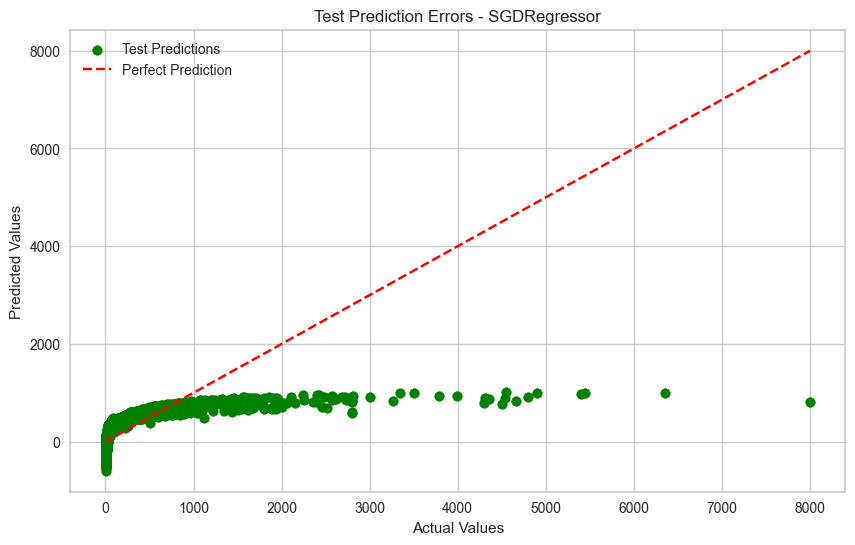

In [118]:
train_and_evaluate_model(SGDRegressor())

Model: Lasso
Train R2 Score: 0.3413966837543213
Test R2 Score: 0.3778949565077381
Train MAE: 208.956464449283, Test MAE: 213.41409828516774
Train RMSE: 430.28776357902836, Test RMSE: 408.896951583409
Training Time: 0.029472827911376953


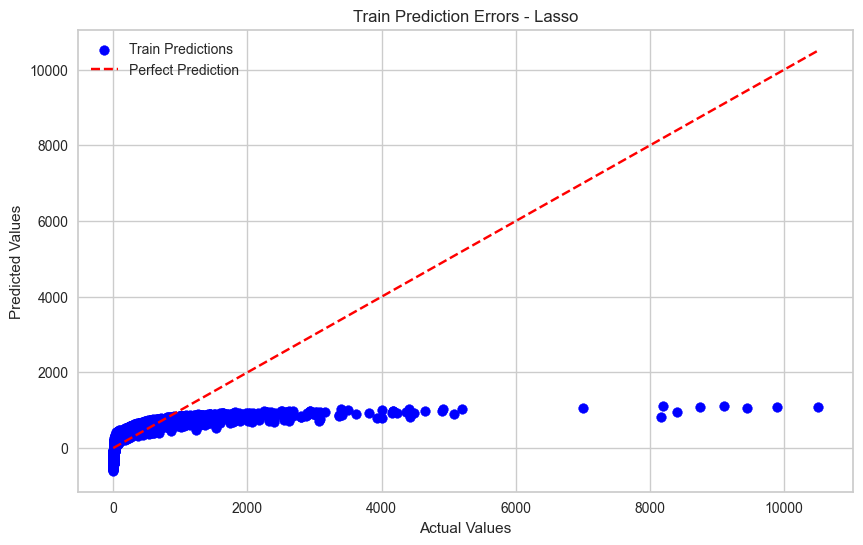

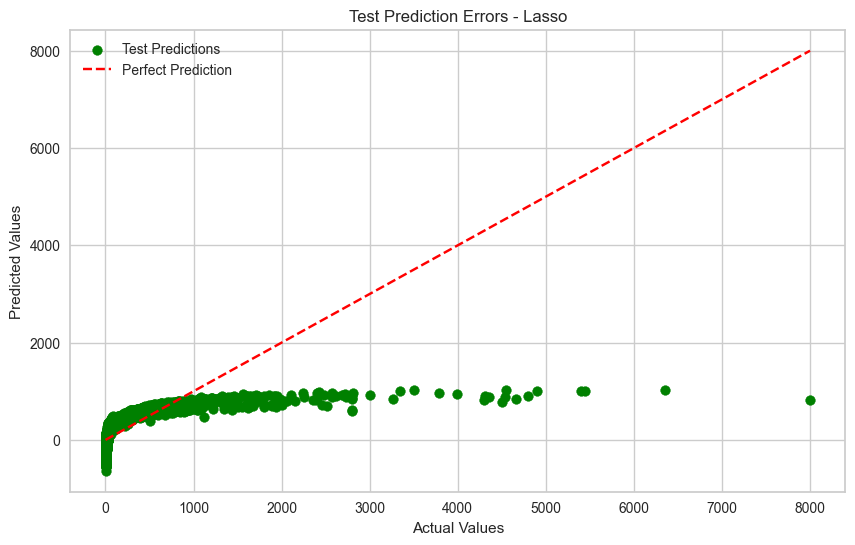

In [119]:
train_and_evaluate_model(Lasso(alpha=0.01))

Model: Ridge
Train R2 Score: 0.3413966955963986
Test R2 Score: 0.3778896539204112
Train MAE: 208.9645442164582, Test MAE: 213.42070819423265
Train RMSE: 430.28775971061407, Test RMSE: 408.8986942209233
Training Time: 0.0


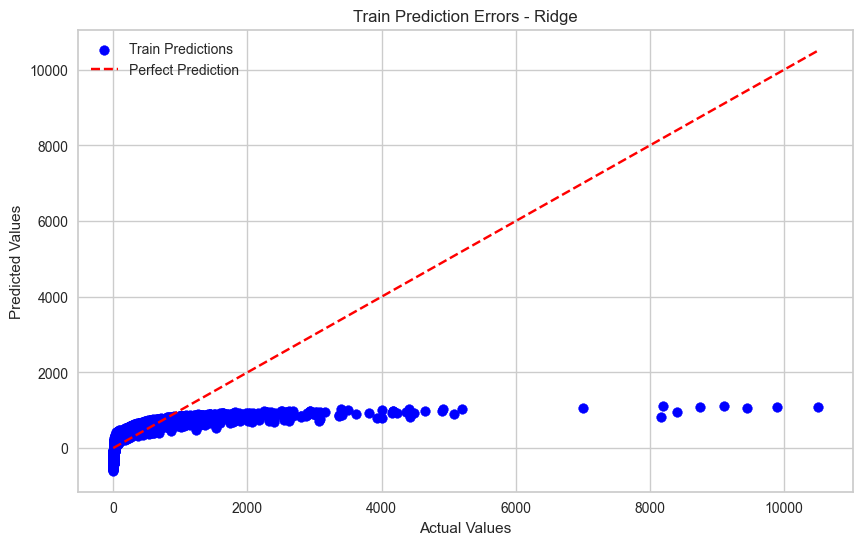

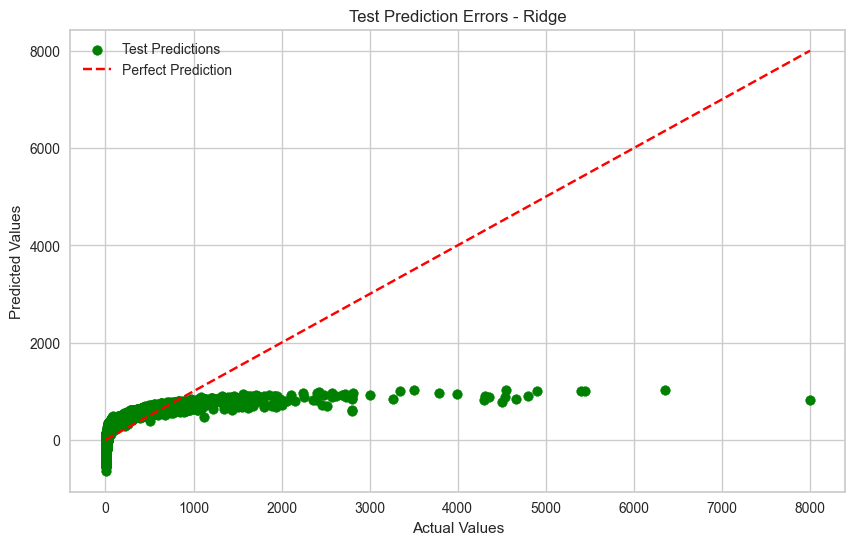

In [120]:
train_and_evaluate_model(Ridge(alpha=0.001))

Model: ElasticNet
Train R2 Score: 0.30398019435223644
Test R2 Score: 0.3350415936265909
Train MAE: 184.44542181287113, Test MAE: 188.9466970519418
Train RMSE: 442.3416547500728, Test RMSE: 422.7457518065394
Training Time: 0.011743307113647461


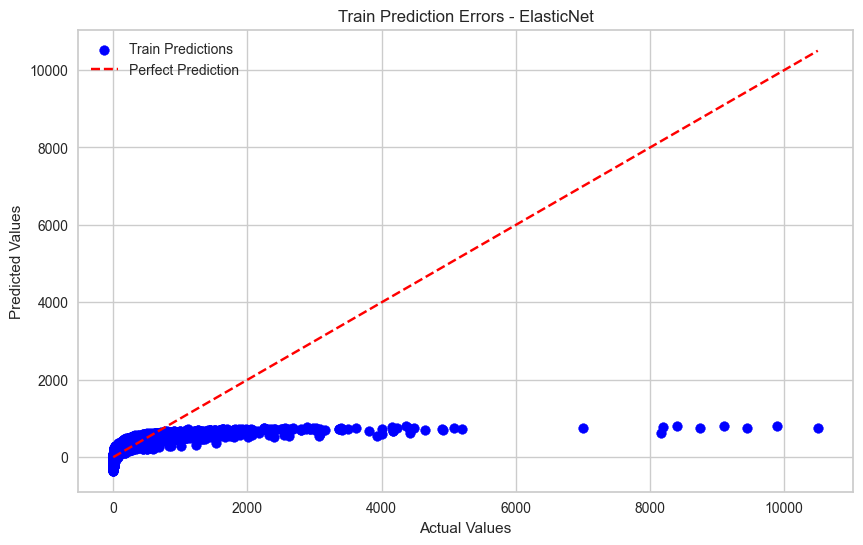

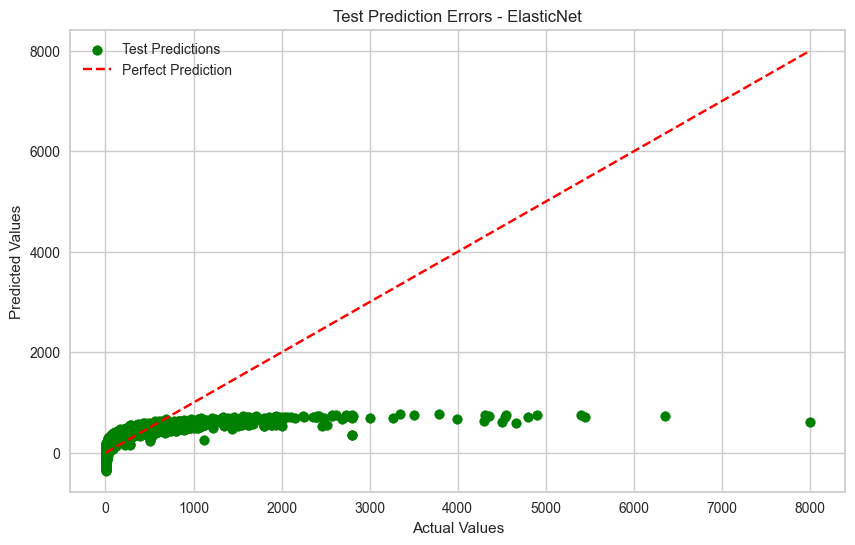

In [121]:
train_and_evaluate_model(ElasticNet(l1_ratio=0.3))

  File "C:\Users\harsh\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\harsh\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\harsh\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\harsh\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


Model: PoissonRegressor
Train R2 Score: 0.9088154508315089
Test R2 Score: 0.9229724521359908
Train MAE: 35.42471510618087, Test MAE: 36.55312431832966
Train RMSE: 160.10602191123536, Test RMSE: 143.88153019699655
Training Time: 0.204451322555542


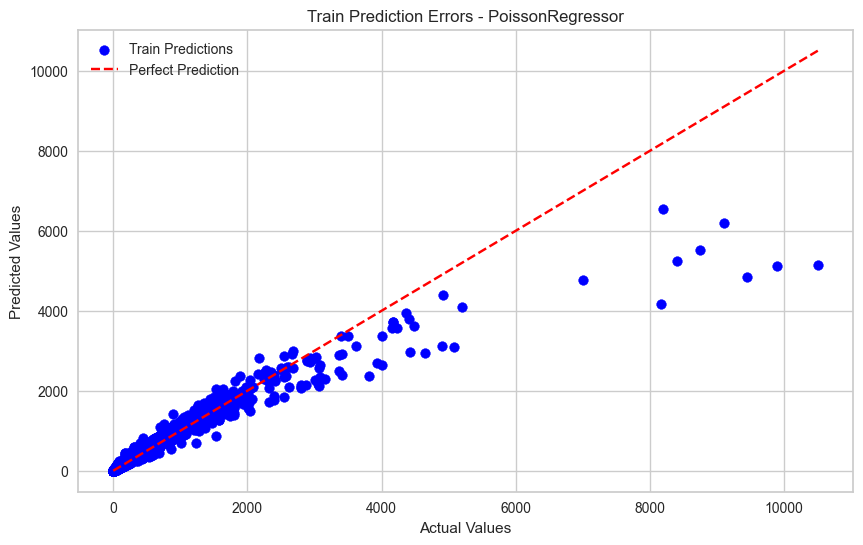

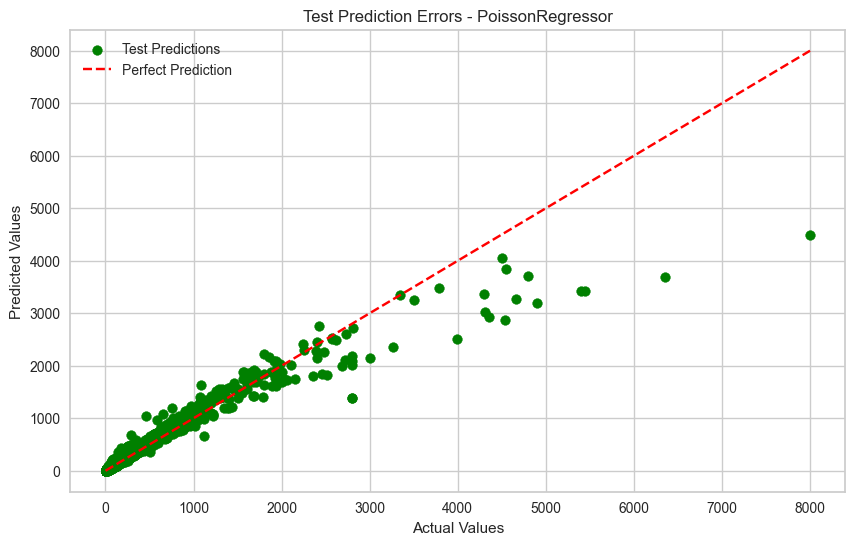

In [122]:
train_and_evaluate_model(PoissonRegressor())

Model: TweedieRegressor
Train R2 Score: 0.28804061709598117
Test R2 Score: 0.31662397857227087
Train MAE: 182.2219748688264, Test MAE: 186.83389369559367
Train RMSE: 447.3780253563926, Test RMSE: 428.56024308231855
Training Time: 0.05507326126098633


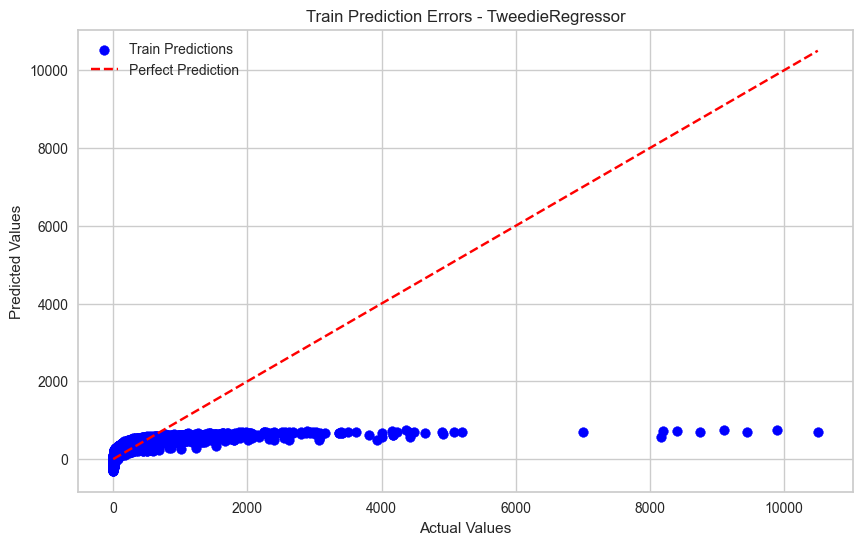

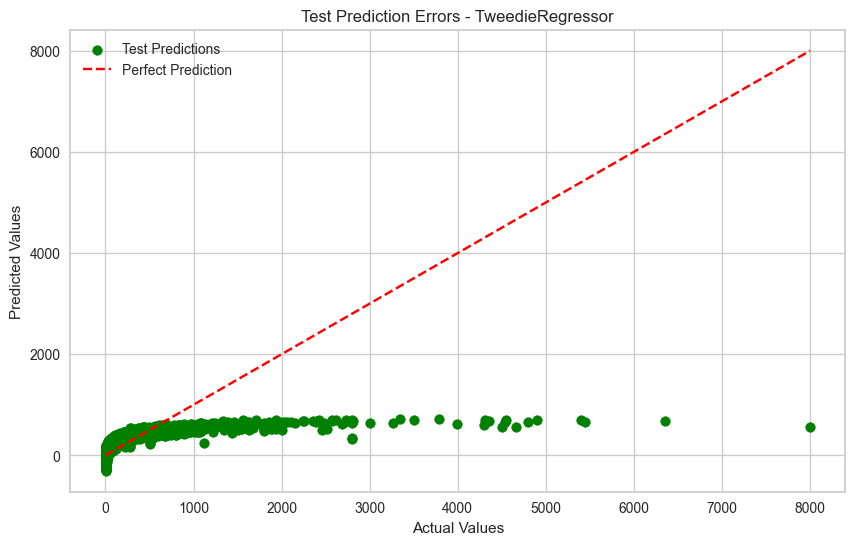

In [123]:
train_and_evaluate_model(TweedieRegressor())

Model: TheilSenRegressor
Train R2 Score: 0.23123157852095721
Test R2 Score: 0.25050616761630273
Train MAE: 151.561416323072, Test MAE: 157.52283793836065
Train RMSE: 464.88422251219816, Test RMSE: 448.81363604857114
Training Time: 3.8365421295166016


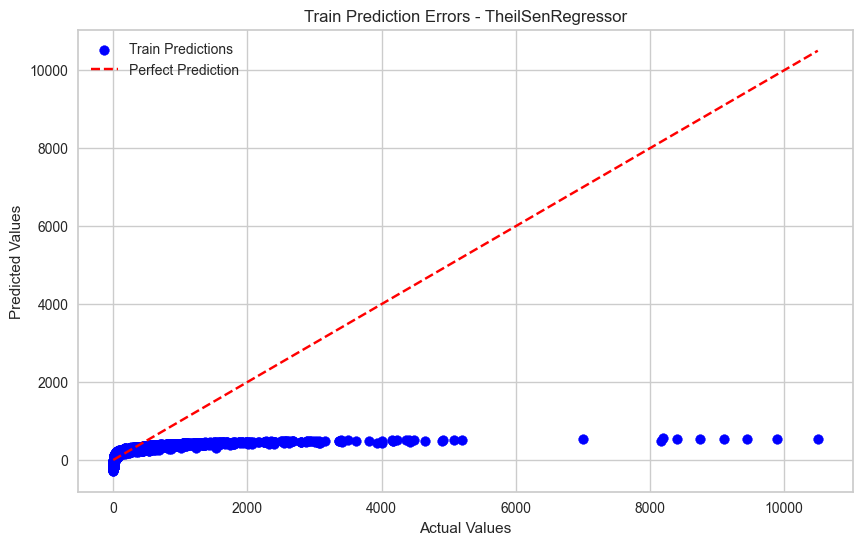

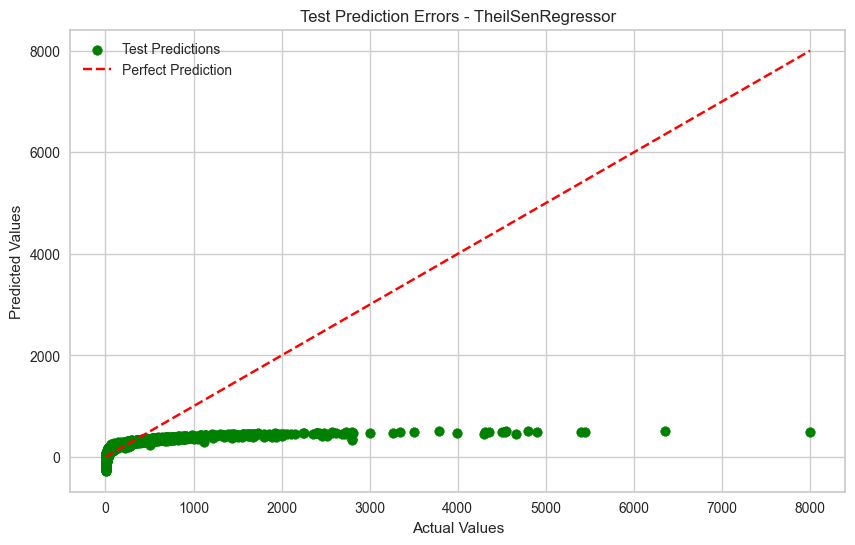

In [124]:
train_and_evaluate_model(TheilSenRegressor())

Model: GammaRegressor
Train R2 Score: 0.3427796961562627
Test R2 Score: 0.36230418508280726
Train MAE: 116.87465681071137, Test MAE: 121.88585710962785
Train RMSE: 429.835741824156, Test RMSE: 413.988993653361
Training Time: 0.010511159896850586


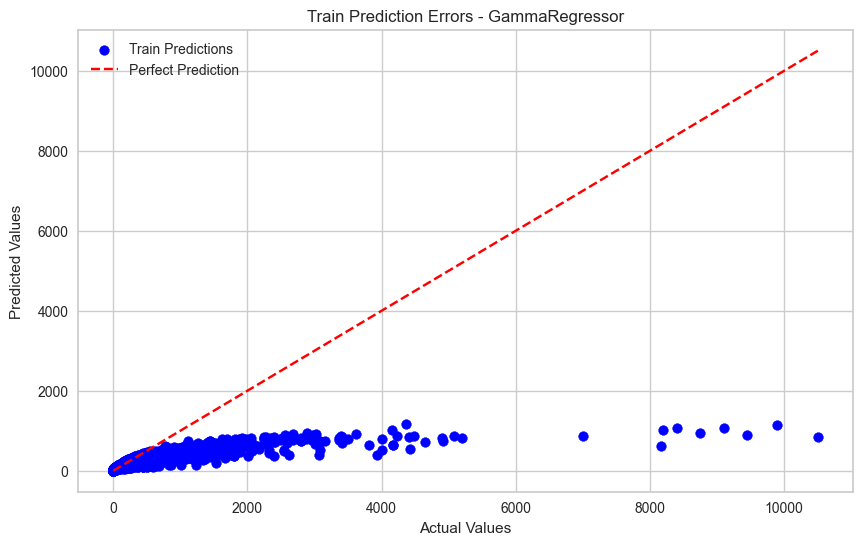

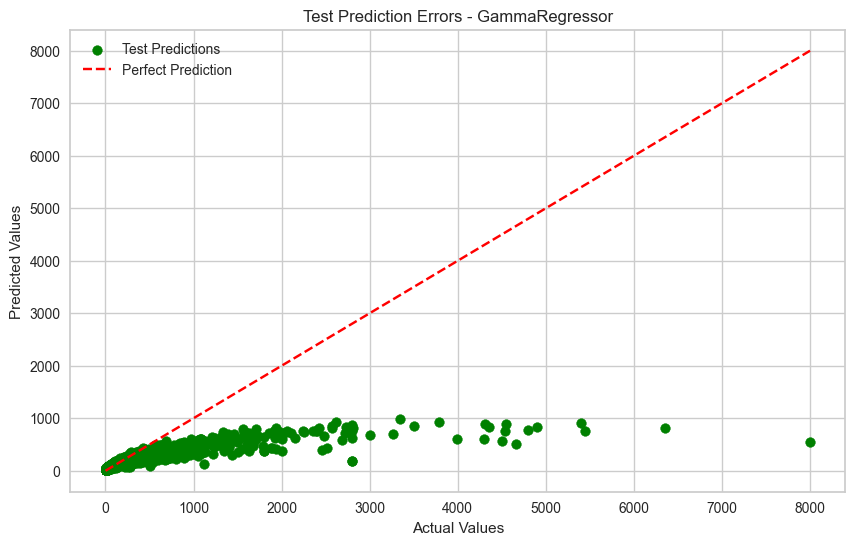

In [125]:
train_and_evaluate_model(GammaRegressor())

Model: HuberRegressor
Train R2 Score: 0.20401425315245691
Test R2 Score: 0.2219906384546051
Train MAE: 148.8243505419316, Test MAE: 154.62668125087058
Train RMSE: 473.04198119909967, Test RMSE: 457.27180404326157
Training Time: 0.08459591865539551


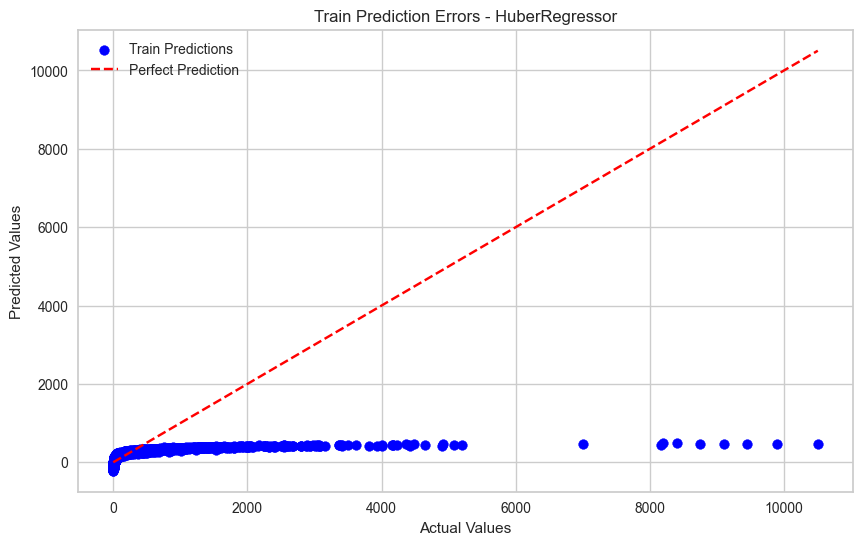

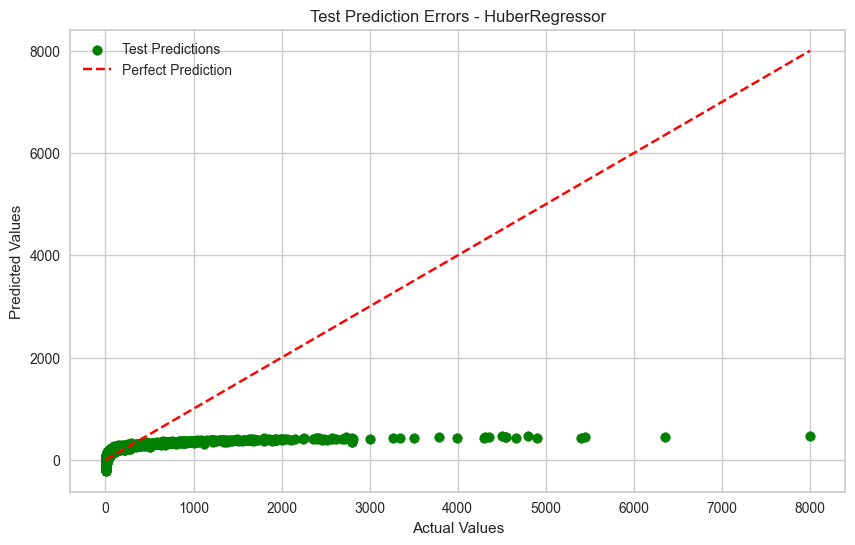

In [126]:
train_and_evaluate_model(HuberRegressor())

Model: BayesianRidge
Train R2 Score: 0.34138264501672044
Test R2 Score: 0.3779595561959861
Train MAE: 208.5742052409491, Test MAE: 213.06072026616184
Train RMSE: 430.292349545016, Test RMSE: 408.87572100375337
Training Time: 0.04193544387817383


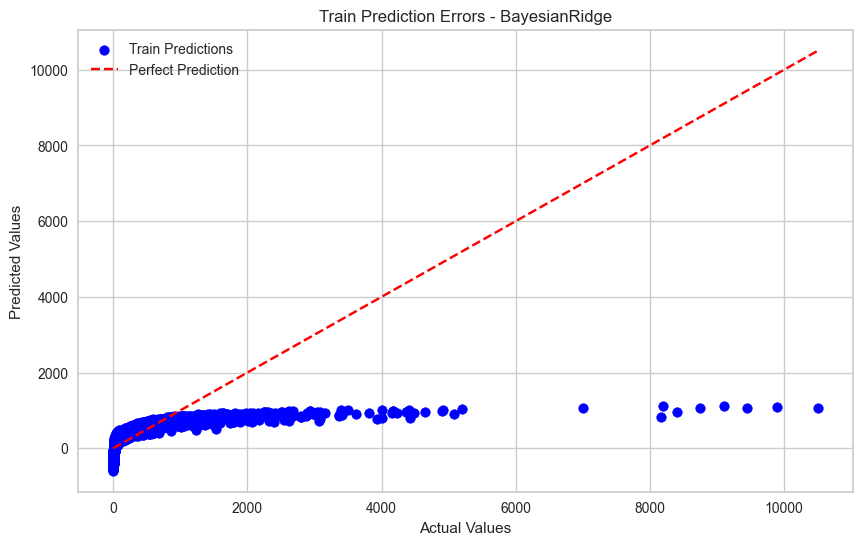

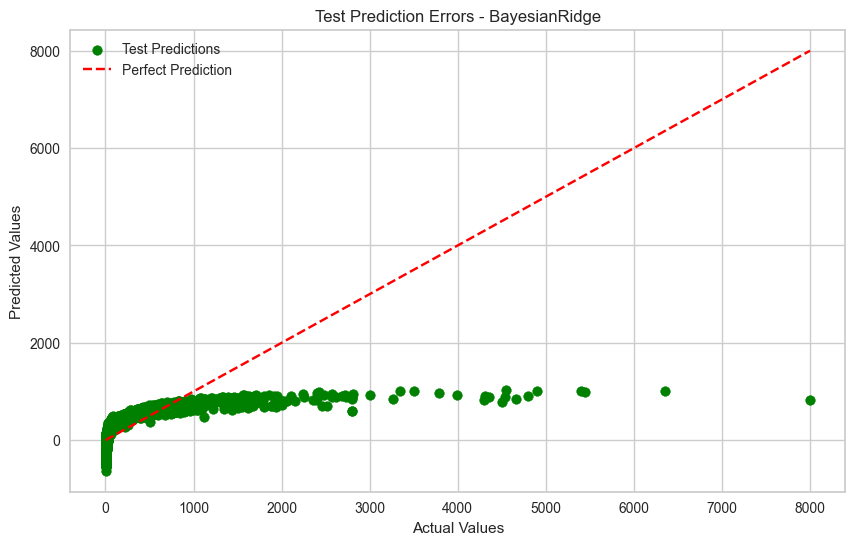

In [127]:
train_and_evaluate_model(BayesianRidge())

Model: ARDRegression
Train R2 Score: 0.3411816249949168
Test R2 Score: 0.3779542968167051
Train MAE: 208.70107740467913, Test MAE: 213.1582809068077
Train RMSE: 430.35801041605265, Test RMSE: 408.8774495311919
Training Time: 0.0880742073059082


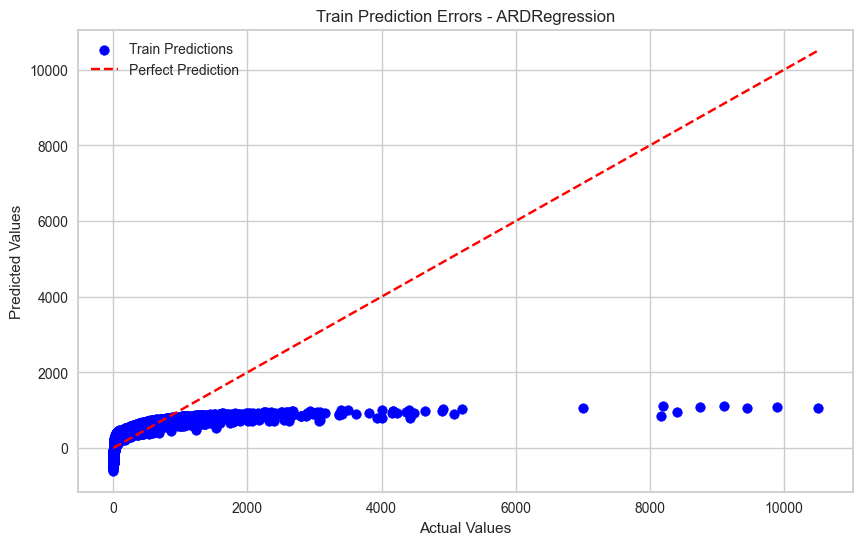

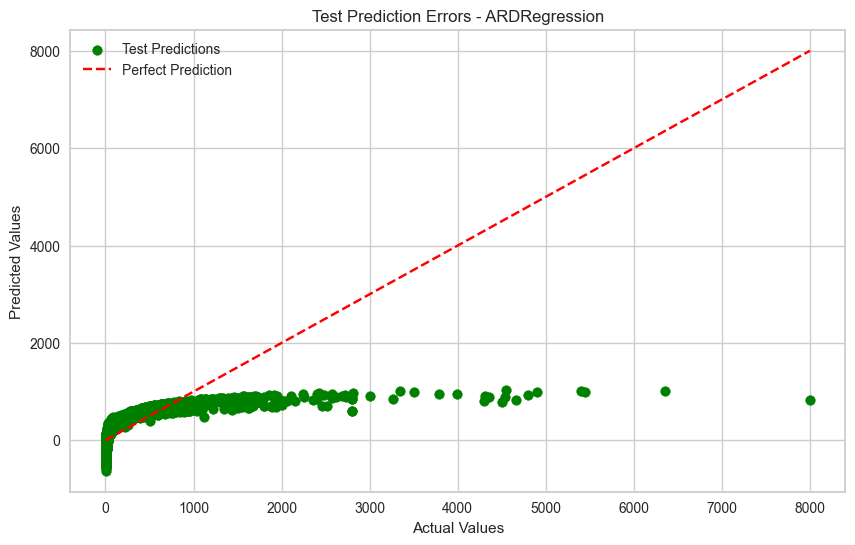

In [128]:
train_and_evaluate_model(ARDRegression())

Model: RANSACRegressor
Train R2 Score: 0.08567144284448758
Test R2 Score: 0.0848029838705574
Train MAE: 172.91786568290155, Test MAE: 179.472831765349
Train RMSE: 506.9885853149886, Test RMSE: 495.95161569674747
Training Time: 0.29982542991638184


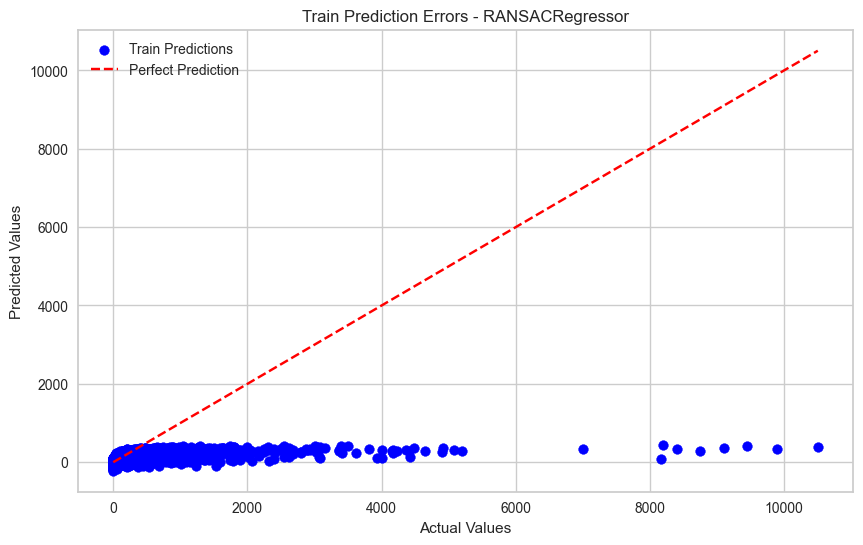

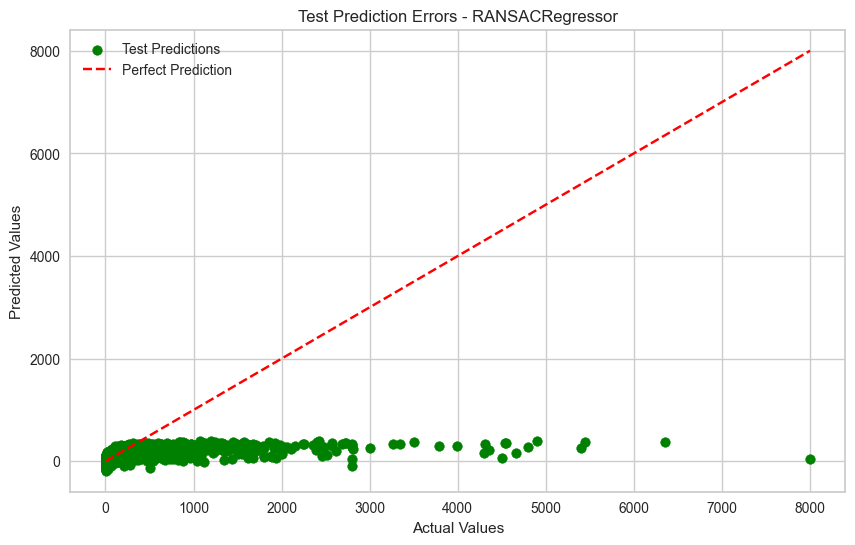

In [129]:
train_and_evaluate_model(RANSACRegressor())

Model: KNeighborsRegressor
Train R2 Score: 0.7135031345415316
Test R2 Score: 0.6212940730310492
Train MAE: 66.04304144185382, Test MAE: 81.89178158158158
Train RMSE: 283.7964618283863, Test RMSE: 319.0311304494452
Training Time: 0.024451494216918945


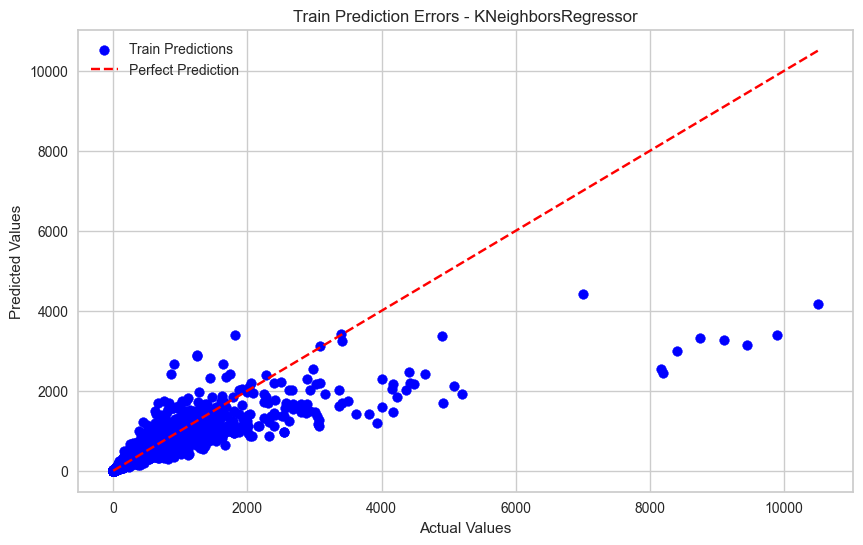

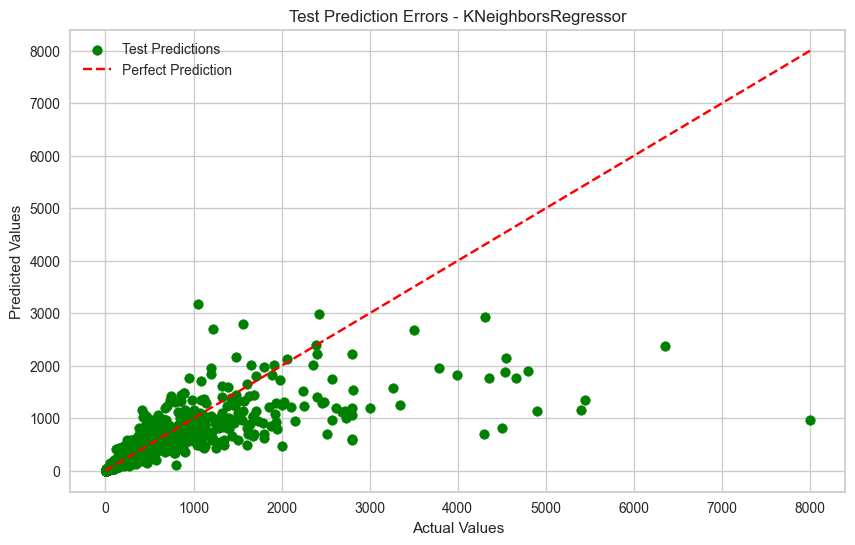

In [130]:
train_and_evaluate_model(KNeighborsRegressor())

Model: SVR
Train R2 Score: 0.12722109276442106
Test R2 Score: 0.13252952730804457
Train MAE: 133.00089474816258, Test MAE: 139.8005942518609
Train RMSE: 495.33516457855063, Test RMSE: 482.8468051943071
Training Time: 2.504211664199829


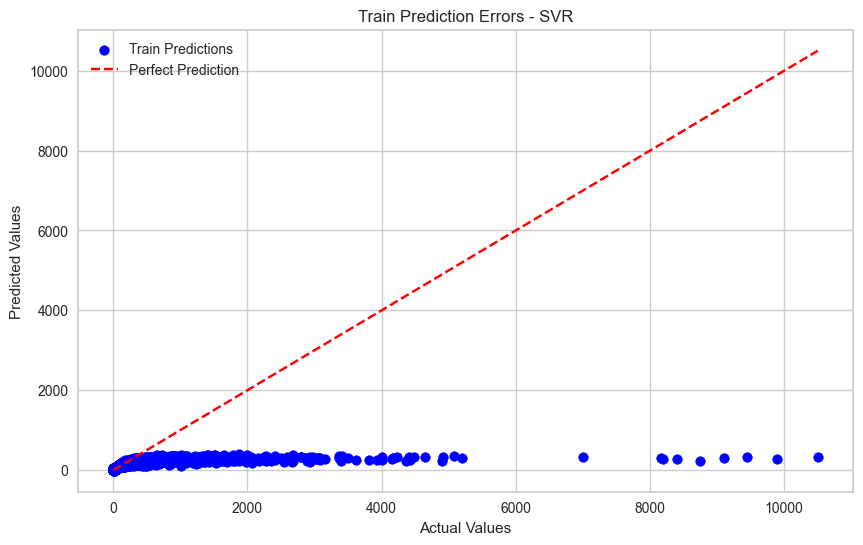

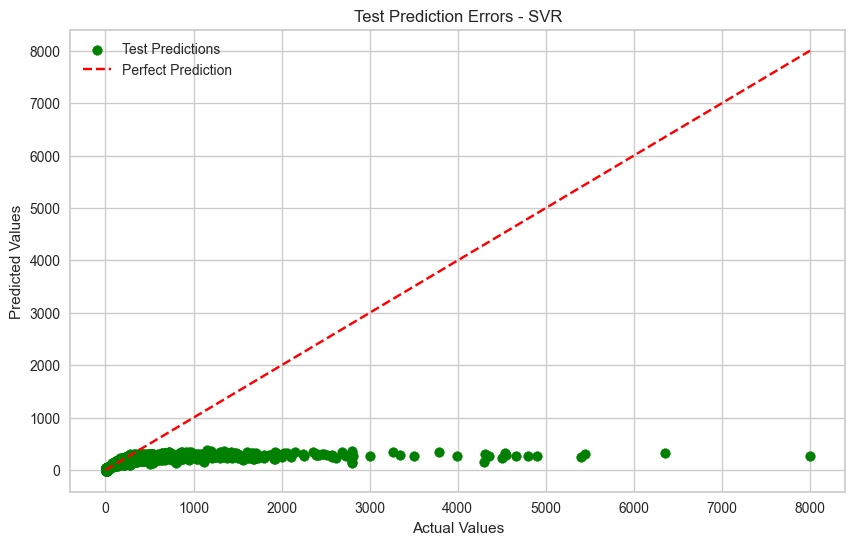

In [131]:
train_and_evaluate_model(SVR())

Model: LinearSVR
Train R2 Score: 0.1641073683543397
Test R2 Score: 0.1784522256123452
Train MAE: 147.8662590081107, Test MAE: 153.55298082992385
Train RMSE: 484.7549893863468, Test RMSE: 469.8924027887663
Training Time: 0.04804515838623047


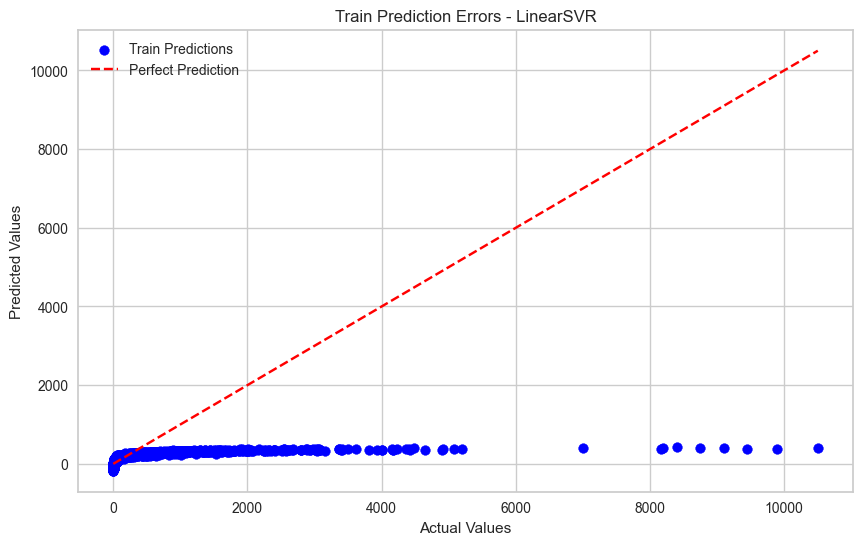

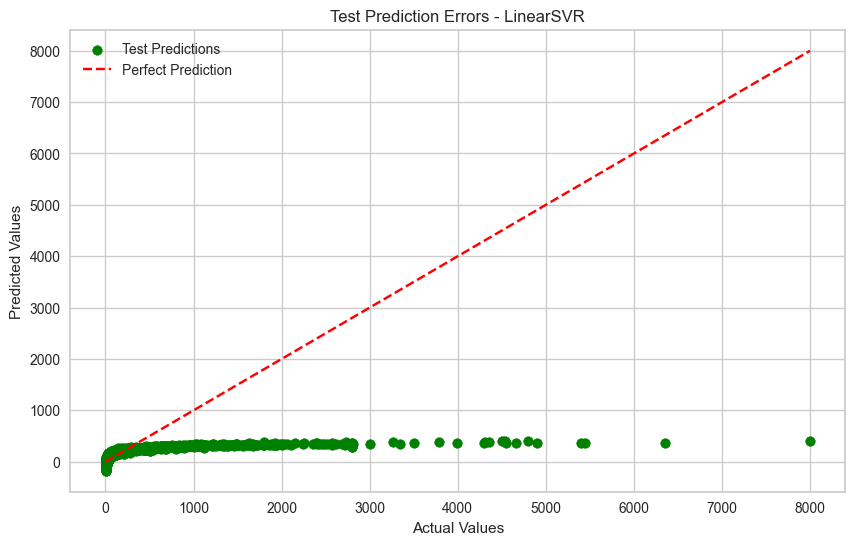

In [132]:
train_and_evaluate_model(LinearSVR())

Model: NuSVR
Train R2 Score: 0.1409342354352151
Test R2 Score: 0.14803821132633654
Train MAE: 135.85903726395762, Test MAE: 142.5806770398449
Train RMSE: 491.4283934393316, Test RMSE: 478.51115892411576
Training Time: 1.846104383468628


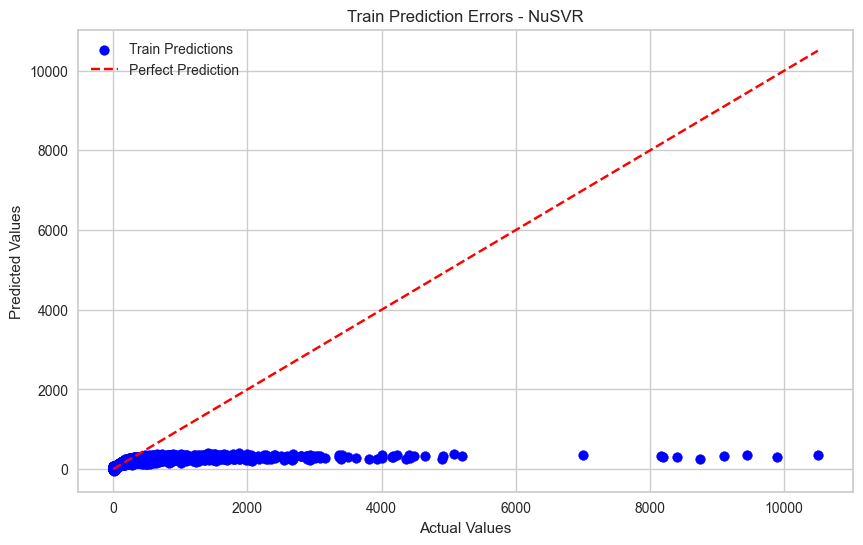

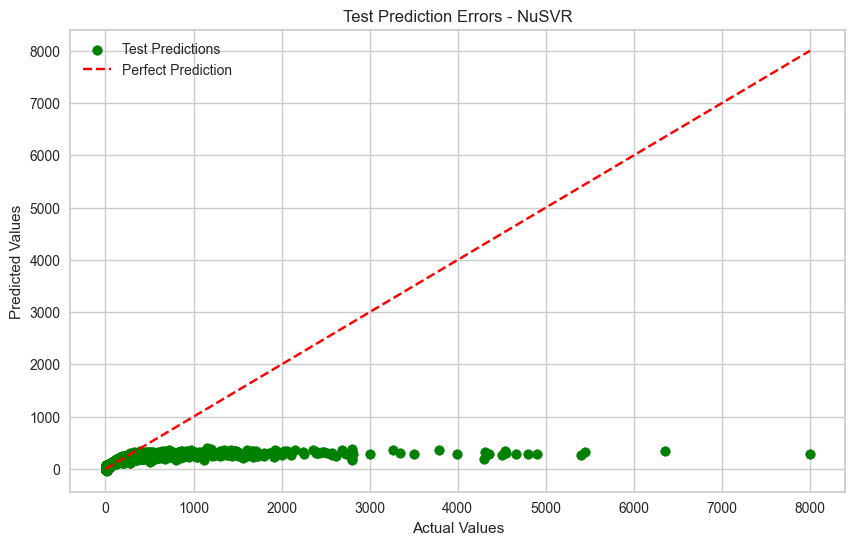

In [133]:
train_and_evaluate_model(NuSVR())

Model: DecisionTreeRegressor
Train R2 Score: 1.0
Test R2 Score: 0.952145357123288
Train MAE: 1.5274102490122666e-16, Test MAE: 16.188377043710375
Train RMSE: 1.5842606543934402e-15, Test RMSE: 113.40809399187458
Training Time: 0.12378573417663574


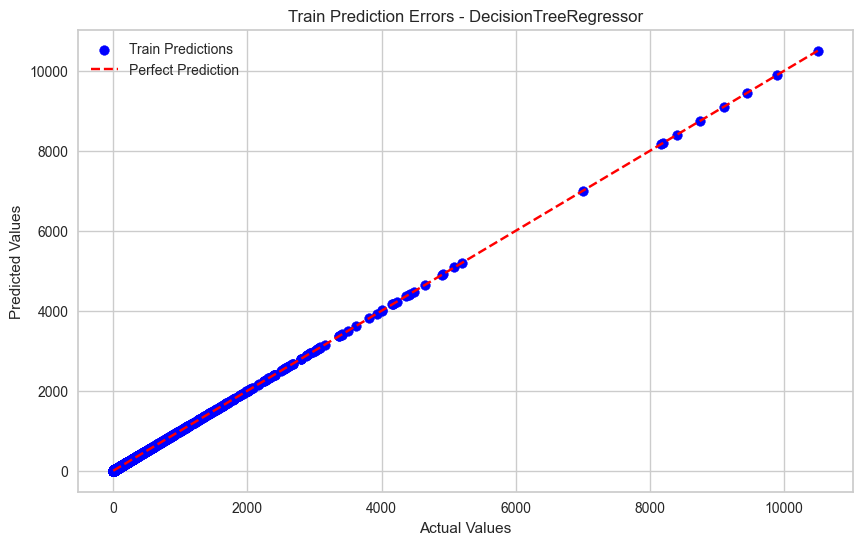

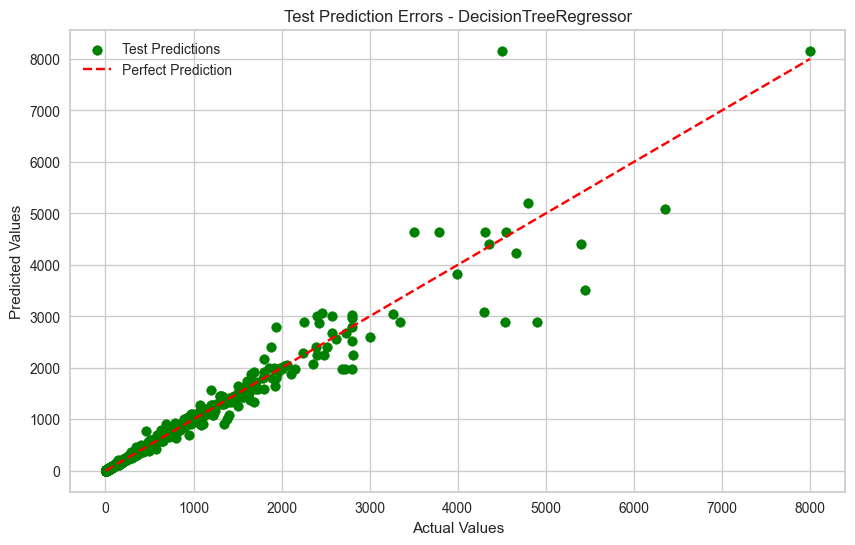

In [134]:
train_and_evaluate_model(DecisionTreeRegressor())

Model: ExtraTreesRegressor
Train R2 Score: 1.0
Test R2 Score: 0.9747888974653153
Train MAE: 2.8879984911572873e-13, Test MAE: 12.012504497831161
Train RMSE: 8.852334800099182e-13, Test RMSE: 82.31480070449153
Training Time: 2.3915629386901855


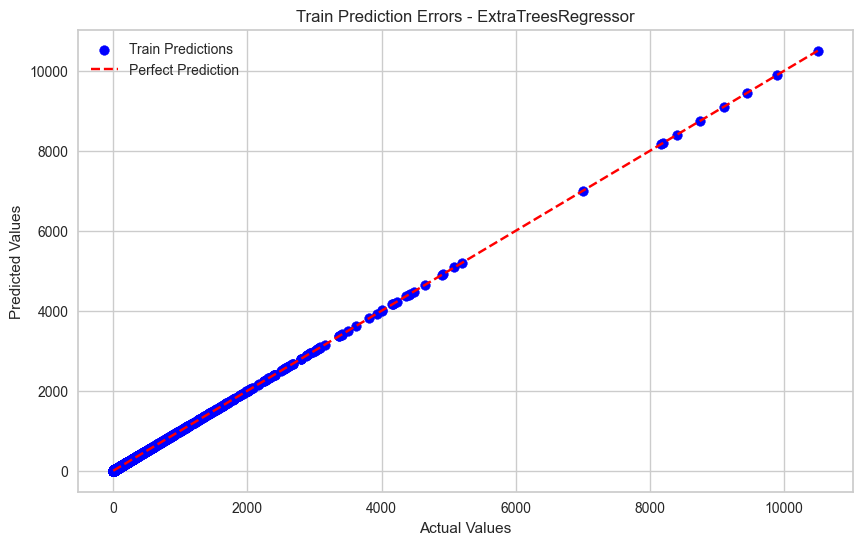

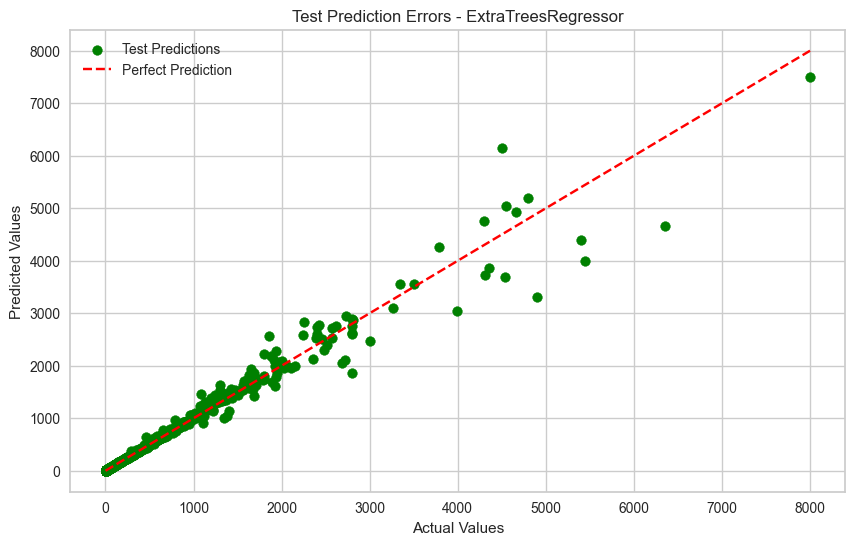

In [135]:
train_and_evaluate_model(ExtraTreesRegressor())

Model: AdaBoostRegressor
Train R2 Score: 0.4049684297666052
Test R2 Score: 0.3115405667151061
Train MAE: 383.1546236606607, Test MAE: 391.10337576790556
Train RMSE: 408.99410042553217, Test RMSE: 430.15124991744705
Training Time: 0.4355194568634033


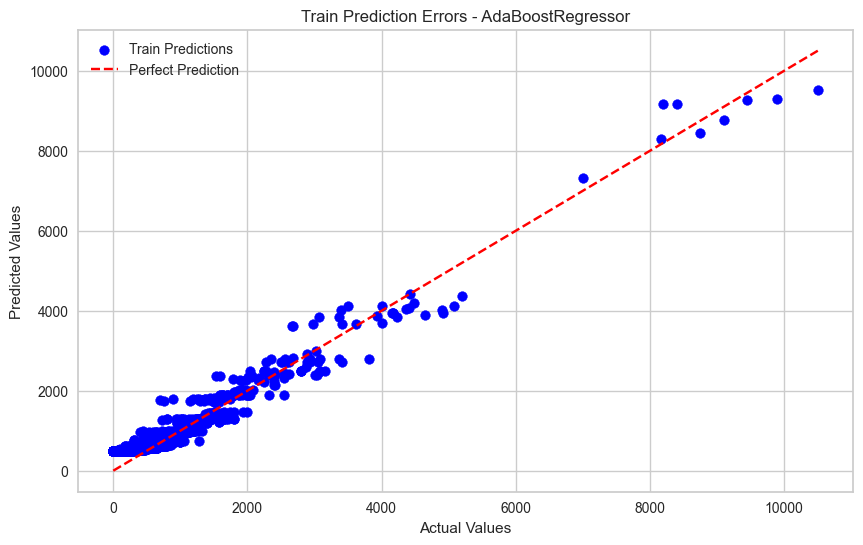

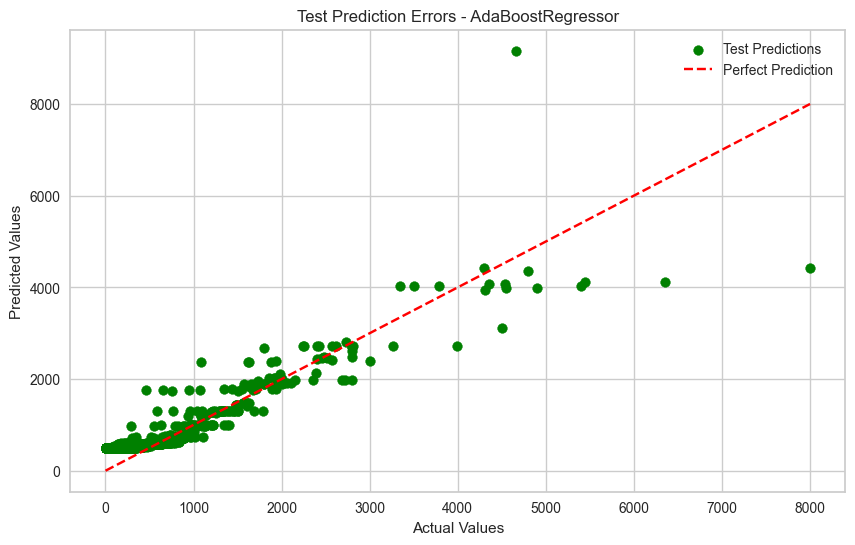

In [136]:
train_and_evaluate_model(AdaBoostRegressor())

Model: BaggingRegressor
Train R2 Score: 0.9917949315674172
Test R2 Score: 0.9589937319244869
Train MAE: 5.802397536833071, Test MAE: 15.596935428762094
Train RMSE: 48.02729678566777, Test RMSE: 104.98013694261101
Training Time: 0.48420286178588867


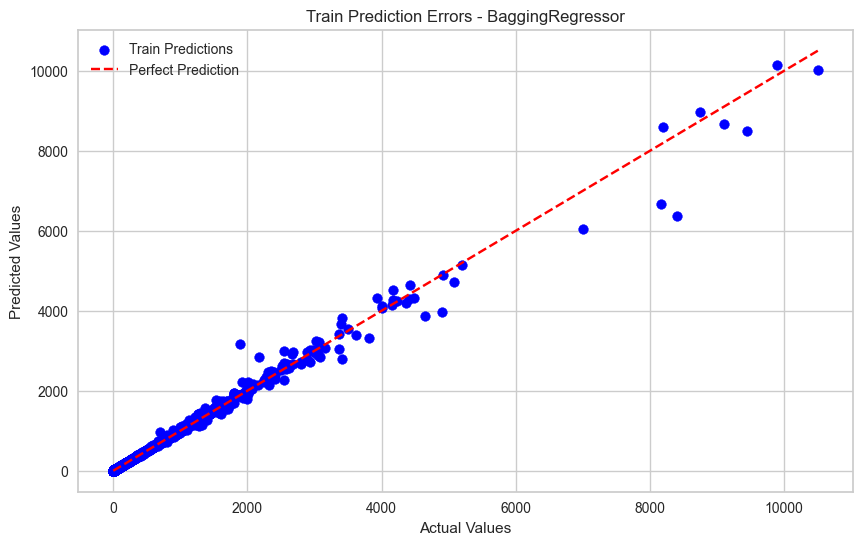

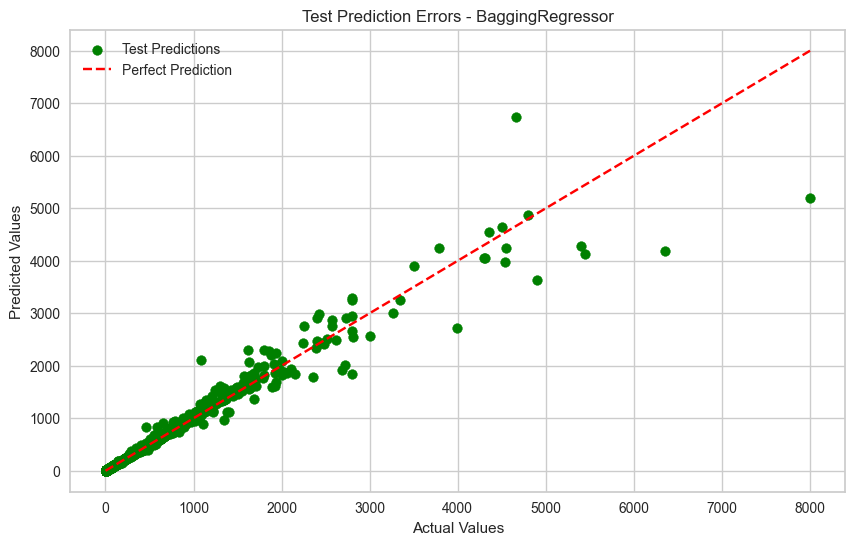

In [137]:
train_and_evaluate_model(BaggingRegressor())

Model: GradientBoostingRegressor
Train R2 Score: 0.9956366519075732
Test R2 Score: 0.9497032636915371
Train MAE: 12.180495967777775, Test MAE: 20.742805724216005
Train RMSE: 35.023292381602985, Test RMSE: 116.26578126494884
Training Time: 1.2290911674499512


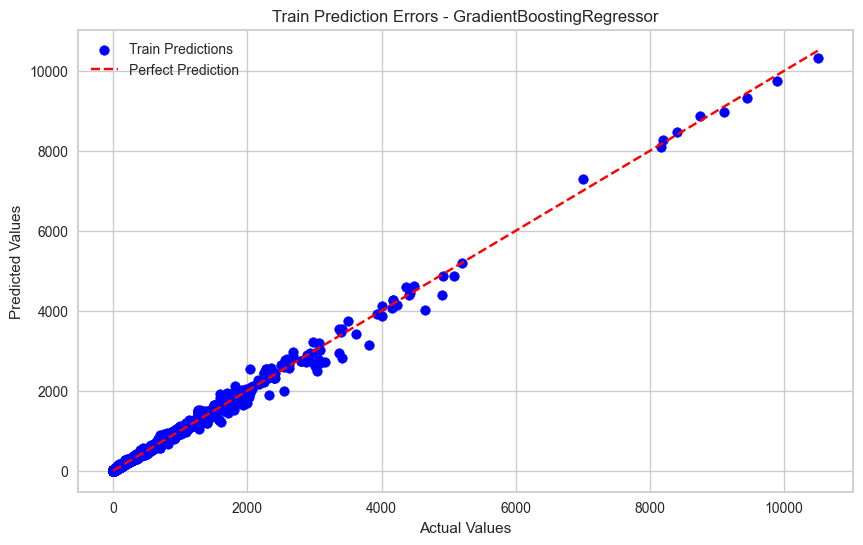

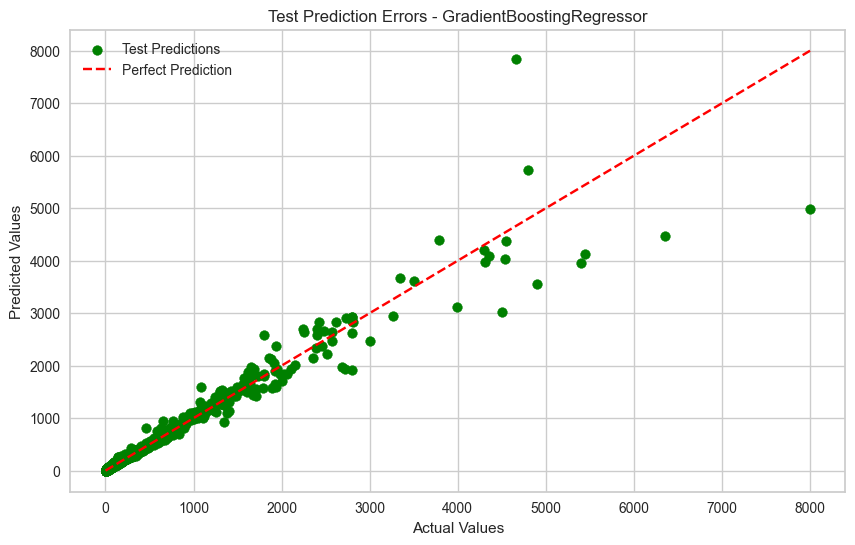

In [138]:
train_and_evaluate_model(GradientBoostingRegressor())

Model: HistGradientBoostingRegressor
Train R2 Score: 0.9668557779156045
Test R2 Score: 0.9500256287584162
Train MAE: 13.082145574102979, Test MAE: 20.29512863279213
Train RMSE: 96.52747690150673, Test RMSE: 115.89259328911244
Training Time: 0.729304313659668


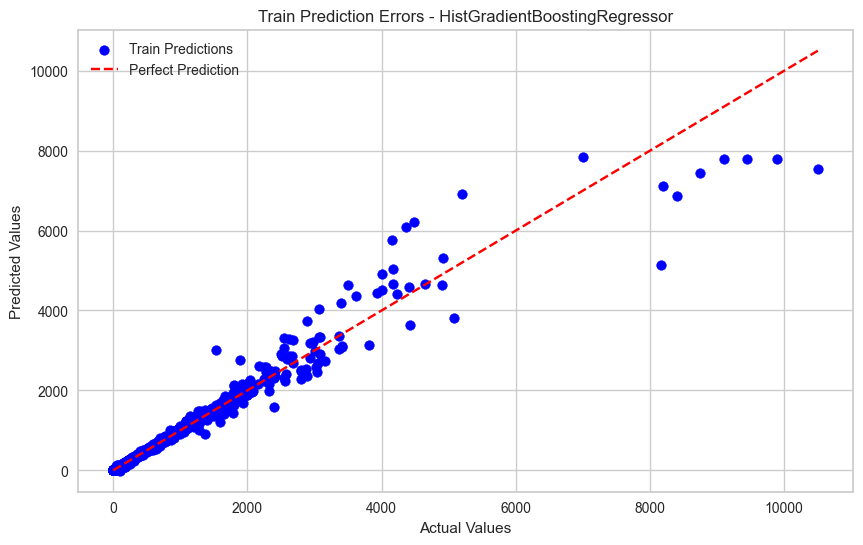

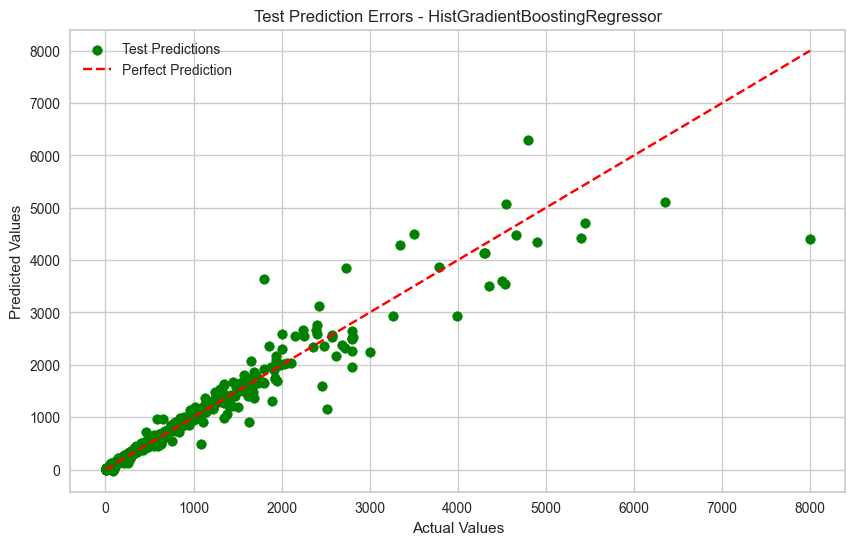

In [139]:
train_and_evaluate_model(HistGradientBoostingRegressor())

Model: RandomForestRegressor
Train R2 Score: 0.9943431569157
Test R2 Score: 0.961377214046583
Train MAE: 4.747117085109439, Test MAE: 14.26319288988989
Train RMSE: 39.87806760585869, Test RMSE: 101.88348931844732
Training Time: 4.677730560302734


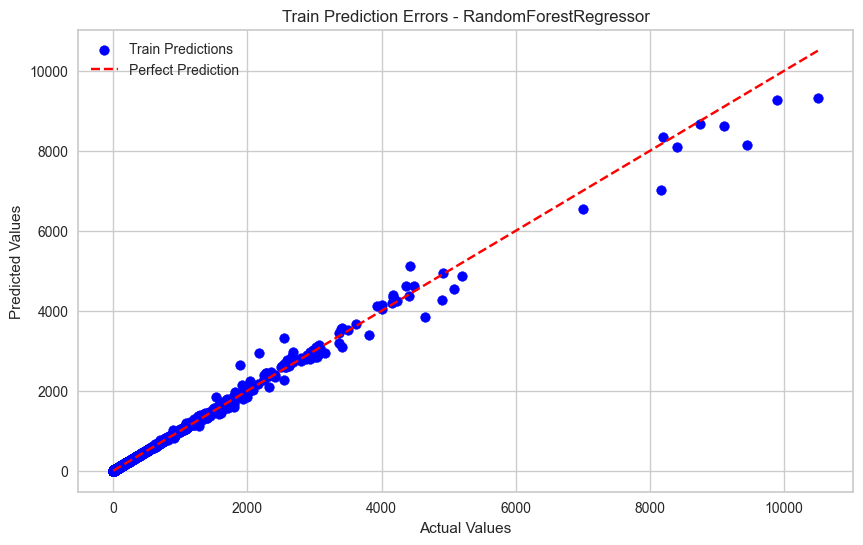

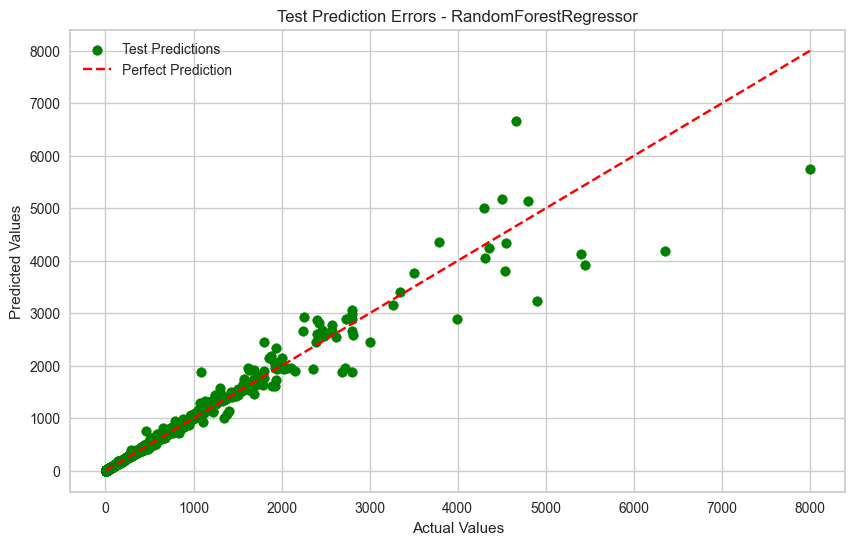

In [140]:
train_and_evaluate_model(RandomForestRegressor())

Model: XGBRegressor
Train R2 Score: 0.9999455888030673
Test R2 Score: 0.9645631776382535
Train MAE: 2.1281461294090303, Test MAE: 17.091719700807058
Train RMSE: 3.9110302866509756, Test RMSE: 97.59091669623685
Training Time: 0.24514055252075195


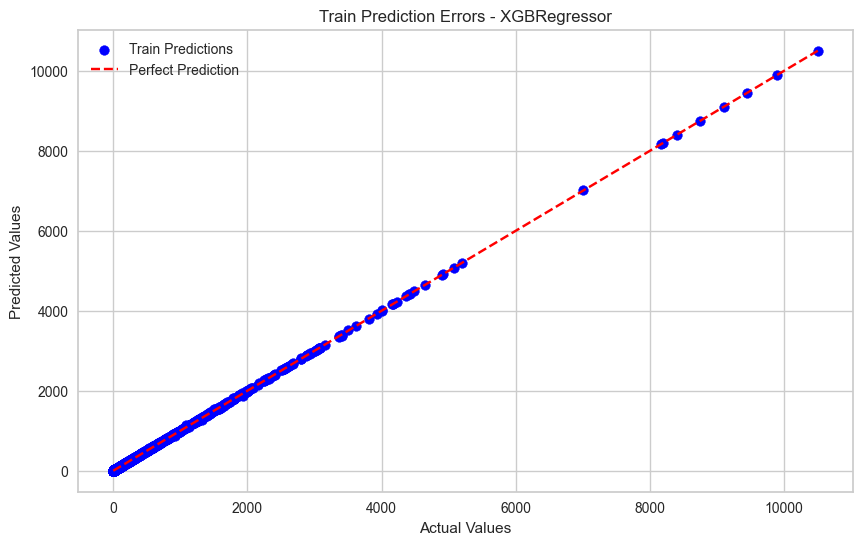

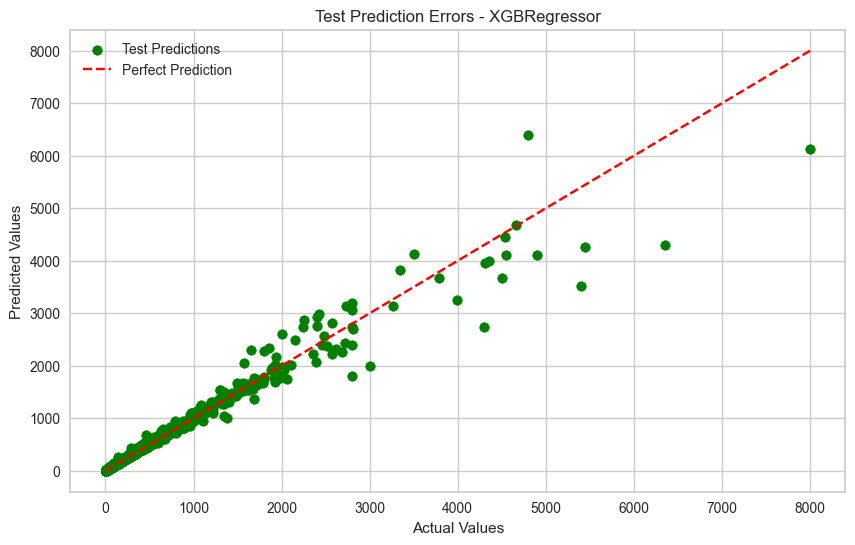

In [141]:
train_and_evaluate_model(XGBRegressor())

Model: CatBoostRegressor
Train R2 Score: 0.9995307405632307
Test R2 Score: 0.9606604184800718
Train MAE: 5.065878878998187, Test MAE: 17.901773051320596
Train RMSE: 11.485596282639852, Test RMSE: 102.82456468176068
Training Time: 4.2941224575042725


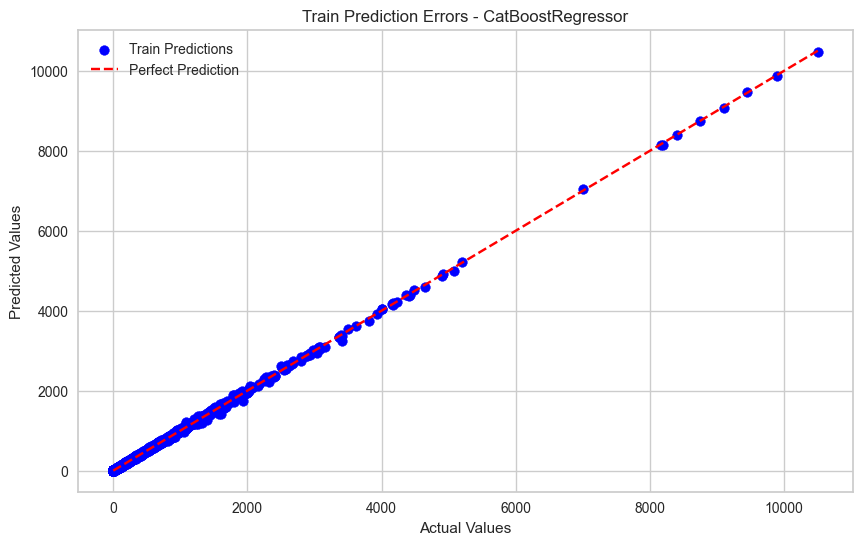

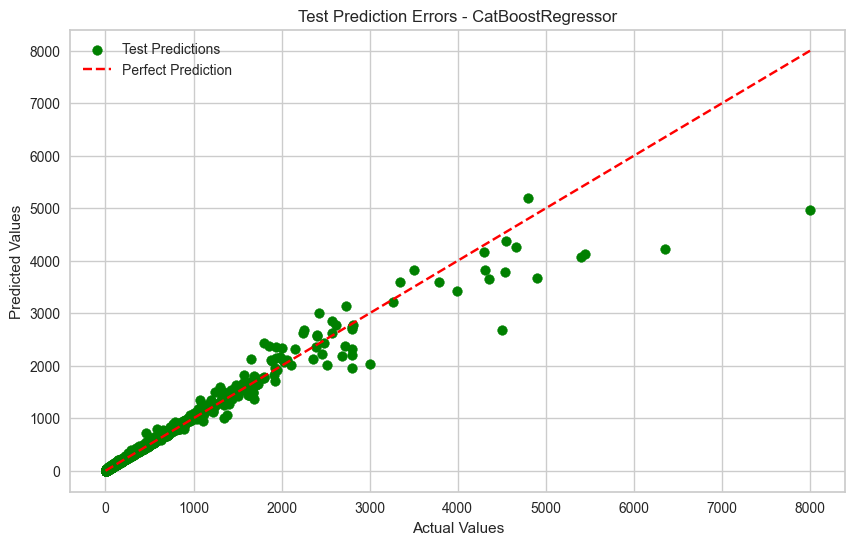

In [142]:
train_and_evaluate_model(CatBoostRegressor(silent=True))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1129
[LightGBM] [Info] Number of data points in the train set: 6991, number of used features: 10
[LightGBM] [Info] Start training from score 221.910060
Model: LGBMRegressor
Train R2 Score: 0.9638353743723821
Test R2 Score: 0.9591963838133675
Train MAE: 12.907745715780191, Test MAE: 18.645762437566177
Train RMSE: 100.82982795387127, Test RMSE: 104.72041112989591
Training Time: 0.3418607711791992


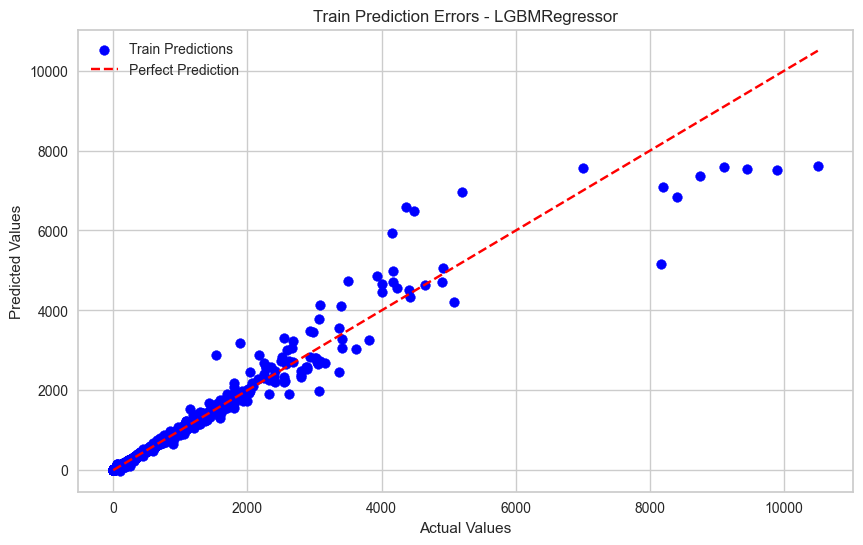

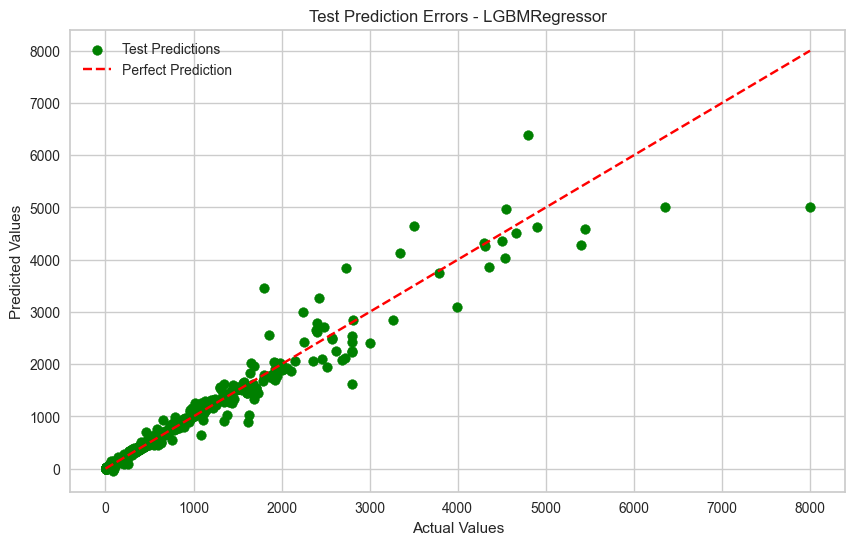

In [143]:
train_and_evaluate_model(LGBMRegressor())

[iter 0] loss=7.6922 val_loss=0.0000 scale=1.0000 norm=255.5840
[iter 100] loss=6.3421 val_loss=0.0000 scale=2.0000 norm=90.9302
[iter 200] loss=5.3874 val_loss=0.0000 scale=2.0000 norm=35.4227
[iter 300] loss=4.4015 val_loss=0.0000 scale=2.0000 norm=28.3314
[iter 400] loss=3.7229 val_loss=0.0000 scale=2.0000 norm=24.6798
Model: NGBRegressor
Train R2 Score: 0.9958700497360325
Test R2 Score: 0.9497559701843563
Train MAE: 11.446961267268529, Test MAE: 19.87738804314682
Train RMSE: 34.073712140309766, Test RMSE: 116.20484721389289
Training Time: 18.58046841621399


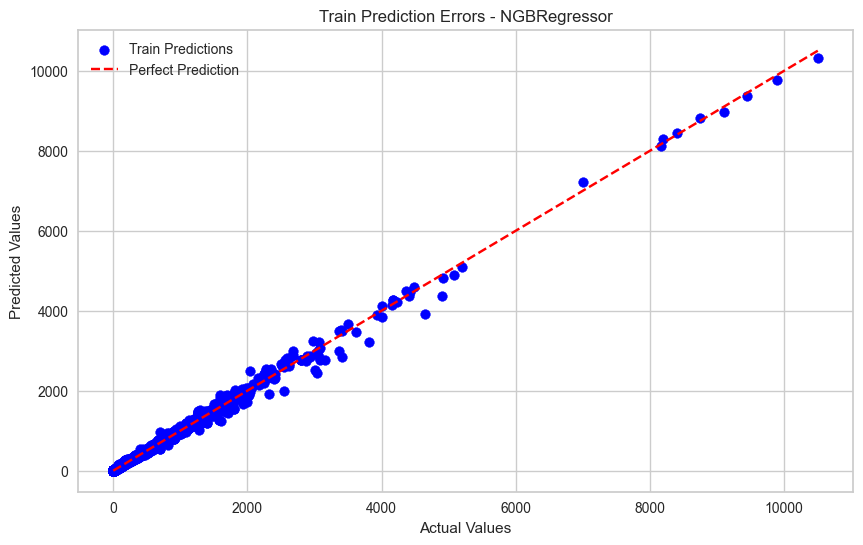

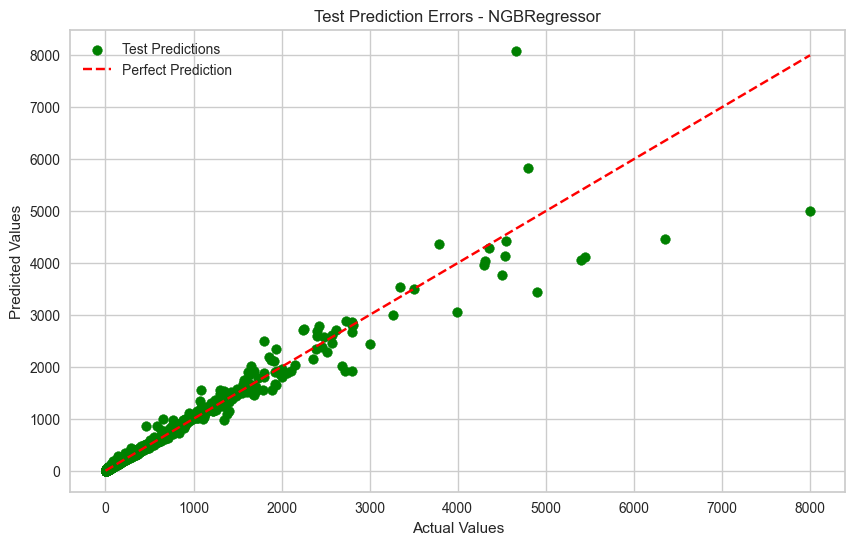

In [144]:
train_and_evaluate_model(NGBRegressor())

Model: XGBRFRegressor
Train R2 Score: 0.989207763353416
Test R2 Score: 0.9562969128716866
Train MAE: 15.440777411123523, Test MAE: 21.353970280734025
Train RMSE: 55.081120852407366, Test RMSE: 108.37723573091444
Training Time: 0.2079622745513916


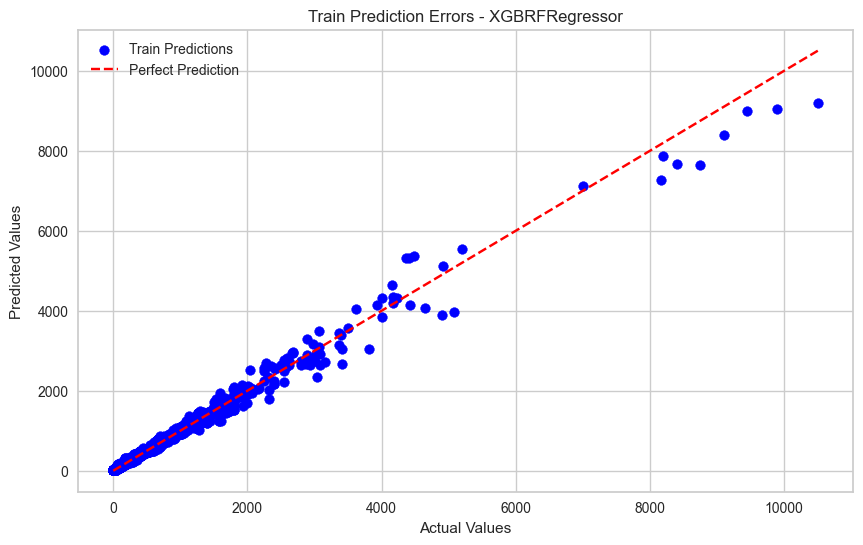

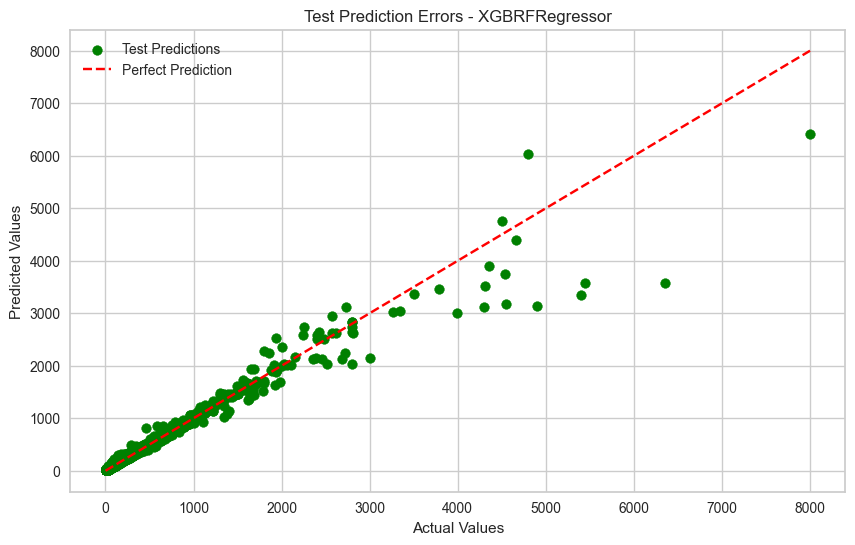

In [145]:
train_and_evaluate_model(XGBRFRegressor())

Model: MLPRegressor
Train R2 Score: 0.6314438766282259
Test R2 Score: 0.6919816403559345
Train MAE: 98.73690998925996, Test MAE: 99.25146404754346
Train RMSE: 321.8836037010336, Test RMSE: 287.72017350916406
Training Time: 6.4203221797943115


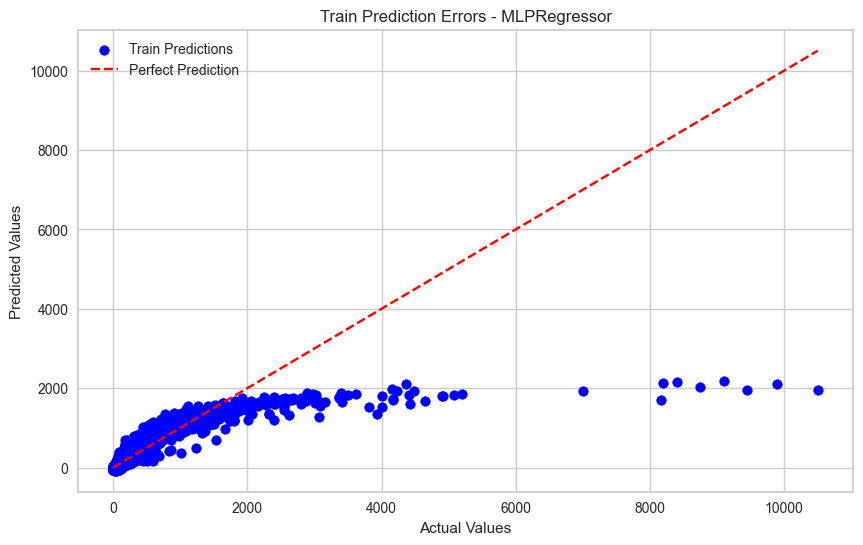

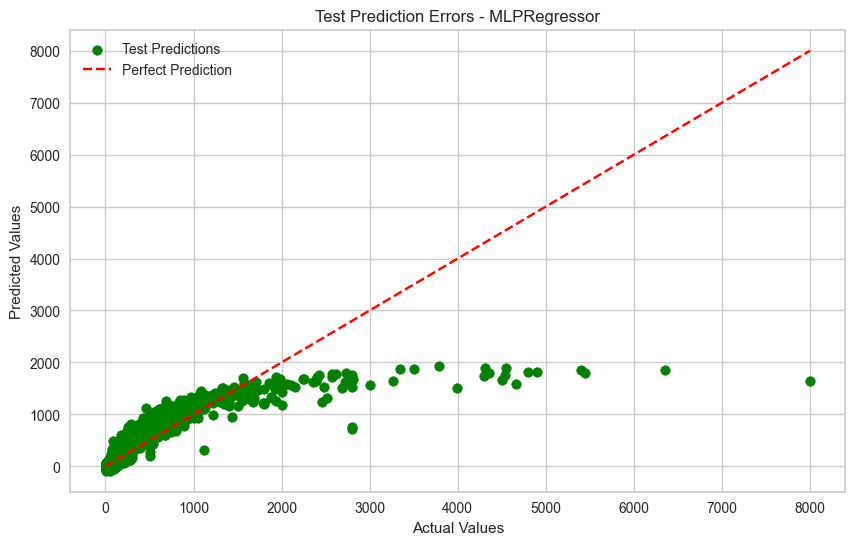

In [146]:
train_and_evaluate_model(MLPRegressor())

## Baseline Models Performance Comparison

In [147]:
model_perfs = pd.DataFrame({
    'Model': [m.__class__.__name__ for m in models],
    'Train R2': train_r2_scores,
    'Test R2': test_r2_scores,
    'Train MAE': train_mae_scores,
    'Test MAE': test_mae_scores,
    'Train RMSE': train_rmse_scores,
    'Test RMSE': test_rmse_scores,
    'Training Time': training_times
}).sort_values('Test R2', ascending=False).reset_index(drop=True)

# Display model performances in a table
model_perfs

,Model,Train R2,Test R2,Train MAE,Test MAE,Train RMSE,Test RMSE,Training Time
0,ExtraTreesRegressor,1.000000,0.974789,2.887998e-13,12.012504,8.852335e-13,82.314801,2.391563
1,XGBRegressor,0.999946,0.964563,2.128146e+00,17.091720,3.911030e+00,97.590917,0.245141
2,RandomForestRegressor,0.994343,0.961377,4.747117e+00,14.263193,3.987807e+01,101.883489,4.677731
3,CatBoostRegressor,0.999531,0.960660,5.065879e+00,17.901773,1.148560e+01,102.824565,4.294122
4,LGBMRegressor,0.963835,0.959196,1.290775e+01,18.645762,1.008298e+02,104.720411,0.341861
5,BaggingRegressor,0.991795,0.958994,5.802398e+00,15.596935,4.802730e+01,104.980137,0.484203
6,XGBRFRegressor,0.989208,0.956297,1.544078e+01,21.353970,5.508112e+01,108.377236,0.207962
7,DecisionTreeRegressor,1.000000,0.952145,1.527410e-16,16.188377,1.584261e-15,113.408094,0.123786
8,HistGradientBoostingRegressor,0.966856,0.950026,1.308215e+01,20.295129,9.652748e+01,115.892593,0.729304
9,NGBRegressor,0.995870,0.949756,1.144696e+01,19.877388,3.407371e+01,116.204847,18.580468


The Extra Trees Regressor is the best performing model which achieved an incredible r2 score of more than 97% on the test set. It's closely followed by the Decision Trees Regressor model which produced an amazing r2 score of approximately 96.2%.

## Cross Validation & Hyperparameter Tuning

In [148]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import cross_val_score
import numpy as np

final_X_train = np.array(final_X_train) 
y_train = np.array(y_train) 
model = ExtraTreesRegressor()

mean_r2 = np.mean(cross_val_score(model, final_X_train, y_train, cv=5, scoring='r2'))

print(f"Mean cross-validation training R2 score of Extra Trees Regressor: {round(mean_r2 * 100, 2)}%")


Mean cross-validation training R2 score of Extra Trees Regressor: 96.22%


In [149]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import ExtraTreesRegressor
import numpy as np

final_X_test = np.array(final_X_test)  
y_test = np.array(y_test) 

model = ExtraTreesRegressor()

mean_test_r2 = np.mean(cross_val_score(model, final_X_test, y_test, cv=5, scoring='r2'))

print(f"Mean cross-validation test R2 score of Extra Trees Regressor: {round(mean_test_r2 * 100, 2)}%")


Mean cross-validation test R2 score of Extra Trees Regressor: 95.5%


The cross validation R2 score of the Extra Trees Regressor model on the test set is comparable to the training cross validation R2 score so there seems to be no overfitting.

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=8, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=12, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, 

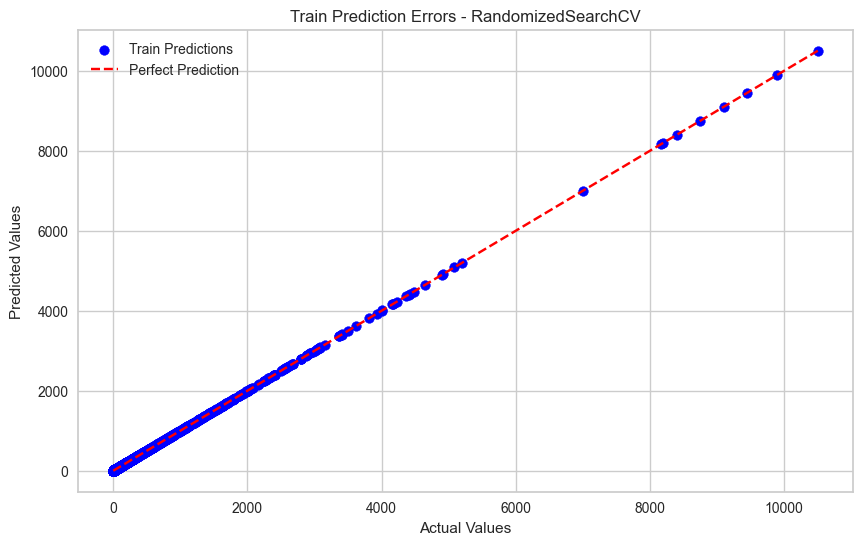

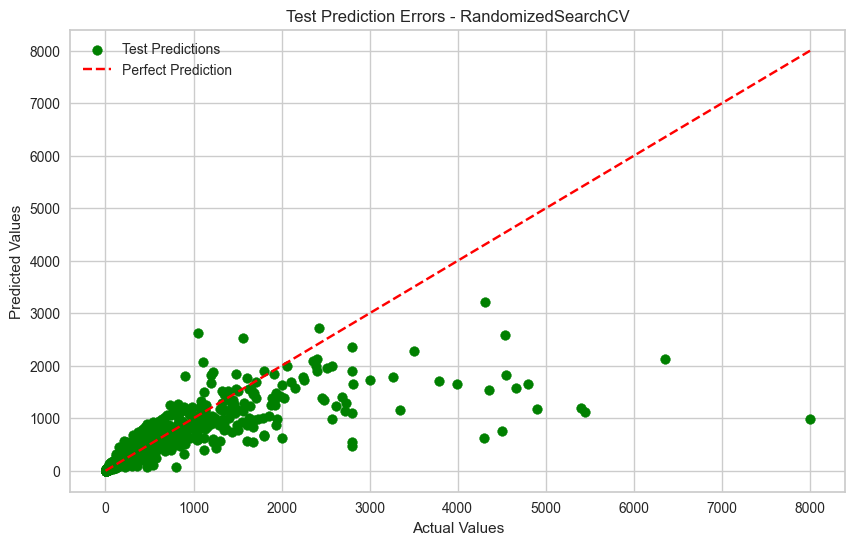

In [150]:
param_grid = {'n_neighbors': [2,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'brute', 'kd_tree'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev'],
              'p': [1,2]
             }

grid_knn = RandomizedSearchCV(KNeighborsRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_knn)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=poisson, max_bins=100; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=poisson, max_bins=100; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=poisson, max_bins=100; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=poisson, max_bins=100; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=poisson, max_bins=100; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=absolute_error, max_bins=150; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=absolute_error, max_bins=150; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=absolute_error, max_bins=150; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, lo

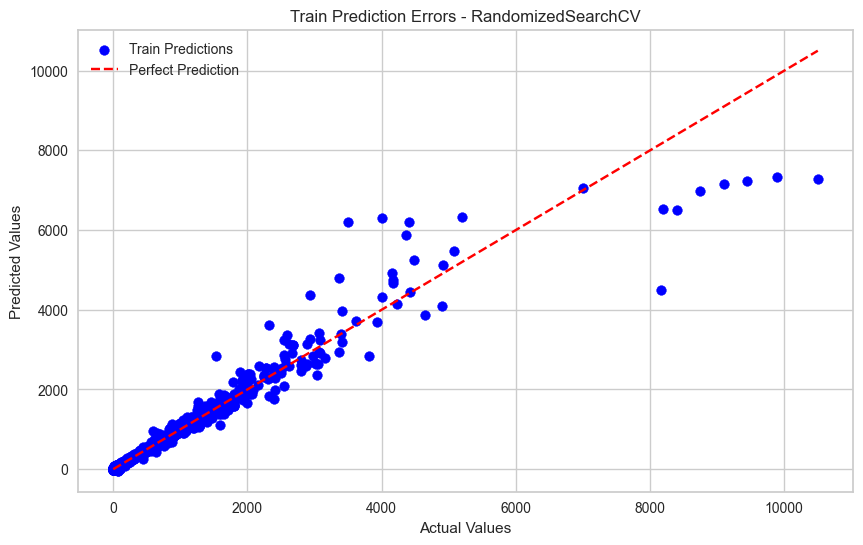

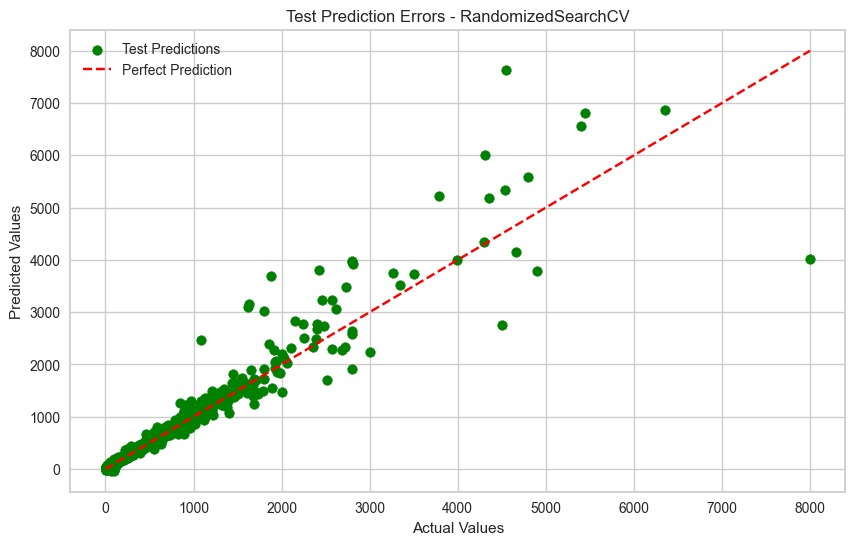

In [151]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.8,1.0],
              'loss': ['squared_error','absolute_error','poisson','quantile'],
              'max_bins': np.arange(0,255,50),
              'interaction_cst': ['pairwise','no_interaction']}

grid_hgb = RandomizedSearchCV(HistGradientBoostingRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_hgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Model: RandomizedSearchCV
Train R2 Score: 0.3413073463610137
Test R2 Score: 0.3778931976691323
Train MAE: 207.63682002248052, Test MAE: 212.1940844309236
Train RMSE: 430.31694615579244, Test RMSE: 408.89752960736445
Training Time: 8.31861138343811


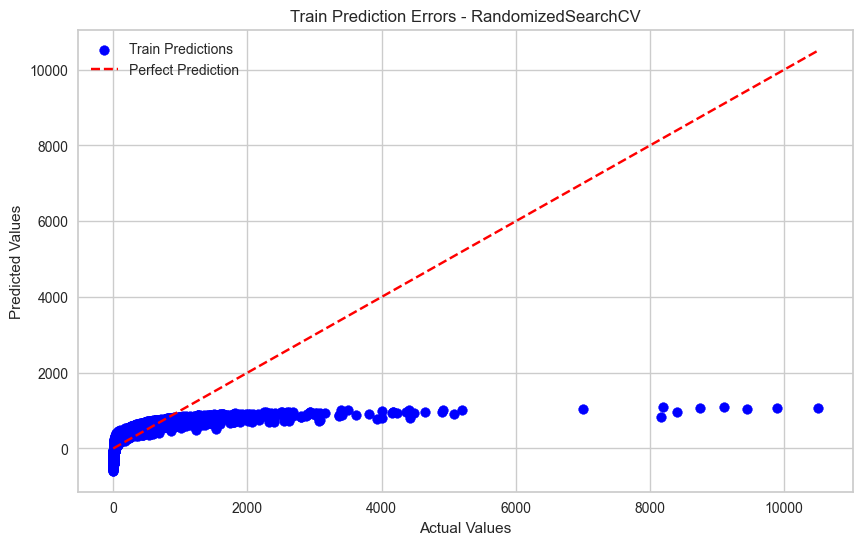

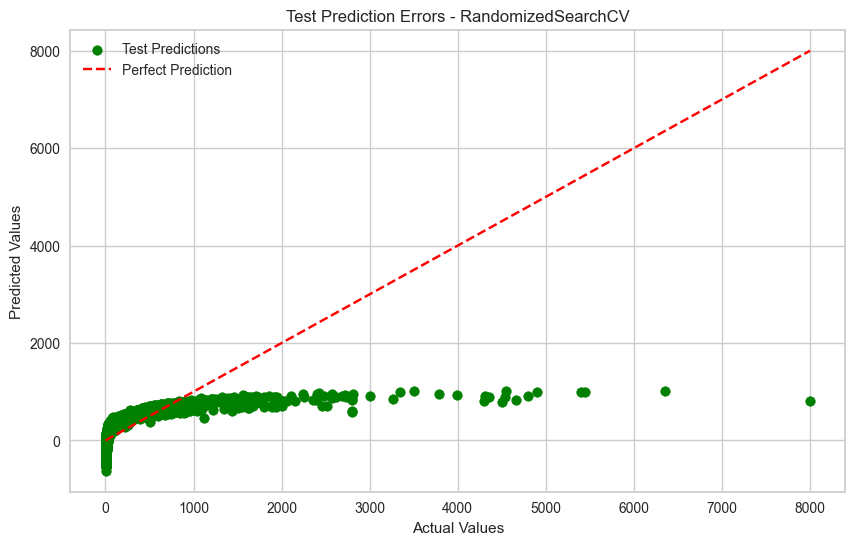

In [152]:
param_grid = {'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
             'C': [0.0001,0.001,0.01,0.1,1],
             'epsilon': np.linspace(0.001,1,5)}

grid_lsvr = RandomizedSearchCV(LinearSVR(),param_grid,cv=5,verbose=2,n_jobs=10)
train_and_evaluate_model(grid_lsvr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=poisson, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=poisson, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=poisson, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=poisson, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=poisson, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=random; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=random; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=random; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=random; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=auto, splitter=random; total time=   0.0s
[CV] END criterion=squared_error, max_features=log2, splitter=best; total time=   0.0s
[CV] EN

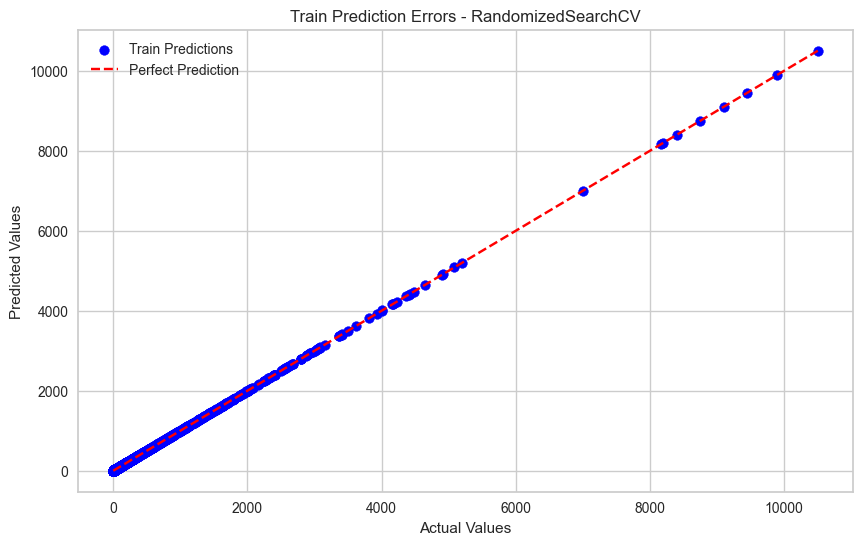

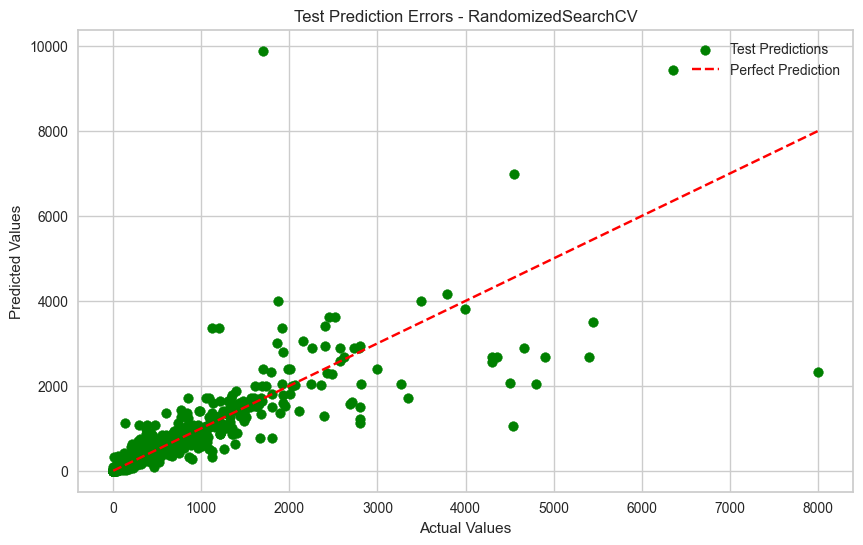

In [153]:
param_grid = {'criterion': ['squared_error','friedman_mse','absolute_error','poisson'],
              'splitter': ['best','random'],
              'max_features': ['auto','sqrt','log2']
             }

grid_dt = RandomizedSearchCV(DecisionTreeRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_dt)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=squared_error, learning_rate=0.7, loss=squared_error, max_features=sqrt, n_estimators=1000;, score=0.960 total time=   3.9s
[CV 2/5] END criterion=squared_error, learning_rate=0.7, loss=squared_error, max_features=sqrt, n_estimators=1000;, score=0.907 total time=   3.8s
[CV 3/5] END criterion=squared_error, learning_rate=0.7, loss=squared_error, max_features=sqrt, n_estimators=1000;, score=0.942 total time=   3.7s
[CV 4/5] END criterion=squared_error, learning_rate=0.7, loss=squared_error, max_features=sqrt, n_estimators=1000;, score=0.908 total time=   3.5s
[CV 5/5] END criterion=squared_error, learning_rate=0.7, loss=squared_error, max_features=sqrt, n_estimators=1000;, score=0.911 total time=   3.5s
[CV 1/5] END criterion=squared_error, learning_rate=0.4, loss=quantile, max_features=auto, n_estimators=400;, score=nan total time=   0.0s
[CV 2/5] END criterion=squared_error, learning_rate=0.4, loss=qua

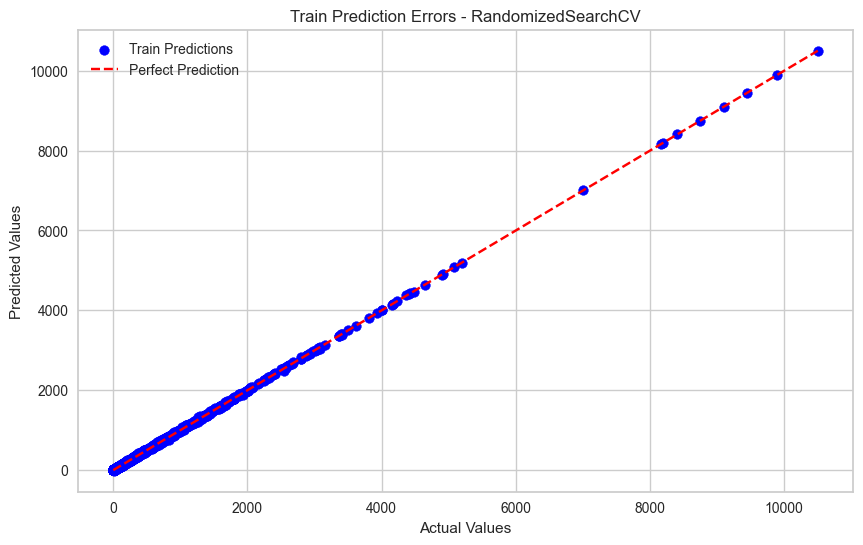

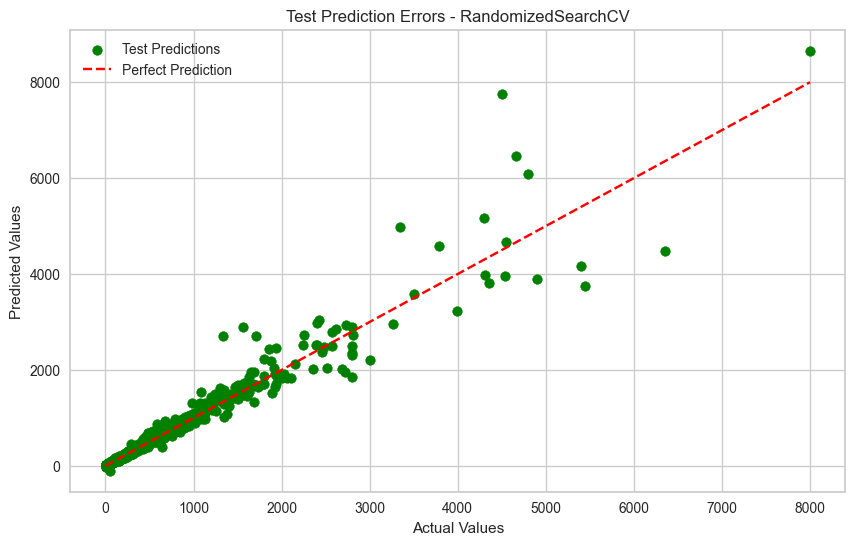

In [154]:
param_grid =  {'loss': ['squared_error','absolute_error','huber','quantile'],
                'n_estimators': [100,400,700,1000],
                'learning_rate': [0.2,0.4,0.7,1],
                'criterion': ['friedman_mse','squared_error'],
                'max_features': ['auto','sqrt','log2']
                }
    
grid_gb = RandomizedSearchCV(GradientBoostingRegressor(),param_grid,verbose=4,cv=5)
train_and_evaluate_model(grid_gb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.4, n_estimators=1000;, score=0.910 total time=   3.5s
[CV 2/5] END learning_rate=0.4, n_estimators=1000;, score=0.885 total time=   3.6s
[CV 3/5] END learning_rate=0.4, n_estimators=1000;, score=0.922 total time=   3.5s
[CV 4/5] END learning_rate=0.4, n_estimators=1000;, score=0.932 total time=   3.7s
[CV 5/5] END learning_rate=0.4, n_estimators=1000;, score=0.942 total time=   3.5s
[CV 1/5] END learning_rate=0.7, n_estimators=1000;, score=0.902 total time=   3.5s
[CV 2/5] END learning_rate=0.7, n_estimators=1000;, score=0.900 total time=   3.6s
[CV 3/5] END learning_rate=0.7, n_estimators=1000;, score=0.906 total time=   3.7s
[CV 4/5] END learning_rate=0.7, n_estimators=1000;, score=0.916 total time=   4.0s
[CV 5/5] END learning_rate=0.7, n_estimators=1000;, score=0.932 total time=   4.2s
[CV 1/5] END learning_rate=0.4, n_estimators=400;, score=0.910 total time=   1.6s
[CV 2/5] END learning_rate=

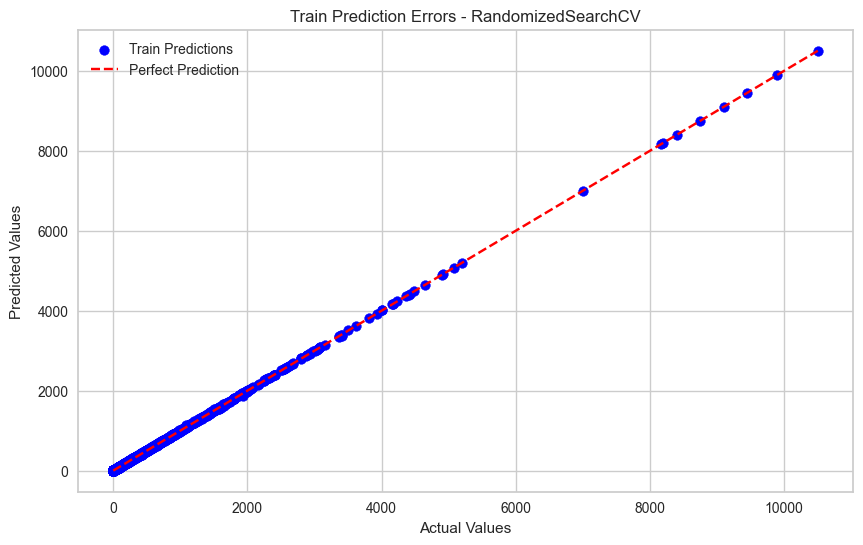

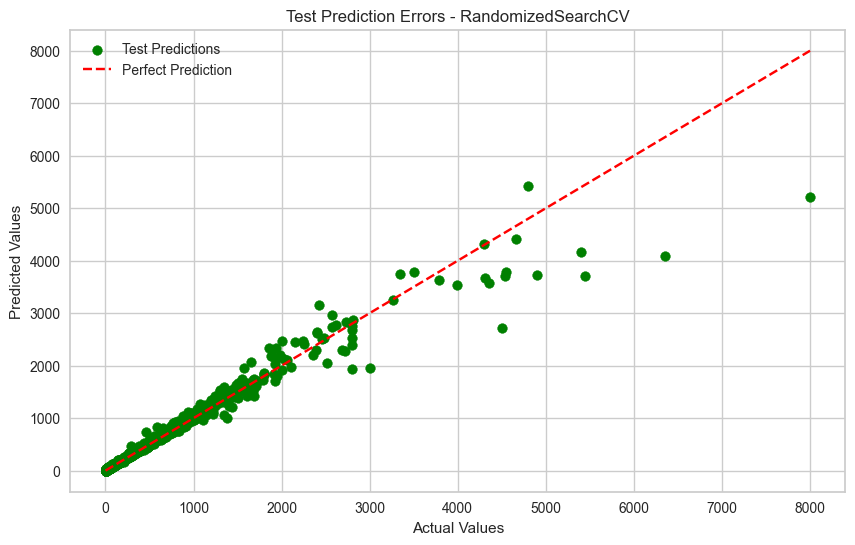

In [155]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.7,1],
'n_estimators': [100,400,700,800,1000]
}
    
grid_cat = RandomizedSearchCV(CatBoostRegressor(silent=True),param_grid,verbose=5,cv=5)
train_and_evaluate_model(grid_cat)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END booster=dart, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, grow_policy=1, importance_type=weight, learning_rate=1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, grow_policy=1, importance_type=total_gain, learning_rate=0.4, n_estimators=700, sampling_method=gradient_based;, score=nan tota

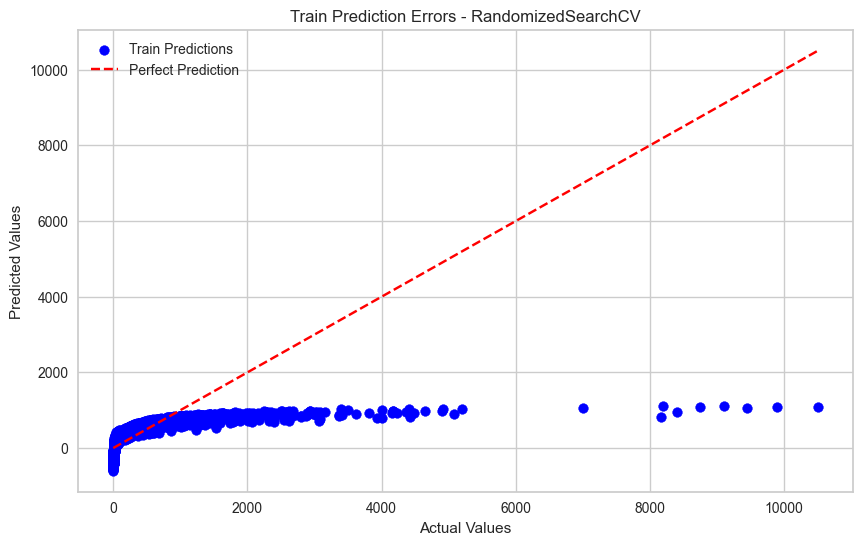

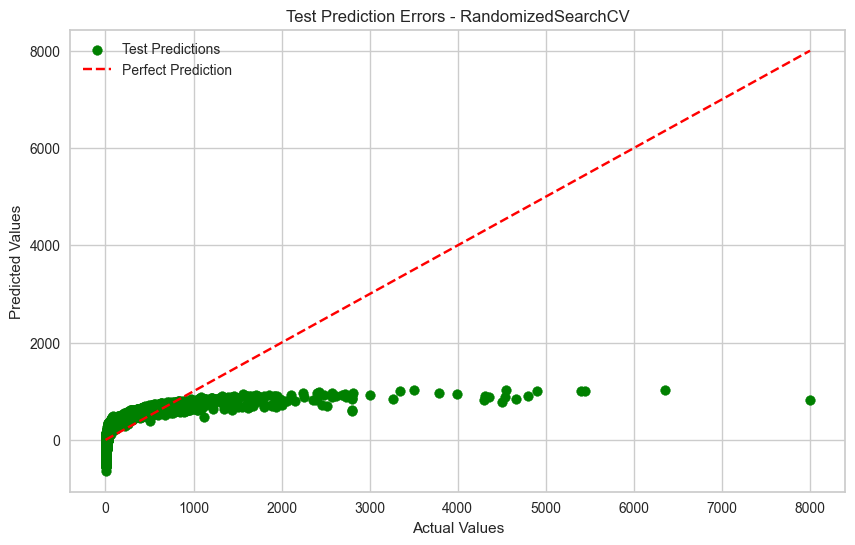

In [156]:
param_grid = {'n_estimators': [100,400,700,1000],
        'grow_policy': [0,1],
        'learning_rate': [0.1,0.4,0.7,1],
        'booster': ['gbtree','gblinear','dart'],
        'sampling_method': ['uniform','gradient_based'],
        'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgb = RandomizedSearchCV(XGBRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_xgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END alpha=0.0001, average=False, epsilon=66.667, l1_ratio=0.97, learning_rate=constant, loss=epsilon_insensitive, penalty=l2, shuffle=True;, score=0.248 total time=   0.0s
[CV 2/5] END alpha=0.0001, average=False, epsilon=66.667, l1_ratio=0.97, learning_rate=constant, loss=epsilon_insensitive, penalty=l2, shuffle=True;, score=0.191 total time=   0.0s
[CV 3/5] END alpha=0.0001, average=False, epsilon=66.667, l1_ratio=0.97, learning_rate=constant, loss=epsilon_insensitive, penalty=l2, shuffle=True;, score=0.204 total time=   0.0s
[CV 4/5] END alpha=0.0001, average=False, epsilon=66.667, l1_ratio=0.97, learning_rate=constant, loss=epsilon_insensitive, penalty=l2, shuffle=True;, score=0.195 total time=   0.0s
[CV 5/5] END alpha=0.0001, average=False, epsilon=66.667, l1_ratio=0.97, learning_rate=constant, loss=epsilon_insensitive, penalty=l2, shuffle=True;, score=0.306 total time=   0.0s
[CV 1/5] END alpha=1, average=Fals

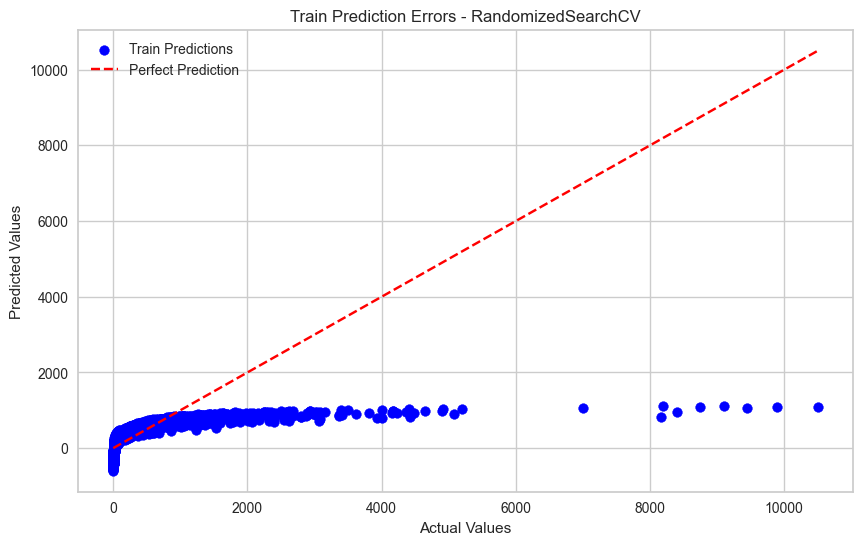

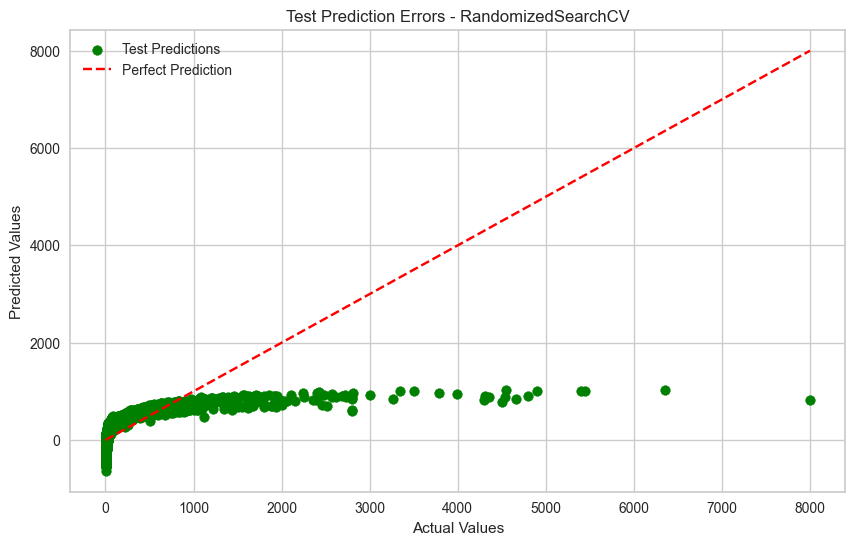

In [157]:
param_grid = {  
                'loss': ['squared_error','huber','epsilon_insensitive','squared_epsilon_insensitive'],
                'penalty': ['l2', 'l1', 'elasticnet'],
                'l1_ratio': [0.15,0.45,0.68,0.81,0.97],
                'alpha': [0.0001,0.001,0.01,0.1,1],
                'shuffle': [True,False],
                'learning_rate': ['adaptive','constant','optimal','invscaling'],
                'epsilon': np.linspace(0.001,100,10),
                'average': [True,False]
             }

grid_sgd = RandomizedSearchCV(SGDRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_sgd)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..........................alpha=0.0001, epsilon=2.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=2.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=2.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=2.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=2.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=1.0; total time=   0.0s
[CV] END ..........................alpha=8.8889, epsilon=8.0; total time=   0.0s
[CV] END ..........................alpha=8.8889,

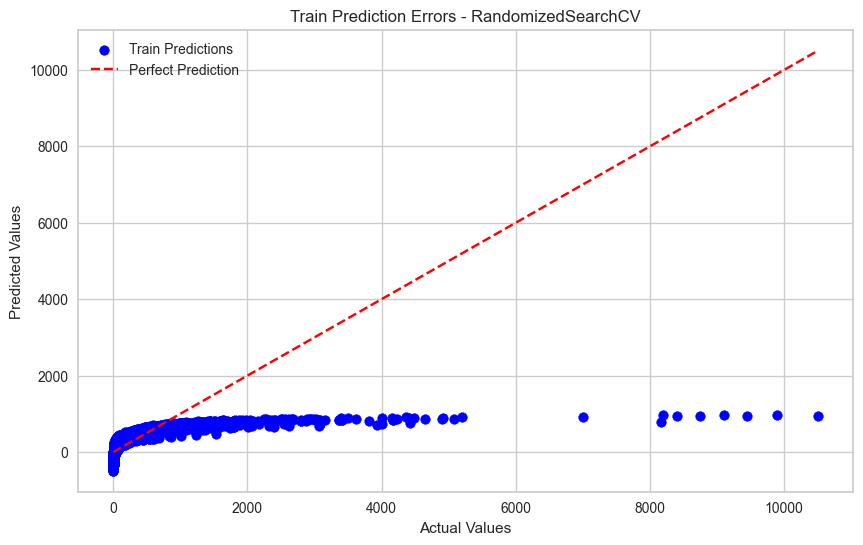

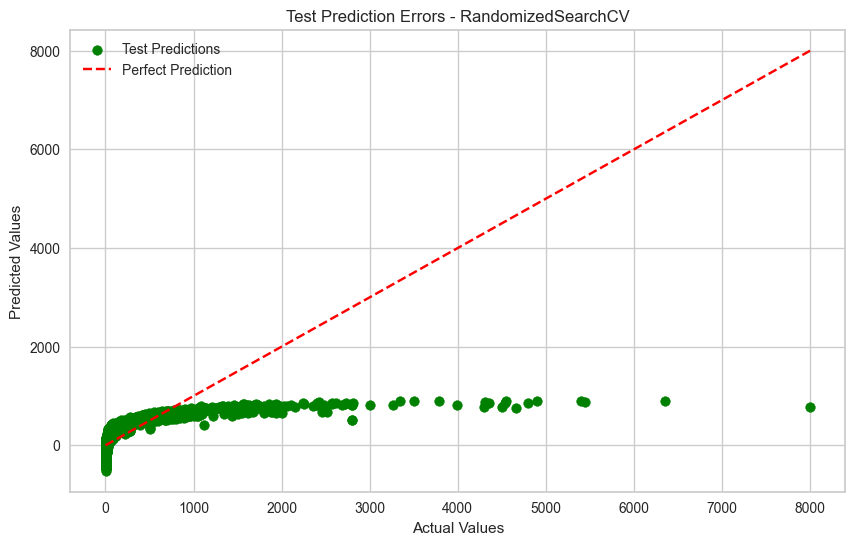

In [158]:
param_grid = {'epsilon': np.linspace(1,10,10),
'alpha': np.linspace(0.0001,10,10)}

grid_huber = RandomizedSearchCV(HuberRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_huber)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END .....alpha=5.5556, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=5.5556, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=5.5556, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=5.5556, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=5.5556, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=2.2223, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END ..........alpha=3.3334, link=identity, solver=lbfgs; total time=   0.0s
[CV] END ..........alpha=3.3334, link=identity, 

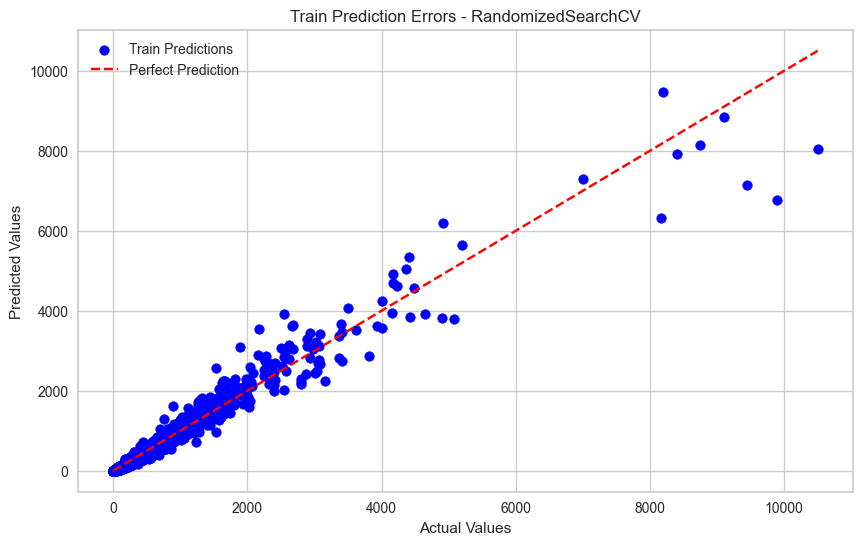

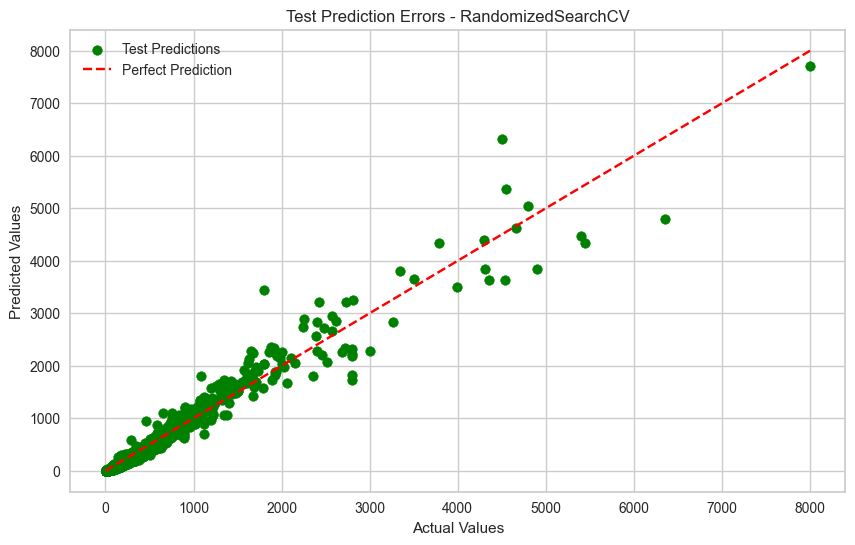

In [159]:
param_grid = {'link': ['auto', 'identity', 'log'],
'solver': ['lbfgs', 'newton-cholesky'],
'alpha': np.linspace(0.0001,10,10)}

grid_tweedie = RandomizedSearchCV(TweedieRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_tweedie)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.001, average=False, epsilon=0.001, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=0.001, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=0.001, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=0.001, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.001, average=False, epsilon=0.001, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.01, average=True, epsilon=1.0, loss=squared_epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.01, average=True, epsilon=1.0, loss=squared_epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.01, average=True, epsilon=1.0, loss=squared_epsilon_insensitive, shuffle=True; total time=   0.0s
[CV] END C=0.01, average=T

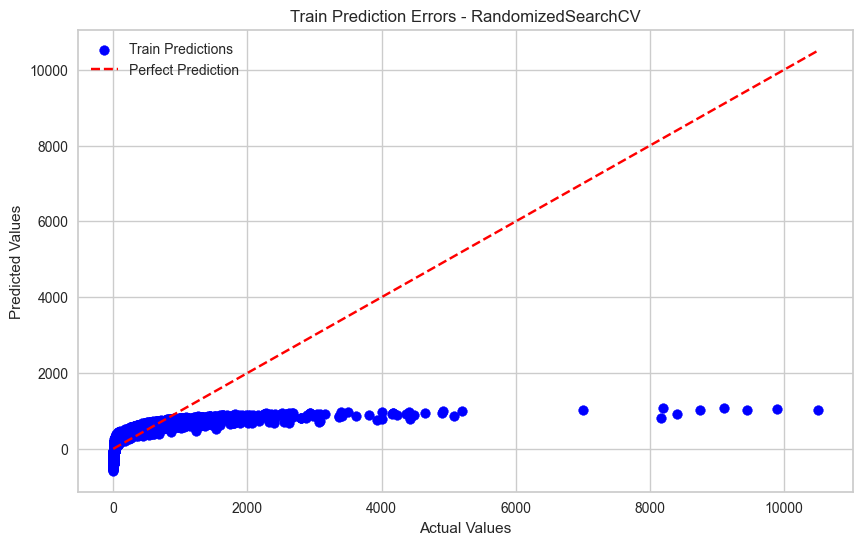

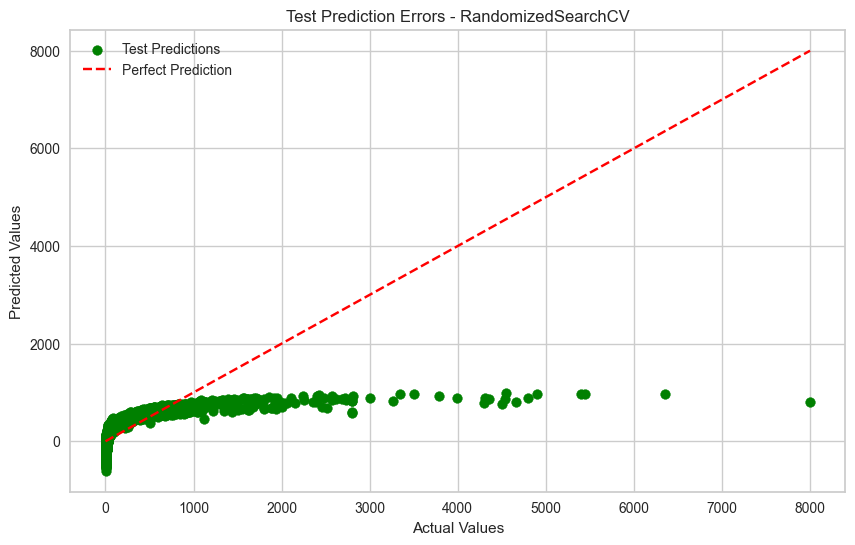

In [160]:
param_grid = {'C': [0.0001,0.001,0.01,0.1,1,10],
            'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
            'epsilon': np.linspace(0.001,1,5),
            'shuffle': [True,False],
            'average': [True,False]}

grid_pa = RandomizedSearchCV(PassiveAggressiveRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_pa)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, positive=True, selection=random; total time=   0.0s
[CV] END 

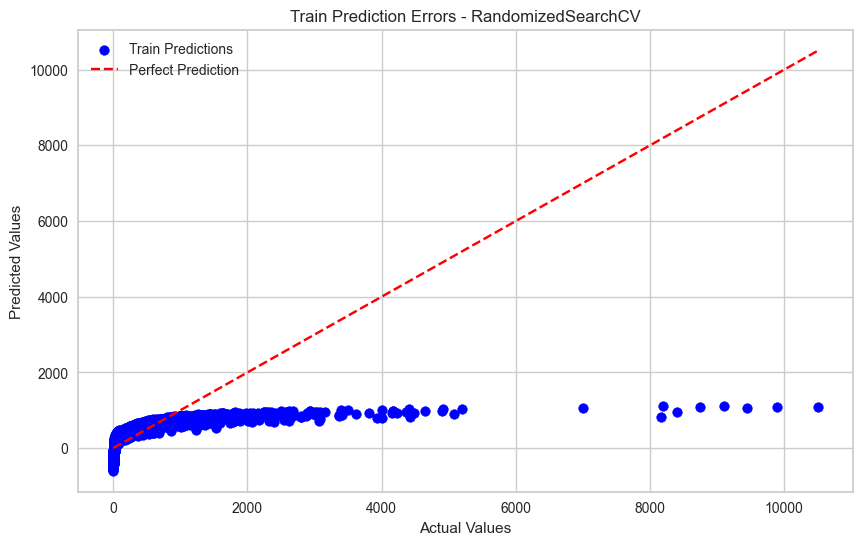

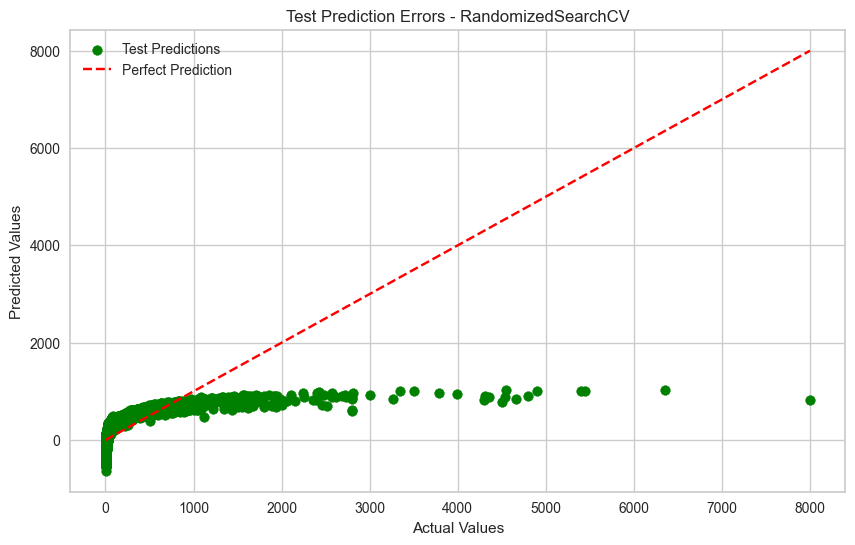

In [161]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'selection': ['cyclic','random'],
            'fit_intercept': [True,False]
}

grid_lasso = RandomizedSearchCV(Lasso(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lasso)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.01, fit_intercept=True, positive=True, solver=saga; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, positive=True, solver=saga; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, positive=True, solver=saga; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, positive=True, solver=saga; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, positive=True, solver=saga; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, positiv

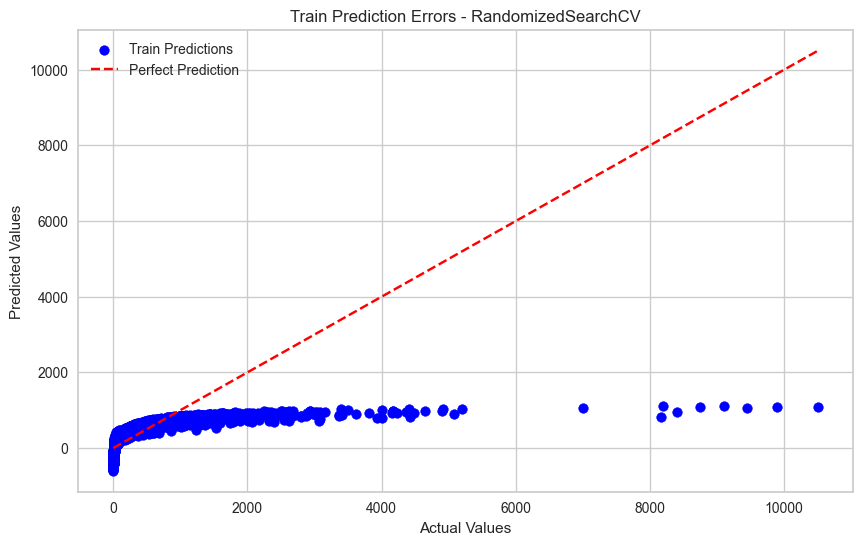

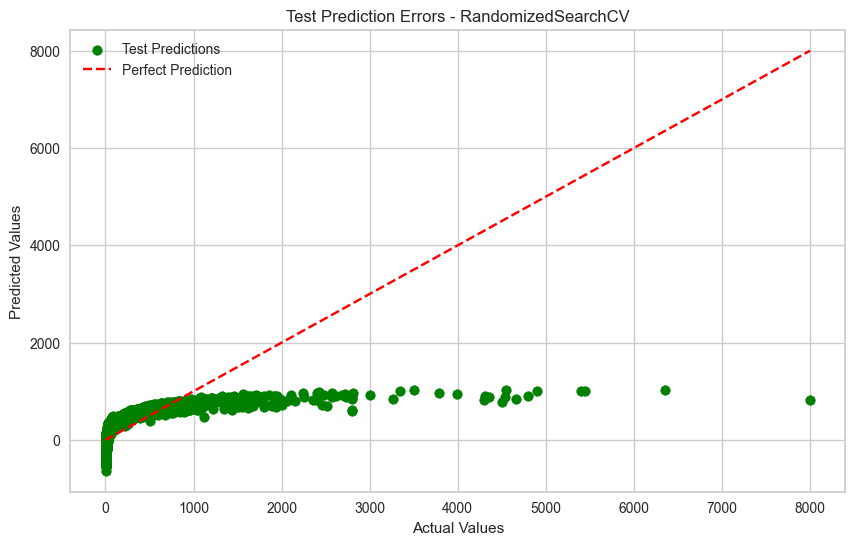

In [162]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'fit_intercept': [True,False],
            'solver': ['svd','cholesky','lsqr','sparse_cg','sag','saga','lbfgs']
}

grid_ridge = RandomizedSearchCV(Ridge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=0.3, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=0.3, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=0.3, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=0.3, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=0.3, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=1, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=1, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=1, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=1, positive=False, selecti

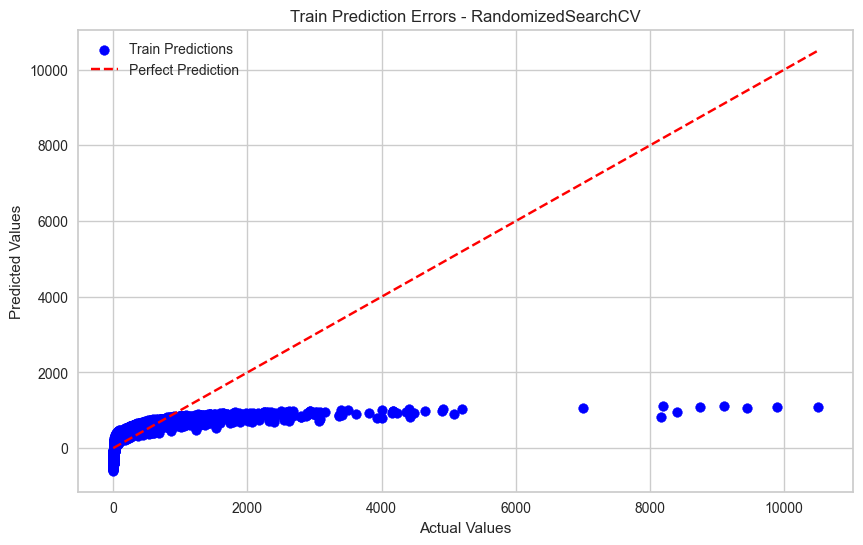

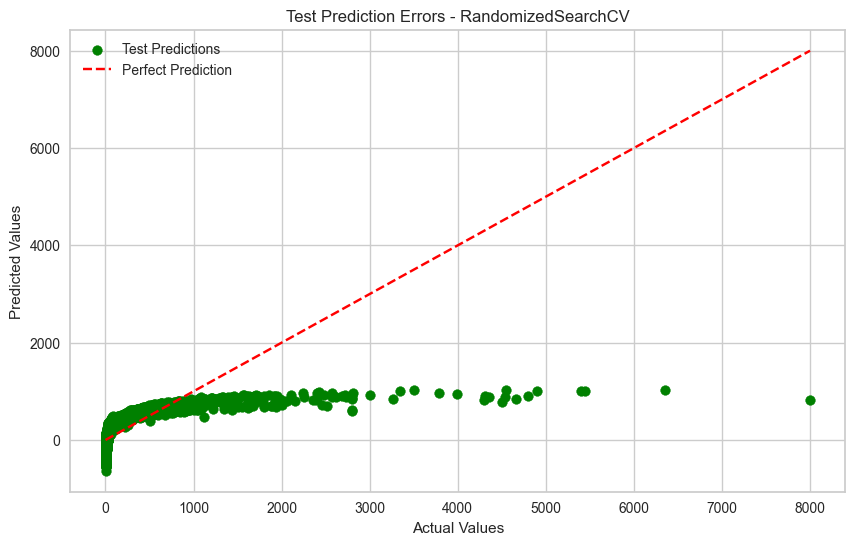

In [163]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'selection': ['cyclic','random'],
    'l1_ratio': [0.1,0.3,0.5,0.8,1],
    'positive': [True,False],
    'fit_intercept': [True,False]
}

grid_elasticnet = RandomizedSearchCV(ElasticNet(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_elasticnet)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=True, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=True, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-06, 

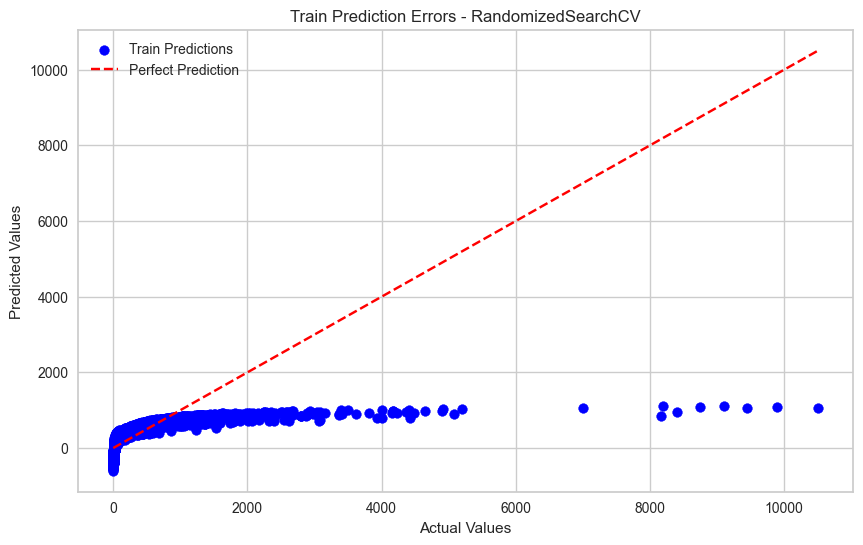

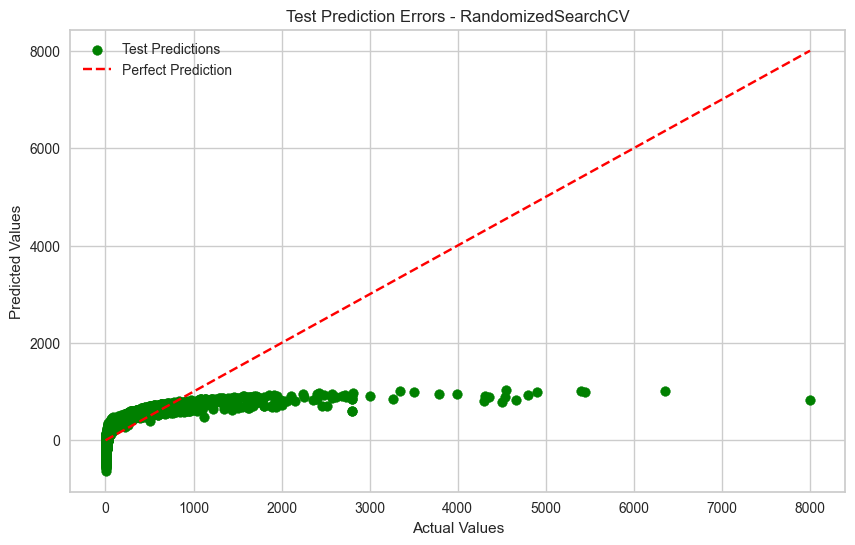

In [164]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]}

grid_ard = RandomizedSearchCV(ARDRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ard)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=False, positive=True; total time=   0.0s
[CV] END .................fit_intercept=False, po

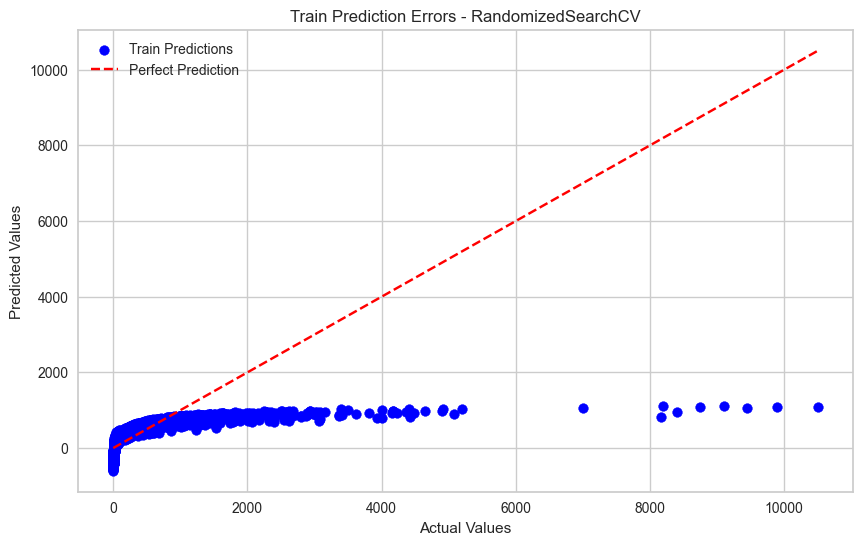

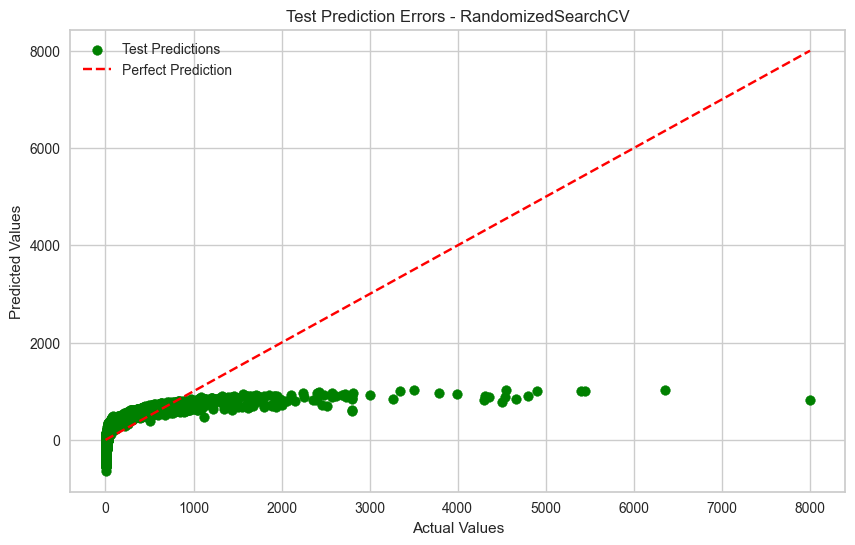

In [165]:
param_grid = {'fit_intercept': [True,False],
'positive': [True,False]}

grid_lr = RandomizedSearchCV(LinearRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.0

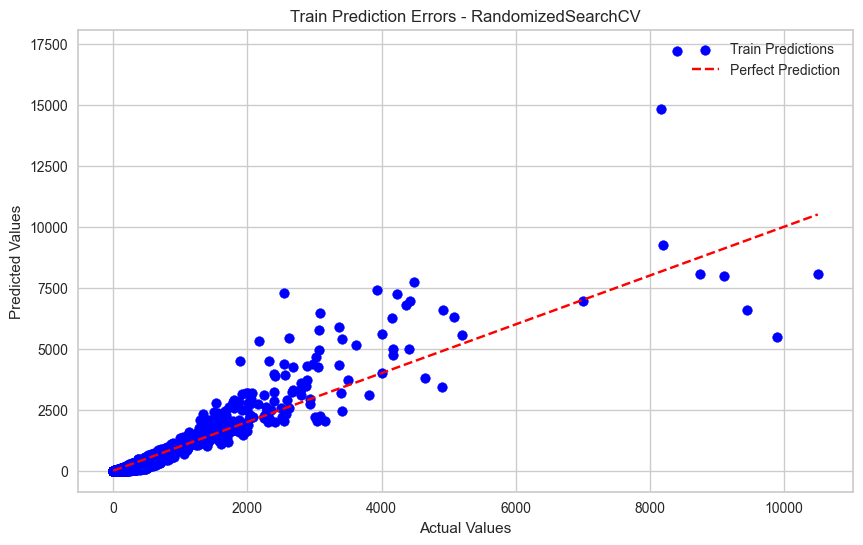

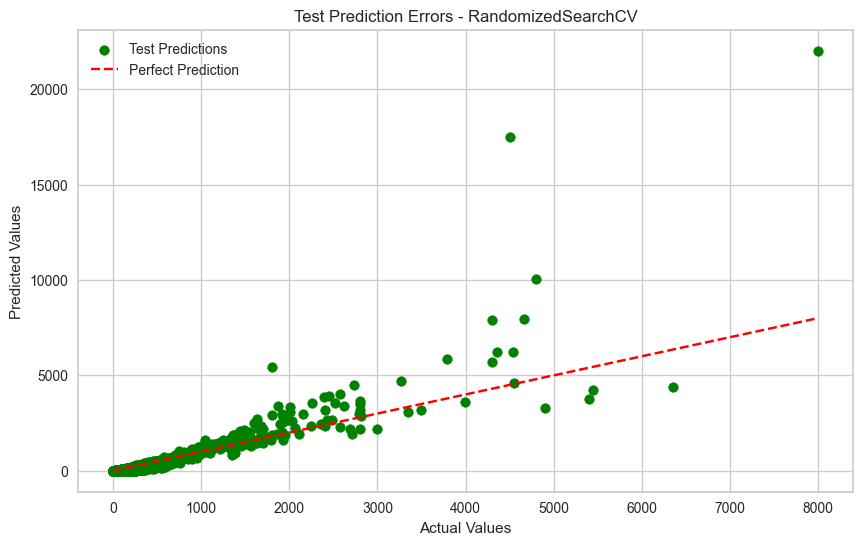

In [166]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_poisson = RandomizedSearchCV(estimator=PoissonRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_poisson)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.0; total time=   0.0s
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.0; total time=   0.0s
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.0; total time=   0.0s
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.0; total time=   0.0s
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.0; total time=   0.0s
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   0.3s
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   0.2s
[CV] END loss=squared_error, min_samples=0.75, stop_probability=

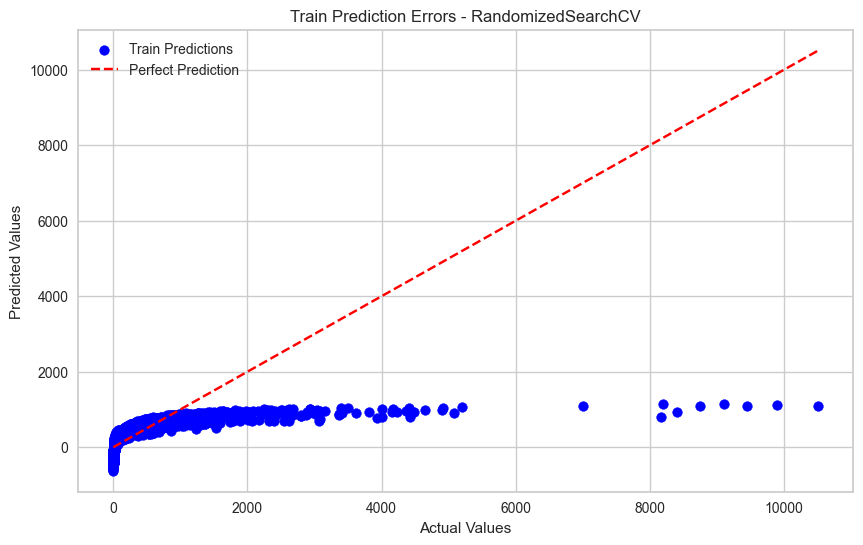

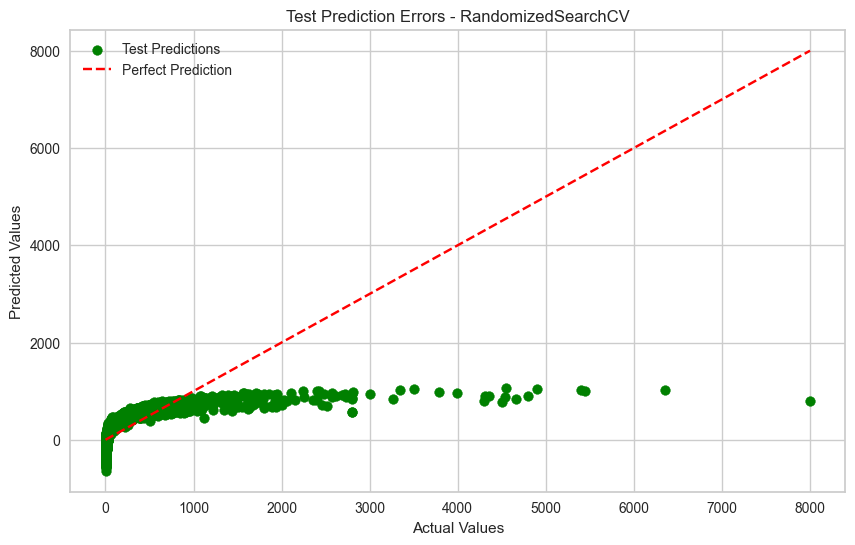

In [167]:
param_grid = {
    'stop_probability': np.linspace(0,1,5),
    'loss': ['absolute_error','squared_error'],
    'min_samples': np.linspace(0,1,5)[1:]
}

grid_ransac = RandomizedSearchCV(estimator=RANSACRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ransac)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=0.25, n_estimators=200, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=0.25, n_estimators=200, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=0.25, n_estimators=200, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=0.25, n_estimators=200, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=0.25, n_estimators=200, oob_score=True, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, criterion=squared_error, max_features=log2, max_samples=0.75, n_estimators=500, oob_score=False, warm_start=False; tot

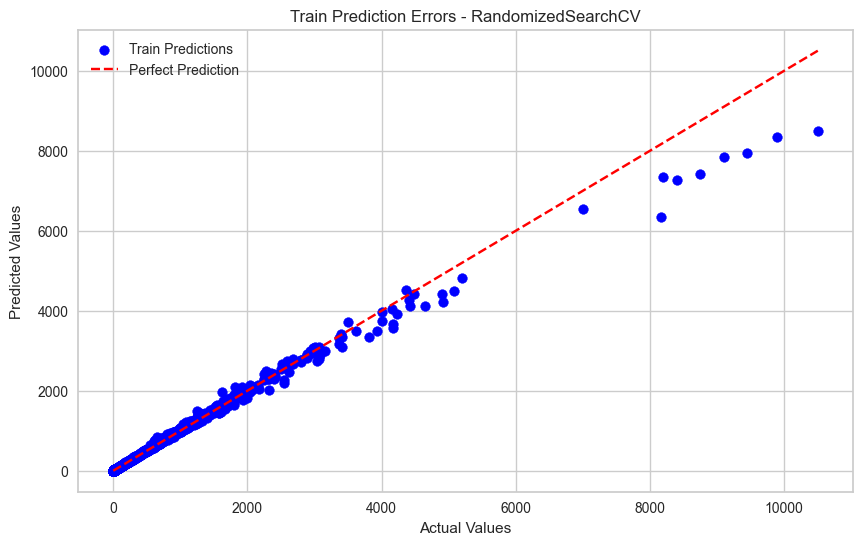

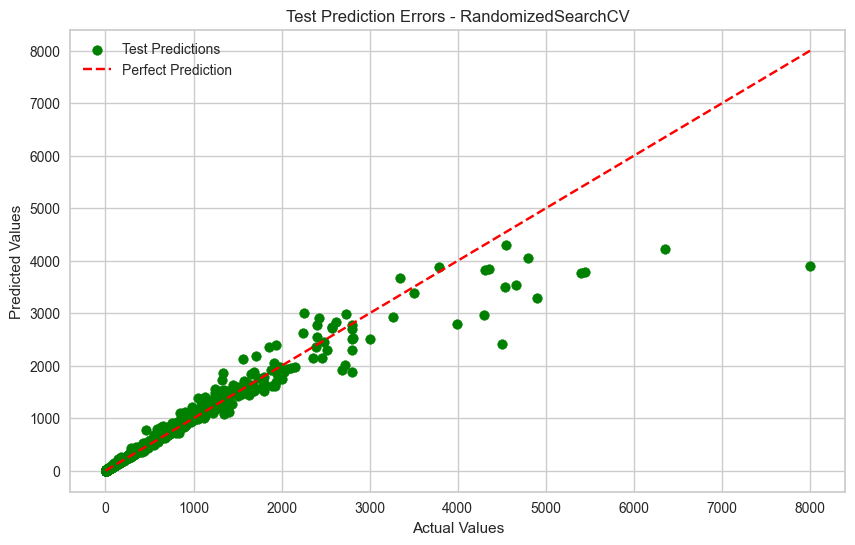

In [168]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'warm_start': [True,False],
    'max_samples': [0.25,0.5,0.75,1.0]
}

grid_rf = RandomizedSearchCV(estimator=RandomForestRegressor(),param_distributions=param_grid,verbose=2,return_train_score=True,scoring='r2')
train_and_evaluate_model(grid_rf)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=newton-cholesky, 

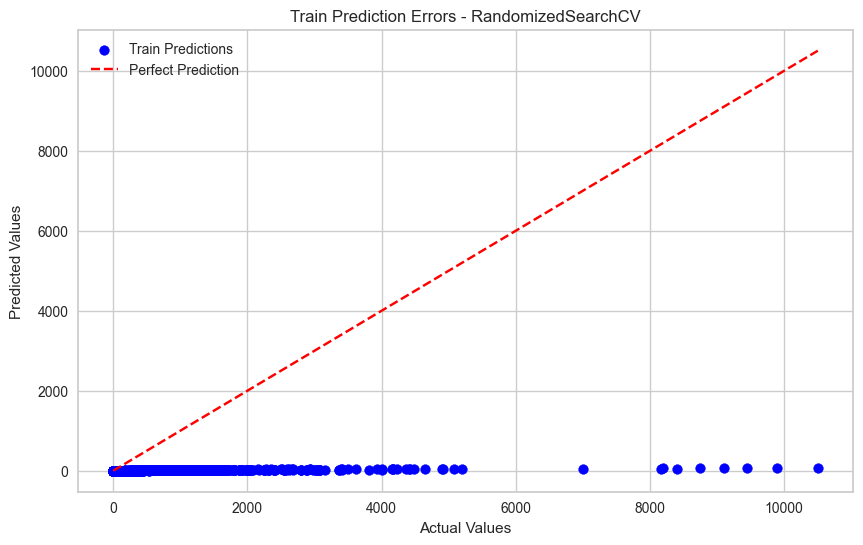

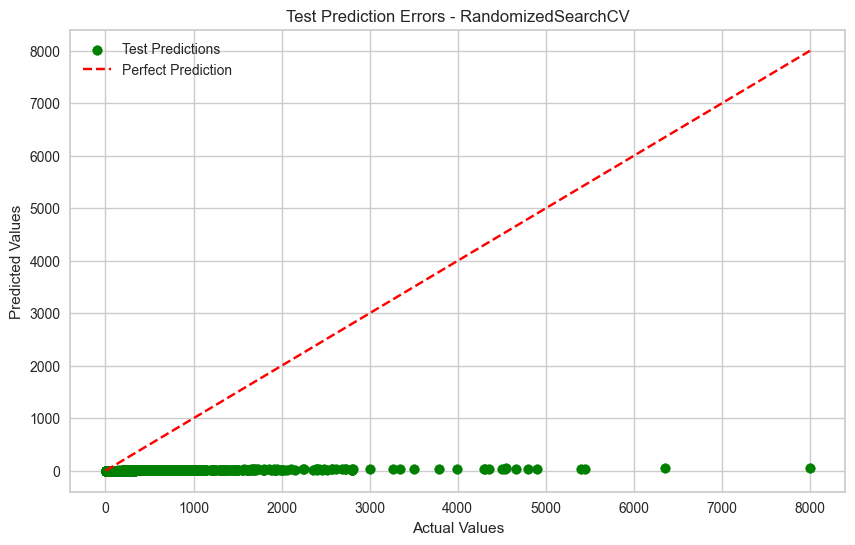

In [169]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_gamma = RandomizedSearchCV(estimator=GammaRegressor(),param_distributions=param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_gamma)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=1, degree=2, epsilon=0.001, gamma=auto, kernel=rbf, shrinking=False; total time=   2.7s
[CV] END C=1, degree=2, epsilon=0.001, gamma=auto, kernel=rbf, shrinking=False; total time=   3.3s
[CV] END C=1, degree=2, epsilon=0.001, gamma=auto, kernel=rbf, shrinking=False; total time=   2.8s
[CV] END C=1, degree=2, epsilon=0.001, gamma=auto, kernel=rbf, shrinking=False; total time=   3.0s
[CV] END C=1, degree=2, epsilon=0.001, gamma=auto, kernel=rbf, shrinking=False; total time=   2.9s
[CV] END C=1, degree=4, epsilon=1, gamma=auto, kernel=linear, shrinking=False; total time=   1.4s
[CV] END C=1, degree=4, epsilon=1, gamma=auto, kernel=linear, shrinking=False; total time=   1.7s
[CV] END C=1, degree=4, epsilon=1, gamma=auto, kernel=linear, shrinking=False; total time=   1.5s
[CV] END C=1, degree=4, epsilon=1, gamma=auto, kernel=linear, shrinking=False; total time=   1.4s
[CV] END C=1, degree=4, epsilon=1, gamma=auto, kerne

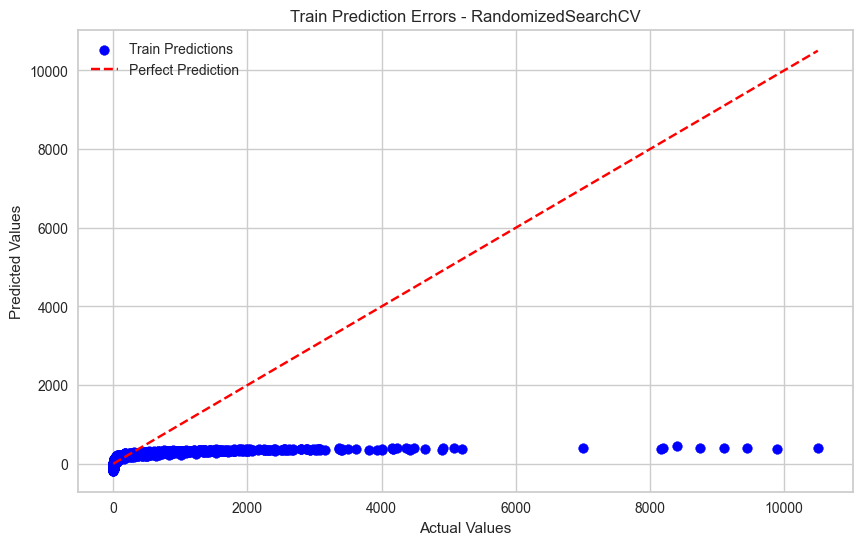

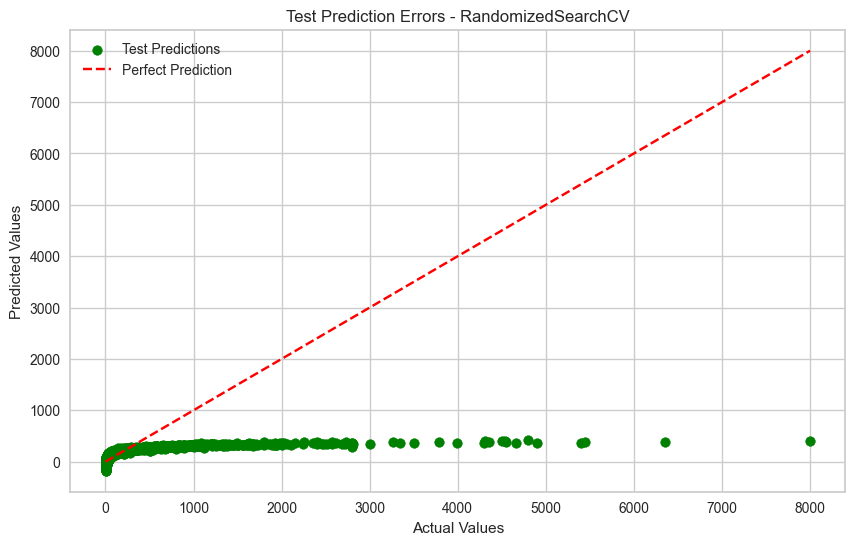

In [170]:
param_grid = {
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'C': [0.01,0.1,1,10],
    'gamma': ['scale','auto'],
    'shrinking': [True,False],
    'epsilon': [0.001,0.01,0.1,1]
}

grid_svr = RandomizedSearchCV(estimator=SVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_svr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=10, degree=2, kernel=rbf, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=10, degree=2, kernel=rbf, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=10, degree=2, kernel=rbf, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=10, degree=2, kernel=rbf, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=10, degree=2, kernel=rbf, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=1, degree=3, kernel=linear, nu=0.01, shrinking=False; total time=   0.0s
[CV] END C=1, degree=3, kernel=linear, nu=0.01, shrinking=False; total time=   0.0s
[CV] END C=1, degree=3, kernel=linear, nu=0.01, shrinking=False; total time=   0.0s
[CV] END C=1, degree=3, kernel=linear, nu=0.01, shrinking=False; total time=   0.0s
[CV] END C=1, degree=3, kernel=linear, nu=0.01, shrinking=False; total time=   0.0s
[CV] END C=0.1, degree=4, kernel=linear, nu=0.01, shrinking=False; total time=   0.0s
[CV] END C=0.1, degree=

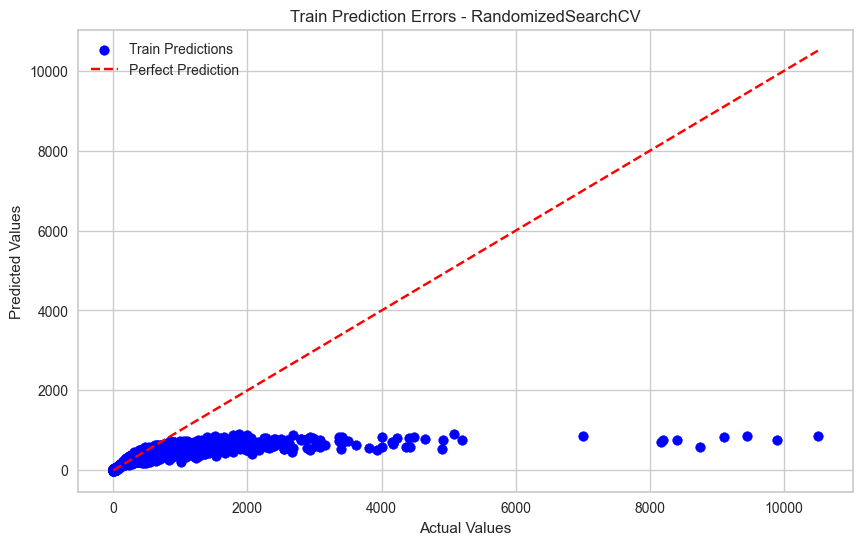

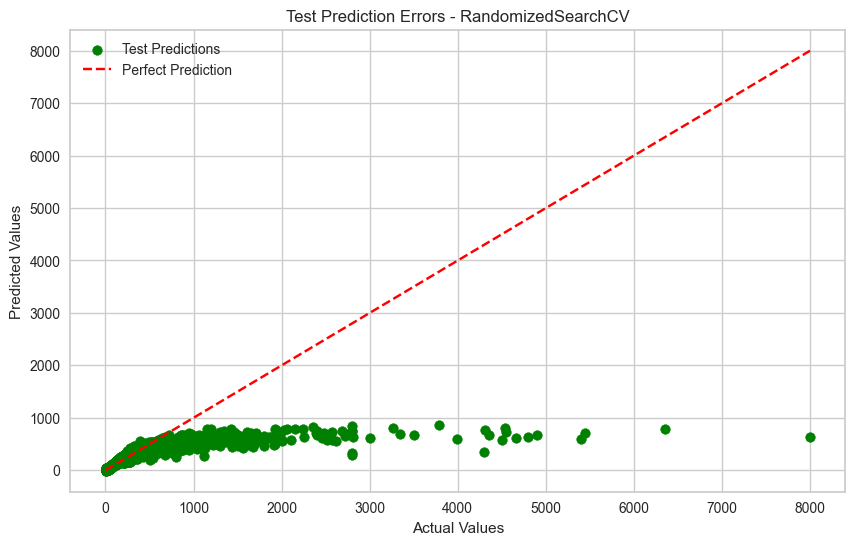

In [171]:
param_grid = {
    'nu': [0.001,0.01,0.1,0.5,1],
    'C': [0.1,1,10],
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'shrinking': [True,False]
}

grid_nusvr = RandomizedSearchCV(estimator=NuSVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_nusvr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END copy_X=True, fit_intercept=True, max_subpopulation=100, n_subsamples=500; total time=   0.0s
[CV] END copy_X=True, fit_intercept=True, max_subpopulation=100, n_subsamples=500; total time=   0.0s
[CV] END copy_X=True, fit_intercept=True, max_subpopulation=100, n_subsamples=500; total time=   0.0s
[CV] END copy_X=True, fit_intercept=True, max_subpopulation=100, n_subsamples=500; total time=   0.0s
[CV] END copy_X=True, fit_intercept=True, max_subpopulation=100, n_subsamples=500; total time=   0.0s
[CV] END copy_X=True, fit_intercept=True, max_subpopulation=100, n_subsamples=753; total time=   0.0s
[CV] END copy_X=True, fit_intercept=True, max_subpopulation=100, n_subsamples=753; total time=   0.0s
[CV] END copy_X=True, fit_intercept=True, max_subpopulation=100, n_subsamples=753; total time=   0.0s
[CV] END copy_X=True, fit_intercept=True, max_subpopulation=100, n_subsamples=753; total time=   0.0s
[CV] END copy_X=True,

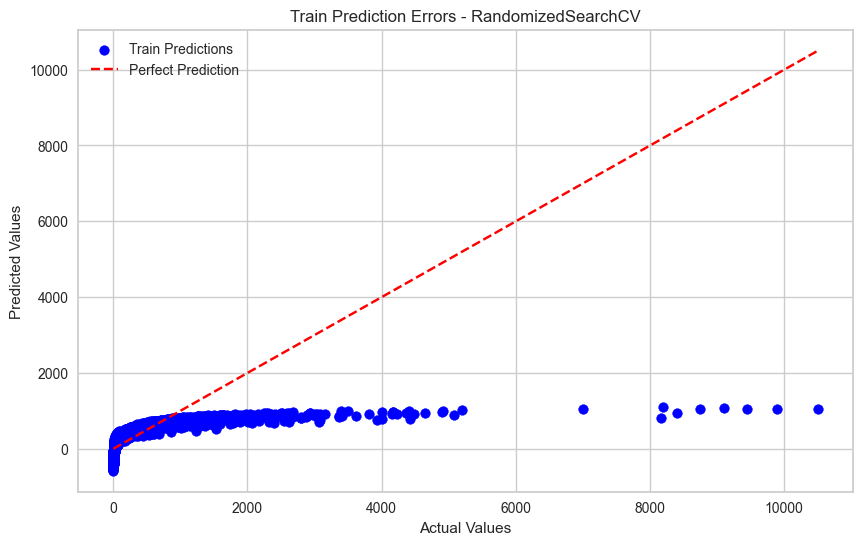

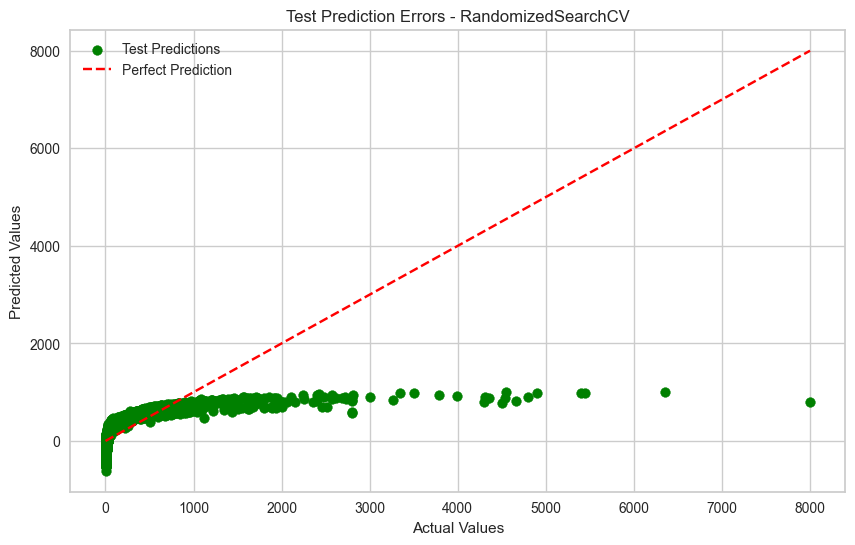

In [172]:
param_grid = {
    'fit_intercept': [True,False],
    'copy_X': [True,False],
    'max_subpopulation': [1,10,100,1000,10000,100000],
    'n_subsamples': [300,500,753,None]
}

grid_tsr = RandomizedSearchCV(estimator=TheilSenRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_tsr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-06, alpha_2=1e-05, compute_score=False, fit_intercept=True, lambda_1=1e-07, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-05, compute_score=False, fit_intercept=True, lambda_1=1e-07, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-05, compute_score=False, fit_intercept=True, lambda_1=1e-07, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-05, compute_score=False, fit_intercept=True, lambda_1=1e-07, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-05, compute_score=False, fit_intercept=True, lambda_1=1e-07, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-07, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-07, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-

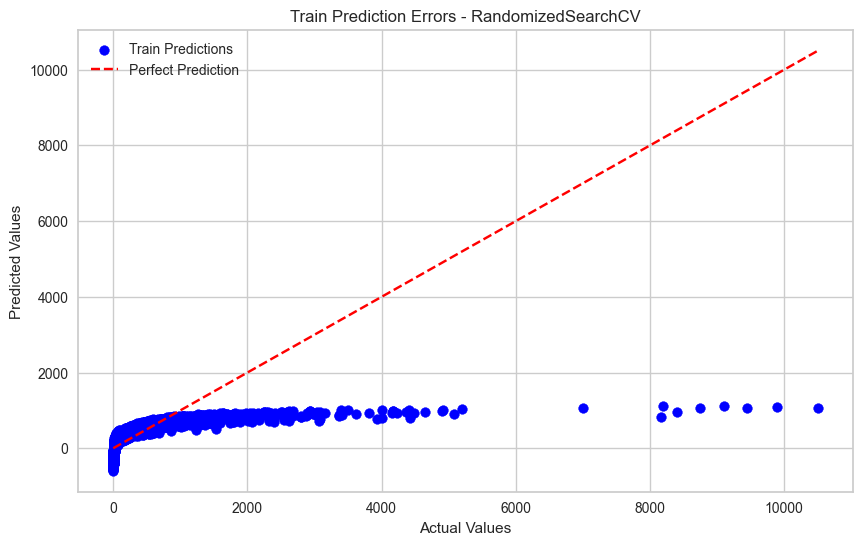

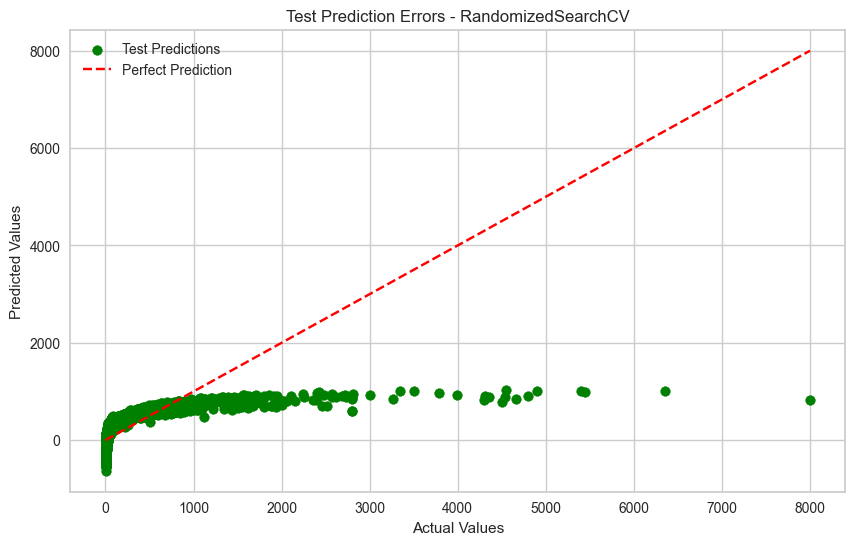

In [173]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]
             }

grid_bayesian_ridge = RandomizedSearchCV(BayesianRidge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_bayesian_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=   5.6s
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=   5.4s
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=   6.1s
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=   5.4s
[CV] END ....learning_rate=1, loss=square, n_estimators=1000; total time=   5.4s
[CV] END .....learning_rate=1, loss=linear, n_estimators=200; total time=   1.2s
[CV] END .....learning_rate=1, loss=linear, n_estimators=200; total time=   1.1s
[CV] END .....learning_rate=1, loss=linear, n_estimators=200; total time=   1.1s
[CV] END .....learning_rate=1, loss=linear, n_estimators=200; total time=   0.2s
[CV] END .....learning_rate=1, loss=linear, n_estimators=200; total time=   0.5s
[CV] END learning_rate=0.01, loss=exponential, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.01, loss=exponential

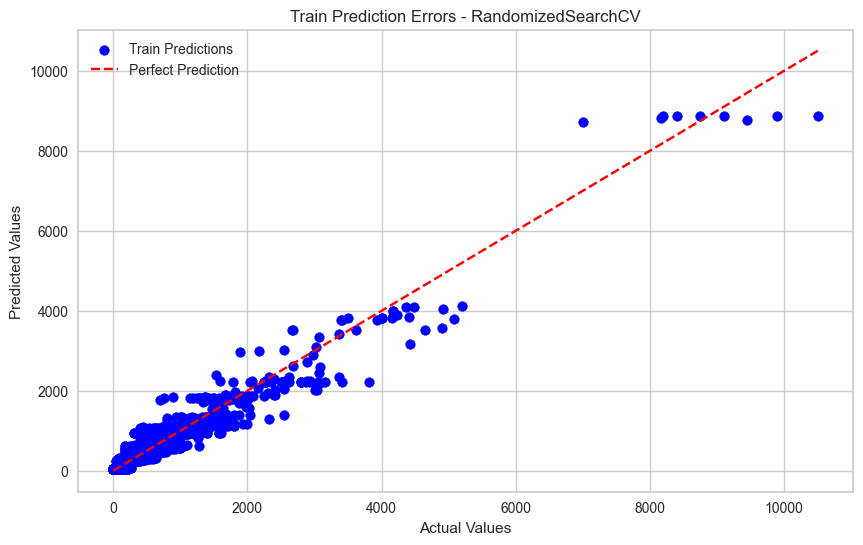

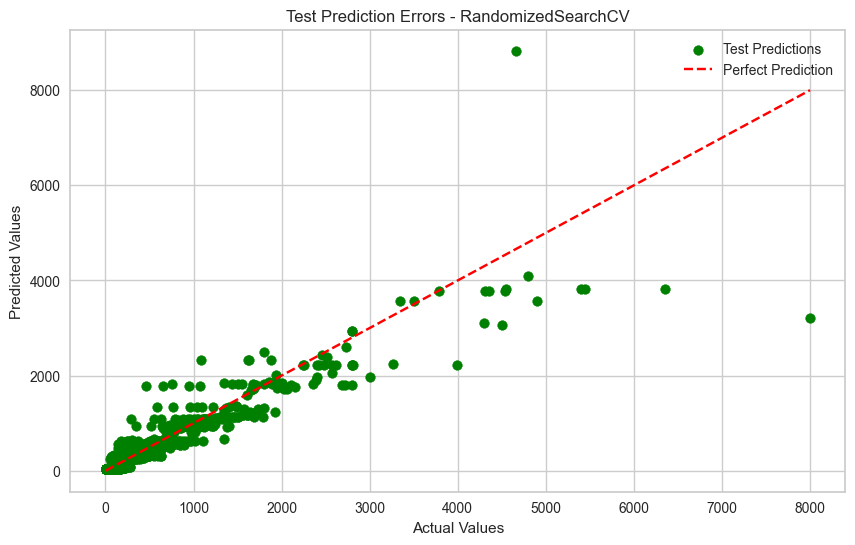

In [174]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'loss': ['linear','square','exponential']
}

grid_ab = RandomizedSearchCV(estimator=AdaBoostRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ab)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.9s
[CV] END bootstrap=True, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.7s
[CV] END bootstrap=True, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.7s
[CV] END bootstrap=True, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.6s
[CV] END bootstrap=True, criterion=poisson, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.8s
[CV] END bootstrap=False, criterion=poisson, max_features=sqrt, max_samples=0.5, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=sqrt, max_samples=0.5, n_estimators=1000, oob_score=True; total time=  

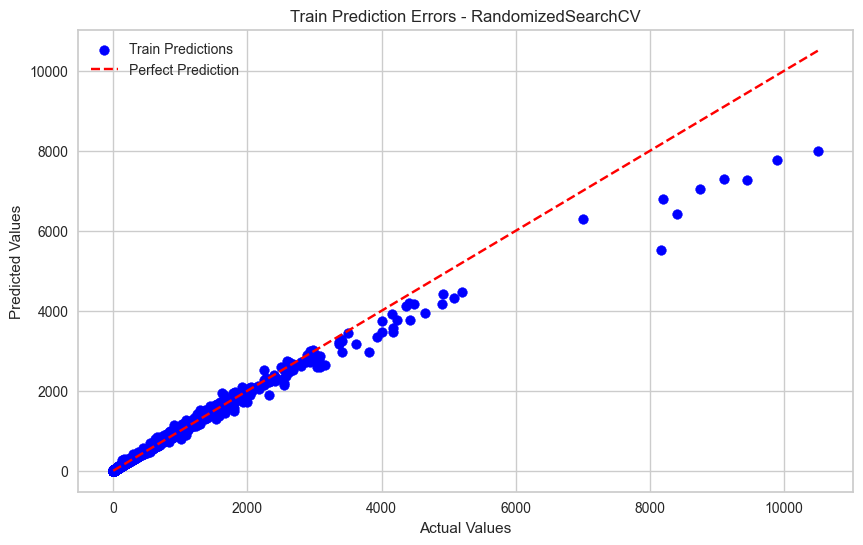

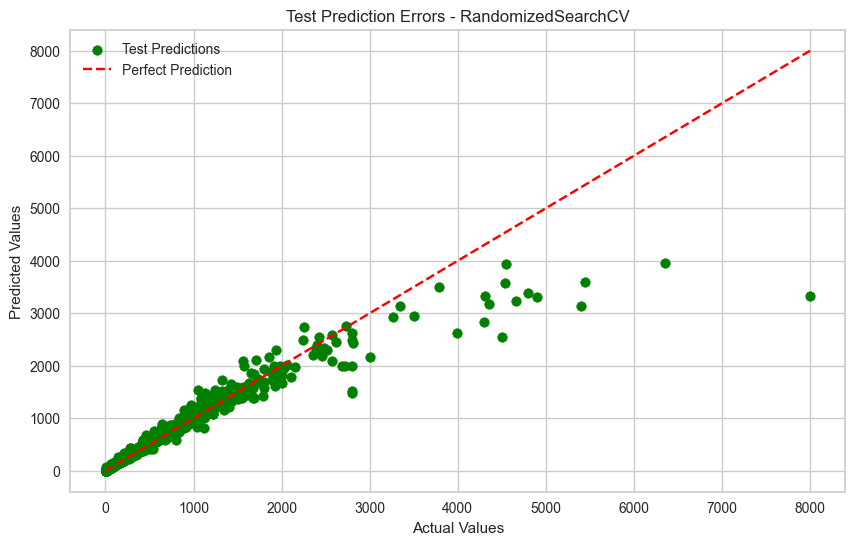

In [175]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'max_samples': [0.5,0.75,0.9,1]
}

grid_et = RandomizedSearchCV(estimator=ExtraTreesRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_et)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END booster=dart, importance_type=total_gain, learning_rate=1, n_estimators=200; total time=   0.4s
[CV] END booster=dart, importance_type=total_gain, learning_rate=1, n_estimators=200; total time=   0.4s
[CV] END booster=dart, importance_type=total_gain, learning_rate=1, n_estimators=200; total time=   0.3s
[CV] END booster=dart, importance_type=total_gain, learning_rate=1, n_estimators=200; total time=   0.4s
[CV] END booster=dart, importance_type=total_gain, learning_rate=1, n_estimators=200; total time=   0.4s
[CV] END booster=gbtree, importance_type=total_gain, learning_rate=0.01, n_estimators=200; total time=   0.4s
[CV] END booster=gbtree, importance_type=total_gain, learning_rate=0.01, n_estimators=200; total time=   1.0s
[CV] END booster=gbtree, importance_type=total_gain, learning_rate=0.01, n_estimators=200; total time=   0.6s
[CV] END booster=gbtree, importance_type=total_gain, learning_rate=0.01, n_estimator

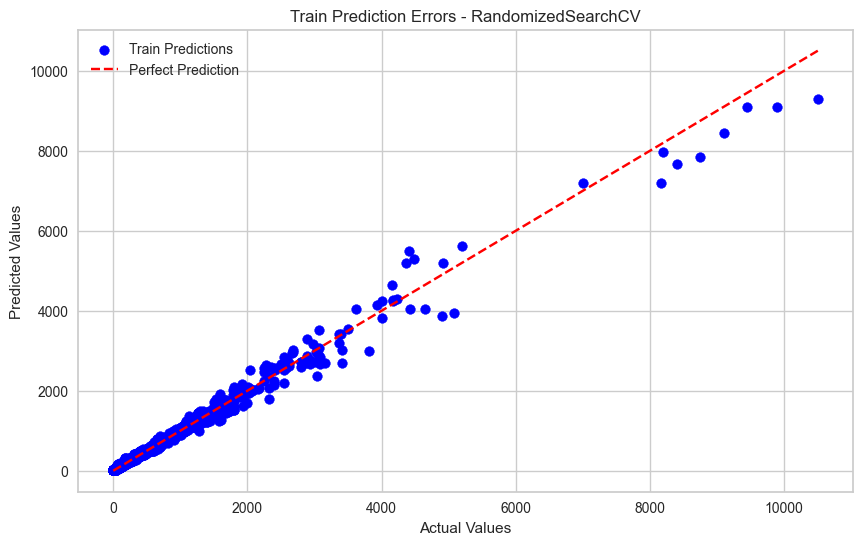

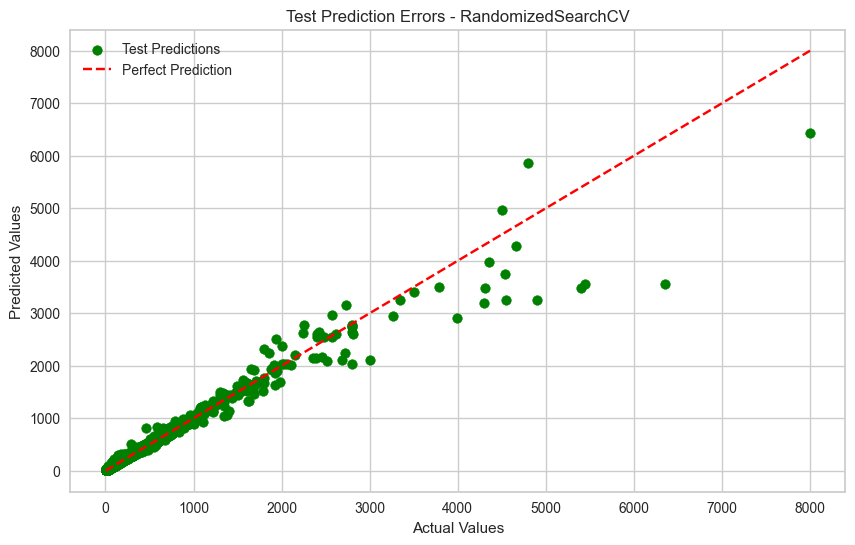

In [176]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'booster': ['gbtree','dart','gblinear'],
    'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgbrf = RandomizedSearchCV(estimator=XGBRFRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_xgbrf)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.65, max_samples=0.75, n_estimators=800, oob_score=True, warm_start=False; total time=  18.4s
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.65, max_samples=0.75, n_estimators=800, oob_score=True, warm_start=False; total time=  17.9s
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.65, max_samples=0.75, n_estimators=800, oob_score=True, warm_start=False; total time=  18.3s
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.65, max_samples=0.75, n_estimators=800, oob_score=True, warm_start=False; total time=  18.8s
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.65, max_samples=0.75, n_estimators=800, oob_score=True, warm_start=False; total time=  17.5s
[CV] END bootstrap=False, bootstrap_features=True, max_features=0.85, max_samples=0.5, n_estimators=800, oob_score=True, warm_start=True; total time=

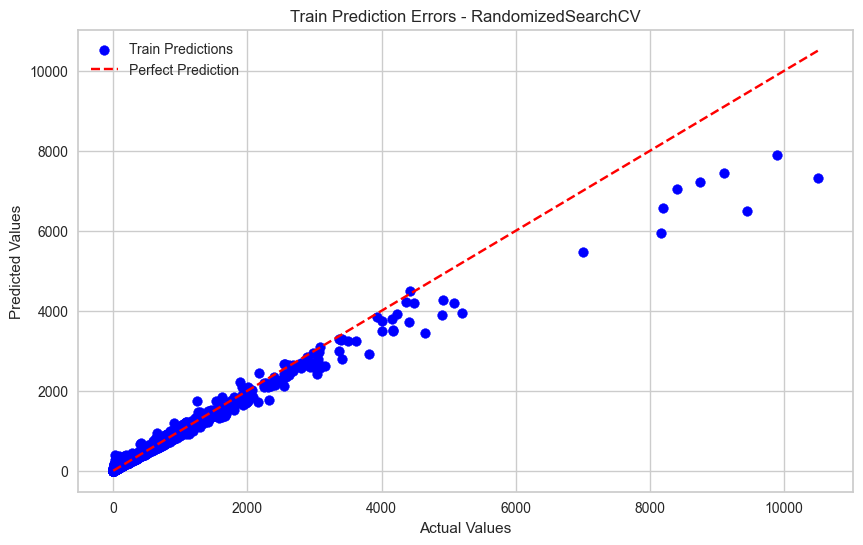

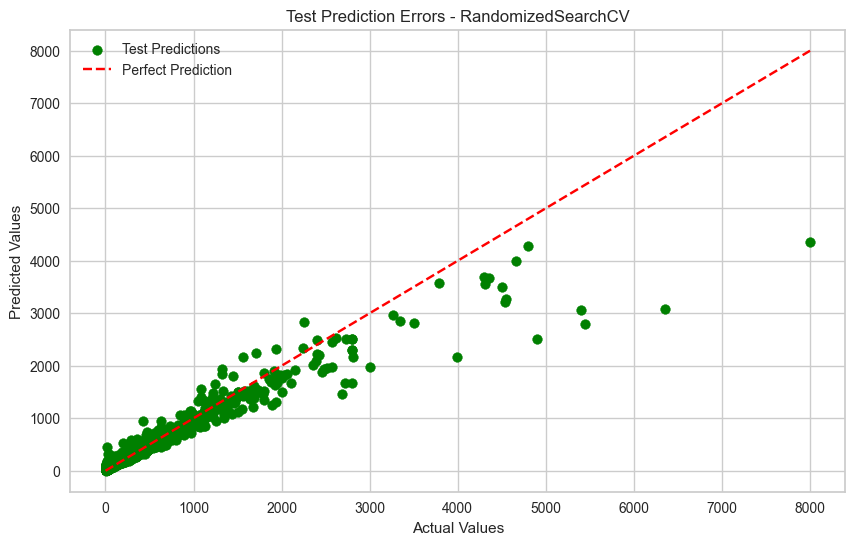

In [177]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'max_samples': [0.25,0.5,0.75,1],
    'max_features': [0.5,0.65,0.85,1],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'bootstrap_features': [True,False],
    'warm_start': [True,False]
}

grid_bag = RandomizedSearchCV(estimator=BaggingRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_bag)

## Optimized Models Performance Comparison

In [178]:
model_perfs = pd.DataFrame({
    'Model': [model.__class__.__name__ for model in models],  # Use model class names for readability
    'Test R2': test_r2_scores,
    'Test RMSE': test_rmse_scores,
    'Test MAE': test_mae_scores,
    'Test MSE': test_mse_scores,
    'Training Time': training_times
}).sort_values('Test R2', ascending=False).reset_index(drop=True)

print(model_perfs.head(20))


                            Model   Test R2   Test RMSE   Test MAE  \
0             ExtraTreesRegressor  0.974789   82.314801  12.012504   
1                    XGBRegressor  0.964563   97.590917  17.091720   
2           RandomForestRegressor  0.961377  101.883489  14.263193   
3               CatBoostRegressor  0.960660  102.824565  17.901773   
4              RandomizedSearchCV  0.959803  103.939362  18.351066   
5                   LGBMRegressor  0.959196  104.720411  18.645762   
6                BaggingRegressor  0.958994  104.980137  15.596935   
7              RandomizedSearchCV  0.957607  106.740792  21.277430   
8              RandomizedSearchCV  0.957083  107.398550  48.764247   
9                  XGBRFRegressor  0.956297  108.377236  21.353970   
10          DecisionTreeRegressor  0.952145  113.408094  16.188377   
11  HistGradientBoostingRegressor  0.950026  115.892593  20.295129   
12                   NGBRegressor  0.949756  116.204847  19.877388   
13      GradientBoos

Even after tuning the hyperparameters of all the models, the Extra Trees Regressor model stays intact as the best performing model with an outstanding R2 score of more than 97.6%.